## Import packages

In [14]:
from __future__ import (absolute_import, division, print_function,
                        unicode_literals)

import argparse
import datetime
import math

import pandas as pd
import numpy as np

from matplotlib import pyplot as plt

# The above could be sent to an independent module
import backtrader as bt
import backtrader.feeds as btfeeds
import backtrader.indicators as btind

import statsmodels.tsa.stattools as smts
import statsmodels.api as sm

import datetime as dt

## Additional derived class to support Log price calculation

In [15]:
class Log(bt.MultiLogic):
    flogic = np.log

## Single Pair Strategy

In [26]:
class SinglePair(bt.Strategy):
    params = dict (
        period=84,
    )

    def log(self, txt, dt=None):        
        dt = dt or self.data.datetime[0]
        dt = bt.num2date(dt)
        print('%s, %s' % (dt.isoformat(), txt))

    def notify_order(self, order):
        if order.status in [bt.Order.Submitted, bt.Order.Accepted]:
            return  # Await further notifications

        if order.status == order.Completed:
            if order.isbuy():
                buytxt = 'BUY COMPLETE, %.2f' % order.executed.price
                self.log(buytxt, order.executed.dt)
                self.incur_commission(order.executed.price, order.executed.size)
            else:
                selltxt = 'SELL COMPLETE, %.2f' % order.executed.price
                self.log(selltxt, order.executed.dt)
                self.incur_commission(order.executed.price, order.executed.size)

        elif order.status in [order.Expired, order.Canceled, order.Margin]:
            self.log('%s ,' % order.Status[order.status])
            pass  # Simply log

        # Allow new orders
        self.orderid = None

    def __init__(self):
        # To control operation entries
        self.orderid = None
        self.qty1 = 0
        self.qty2 = 0
        self.period = self.p.period
        self.upper_limit = 2.0
        self.lower_limit = -2.0
        self.up_medium = 0.5
        self.low_medium = -0.5
        self.status = 0
        self.exposure = 200000
        
        self.data0_log = Log(self.data0.close)
        self.data1_log = Log(self.data1.close)
        
        self.zscore = None
        self.adf_pvalue = None
        self.intercept = None
        self.slope = None
        self.resid_mean = None
        self.resid_std = None
        self.spread = None
        self.zscore = None
        
        self.open_pos_duration = 0
        self.n_timeouts = 0

    def next(self):
        print("--------------------------------------------------------------------")
        print("Current cash: %.2f" % self.broker.get_cash())
        print("Portfolio value: %.2f" % self.broker.getvalue())
        
        if min(len(self.data0_log), len(self.data1_log)) < self.period:
            return
        
        if self.orderid:
            return  # if an order is active, no new orders are allowed
        
        ##################################################################################################
        # COMPUTE ZCORE                                                                                  #
        ##################################################################################################
        if self.status == 0:
            Y = pd.Series(self.data0_log.get(size=self.period)[0:-1])
            X = pd.Series(self.data1_log.get(size=self.period)[0:-1])
            X = sm.add_constant(X)

            model = sm.OLS(Y, X)
            results = model.fit()
            self.intercept, self.slope = results.params 

            self.adf_pvalue = smts.adfuller(results.resid)[1]
            self.resid_mean = results.resid.mean()
            self.resid_std = results.resid.std()
            
        self.spread = self.data0_log[0] - (self.slope * self.data1_log[0] + self.intercept)
        self.zscore = (self.spread - self.resid_mean) / self.resid_std
        
        if self.slope < 0:
            print('Slope is negative!')
            return
        
        ##################################################################################################
        # LOGGING                                                                                        #
        ##################################################################################################
        print('Strategy  length:', len(self))
        print('Data0 length:', len(self.data0))
        print('Data1 length:', len(self.data1))

        print('Data0 datetime:', dt.datetime.strftime(data0.datetime.datetime(),'%Y-%m-%d %H:%M:%S'))
        print('Data1 datetime:', dt.datetime.strftime(data1.datetime.datetime(),'%Y-%m-%d %H:%M:%S'))
        print('Qty of stock1:', self.qty1)
        print('Qty of stock2:', self.qty2)
        
        print('status is', self.status)
        print('z-score is', self.zscore)
        print('adf_pvalue is', self.adf_pvalue)
    
        ##################################################################################################
        # STRATEGY LOGIC                                                                                 #
        ##################################################################################################
        if self.status == 0:
            # "NO position" status
            self.open_pos_duration = 0
            
            if self.zscore > self.upper_limit:
                self.short_spread()
            elif self.zscore < self.lower_limit:
                self.long_spread()
     
        elif self.status == 1:
            # "SHORT the spread" status
            self.open_pos_duration += 1
            
            if self.zscore < self.lower_limit:
                self.long_spread()
            elif self.zscore < self.up_medium:
                self.exit_spread()
                self.status = 0
        
        elif self.status == 2:
            # "LONG the spread" status
            self.open_pos_duration += 1
            
            if self.zscore > self.upper_limit:
                self.short_spread()
            elif self.zscore > self.low_medium:
                self.exit_spread()
                self.status = 0
                
        # TIMEOUT condition
        if self.open_pos_duration > 84:
            self.exit_spread()
            self.n_timeouts += 1
            self.status = 0
    
    def short_spread(self):
        value = 0.5 * self.exposure  
        x = int(value / (self.data0.close))  
        y = int(value / (self.data1.close))  
        
        print('x + self.qty1 is', x + self.qty1)
        print('y + self.qty2 is', y + self.qty2)

        # Placing the order
        self.log('SELL CREATE %s, price = %.2f, qty = %d' % ("STOCK 1", self.data0.close[0], x + self.qty1))
        self.sell(data=self.data0, size=(x + self.qty1))  # Place an order for buying y + qty2 shares
        self.log('BUY CREATE %s, price = %.2f, qty = %d' % ("STOCK 2", self.data1.close[0], y + self.qty2))
        self.buy(data=self.data1, size=(y + self.qty2))  # Place an order for selling x + qty1 shares

        # Updating the counters with new value
        self.qty1 = x  
        self.qty2 = y  
        
        # update flags
        self.status = 1
        self.open_pos_duration = 0
    
    def long_spread(self):
        # Calculating the number of shares for each stock
        value = 0.5 * self.exposure 
        x = int(value / (self.data0.close)) 
        y = int(value / (self.data1.close)) 
        
        print('x + self.qty1 is', x + self.qty1)
        print('y + self.qty2 is', y + self.qty2)

        # Place the order
        self.log('BUY CREATE %s, price = %.2f, qty = %d' % ("STOCK 1", self.data0.close[0], x + self.qty1))
        self.buy(data=self.data0, size=(x + self.qty1))  # Place an order for buying x + qty1 shares
        self.log('SELL CREATE %s, price = %.2f, qty = %d' % ("STOCK 2", self.data1.close[0], y + self.qty2))
        self.sell(data=self.data1, size=(y + self.qty2))  # Place an order for selling y + qty2 shares

        # Updating the counters with new value
        self.qty1 = x 
        self.qty2 = y 
        
        # update flags
        self.status = 2  
        self.open_pos_duration = 0
    
    def exit_spread(self):
        # Exit position
        self.log('CLOSE position %s, price = %.2f' % ("STOCK 1", self.data0.close[0]))
        self.close(self.data0)
        self.log('CLOSE position %s, price = %.2f' % ("STOCK 2", self.data1.close[0]))
        self.close(self.data1)
        
        # update counters
        self.qty1 = 0
        self.qty2 = 0
        
        # update flags
        self.status = 0
        self.open_pos_duration = 0
        
    def incur_commission(self, price, qty):
        qty = abs(qty)
        commission = min(max(1, 0.005*qty), 0.01*price*qty)
        print('Commission of ' + str(commission) + 'USD incurred.')
        self.broker.add_cash(-1*commission)
    
    def stop(self):
        print('==================================================')
        print('Starting Value: %.2f' % self.broker.startingcash)
        print('Ending   Value: %.2f' % self.broker.getvalue())
        print('Number of timeouts: %.2f' % self.n_timeouts)
        print('==================================================')

In [27]:
# Create a cerebro
cerebro = bt.Cerebro()

# Create data feed
data0 = bt.feeds.GenericCSVData(
    dataname="..//ib-data//iex//GOOGL.csv",
    # Do not pass values before this date
    fromdate=datetime.datetime.strptime('2017-01-06 04:55:00', '%Y-%m-%d %H:%M:%S'),
    # Do not pass values before this date
    todate=datetime.datetime.strptime('2018-01-06 04:55:00', '%Y-%m-%d %H:%M:%S'),
    # Do not pass values after this date
    timeframe=(bt.TimeFrame.Minutes),
    dtformat=('%Y-%m-%d %H:%M:%S'),
    tmformat=('%H:%M:%S'),
    datetime = 0,
    open=1,
    high=2,
    low=3,
    close=4,
    volume=-1,
    openinterest=-1,
    reverse=False)

data1 = bt.feeds.GenericCSVData(
    dataname="..//ib-data//iex//GOOG.csv",
    # Do not pass values before this date
    fromdate=datetime.datetime.strptime('2017-01-06 04:55:00', '%Y-%m-%d %H:%M:%S'),
    # Do not pass values before this date
    todate=datetime.datetime.strptime('2018-01-06 04:55:00', '%Y-%m-%d %H:%M:%S'),
    # Do not pass values after this date
    timeframe=(bt.TimeFrame.Minutes),
    dtformat=('%Y-%m-%d %H:%M:%S'),
    tmformat=('%H:%M:%S'),
    datetime = 0,
    open=1,
    high=2,
    low=3,
    close=4,
    volume=-1,
    openinterest=-1,
    reverse=False)

cerebro.adddata(data0)

data1.plotinfo.plotmaster = data0
data1.plotinfo.sameaxis = True

# Add the 2nd data to cerebro
cerebro.adddata(data1)

# Add the strategy
cerebro.addstrategy(SinglePair)

# Add Sharpe Ratio
cerebro.addanalyzer(bt.analyzers.SharpeRatio, _name='mysharpe')

# Add the commission - only stocks like a for each operation
cerebro.broker.setcash(1000000)

# Add the commission - only stocks like a for each operation
cerebro.broker.setcommission(commission=0.0000)

# And run it
strat = cerebro.run(period=70)

--------------------------------------------------------------------
Current cash: 1000000.00
Portfolio value: 1000000.00
--------------------------------------------------------------------
Current cash: 1000000.00
Portfolio value: 1000000.00
--------------------------------------------------------------------
Current cash: 1000000.00
Portfolio value: 1000000.00
--------------------------------------------------------------------
Current cash: 1000000.00
Portfolio value: 1000000.00
--------------------------------------------------------------------
Current cash: 1000000.00
Portfolio value: 1000000.00
--------------------------------------------------------------------
Current cash: 1000000.00
Portfolio value: 1000000.00
--------------------------------------------------------------------
Current cash: 1000000.00
Portfolio value: 1000000.00
--------------------------------------------------------------------
Current cash: 1000000.00
Portfolio value: 1000000.00
------------------------

--------------------------------------------------------------------
Current cash: 1000126.00
Portfolio value: 1000109.34
Strategy  length: 106
Data0 length: 106
Data1 length: 106
Data0 datetime: 2017-01-10 00:40:00
Data1 datetime: 2017-01-10 00:40:00
Qty of stock1: 121
Qty of stock2: 124
status is 2
z-score is -1.13628349423
adf_pvalue is 0.141100440777
--------------------------------------------------------------------
Current cash: 1000126.00
Portfolio value: 1000098.98
Strategy  length: 107
Data0 length: 107
Data1 length: 107
Data0 datetime: 2017-01-10 00:45:00
Data1 datetime: 2017-01-10 00:45:00
Qty of stock1: 121
Qty of stock2: 124
status is 2
z-score is -1.38889912459
adf_pvalue is 0.141100440777
--------------------------------------------------------------------
Current cash: 1000126.00
Portfolio value: 1000101.52
Strategy  length: 108
Data0 length: 108
Data1 length: 108
Data0 datetime: 2017-01-10 00:50:00
Data1 datetime: 2017-01-10 00:50:00
Qty of stock1: 121
Qty of stock2: 

Current cash: 1000149.78
Portfolio value: 1000149.78
Strategy  length: 143
Data0 length: 143
Data1 length: 143
Data0 datetime: 2017-01-10 03:45:00
Data1 datetime: 2017-01-10 03:45:00
Qty of stock1: 0
Qty of stock2: 0
status is 0
z-score is 0.625253650845
adf_pvalue is 0.162663898067
--------------------------------------------------------------------
Current cash: 1000149.78
Portfolio value: 1000149.78
Strategy  length: 144
Data0 length: 144
Data1 length: 144
Data0 datetime: 2017-01-10 03:50:00
Data1 datetime: 2017-01-10 03:50:00
Qty of stock1: 0
Qty of stock2: 0
status is 0
z-score is 0.767541370688
adf_pvalue is 0.182950756377
--------------------------------------------------------------------
Current cash: 1000149.78
Portfolio value: 1000149.78
Strategy  length: 145
Data0 length: 145
Data1 length: 145
Data0 datetime: 2017-01-10 03:55:00
Data1 datetime: 2017-01-10 03:55:00
Qty of stock1: 0
Qty of stock2: 0
status is 0
z-score is 1.14274975582
adf_pvalue is 0.18401344431
------------

Qty of stock1: 121
Qty of stock2: 124
status is 1
z-score is 2.00983257573
adf_pvalue is 0.609019459533
--------------------------------------------------------------------
Current cash: 1000422.05
Portfolio value: 1000298.42
Strategy  length: 205
Data0 length: 205
Data1 length: 205
Data0 datetime: 2017-01-11 02:25:00
Data1 datetime: 2017-01-11 02:25:00
Qty of stock1: 121
Qty of stock2: 124
status is 1
z-score is 2.65259016206
adf_pvalue is 0.609019459533
--------------------------------------------------------------------
Current cash: 1000422.05
Portfolio value: 1000309.36
Strategy  length: 206
Data0 length: 206
Data1 length: 206
Data0 datetime: 2017-01-11 02:30:00
Data1 datetime: 2017-01-11 02:30:00
Qty of stock1: 121
Qty of stock2: 124
status is 1
z-score is 2.28585589
adf_pvalue is 0.609019459533
--------------------------------------------------------------------
Current cash: 1000422.05
Portfolio value: 1000311.08
Strategy  length: 207
Data0 length: 207
Data1 length: 207
Data0 d

Qty of stock1: 121
Qty of stock2: 124
status is 1
z-score is 3.52867748928
adf_pvalue is 0.0339138055652
--------------------------------------------------------------------
Current cash: 1000422.29
Portfolio value: 1000190.51
Strategy  length: 308
Data0 length: 308
Data1 length: 308
Data0 datetime: 2017-01-12 04:30:00
Data1 datetime: 2017-01-12 04:30:00
Qty of stock1: 121
Qty of stock2: 124
status is 1
z-score is 3.60533320865
adf_pvalue is 0.0339138055652
--------------------------------------------------------------------
Current cash: 1000422.29
Portfolio value: 1000196.81
Strategy  length: 309
Data0 length: 309
Data1 length: 309
Data0 datetime: 2017-01-12 04:35:00
Data1 datetime: 2017-01-12 04:35:00
Qty of stock1: 121
Qty of stock2: 124
status is 1
z-score is 3.47903046678
adf_pvalue is 0.0339138055652
--------------------------------------------------------------------
Current cash: 1000422.29
Portfolio value: 1000209.94
Strategy  length: 310
Data0 length: 310
Data1 length: 310
D

Strategy  length: 409
Data0 length: 409
Data1 length: 409
Data0 datetime: 2017-01-13 23:55:00
Data1 datetime: 2017-01-13 23:55:00
Qty of stock1: 120
Qty of stock2: 124
status is 1
z-score is 3.53563159329
adf_pvalue is 0.792477679266
--------------------------------------------------------------------
Current cash: 999634.75
Portfolio value: 1000055.25
Strategy  length: 410
Data0 length: 410
Data1 length: 410
Data0 datetime: 2017-01-14 00:00:00
Data1 datetime: 2017-01-14 00:00:00
Qty of stock1: 120
Qty of stock2: 124
status is 1
z-score is 3.50683655896
adf_pvalue is 0.792477679266
--------------------------------------------------------------------
Current cash: 999634.75
Portfolio value: 1000070.11
Strategy  length: 411
Data0 length: 411
Data1 length: 411
Data0 datetime: 2017-01-14 00:05:00
Data1 datetime: 2017-01-14 00:05:00
Qty of stock1: 120
Qty of stock2: 124
status is 1
z-score is 3.14160864323
adf_pvalue is 0.792477679266
--------------------------------------------------------

Data0 length: 458
Data1 length: 458
Data0 datetime: 2017-01-14 04:00:00
Data1 datetime: 2017-01-14 04:00:00
Qty of stock1: 120
Qty of stock2: 124
status is 1
z-score is 3.12281713808
adf_pvalue is 0.792477679266
--------------------------------------------------------------------
Current cash: 999634.75
Portfolio value: 1000064.65
Strategy  length: 459
Data0 length: 459
Data1 length: 459
Data0 datetime: 2017-01-14 04:05:00
Data1 datetime: 2017-01-14 04:05:00
Qty of stock1: 120
Qty of stock2: 124
status is 1
z-score is 3.22812893979
adf_pvalue is 0.792477679266
2017-01-14T04:05:00, CLOSE position STOCK 1, price = 831.33
2017-01-14T04:05:00, CLOSE position STOCK 2, price = 807.98
2017-01-14T04:10:00, BUY COMPLETE, 831.33
Commission of 1USD incurred.
2017-01-14T04:10:00, SELL COMPLETE, 807.98
Commission of 1USD incurred.
--------------------------------------------------------------------
Current cash: 1000064.65
Portfolio value: 1000064.65
Strategy  length: 460
Data0 length: 460
Data1 le

Strategy  length: 512
Data0 length: 512
Data1 length: 512
Data0 datetime: 2017-01-18 02:00:00
Data1 datetime: 2017-01-18 02:00:00
Qty of stock1: 120
Qty of stock2: 124
status is 1
z-score is 2.20124119906
adf_pvalue is 0.327344896882
--------------------------------------------------------------------
Current cash: 999718.38
Portfolio value: 1000092.82
Strategy  length: 513
Data0 length: 513
Data1 length: 513
Data0 datetime: 2017-01-18 02:05:00
Data1 datetime: 2017-01-18 02:05:00
Qty of stock1: 120
Qty of stock2: 124
status is 1
z-score is 2.46237635733
adf_pvalue is 0.327344896882
--------------------------------------------------------------------
Current cash: 999718.38
Portfolio value: 1000095.60
Strategy  length: 514
Data0 length: 514
Data1 length: 514
Data0 datetime: 2017-01-18 02:10:00
Data1 datetime: 2017-01-18 02:10:00
Qty of stock1: 120
Qty of stock2: 124
status is 1
z-score is 2.38195300258
adf_pvalue is 0.327344896882
--------------------------------------------------------

Data0 length: 554
Data1 length: 554
Data0 datetime: 2017-01-18 23:00:00
Data1 datetime: 2017-01-18 23:00:00
Qty of stock1: 0
Qty of stock2: 0
status is 0
z-score is -0.116555084993
adf_pvalue is 0.421478857622
--------------------------------------------------------------------
Current cash: 1000162.08
Portfolio value: 1000162.08
Strategy  length: 555
Data0 length: 555
Data1 length: 555
Data0 datetime: 2017-01-18 23:05:00
Data1 datetime: 2017-01-18 23:05:00
Qty of stock1: 0
Qty of stock2: 0
status is 0
z-score is 0.410175431828
adf_pvalue is 0.356823543711
--------------------------------------------------------------------
Current cash: 1000162.08
Portfolio value: 1000162.08
Strategy  length: 556
Data0 length: 556
Data1 length: 556
Data0 datetime: 2017-01-18 23:10:00
Data1 datetime: 2017-01-18 23:10:00
Qty of stock1: 0
Qty of stock2: 0
status is 0
z-score is 0.765092792965
adf_pvalue is 0.344331615594
--------------------------------------------------------------------
Current cash: 1

status is 1
z-score is 2.29663427057
adf_pvalue is 0.328026582754
--------------------------------------------------------------------
Current cash: 999868.61
Portfolio value: 1000282.15
Strategy  length: 624
Data0 length: 624
Data1 length: 624
Data0 datetime: 2017-01-19 04:50:00
Data1 datetime: 2017-01-19 04:50:00
Qty of stock1: 120
Qty of stock2: 124
status is 1
z-score is 1.34114331124
adf_pvalue is 0.328026582754
--------------------------------------------------------------------
Current cash: 999868.61
Portfolio value: 1000316.27
Strategy  length: 625
Data0 length: 625
Data1 length: 625
Data0 datetime: 2017-01-19 04:55:00
Data1 datetime: 2017-01-19 04:55:00
Qty of stock1: 120
Qty of stock2: 124
status is 1
z-score is 1.0681433457
adf_pvalue is 0.328026582754
--------------------------------------------------------------------
Current cash: 999868.61
Portfolio value: 1000321.83
Strategy  length: 626
Data0 length: 626
Data1 length: 626
Data0 datetime: 2017-01-19 22:30:00
Data1 date

Data0 datetime: 2017-01-20 23:30:00
Data1 datetime: 2017-01-20 23:30:00
Qty of stock1: 120
Qty of stock2: 124
status is 1
z-score is 4.32251865249
adf_pvalue is 0.129329953664
--------------------------------------------------------------------
Current cash: 999984.87
Portfolio value: 1000387.39
Strategy  length: 717
Data0 length: 717
Data1 length: 717
Data0 datetime: 2017-01-20 23:35:00
Data1 datetime: 2017-01-20 23:35:00
Qty of stock1: 120
Qty of stock2: 124
status is 1
z-score is 5.07388435836
adf_pvalue is 0.129329953664
--------------------------------------------------------------------
Current cash: 999984.87
Portfolio value: 1000424.01
Strategy  length: 718
Data0 length: 718
Data1 length: 718
Data0 datetime: 2017-01-20 23:40:00
Data1 datetime: 2017-01-20 23:40:00
Qty of stock1: 120
Qty of stock2: 124
status is 1
z-score is 3.58080918005
adf_pvalue is 0.129329953664
--------------------------------------------------------------------
Current cash: 999984.87
Portfolio value: 1000

z-score is 2.27049309383
adf_pvalue is 0.0762644152219
--------------------------------------------------------------------
Current cash: 1000872.05
Portfolio value: 1000484.81
Strategy  length: 775
Data0 length: 775
Data1 length: 775
Data0 datetime: 2017-01-21 04:25:00
Data1 datetime: 2017-01-21 04:25:00
Qty of stock1: 121
Qty of stock2: 124
status is 1
z-score is 1.98500447372
adf_pvalue is 0.0762644152219
--------------------------------------------------------------------
Current cash: 1000872.05
Portfolio value: 1000462.85
Strategy  length: 776
Data0 length: 776
Data1 length: 776
Data0 datetime: 2017-01-21 04:30:00
Data1 datetime: 2017-01-21 04:30:00
Qty of stock1: 121
Qty of stock2: 124
status is 1
z-score is 2.50467716897
adf_pvalue is 0.0762644152219
--------------------------------------------------------------------
Current cash: 1000872.05
Portfolio value: 1000483.23
Strategy  length: 777
Data0 length: 777
Data1 length: 777
Data0 datetime: 2017-01-21 04:35:00
Data1 datetime:

Qty of stock1: 119
Qty of stock2: 123
status is 2
z-score is -4.40809492016
adf_pvalue is 0.0762644152219
--------------------------------------------------------------------
Current cash: 1000885.78
Portfolio value: 1000575.14
Strategy  length: 855
Data0 length: 855
Data1 length: 855
Data0 datetime: 2017-01-24 04:35:00
Data1 datetime: 2017-01-24 04:35:00
Qty of stock1: 119
Qty of stock2: 123
status is 2
z-score is -5.20937003653
adf_pvalue is 0.0762644152219
--------------------------------------------------------------------
Current cash: 1000885.78
Portfolio value: 1000559.80
Strategy  length: 856
Data0 length: 856
Data1 length: 856
Data0 datetime: 2017-01-24 04:40:00
Data1 datetime: 2017-01-24 04:40:00
Qty of stock1: 119
Qty of stock2: 123
status is 2
z-score is -5.92062734703
adf_pvalue is 0.0762644152219
--------------------------------------------------------------------
Current cash: 1000885.78
Portfolio value: 1000534.62
Strategy  length: 857
Data0 length: 857
Data1 length: 85

adf_pvalue is 0.198586807334
--------------------------------------------------------------------
Current cash: 1000563.76
Portfolio value: 1000563.76
Strategy  length: 896
Data0 length: 896
Data1 length: 896
Data0 datetime: 2017-01-25 01:30:00
Data1 datetime: 2017-01-25 01:30:00
Qty of stock1: 0
Qty of stock2: 0
status is 0
z-score is 0.403059932632
adf_pvalue is 0.22193358603
--------------------------------------------------------------------
Current cash: 1000563.76
Portfolio value: 1000563.76
Strategy  length: 897
Data0 length: 897
Data1 length: 897
Data0 datetime: 2017-01-25 01:35:00
Data1 datetime: 2017-01-25 01:35:00
Qty of stock1: 0
Qty of stock2: 0
status is 0
z-score is -0.238163284567
adf_pvalue is 0.114365479461
--------------------------------------------------------------------
Current cash: 1000563.76
Portfolio value: 1000563.76
Strategy  length: 898
Data0 length: 898
Data1 length: 898
Data0 datetime: 2017-01-25 01:40:00
Data1 datetime: 2017-01-25 01:40:00
Qty of stock1

Data1 length: 952
Data0 datetime: 2017-01-25 23:40:00
Data1 datetime: 2017-01-25 23:40:00
Qty of stock1: 117
Qty of stock2: 121
status is 2
z-score is -2.74831394839
adf_pvalue is 2.18444724251e-07
--------------------------------------------------------------------
Current cash: 1001072.32
Portfolio value: 1000621.77
Strategy  length: 953
Data0 length: 953
Data1 length: 953
Data0 datetime: 2017-01-25 23:45:00
Data1 datetime: 2017-01-25 23:45:00
Qty of stock1: 117
Qty of stock2: 121
status is 2
z-score is -3.7519697779
adf_pvalue is 2.18444724251e-07
--------------------------------------------------------------------
Current cash: 1001072.32
Portfolio value: 1000623.70
Strategy  length: 954
Data0 length: 954
Data1 length: 954
Data0 datetime: 2017-01-25 23:50:00
Data1 datetime: 2017-01-25 23:50:00
Qty of stock1: 117
Qty of stock2: 121
status is 2
z-score is -3.69693481372
adf_pvalue is 2.18444724251e-07
--------------------------------------------------------------------
Current cash: 

status is 2
z-score is -10.445620053
adf_pvalue is 2.18444724251e-07
--------------------------------------------------------------------
Current cash: 1001072.32
Portfolio value: 1000456.97
Strategy  length: 1027
Data0 length: 1027
Data1 length: 1027
Data0 datetime: 2017-01-26 23:25:00
Data1 datetime: 2017-01-26 23:25:00
Qty of stock1: 117
Qty of stock2: 121
status is 2
z-score is -10.2447023187
adf_pvalue is 2.18444724251e-07
--------------------------------------------------------------------
Current cash: 1001072.32
Portfolio value: 1000501.32
Strategy  length: 1028
Data0 length: 1028
Data1 length: 1028
Data0 datetime: 2017-01-26 23:30:00
Data1 datetime: 2017-01-26 23:30:00
Qty of stock1: 117
Qty of stock2: 121
status is 2
z-score is -8.53388186931
adf_pvalue is 2.18444724251e-07
--------------------------------------------------------------------
Current cash: 1001072.32
Portfolio value: 1000500.23
Strategy  length: 1029
Data0 length: 1029
Data1 length: 1029
Data0 datetime: 2017-0

Strategy  length: 1066
Data0 length: 1066
Data1 length: 1066
Data0 datetime: 2017-01-27 02:40:00
Data1 datetime: 2017-01-27 02:40:00
Qty of stock1: 0
Qty of stock2: 0
status is 0
z-score is 1.10469895646
adf_pvalue is 0.0191878253159
--------------------------------------------------------------------
Current cash: 1000500.84
Portfolio value: 1000500.84
Strategy  length: 1067
Data0 length: 1067
Data1 length: 1067
Data0 datetime: 2017-01-27 02:45:00
Data1 datetime: 2017-01-27 02:45:00
Qty of stock1: 0
Qty of stock2: 0
status is 0
z-score is 0.490867199689
adf_pvalue is 0.0195998430362
--------------------------------------------------------------------
Current cash: 1000500.84
Portfolio value: 1000500.84
Strategy  length: 1068
Data0 length: 1068
Data1 length: 1068
Data0 datetime: 2017-01-27 02:50:00
Data1 datetime: 2017-01-27 02:50:00
Qty of stock1: 0
Qty of stock2: 0
status is 0
z-score is 0.717923068181
adf_pvalue is 0.0129019716173
----------------------------------------------------

Data0 datetime: 2017-01-27 23:35:00
Data1 datetime: 2017-01-27 23:35:00
Qty of stock1: 117
Qty of stock2: 121
status is 2
z-score is -3.91617178264
adf_pvalue is 0.000509356982607
--------------------------------------------------------------------
Current cash: 1001211.28
Portfolio value: 1000597.78
Strategy  length: 1108
Data0 length: 1108
Data1 length: 1108
Data0 datetime: 2017-01-27 23:40:00
Data1 datetime: 2017-01-27 23:40:00
Qty of stock1: 117
Qty of stock2: 121
status is 2
z-score is -1.67685719592
adf_pvalue is 0.000509356982607
--------------------------------------------------------------------
Current cash: 1001211.28
Portfolio value: 1000647.12
Strategy  length: 1109
Data0 length: 1109
Data1 length: 1109
Data0 datetime: 2017-01-27 23:45:00
Data1 datetime: 2017-01-27 23:45:00
Qty of stock1: 117
Qty of stock2: 121
status is 2
z-score is 0.276744685691
adf_pvalue is 0.000509356982607
2017-01-27T23:45:00, CLOSE position STOCK 1, price = 854.34
2017-01-27T23:45:00, CLOSE positio

Data1 datetime: 2017-01-28 03:30:00
Qty of stock1: 0
Qty of stock2: 0
status is 0
z-score is -0.150705794133
adf_pvalue is 0.0544684344072
--------------------------------------------------------------------
Current cash: 1000751.79
Portfolio value: 1000751.79
Strategy  length: 1155
Data0 length: 1155
Data1 length: 1155
Data0 datetime: 2017-01-28 03:35:00
Data1 datetime: 2017-01-28 03:35:00
Qty of stock1: 0
Qty of stock2: 0
status is 0
z-score is -0.869357253735
adf_pvalue is 0.0482714209131
--------------------------------------------------------------------
Current cash: 1000751.79
Portfolio value: 1000751.79
Strategy  length: 1156
Data0 length: 1156
Data1 length: 1156
Data0 datetime: 2017-01-28 03:40:00
Data1 datetime: 2017-01-28 03:40:00
Qty of stock1: 0
Qty of stock2: 0
status is 0
z-score is -1.22723705775
adf_pvalue is 0.223258320423
--------------------------------------------------------------------
Current cash: 1000751.79
Portfolio value: 1000751.79
Strategy  length: 1157
Da

Qty of stock1: 0
Qty of stock2: 0
status is 0
z-score is 0.394500633007
adf_pvalue is 0.274269787175
--------------------------------------------------------------------
Current cash: 1000779.15
Portfolio value: 1000779.15
Strategy  length: 1199
Data0 length: 1199
Data1 length: 1199
Data0 datetime: 2017-01-31 00:45:00
Data1 datetime: 2017-01-31 00:45:00
Qty of stock1: 0
Qty of stock2: 0
status is 0
z-score is 0.0623621192314
adf_pvalue is 0.297310641586
--------------------------------------------------------------------
Current cash: 1000779.15
Portfolio value: 1000779.15
Strategy  length: 1200
Data0 length: 1200
Data1 length: 1200
Data0 datetime: 2017-01-31 00:50:00
Data1 datetime: 2017-01-31 00:50:00
Qty of stock1: 0
Qty of stock2: 0
status is 0
z-score is -0.932284993483
adf_pvalue is 0.285312467195
--------------------------------------------------------------------
Current cash: 1000779.15
Portfolio value: 1000779.15
Strategy  length: 1201
Data0 length: 1201
Data1 length: 1201
Da

Data0 length: 1275
Data1 length: 1275
Data0 datetime: 2017-02-01 00:35:00
Data1 datetime: 2017-02-01 00:35:00
Qty of stock1: 121
Qty of stock2: 124
status is 1
z-score is 10.2163313193
adf_pvalue is 0.00853526429884
--------------------------------------------------------------------
Current cash: 1000953.25
Portfolio value: 1000529.08
Strategy  length: 1276
Data0 length: 1276
Data1 length: 1276
Data0 datetime: 2017-02-01 00:40:00
Data1 datetime: 2017-02-01 00:40:00
Qty of stock1: 121
Qty of stock2: 124
status is 1
z-score is 11.9452948331
adf_pvalue is 0.00853526429884
--------------------------------------------------------------------
Current cash: 1000953.25
Portfolio value: 1000557.46
Strategy  length: 1277
Data0 length: 1277
Data1 length: 1277
Data0 datetime: 2017-02-01 00:45:00
Data1 datetime: 2017-02-01 00:45:00
Qty of stock1: 121
Qty of stock2: 124
status is 1
z-score is 10.9463696642
adf_pvalue is 0.00853526429884
--------------------------------------------------------------

Qty of stock2: 125
status is 2
z-score is -5.36984706688
adf_pvalue is 0.0532394888118
--------------------------------------------------------------------
Current cash: 1000355.95
Portfolio value: 1000458.27
Strategy  length: 1386
Data0 length: 1386
Data1 length: 1386
Data0 datetime: 2017-02-02 03:20:00
Data1 datetime: 2017-02-02 03:20:00
Qty of stock1: 122
Qty of stock2: 125
status is 2
z-score is -5.72912910956
adf_pvalue is 0.0532394888118
--------------------------------------------------------------------
Current cash: 1000355.95
Portfolio value: 1000499.28
Strategy  length: 1387
Data0 length: 1387
Data1 length: 1387
Data0 datetime: 2017-02-02 03:25:00
Data1 datetime: 2017-02-02 03:25:00
Qty of stock1: 122
Qty of stock2: 125
status is 2
z-score is -4.91067408014
adf_pvalue is 0.0532394888118
--------------------------------------------------------------------
Current cash: 1000355.95
Portfolio value: 1000467.32
Strategy  length: 1388
Data0 length: 1388
Data1 length: 1388
Data0 da

z-score is -0.274186141366
adf_pvalue is 0.0659051475923
--------------------------------------------------------------------
Current cash: 1000398.37
Portfolio value: 1000398.37
Strategy  length: 1439
Data0 length: 1439
Data1 length: 1439
Data0 datetime: 2017-02-03 01:15:00
Data1 datetime: 2017-02-03 01:15:00
Qty of stock1: 0
Qty of stock2: 0
status is 0
z-score is -0.595715991176
adf_pvalue is 0.0673281386521
--------------------------------------------------------------------
Current cash: 1000398.37
Portfolio value: 1000398.37
Strategy  length: 1440
Data0 length: 1440
Data1 length: 1440
Data0 datetime: 2017-02-03 01:20:00
Data1 datetime: 2017-02-03 01:20:00
Qty of stock1: 0
Qty of stock2: 0
status is 0
z-score is -0.571559540904
adf_pvalue is 0.0344984024494
--------------------------------------------------------------------
Current cash: 1000398.37
Portfolio value: 1000398.37
Strategy  length: 1441
Data0 length: 1441
Data1 length: 1441
Data0 datetime: 2017-02-03 01:25:00
Data1 da

Data0 datetime: 2017-02-04 02:35:00
Data1 datetime: 2017-02-04 02:35:00
Qty of stock1: 122
Qty of stock2: 125
status is 2
z-score is -3.58237380869
adf_pvalue is 0.095581442509
--------------------------------------------------------------------
Current cash: 1000355.74
Portfolio value: 1000304.59
Strategy  length: 1534
Data0 length: 1534
Data1 length: 1534
Data0 datetime: 2017-02-04 02:40:00
Data1 datetime: 2017-02-04 02:40:00
Qty of stock1: 122
Qty of stock2: 125
status is 2
z-score is -3.57412615734
adf_pvalue is 0.095581442509
--------------------------------------------------------------------
Current cash: 1000355.74
Portfolio value: 1000307.69
Strategy  length: 1535
Data0 length: 1535
Data1 length: 1535
Data0 datetime: 2017-02-04 02:45:00
Data1 datetime: 2017-02-04 02:45:00
Qty of stock1: 122
Qty of stock2: 125
status is 2
z-score is -3.50501981495
adf_pvalue is 0.095581442509
--------------------------------------------------------------------
Current cash: 1000355.74
Portfolio

Strategy  length: 1605
Data0 length: 1605
Data1 length: 1605
Data0 datetime: 2017-02-07 02:05:00
Data1 datetime: 2017-02-07 02:05:00
Qty of stock1: 122
Qty of stock2: 125
status is 1
z-score is 2.77226872887
adf_pvalue is 0.00155998321235
--------------------------------------------------------------------
Current cash: 1000354.89
Portfolio value: 1000341.82
Strategy  length: 1606
Data0 length: 1606
Data1 length: 1606
Data0 datetime: 2017-02-07 02:10:00
Data1 datetime: 2017-02-07 02:10:00
Qty of stock1: 122
Qty of stock2: 125
status is 1
z-score is 2.42595438823
adf_pvalue is 0.00155998321235
--------------------------------------------------------------------
Current cash: 1000354.89
Portfolio value: 1000362.60
Strategy  length: 1607
Data0 length: 1607
Data1 length: 1607
Data0 datetime: 2017-02-07 02:15:00
Data1 datetime: 2017-02-07 02:15:00
Qty of stock1: 122
Qty of stock2: 125
status is 1
z-score is 1.50454259112
adf_pvalue is 0.00155998321235
---------------------------------------

Qty of stock1: 0
Qty of stock2: 0
status is 0
z-score is 0.496303430853
adf_pvalue is 0.630250084272
--------------------------------------------------------------------
Current cash: 1000384.99
Portfolio value: 1000384.99
Strategy  length: 1648
Data0 length: 1648
Data1 length: 1648
Data0 datetime: 2017-02-07 23:10:00
Data1 datetime: 2017-02-07 23:10:00
Qty of stock1: 0
Qty of stock2: 0
status is 0
z-score is 0.907296030029
adf_pvalue is 0.559629492381
--------------------------------------------------------------------
Current cash: 1000384.99
Portfolio value: 1000384.99
Strategy  length: 1649
Data0 length: 1649
Data1 length: 1649
Data0 datetime: 2017-02-07 23:15:00
Data1 datetime: 2017-02-07 23:15:00
Qty of stock1: 0
Qty of stock2: 0
status is 0
z-score is 0.771255392936
adf_pvalue is 0.570325190748
--------------------------------------------------------------------
Current cash: 1000384.99
Portfolio value: 1000384.99
Strategy  length: 1650
Data0 length: 1650
Data1 length: 1650
Data

z-score is 2.13457699525
adf_pvalue is 0.592699753173
--------------------------------------------------------------------
Current cash: 1000602.60
Portfolio value: 1000352.36
Strategy  length: 1737
Data0 length: 1737
Data1 length: 1737
Data0 datetime: 2017-02-09 00:05:00
Data1 datetime: 2017-02-09 00:05:00
Qty of stock1: 120
Qty of stock2: 123
status is 1
z-score is 1.97182931739
adf_pvalue is 0.592699753173
--------------------------------------------------------------------
Current cash: 1000602.60
Portfolio value: 1000374.21
Strategy  length: 1738
Data0 length: 1738
Data1 length: 1738
Data0 datetime: 2017-02-09 00:10:00
Data1 datetime: 2017-02-09 00:10:00
Qty of stock1: 120
Qty of stock2: 123
status is 1
z-score is 1.43000525672
adf_pvalue is 0.592699753173
--------------------------------------------------------------------
Current cash: 1000602.60
Portfolio value: 1000324.26
Strategy  length: 1739
Data0 length: 1739
Data1 length: 1739
Data0 datetime: 2017-02-09 00:15:00
Data1 dat

Data1 length: 1782
Data0 datetime: 2017-02-09 03:50:00
Data1 datetime: 2017-02-09 03:50:00
Qty of stock1: 0
Qty of stock2: 0
status is 0
z-score is -1.32584052338
adf_pvalue is 0.122662582604
--------------------------------------------------------------------
Current cash: 1000384.89
Portfolio value: 1000384.89
Strategy  length: 1783
Data0 length: 1783
Data1 length: 1783
Data0 datetime: 2017-02-09 03:55:00
Data1 datetime: 2017-02-09 03:55:00
Qty of stock1: 0
Qty of stock2: 0
status is 0
z-score is -1.76962574566
adf_pvalue is 0.162464716761
--------------------------------------------------------------------
Current cash: 1000384.89
Portfolio value: 1000384.89
Strategy  length: 1784
Data0 length: 1784
Data1 length: 1784
Data0 datetime: 2017-02-09 04:00:00
Data1 datetime: 2017-02-09 04:00:00
Qty of stock1: 0
Qty of stock2: 0
status is 0
z-score is -1.40666829649
adf_pvalue is 0.150019791514
--------------------------------------------------------------------
Current cash: 1000384.89
Po

Data0 length: 1881
Data1 length: 1881
Data0 datetime: 2017-02-10 23:05:00
Data1 datetime: 2017-02-10 23:05:00
Qty of stock1: 120
Qty of stock2: 123
status is 2
z-score is -4.87381218318
adf_pvalue is 0.0371121703913
--------------------------------------------------------------------
Current cash: 1000294.20
Portfolio value: 1000419.43
Strategy  length: 1882
Data0 length: 1882
Data1 length: 1882
Data0 datetime: 2017-02-10 23:10:00
Data1 datetime: 2017-02-10 23:10:00
Qty of stock1: 120
Qty of stock2: 123
status is 2
z-score is -3.77942941288
adf_pvalue is 0.0371121703913
--------------------------------------------------------------------
Current cash: 1000294.20
Portfolio value: 1000426.35
Strategy  length: 1883
Data0 length: 1883
Data1 length: 1883
Data0 datetime: 2017-02-10 23:15:00
Data1 datetime: 2017-02-10 23:15:00
Qty of stock1: 120
Qty of stock2: 123
status is 2
z-score is -3.5243936553
adf_pvalue is 0.0371121703913
---------------------------------------------------------------

adf_pvalue is 0.0571550756978
x + self.qty1 is 119
y + self.qty2 is 122
2017-02-13T22:30:00, BUY CREATE STOCK 1, price = 838.27, qty = 119
2017-02-13T22:30:00, SELL CREATE STOCK 2, price = 817.36, qty = 122
2017-02-13T22:35:00, BUY COMPLETE, 838.27
Commission of 1USD incurred.
2017-02-13T22:35:00, SELL COMPLETE, 817.36
Commission of 1USD incurred.
--------------------------------------------------------------------
Current cash: 1000438.11
Portfolio value: 1000485.93
Strategy  length: 1953
Data0 length: 1953
Data1 length: 1953
Data0 datetime: 2017-02-13 22:35:00
Data1 datetime: 2017-02-13 22:35:00
Qty of stock1: 119
Qty of stock2: 122
status is 2
z-score is -5.2231194365
adf_pvalue is 0.0571550756978
--------------------------------------------------------------------
Current cash: 1000436.11
Portfolio value: 1000434.77
Strategy  length: 1954
Data0 length: 1954
Data1 length: 1954
Data0 datetime: 2017-02-13 22:40:00
Data1 datetime: 2017-02-13 22:40:00
Qty of stock1: 119
Qty of stock2: 1

z-score is -15.8449745722
adf_pvalue is 0.0571550756978
--------------------------------------------------------------------
Current cash: 1000436.11
Portfolio value: 1000250.31
Strategy  length: 2025
Data0 length: 2025
Data1 length: 2025
Data0 datetime: 2017-02-14 04:35:00
Data1 datetime: 2017-02-14 04:35:00
Qty of stock1: 119
Qty of stock2: 122
status is 2
z-score is -15.8614789303
adf_pvalue is 0.0571550756978
--------------------------------------------------------------------
Current cash: 1000436.11
Portfolio value: 1000284.60
Strategy  length: 2026
Data0 length: 2026
Data1 length: 2026
Data0 datetime: 2017-02-14 04:40:00
Data1 datetime: 2017-02-14 04:40:00
Qty of stock1: 119
Qty of stock2: 122
status is 2
z-score is -14.5305441177
adf_pvalue is 0.0571550756978
--------------------------------------------------------------------
Current cash: 1000436.11
Portfolio value: 1000311.98
Strategy  length: 2027
Data0 length: 2027
Data1 length: 2027
Data0 datetime: 2017-02-14 04:45:00
Dat

Data0 datetime: 2017-02-15 01:50:00
Data1 datetime: 2017-02-15 01:50:00
Qty of stock1: 0
Qty of stock2: 0
status is 0
z-score is -0.24372741402
adf_pvalue is 0.0469816927757
--------------------------------------------------------------------
Current cash: 1000318.33
Portfolio value: 1000318.33
Strategy  length: 2071
Data0 length: 2071
Data1 length: 2071
Data0 datetime: 2017-02-15 01:55:00
Data1 datetime: 2017-02-15 01:55:00
Qty of stock1: 0
Qty of stock2: 0
status is 0
z-score is -0.714300096924
adf_pvalue is 0.045501138053
--------------------------------------------------------------------
Current cash: 1000318.33
Portfolio value: 1000318.33
Strategy  length: 2072
Data0 length: 2072
Data1 length: 2072
Data0 datetime: 2017-02-15 02:00:00
Data1 datetime: 2017-02-15 02:00:00
Qty of stock1: 0
Qty of stock2: 0
status is 0
z-score is -0.233298281813
adf_pvalue is 0.0420573538625
--------------------------------------------------------------------
Current cash: 1000318.33
Portfolio value: 

adf_pvalue is 0.0255715627966
--------------------------------------------------------------------
Current cash: 999783.24
Portfolio value: 1000351.56
Strategy  length: 2165
Data0 length: 2165
Data1 length: 2165
Data0 datetime: 2017-02-16 03:15:00
Data1 datetime: 2017-02-16 03:15:00
Qty of stock1: 119
Qty of stock2: 121
status is 2
z-score is -3.30364739981
adf_pvalue is 0.0255715627966
--------------------------------------------------------------------
Current cash: 999783.24
Portfolio value: 1000375.87
Strategy  length: 2166
Data0 length: 2166
Data1 length: 2166
Data0 datetime: 2017-02-16 03:20:00
Data1 datetime: 2017-02-16 03:20:00
Qty of stock1: 119
Qty of stock2: 121
status is 2
z-score is -2.60723127799
adf_pvalue is 0.0255715627966
--------------------------------------------------------------------
Current cash: 999783.24
Portfolio value: 1000363.19
Strategy  length: 2167
Data0 length: 2167
Data1 length: 2167
Data0 datetime: 2017-02-16 03:25:00
Data1 datetime: 2017-02-16 03:25

Data1 length: 2228
Data0 datetime: 2017-02-17 02:00:00
Data1 datetime: 2017-02-17 02:00:00
Qty of stock1: 119
Qty of stock2: 121
status is 2
z-score is -1.71316754178
adf_pvalue is 0.00443143378781
--------------------------------------------------------------------
Current cash: 999881.89
Portfolio value: 1000370.51
Strategy  length: 2229
Data0 length: 2229
Data1 length: 2229
Data0 datetime: 2017-02-17 02:05:00
Data1 datetime: 2017-02-17 02:05:00
Qty of stock1: 119
Qty of stock2: 121
status is 2
z-score is -1.53771611824
adf_pvalue is 0.00443143378781
--------------------------------------------------------------------
Current cash: 999881.89
Portfolio value: 1000393.30
Strategy  length: 2230
Data0 length: 2230
Data1 length: 2230
Data0 datetime: 2017-02-17 02:10:00
Data1 datetime: 2017-02-17 02:10:00
Qty of stock1: 119
Qty of stock2: 121
status is 2
z-score is -0.685070037354
adf_pvalue is 0.00443143378781
--------------------------------------------------------------------
Current ca

Strategy  length: 2309
Data0 length: 2309
Data1 length: 2309
Data0 datetime: 2017-02-18 02:15:00
Data1 datetime: 2017-02-18 02:15:00
Qty of stock1: 118
Qty of stock2: 121
status is 1
z-score is 7.61783727593
adf_pvalue is 0.0232536995225
--------------------------------------------------------------------
Current cash: 1000065.24
Portfolio value: 1000289.27
Strategy  length: 2310
Data0 length: 2310
Data1 length: 2310
Data0 datetime: 2017-02-18 02:20:00
Data1 datetime: 2017-02-18 02:20:00
Qty of stock1: 118
Qty of stock2: 121
status is 1
z-score is 7.75434804228
adf_pvalue is 0.0232536995225
--------------------------------------------------------------------
Current cash: 1000065.24
Portfolio value: 1000271.63
Strategy  length: 2311
Data0 length: 2311
Data1 length: 2311
Data0 datetime: 2017-02-18 02:25:00
Data1 datetime: 2017-02-18 02:25:00
Qty of stock1: 118
Qty of stock2: 121
status is 1
z-score is 8.71947813344
adf_pvalue is 0.0232536995225
------------------------------------------

Data0 datetime: 2017-02-22 01:25:00
Data1 datetime: 2017-02-22 01:25:00
Qty of stock1: 117
Qty of stock2: 120
status is 2
z-score is -2.08082385797
adf_pvalue is 0.0144065064934
--------------------------------------------------------------------
Current cash: 1000799.74
Portfolio value: 1000413.88
Strategy  length: 2378
Data0 length: 2378
Data1 length: 2378
Data0 datetime: 2017-02-22 01:30:00
Data1 datetime: 2017-02-22 01:30:00
Qty of stock1: 117
Qty of stock2: 120
status is 2
z-score is -1.67538789929
adf_pvalue is 0.0144065064934
--------------------------------------------------------------------
Current cash: 1000799.74
Portfolio value: 1000421.14
Strategy  length: 2379
Data0 length: 2379
Data1 length: 2379
Data0 datetime: 2017-02-22 01:35:00
Data1 datetime: 2017-02-22 01:35:00
Qty of stock1: 117
Qty of stock2: 120
status is 2
z-score is -1.29035885204
adf_pvalue is 0.0144065064934
--------------------------------------------------------------------
Current cash: 1000799.74
Portfo

Qty of stock1: 117
Qty of stock2: 120
status is 1
z-score is 6.91805608883
adf_pvalue is 0.105350587591
--------------------------------------------------------------------
Current cash: 1000136.82
Portfolio value: 1000264.40
Strategy  length: 2485
Data0 length: 2485
Data1 length: 2485
Data0 datetime: 2017-02-23 03:55:00
Data1 datetime: 2017-02-23 03:55:00
Qty of stock1: 117
Qty of stock2: 120
status is 1
z-score is 7.56260172466
adf_pvalue is 0.105350587591
--------------------------------------------------------------------
Current cash: 1000136.82
Portfolio value: 1000296.54
Strategy  length: 2486
Data0 length: 2486
Data1 length: 2486
Data0 datetime: 2017-02-23 04:00:00
Data1 datetime: 2017-02-23 04:00:00
Qty of stock1: 117
Qty of stock2: 120
status is 1
z-score is 6.63601410779
adf_pvalue is 0.105350587591
--------------------------------------------------------------------
Current cash: 1000136.82
Portfolio value: 1000276.89
Strategy  length: 2487
Data0 length: 2487
Data1 length: 

x + self.qty1 is 118
y + self.qty2 is 120
2017-02-24T02:35:00, SELL CREATE STOCK 1, price = 847.07, qty = 118
2017-02-24T02:35:00, BUY CREATE STOCK 2, price = 826.72, qty = 120
2017-02-24T02:40:00, SELL COMPLETE, 847.07
Commission of 1USD incurred.
2017-02-24T02:40:00, BUY COMPLETE, 826.72
Commission of 1USD incurred.
--------------------------------------------------------------------
Current cash: 1001083.42
Portfolio value: 1000346.04
Strategy  length: 2548
Data0 length: 2548
Data1 length: 2548
Data0 datetime: 2017-02-24 02:40:00
Data1 datetime: 2017-02-24 02:40:00
Qty of stock1: 118
Qty of stock2: 120
status is 1
z-score is 1.60748210229
adf_pvalue is 0.00363183308951
--------------------------------------------------------------------
Current cash: 1001081.42
Portfolio value: 1000348.60
Strategy  length: 2549
Data0 length: 2549
Data1 length: 2549
Data0 datetime: 2017-02-24 02:45:00
Data1 datetime: 2017-02-24 02:45:00
Qty of stock1: 118
Qty of stock2: 120
status is 1
z-score is 1.3

Qty of stock2: 120
status is 2
z-score is -4.47166582817
adf_pvalue is 0.00700260377649
--------------------------------------------------------------------
Current cash: 1000529.16
Portfolio value: 1000301.61
Strategy  length: 2640
Data0 length: 2640
Data1 length: 2640
Data0 datetime: 2017-02-25 03:50:00
Data1 datetime: 2017-02-25 03:50:00
Qty of stock1: 117
Qty of stock2: 120
status is 2
z-score is -3.99709037568
adf_pvalue is 0.00700260377649
--------------------------------------------------------------------
Current cash: 1000529.16
Portfolio value: 1000290.51
Strategy  length: 2641
Data0 length: 2641
Data1 length: 2641
Data0 datetime: 2017-02-25 03:55:00
Data1 datetime: 2017-02-25 03:55:00
Qty of stock1: 117
Qty of stock2: 120
status is 2
z-score is -4.37105349452
adf_pvalue is 0.00700260377649
--------------------------------------------------------------------
Current cash: 1000529.16
Portfolio value: 1000287.21
Strategy  length: 2642
Data0 length: 2642
Data1 length: 2642
Data0

z-score is 1.32452465629
adf_pvalue is 0.657390425198
--------------------------------------------------------------------
Current cash: 1000391.63
Portfolio value: 1000391.63
Strategy  length: 2681
Data0 length: 2681
Data1 length: 2681
Data0 datetime: 2017-02-28 00:45:00
Data1 datetime: 2017-02-28 00:45:00
Qty of stock1: 0
Qty of stock2: 0
status is 0
z-score is 1.65084560271
adf_pvalue is 0.65133641444
--------------------------------------------------------------------
Current cash: 1000391.63
Portfolio value: 1000391.63
Strategy  length: 2682
Data0 length: 2682
Data1 length: 2682
Data0 datetime: 2017-02-28 00:50:00
Data1 datetime: 2017-02-28 00:50:00
Qty of stock1: 0
Qty of stock2: 0
status is 0
z-score is 0.601891361175
adf_pvalue is 0.512969930934
--------------------------------------------------------------------
Current cash: 1000391.63
Portfolio value: 1000391.63
Strategy  length: 2683
Data0 length: 2683
Data1 length: 2683
Data0 datetime: 2017-02-28 00:55:00
Data1 datetime: 2

Data1 datetime: 2017-03-01 01:30:00
Qty of stock1: 117
Qty of stock2: 120
status is 1
z-score is 12.7123048908
adf_pvalue is 0.000965024282578
--------------------------------------------------------------------
Current cash: 1000209.29
Portfolio value: 1000213.98
Strategy  length: 2769
Data0 length: 2769
Data1 length: 2769
Data0 datetime: 2017-03-01 01:35:00
Data1 datetime: 2017-03-01 01:35:00
Qty of stock1: 117
Qty of stock2: 120
status is 1
z-score is 13.4021627153
adf_pvalue is 0.000965024282578
--------------------------------------------------------------------
Current cash: 1000209.29
Portfolio value: 1000205.79
Strategy  length: 2770
Data0 length: 2770
Data1 length: 2770
Data0 datetime: 2017-03-01 01:40:00
Data1 datetime: 2017-03-01 01:40:00
Qty of stock1: 117
Qty of stock2: 120
status is 1
z-score is 14.1884498886
adf_pvalue is 0.000965024282578
--------------------------------------------------------------------
Current cash: 1000209.29
Portfolio value: 1000223.52
Strategy  l

adf_pvalue is 0.648201801177
--------------------------------------------------------------------
Current cash: 1000328.04
Portfolio value: 1000292.37
Strategy  length: 2880
Data0 length: 2880
Data1 length: 2880
Data0 datetime: 2017-03-02 04:20:00
Data1 datetime: 2017-03-02 04:20:00
Qty of stock1: 118
Qty of stock2: 121
status is 1
z-score is 7.02364948119
adf_pvalue is 0.648201801177
--------------------------------------------------------------------
Current cash: 1000328.04
Portfolio value: 1000263.98
Strategy  length: 2881
Data0 length: 2881
Data1 length: 2881
Data0 datetime: 2017-03-02 04:25:00
Data1 datetime: 2017-03-02 04:25:00
Qty of stock1: 118
Qty of stock2: 121
status is 1
z-score is 7.78000048372
adf_pvalue is 0.648201801177
--------------------------------------------------------------------
Current cash: 1000328.04
Portfolio value: 1000279.52
Strategy  length: 2882
Data0 length: 2882
Data1 length: 2882
Data0 datetime: 2017-03-02 04:30:00
Data1 datetime: 2017-03-02 04:30:0

Current cash: 1000377.77
Portfolio value: 1000105.32
Strategy  length: 2964
Data0 length: 2964
Data1 length: 2964
Data0 datetime: 2017-03-03 04:50:00
Data1 datetime: 2017-03-03 04:50:00
Qty of stock1: 117
Qty of stock2: 120
status is 2
z-score is -10.9026856034
adf_pvalue is 0.474730564819
--------------------------------------------------------------------
Current cash: 1000377.77
Portfolio value: 1000142.09
Strategy  length: 2965
Data0 length: 2965
Data1 length: 2965
Data0 datetime: 2017-03-03 04:55:00
Data1 datetime: 2017-03-03 04:55:00
Qty of stock1: 117
Qty of stock2: 120
status is 2
z-score is -9.63724202574
adf_pvalue is 0.474730564819
--------------------------------------------------------------------
Current cash: 1000377.77
Portfolio value: 1000123.37
Strategy  length: 2966
Data0 length: 2966
Data1 length: 2966
Data0 datetime: 2017-03-03 22:30:00
Data1 datetime: 2017-03-03 22:30:00
Qty of stock1: 117
Qty of stock2: 120
status is 2
z-score is -10.317990668
adf_pvalue is 0.474

Data1 length: 3031
Data0 datetime: 2017-03-04 03:55:00
Data1 datetime: 2017-03-04 03:55:00
Qty of stock1: 117
Qty of stock2: 120
status is 1
z-score is 3.13602666074
adf_pvalue is 0.0864039667017
--------------------------------------------------------------------
Current cash: 999949.02
Portfolio value: 1000097.80
Strategy  length: 3032
Data0 length: 3032
Data1 length: 3032
Data0 datetime: 2017-03-04 04:00:00
Data1 datetime: 2017-03-04 04:00:00
Qty of stock1: 117
Qty of stock2: 120
status is 1
z-score is 3.23094277228
adf_pvalue is 0.0864039667017
--------------------------------------------------------------------
Current cash: 999949.02
Portfolio value: 1000107.21
Strategy  length: 3033
Data0 length: 3033
Data1 length: 3033
Data0 datetime: 2017-03-04 04:05:00
Data1 datetime: 2017-03-04 04:05:00
Qty of stock1: 117
Qty of stock2: 120
status is 1
z-score is 2.80965067778
adf_pvalue is 0.0864039667017
--------------------------------------------------------------------
Current cash: 999

Data0 length: 3079
Data1 length: 3079
Data0 datetime: 2017-03-07 01:25:00
Data1 datetime: 2017-03-07 01:25:00
Qty of stock1: 118
Qty of stock2: 121
status is 1
z-score is 0.935279609893
adf_pvalue is 0.31543856262
--------------------------------------------------------------------
Current cash: 1000158.22
Portfolio value: 1000356.73
Strategy  length: 3080
Data0 length: 3080
Data1 length: 3080
Data0 datetime: 2017-03-07 01:30:00
Data1 datetime: 2017-03-07 01:30:00
Qty of stock1: 118
Qty of stock2: 121
status is 1
z-score is -0.37998128055
adf_pvalue is 0.31543856262
2017-03-07T01:30:00, CLOSE position STOCK 1, price = 845.21
2017-03-07T01:30:00, CLOSE position STOCK 2, price = 825.89
2017-03-07T01:35:00, BUY COMPLETE, 845.21
Commission of 1USD incurred.
2017-03-07T01:35:00, SELL COMPLETE, 825.89
Commission of 1USD incurred.
--------------------------------------------------------------------
Current cash: 1000356.73
Portfolio value: 1000356.73
Strategy  length: 3081
Data0 length: 3081


Data0 length: 3180
Data1 length: 3180
Data0 datetime: 2017-03-08 03:20:00
Data1 datetime: 2017-03-08 03:20:00
Qty of stock1: 117
Qty of stock2: 120
status is 2
z-score is -2.2659381547
adf_pvalue is 0.284286632822
--------------------------------------------------------------------
Current cash: 1000574.03
Portfolio value: 1000384.56
Strategy  length: 3181
Data0 length: 3181
Data1 length: 3181
Data0 datetime: 2017-03-08 03:25:00
Data1 datetime: 2017-03-08 03:25:00
Qty of stock1: 117
Qty of stock2: 120
status is 2
z-score is -3.00308048152
adf_pvalue is 0.284286632822
--------------------------------------------------------------------
Current cash: 1000574.03
Portfolio value: 1000395.41
Strategy  length: 3182
Data0 length: 3182
Data1 length: 3182
Data0 datetime: 2017-03-08 03:30:00
Data1 datetime: 2017-03-08 03:30:00
Qty of stock1: 117
Qty of stock2: 120
status is 2
z-score is -2.71072454466
adf_pvalue is 0.284286632822
------------------------------------------------------------------

status is 2
z-score is -3.0116791027
adf_pvalue is 0.525811230254
--------------------------------------------------------------------
Current cash: 999727.86
Portfolio value: 1000252.20
Strategy  length: 3270
Data0 length: 3270
Data1 length: 3270
Data0 datetime: 2017-03-09 04:20:00
Data1 datetime: 2017-03-09 04:20:00
Qty of stock1: 117
Qty of stock2: 119
status is 2
z-score is -2.4813255398
adf_pvalue is 0.525811230254
--------------------------------------------------------------------
Current cash: 999727.86
Portfolio value: 1000254.70
Strategy  length: 3271
Data0 length: 3271
Data1 length: 3271
Data0 datetime: 2017-03-09 04:25:00
Data1 datetime: 2017-03-09 04:25:00
Qty of stock1: 117
Qty of stock2: 119
status is 2
z-score is -2.47273159634
adf_pvalue is 0.525811230254
--------------------------------------------------------------------
Current cash: 999727.86
Portfolio value: 1000254.26
Strategy  length: 3272
Data0 length: 3272
Data1 length: 3272
Data0 datetime: 2017-03-09 04:30:00

Strategy  length: 3317
Data0 length: 3317
Data1 length: 3317
Data0 datetime: 2017-03-10 01:45:00
Data1 datetime: 2017-03-10 01:45:00
Qty of stock1: 0
Qty of stock2: 0
status is 0
z-score is 0.546237351371
adf_pvalue is 0.153503463614
--------------------------------------------------------------------
Current cash: 1000201.12
Portfolio value: 1000201.12
Strategy  length: 3318
Data0 length: 3318
Data1 length: 3318
Data0 datetime: 2017-03-10 01:50:00
Data1 datetime: 2017-03-10 01:50:00
Qty of stock1: 0
Qty of stock2: 0
status is 0
z-score is -0.264639827212
adf_pvalue is 0.118165495868
--------------------------------------------------------------------
Current cash: 1000201.12
Portfolio value: 1000201.12
Strategy  length: 3319
Data0 length: 3319
Data1 length: 3319
Data0 datetime: 2017-03-10 01:55:00
Data1 datetime: 2017-03-10 01:55:00
Qty of stock1: 0
Qty of stock2: 0
status is 0
z-score is -0.484681343363
adf_pvalue is 0.171247319025
----------------------------------------------------

Current cash: 999864.21
Portfolio value: 1000249.39
Strategy  length: 3386
Data0 length: 3386
Data1 length: 3386
Data0 datetime: 2017-03-11 01:00:00
Data1 datetime: 2017-03-11 01:00:00
Qty of stock1: 116
Qty of stock2: 119
status is 1
z-score is 2.08856670978
adf_pvalue is 0.000421109383909
--------------------------------------------------------------------
Current cash: 999864.21
Portfolio value: 1000241.33
Strategy  length: 3387
Data0 length: 3387
Data1 length: 3387
Data0 datetime: 2017-03-11 01:05:00
Data1 datetime: 2017-03-11 01:05:00
Qty of stock1: 116
Qty of stock2: 119
status is 1
z-score is 2.60356204012
adf_pvalue is 0.000421109383909
--------------------------------------------------------------------
Current cash: 999864.21
Portfolio value: 1000218.34
Strategy  length: 3388
Data0 length: 3388
Data1 length: 3388
Data0 datetime: 2017-03-11 01:10:00
Data1 datetime: 2017-03-11 01:10:00
Qty of stock1: 116
Qty of stock2: 119
status is 1
z-score is 4.07916413113
adf_pvalue is 0.00

Data1 datetime: 2017-03-13 22:25:00
Qty of stock1: 116
Qty of stock2: 118
status is 2
z-score is -0.653811013161
adf_pvalue is 0.87248875451
--------------------------------------------------------------------
Current cash: 999853.14
Portfolio value: 1000376.54
Strategy  length: 3446
Data0 length: 3446
Data1 length: 3446
Data0 datetime: 2017-03-13 22:30:00
Data1 datetime: 2017-03-13 22:30:00
Qty of stock1: 116
Qty of stock2: 118
status is 2
z-score is 0.28062395039
adf_pvalue is 0.87248875451
2017-03-13T22:30:00, CLOSE position STOCK 1, price = 864.90
2017-03-13T22:30:00, CLOSE position STOCK 2, price = 845.81
2017-03-13T22:35:00, SELL COMPLETE, 864.90
Commission of 1USD incurred.
2017-03-13T22:35:00, BUY COMPLETE, 845.81
Commission of 1USD incurred.
--------------------------------------------------------------------
Current cash: 1000376.54
Portfolio value: 1000376.54
Strategy  length: 3447
Data0 length: 3447
Data1 length: 3447
Data0 datetime: 2017-03-13 22:35:00
Data1 datetime: 2017

Portfolio value: 1000374.54
Strategy  length: 3493
Data0 length: 3493
Data1 length: 3493
Data0 datetime: 2017-03-14 02:25:00
Data1 datetime: 2017-03-14 02:25:00
Qty of stock1: 0
Qty of stock2: 0
status is 0
z-score is 0.514834128922
adf_pvalue is 0.0703905271985
--------------------------------------------------------------------
Current cash: 1000374.54
Portfolio value: 1000374.54
Strategy  length: 3494
Data0 length: 3494
Data1 length: 3494
Data0 datetime: 2017-03-14 02:30:00
Data1 datetime: 2017-03-14 02:30:00
Qty of stock1: 0
Qty of stock2: 0
status is 0
z-score is -0.00220058726115
adf_pvalue is 0.0619824547402
--------------------------------------------------------------------
Current cash: 1000374.54
Portfolio value: 1000374.54
Strategy  length: 3495
Data0 length: 3495
Data1 length: 3495
Data0 datetime: 2017-03-14 02:35:00
Data1 datetime: 2017-03-14 02:35:00
Qty of stock1: 0
Qty of stock2: 0
status is 0
z-score is 0.504259443302
adf_pvalue is 0.0624807891618
--------------------

adf_pvalue is 0.356984437699
--------------------------------------------------------------------
Current cash: 1000049.54
Portfolio value: 1000235.86
Strategy  length: 3584
Data0 length: 3584
Data1 length: 3584
Data0 datetime: 2017-03-15 03:30:00
Data1 datetime: 2017-03-15 03:30:00
Qty of stock1: 115
Qty of stock2: 118
status is 1
z-score is 5.95075404391
adf_pvalue is 0.356984437699
--------------------------------------------------------------------
Current cash: 1000049.54
Portfolio value: 1000246.78
Strategy  length: 3585
Data0 length: 3585
Data1 length: 3585
Data0 datetime: 2017-03-15 03:35:00
Data1 datetime: 2017-03-15 03:35:00
Qty of stock1: 115
Qty of stock2: 118
status is 1
z-score is 5.67981790301
adf_pvalue is 0.356984437699
--------------------------------------------------------------------
Current cash: 1000049.54
Portfolio value: 1000242.71
Strategy  length: 3586
Data0 length: 3586
Data1 length: 3586
Data0 datetime: 2017-03-15 03:40:00
Data1 datetime: 2017-03-15 03:40:0

Strategy  length: 3666
Data0 length: 3666
Data1 length: 3666
Data0 datetime: 2017-03-16 03:50:00
Data1 datetime: 2017-03-16 03:50:00
Qty of stock1: 115
Qty of stock2: 118
status is 1
z-score is 4.98160034647
adf_pvalue is 0.0477285954178
--------------------------------------------------------------------
Current cash: 1000086.75
Portfolio value: 1000172.56
Strategy  length: 3667
Data0 length: 3667
Data1 length: 3667
Data0 datetime: 2017-03-16 03:55:00
Data1 datetime: 2017-03-16 03:55:00
Qty of stock1: 115
Qty of stock2: 118
status is 1
z-score is 3.6913528631
adf_pvalue is 0.0477285954178
--------------------------------------------------------------------
Current cash: 1000086.75
Portfolio value: 1000180.26
Strategy  length: 3668
Data0 length: 3668
Data1 length: 3668
Data0 datetime: 2017-03-16 21:30:00
Data1 datetime: 2017-03-16 21:30:00
Qty of stock1: 115
Qty of stock2: 118
status is 1
z-score is 3.06283941489
adf_pvalue is 0.0477285954178
-------------------------------------------

Current cash: 1000189.38
Portfolio value: 1000189.38
Strategy  length: 3705
Data0 length: 3705
Data1 length: 3705
Data0 datetime: 2017-03-17 00:35:00
Data1 datetime: 2017-03-17 00:35:00
Qty of stock1: 0
Qty of stock2: 0
status is 0
z-score is 0.470977786153
adf_pvalue is 0.00188480940993
--------------------------------------------------------------------
Current cash: 1000189.38
Portfolio value: 1000189.38
Strategy  length: 3706
Data0 length: 3706
Data1 length: 3706
Data0 datetime: 2017-03-17 00:40:00
Data1 datetime: 2017-03-17 00:40:00
Qty of stock1: 0
Qty of stock2: 0
status is 0
z-score is 0.282024224647
adf_pvalue is 0.00190769622335
--------------------------------------------------------------------
Current cash: 1000189.38
Portfolio value: 1000189.38
Strategy  length: 3707
Data0 length: 3707
Data1 length: 3707
Data0 datetime: 2017-03-17 00:45:00
Data1 datetime: 2017-03-17 00:45:00
Qty of stock1: 0
Qty of stock2: 0
status is 0
z-score is 0.424603411013
adf_pvalue is 0.0015590136

Strategy  length: 3751
Data0 length: 3751
Data1 length: 3751
Data0 datetime: 2017-03-17 21:55:00
Data1 datetime: 2017-03-17 21:55:00
Qty of stock1: 0
Qty of stock2: 0
status is 0
z-score is 0.722153597784
adf_pvalue is 0.305163838986
--------------------------------------------------------------------
Current cash: 1000173.49
Portfolio value: 1000173.49
Strategy  length: 3752
Data0 length: 3752
Data1 length: 3752
Data0 datetime: 2017-03-17 22:00:00
Data1 datetime: 2017-03-17 22:00:00
Qty of stock1: 0
Qty of stock2: 0
status is 0
z-score is 0.453015941334
adf_pvalue is 0.237913883879
--------------------------------------------------------------------
Current cash: 1000173.49
Portfolio value: 1000173.49
Strategy  length: 3753
Data0 length: 3753
Data1 length: 3753
Data0 datetime: 2017-03-17 22:05:00
Data1 datetime: 2017-03-17 22:05:00
Qty of stock1: 0
Qty of stock2: 0
status is 0
z-score is 1.03344777645
adf_pvalue is 0.302908982783
-------------------------------------------------------

Current cash: 1000173.49
Portfolio value: 1000173.49
Strategy  length: 3796
Data0 length: 3796
Data1 length: 3796
Data0 datetime: 2017-03-18 01:40:00
Data1 datetime: 2017-03-18 01:40:00
Qty of stock1: 0
Qty of stock2: 0
status is 0
z-score is -1.00088906445
adf_pvalue is 0.00525746049791
--------------------------------------------------------------------
Current cash: 1000173.49
Portfolio value: 1000173.49
Strategy  length: 3797
Data0 length: 3797
Data1 length: 3797
Data0 datetime: 2017-03-18 01:45:00
Data1 datetime: 2017-03-18 01:45:00
Qty of stock1: 0
Qty of stock2: 0
status is 0
z-score is -0.689238873548
adf_pvalue is 0.00215631285449
--------------------------------------------------------------------
Current cash: 1000173.49
Portfolio value: 1000173.49
Strategy  length: 3798
Data0 length: 3798
Data1 length: 3798
Data0 datetime: 2017-03-18 01:50:00
Data1 datetime: 2017-03-18 01:50:00
Qty of stock1: 0
Qty of stock2: 0
status is 0
z-score is -0.761010185883
adf_pvalue is 0.00495403

status is 2
z-score is -20.1535205848
adf_pvalue is 0.00795595730095
--------------------------------------------------------------------
Current cash: 1000375.89
Portfolio value: 999988.88
Strategy  length: 3884
Data0 length: 3884
Data1 length: 3884
Data0 datetime: 2017-03-21 02:30:00
Data1 datetime: 2017-03-21 02:30:00
Qty of stock1: 114
Qty of stock2: 117
status is 2
z-score is -20.53038792
adf_pvalue is 0.00795595730095
--------------------------------------------------------------------
Current cash: 1000375.89
Portfolio value: 1000021.07
Strategy  length: 3885
Data0 length: 3885
Data1 length: 3885
Data0 datetime: 2017-03-21 02:35:00
Data1 datetime: 2017-03-21 02:35:00
Qty of stock1: 114
Qty of stock2: 117
status is 2
z-score is -19.2520139843
adf_pvalue is 0.00795595730095
--------------------------------------------------------------------
Current cash: 1000375.89
Portfolio value: 1000006.47
Strategy  length: 3886
Data0 length: 3886
Data1 length: 3886
Data0 datetime: 2017-03-21 

Data0 length: 3988
Data1 length: 3988
Data0 datetime: 2017-03-22 22:10:00
Data1 datetime: 2017-03-22 22:10:00
Qty of stock1: 117
Qty of stock2: 120
status is 1
z-score is 3.4087548311
adf_pvalue is 0.771252352237
--------------------------------------------------------------------
Current cash: 999910.33
Portfolio value: 1000097.33
Strategy  length: 3989
Data0 length: 3989
Data1 length: 3989
Data0 datetime: 2017-03-22 22:15:00
Data1 datetime: 2017-03-22 22:15:00
Qty of stock1: 117
Qty of stock2: 120
status is 1
z-score is 3.31644250983
adf_pvalue is 0.771252352237
--------------------------------------------------------------------
Current cash: 999910.33
Portfolio value: 1000102.87
Strategy  length: 3990
Data0 length: 3990
Data1 length: 3990
Data0 datetime: 2017-03-22 22:20:00
Data1 datetime: 2017-03-22 22:20:00
Qty of stock1: 117
Qty of stock2: 120
status is 1
z-score is 3.24906649221
adf_pvalue is 0.771252352237
--------------------------------------------------------------------
Cu

adf_pvalue is 0.0370085548138
--------------------------------------------------------------------
Current cash: 999956.24
Portfolio value: 999797.38
Strategy  length: 4111
Data0 length: 4111
Data1 length: 4111
Data0 datetime: 2017-03-24 01:55:00
Data1 datetime: 2017-03-24 01:55:00
Qty of stock1: 119
Qty of stock2: 122
status is 1
z-score is 7.34824696107
adf_pvalue is 0.0370085548138
--------------------------------------------------------------------
Current cash: 999956.24
Portfolio value: 999789.97
Strategy  length: 4112
Data0 length: 4112
Data1 length: 4112
Data0 datetime: 2017-03-24 02:00:00
Data1 datetime: 2017-03-24 02:00:00
Qty of stock1: 119
Qty of stock2: 122
status is 1
z-score is 7.64349028398
adf_pvalue is 0.0370085548138
--------------------------------------------------------------------
Current cash: 999956.24
Portfolio value: 999787.79
Strategy  length: 4113
Data0 length: 4113
Data1 length: 4113
Data0 datetime: 2017-03-24 02:05:00
Data1 datetime: 2017-03-24 02:05:00
Q

Data0 length: 4181
Data1 length: 4181
Data0 datetime: 2017-03-25 01:15:00
Data1 datetime: 2017-03-25 01:15:00
Qty of stock1: 119
Qty of stock2: 122
status is 2
z-score is -2.49442105312
adf_pvalue is 0.00141872981852
--------------------------------------------------------------------
Current cash: 999874.66
Portfolio value: 999840.51
Strategy  length: 4182
Data0 length: 4182
Data1 length: 4182
Data0 datetime: 2017-03-25 01:20:00
Data1 datetime: 2017-03-25 01:20:00
Qty of stock1: 119
Qty of stock2: 122
status is 2
z-score is -2.57225290906
adf_pvalue is 0.00141872981852
--------------------------------------------------------------------
Current cash: 999874.66
Portfolio value: 999838.45
Strategy  length: 4183
Data0 length: 4183
Data1 length: 4183
Data0 datetime: 2017-03-25 01:25:00
Data1 datetime: 2017-03-25 01:25:00
Qty of stock1: 119
Qty of stock2: 122
status is 2
z-score is -2.28546351663
adf_pvalue is 0.00141872981852
---------------------------------------------------------------

Qty of stock1: 119
Qty of stock2: 122
status is 2
z-score is -6.30830032995
adf_pvalue is 0.00141872981852
--------------------------------------------------------------------
Current cash: 999874.66
Portfolio value: 999722.92
Strategy  length: 4251
Data0 length: 4251
Data1 length: 4251
Data0 datetime: 2017-03-28 00:35:00
Data1 datetime: 2017-03-28 00:35:00
Qty of stock1: 119
Qty of stock2: 122
status is 2
z-score is -6.21688577728
adf_pvalue is 0.00141872981852
--------------------------------------------------------------------
Current cash: 999874.66
Portfolio value: 999733.10
Strategy  length: 4252
Data0 length: 4252
Data1 length: 4252
Data0 datetime: 2017-03-28 00:40:00
Data1 datetime: 2017-03-28 00:40:00
Qty of stock1: 119
Qty of stock2: 122
status is 2
z-score is -5.90252799951
adf_pvalue is 0.00141872981852
--------------------------------------------------------------------
Current cash: 999874.66
Portfolio value: 999704.39
Strategy  length: 4253
Data0 length: 4253
Data1 lengt

Strategy  length: 4316
Data0 length: 4316
Data1 length: 4316
Data0 datetime: 2017-03-28 23:30:00
Data1 datetime: 2017-03-28 23:30:00
Qty of stock1: 119
Qty of stock2: 122
status is 2
z-score is -2.84676735042
adf_pvalue is 0.259656931701
--------------------------------------------------------------------
Current cash: 999929.48
Portfolio value: 999660.86
Strategy  length: 4317
Data0 length: 4317
Data1 length: 4317
Data0 datetime: 2017-03-28 23:35:00
Data1 datetime: 2017-03-28 23:35:00
Qty of stock1: 119
Qty of stock2: 122
status is 2
z-score is -2.27348909056
adf_pvalue is 0.259656931701
--------------------------------------------------------------------
Current cash: 999929.48
Portfolio value: 999677.22
Strategy  length: 4318
Data0 length: 4318
Data1 length: 4318
Data0 datetime: 2017-03-28 23:40:00
Data1 datetime: 2017-03-28 23:40:00
Qty of stock1: 119
Qty of stock2: 122
status is 2
z-score is -2.05881672424
adf_pvalue is 0.259656931701
----------------------------------------------

z-score is 0.768631347646
adf_pvalue is 0.1565125253
--------------------------------------------------------------------
Current cash: 999728.04
Portfolio value: 999728.04
Strategy  length: 4364
Data0 length: 4364
Data1 length: 4364
Data0 datetime: 2017-03-29 03:30:00
Data1 datetime: 2017-03-29 03:30:00
Qty of stock1: 0
Qty of stock2: 0
status is 0
z-score is 0.792716727809
adf_pvalue is 0.12465327014
--------------------------------------------------------------------
Current cash: 999728.04
Portfolio value: 999728.04
Strategy  length: 4365
Data0 length: 4365
Data1 length: 4365
Data0 datetime: 2017-03-29 03:35:00
Data1 datetime: 2017-03-29 03:35:00
Qty of stock1: 0
Qty of stock2: 0
status is 0
z-score is 1.51473328978
adf_pvalue is 0.0247713303567
--------------------------------------------------------------------
Current cash: 999728.04
Portfolio value: 999728.04
Strategy  length: 4366
Data0 length: 4366
Data1 length: 4366
Data0 datetime: 2017-03-29 03:40:00
Data1 datetime: 2017-03

Strategy  length: 4406
Data0 length: 4406
Data1 length: 4406
Data0 datetime: 2017-03-30 00:30:00
Data1 datetime: 2017-03-30 00:30:00
Qty of stock1: 118
Qty of stock2: 120
status is 2
z-score is -1.92674643069
adf_pvalue is 0.188724023362
--------------------------------------------------------------------
Current cash: 999198.46
Portfolio value: 999793.53
Strategy  length: 4407
Data0 length: 4407
Data1 length: 4407
Data0 datetime: 2017-03-30 00:35:00
Data1 datetime: 2017-03-30 00:35:00
Qty of stock1: 118
Qty of stock2: 120
status is 2
z-score is -2.30634274429
adf_pvalue is 0.188724023362
--------------------------------------------------------------------
Current cash: 999198.46
Portfolio value: 999793.58
Strategy  length: 4408
Data0 length: 4408
Data1 length: 4408
Data0 datetime: 2017-03-30 00:40:00
Data1 datetime: 2017-03-30 00:40:00
Qty of stock1: 118
Qty of stock2: 120
status is 2
z-score is -2.40045008911
adf_pvalue is 0.188724023362
----------------------------------------------

Qty of stock2: 0
status is 0
z-score is -1.34422320909
adf_pvalue is 0.173097794982
--------------------------------------------------------------------
Current cash: 999873.99
Portfolio value: 999873.99
Strategy  length: 4446
Data0 length: 4446
Data1 length: 4446
Data0 datetime: 2017-03-30 03:50:00
Data1 datetime: 2017-03-30 03:50:00
Qty of stock1: 0
Qty of stock2: 0
status is 0
z-score is -1.60742412737
adf_pvalue is 0.20501648736
--------------------------------------------------------------------
Current cash: 999873.99
Portfolio value: 999873.99
Strategy  length: 4447
Data0 length: 4447
Data1 length: 4447
Data0 datetime: 2017-03-30 03:55:00
Data1 datetime: 2017-03-30 03:55:00
Qty of stock1: 0
Qty of stock2: 0
status is 0
z-score is -1.85885691713
adf_pvalue is 0.219959040618
--------------------------------------------------------------------
Current cash: 999873.99
Portfolio value: 999873.99
Strategy  length: 4448
Data0 length: 4448
Data1 length: 4448
Data0 datetime: 2017-03-30 2

Data0 length: 4512
Data1 length: 4512
Data0 datetime: 2017-03-31 02:50:00
Data1 datetime: 2017-03-31 02:50:00
Qty of stock1: 117
Qty of stock2: 120
status is 2
z-score is -3.47032558228
adf_pvalue is 0.418551254952
--------------------------------------------------------------------
Current cash: 1000256.04
Portfolio value: 999831.34
Strategy  length: 4513
Data0 length: 4513
Data1 length: 4513
Data0 datetime: 2017-03-31 02:55:00
Data1 datetime: 2017-03-31 02:55:00
Qty of stock1: 117
Qty of stock2: 120
status is 2
z-score is -3.23499218898
adf_pvalue is 0.418551254952
--------------------------------------------------------------------
Current cash: 1000256.04
Portfolio value: 999833.62
Strategy  length: 4514
Data0 length: 4514
Data1 length: 4514
Data0 datetime: 2017-03-31 03:00:00
Data1 datetime: 2017-03-31 03:00:00
Qty of stock1: 117
Qty of stock2: 120
status is 2
z-score is -2.98990102529
adf_pvalue is 0.418551254952
-------------------------------------------------------------------

Data0 length: 4577
Data1 length: 4577
Data0 datetime: 2017-04-01 01:45:00
Data1 datetime: 2017-04-01 01:45:00
Qty of stock1: 117
Qty of stock2: 120
status is 2
z-score is -1.92367675159
adf_pvalue is 0.0380795884986
--------------------------------------------------------------------
Current cash: 1000361.26
Portfolio value: 999981.68
Strategy  length: 4578
Data0 length: 4578
Data1 length: 4578
Data0 datetime: 2017-04-01 01:50:00
Data1 datetime: 2017-04-01 01:50:00
Qty of stock1: 117
Qty of stock2: 120
status is 2
z-score is -2.49474591162
adf_pvalue is 0.0380795884986
--------------------------------------------------------------------
Current cash: 1000361.26
Portfolio value: 999983.99
Strategy  length: 4579
Data0 length: 4579
Data1 length: 4579
Data0 datetime: 2017-04-01 01:55:00
Data1 datetime: 2017-04-01 01:55:00
Qty of stock1: 117
Qty of stock2: 120
status is 2
z-score is -2.96580769747
adf_pvalue is 0.0380795884986
----------------------------------------------------------------

status is 0
z-score is -1.46621479106
adf_pvalue is 0.541483427502
--------------------------------------------------------------------
Current cash: 999980.09
Portfolio value: 999980.09
Strategy  length: 4626
Data0 length: 4626
Data1 length: 4626
Data0 datetime: 2017-04-03 23:20:00
Data1 datetime: 2017-04-03 23:20:00
Qty of stock1: 0
Qty of stock2: 0
status is 0
z-score is -1.10778956744
adf_pvalue is 0.537825859444
--------------------------------------------------------------------
Current cash: 999980.09
Portfolio value: 999980.09
Strategy  length: 4627
Data0 length: 4627
Data1 length: 4627
Data0 datetime: 2017-04-03 23:25:00
Data1 datetime: 2017-04-03 23:25:00
Qty of stock1: 0
Qty of stock2: 0
status is 0
z-score is -0.883057011212
adf_pvalue is 0.480635341056
--------------------------------------------------------------------
Current cash: 999980.09
Portfolio value: 999980.09
Strategy  length: 4628
Data0 length: 4628
Data1 length: 4628
Data0 datetime: 2017-04-03 23:30:00
Data1 d

Data0 length: 4719
Data1 length: 4719
Data0 datetime: 2017-04-05 00:35:00
Data1 datetime: 2017-04-05 00:35:00
Qty of stock1: 117
Qty of stock2: 119
status is 2
z-score is -3.85613389467
adf_pvalue is 0.0156057350865
--------------------------------------------------------------------
Current cash: 999556.94
Portfolio value: 999951.94
Strategy  length: 4720
Data0 length: 4720
Data1 length: 4720
Data0 datetime: 2017-04-05 00:40:00
Data1 datetime: 2017-04-05 00:40:00
Qty of stock1: 117
Qty of stock2: 119
status is 2
z-score is -3.03515150789
adf_pvalue is 0.0156057350865
--------------------------------------------------------------------
Current cash: 999556.94
Portfolio value: 999928.90
Strategy  length: 4721
Data0 length: 4721
Data1 length: 4721
Data0 datetime: 2017-04-05 00:45:00
Data1 datetime: 2017-04-05 00:45:00
Qty of stock1: 117
Qty of stock2: 119
status is 2
z-score is -3.75516775328
adf_pvalue is 0.0156057350865
------------------------------------------------------------------

adf_pvalue is 0.196132798982
--------------------------------------------------------------------
Current cash: 999656.79
Portfolio value: 999968.70
Strategy  length: 4782
Data0 length: 4782
Data1 length: 4782
Data0 datetime: 2017-04-05 23:20:00
Data1 datetime: 2017-04-05 23:20:00
Qty of stock1: 117
Qty of stock2: 119
status is 2
z-score is -1.90976345102
adf_pvalue is 0.196132798982
--------------------------------------------------------------------
Current cash: 999656.79
Portfolio value: 999956.77
Strategy  length: 4783
Data0 length: 4783
Data1 length: 4783
Data0 datetime: 2017-04-05 23:25:00
Data1 datetime: 2017-04-05 23:25:00
Qty of stock1: 117
Qty of stock2: 119
status is 2
z-score is -2.27863519052
adf_pvalue is 0.196132798982
--------------------------------------------------------------------
Current cash: 999656.79
Portfolio value: 999945.34
Strategy  length: 4784
Data0 length: 4784
Data1 length: 4784
Data0 datetime: 2017-04-05 23:30:00
Data1 datetime: 2017-04-05 23:30:00
Qt

Strategy  length: 4821
Data0 length: 4821
Data1 length: 4821
Data0 datetime: 2017-04-06 02:35:00
Data1 datetime: 2017-04-06 02:35:00
Qty of stock1: 116
Qty of stock2: 119
status is 1
z-score is 3.11323409988
adf_pvalue is 0.390957737433
--------------------------------------------------------------------
Current cash: 999557.81
Portfolio value: 1000056.30
Strategy  length: 4822
Data0 length: 4822
Data1 length: 4822
Data0 datetime: 2017-04-06 02:40:00
Data1 datetime: 2017-04-06 02:40:00
Qty of stock1: 116
Qty of stock2: 119
status is 1
z-score is 2.85045145689
adf_pvalue is 0.390957737433
--------------------------------------------------------------------
Current cash: 999557.81
Portfolio value: 1000082.67
Strategy  length: 4823
Data0 length: 4823
Data1 length: 4823
Data0 datetime: 2017-04-06 02:45:00
Data1 datetime: 2017-04-06 02:45:00
Qty of stock1: 116
Qty of stock2: 119
status is 1
z-score is 1.70495716674
adf_pvalue is 0.390957737433
-----------------------------------------------

Qty of stock2: 0
status is 0
z-score is 0.0203600309086
adf_pvalue is 0.114429307037
--------------------------------------------------------------------
Current cash: 1000049.20
Portfolio value: 1000049.20
Strategy  length: 4862
Data0 length: 4862
Data1 length: 4862
Data0 datetime: 2017-04-06 23:30:00
Data1 datetime: 2017-04-06 23:30:00
Qty of stock1: 0
Qty of stock2: 0
status is 0
z-score is 1.08048413354
adf_pvalue is 0.0795981190649
--------------------------------------------------------------------
Current cash: 1000049.20
Portfolio value: 1000049.20
Strategy  length: 4863
Data0 length: 4863
Data1 length: 4863
Data0 datetime: 2017-04-06 23:35:00
Data1 datetime: 2017-04-06 23:35:00
Qty of stock1: 0
Qty of stock2: 0
status is 0
z-score is 1.22063768128
adf_pvalue is 0.0849043422427
--------------------------------------------------------------------
Current cash: 1000049.20
Portfolio value: 1000049.20
Strategy  length: 4864
Data0 length: 4864
Data1 length: 4864
Data0 datetime: 2017

Data0 length: 4905
Data1 length: 4905
Data0 datetime: 2017-04-07 03:05:00
Data1 datetime: 2017-04-07 03:05:00
Qty of stock1: 118
Qty of stock2: 120
status is 1
z-score is 0.300569481529
adf_pvalue is 0.0194555696115
2017-04-07T03:05:00, CLOSE position STOCK 1, price = 845.35
2017-04-07T03:05:00, CLOSE position STOCK 2, price = 828.68
2017-04-07T03:10:00, BUY COMPLETE, 845.35
Commission of 1USD incurred.
2017-04-07T03:10:00, SELL COMPLETE, 828.68
Commission of 1USD incurred.
--------------------------------------------------------------------
Current cash: 1000105.08
Portfolio value: 1000105.08
Strategy  length: 4906
Data0 length: 4906
Data1 length: 4906
Data0 datetime: 2017-04-07 03:10:00
Data1 datetime: 2017-04-07 03:10:00
Qty of stock1: 0
Qty of stock2: 0
status is 0
z-score is 0.0966721214206
adf_pvalue is 0.0523491405496
--------------------------------------------------------------------
Current cash: 1000103.08
Portfolio value: 1000103.08
Strategy  length: 4907
Data0 length: 4907

Qty of stock2: 0
status is 0
z-score is 0.34797033073
adf_pvalue is 0.111916560456
--------------------------------------------------------------------
Current cash: 1000155.11
Portfolio value: 1000155.11
Strategy  length: 4947
Data0 length: 4947
Data1 length: 4947
Data0 datetime: 2017-04-08 00:05:00
Data1 datetime: 2017-04-08 00:05:00
Qty of stock1: 0
Qty of stock2: 0
status is 0
z-score is -1.30481650003
adf_pvalue is 0.124783957499
--------------------------------------------------------------------
Current cash: 1000155.11
Portfolio value: 1000155.11
Strategy  length: 4948
Data0 length: 4948
Data1 length: 4948
Data0 datetime: 2017-04-08 00:10:00
Data1 datetime: 2017-04-08 00:10:00
Qty of stock1: 0
Qty of stock2: 0
status is 0
z-score is -0.486348965961
adf_pvalue is 0.108959771518
--------------------------------------------------------------------
Current cash: 1000155.11
Portfolio value: 1000155.11
Strategy  length: 4949
Data0 length: 4949
Data1 length: 4949
Data0 datetime: 2017-

Data0 length: 4993
Data1 length: 4993
Data0 datetime: 2017-04-08 03:55:00
Data1 datetime: 2017-04-08 03:55:00
Qty of stock1: 118
Qty of stock2: 120
status is 1
z-score is 4.09908910188
adf_pvalue is 0.000686056234911
--------------------------------------------------------------------
Current cash: 1000530.12
Portfolio value: 1000181.21
Strategy  length: 4994
Data0 length: 4994
Data1 length: 4994
Data0 datetime: 2017-04-10 21:30:00
Data1 datetime: 2017-04-10 21:30:00
Qty of stock1: 118
Qty of stock2: 120
status is 1
z-score is 1.14071963307
adf_pvalue is 0.000686056234911
--------------------------------------------------------------------
Current cash: 1000530.12
Portfolio value: 1000212.82
Strategy  length: 4995
Data0 length: 4995
Data1 length: 4995
Data0 datetime: 2017-04-10 21:35:00
Data1 datetime: 2017-04-10 21:35:00
Qty of stock1: 118
Qty of stock2: 120
status is 1
z-score is -0.536548044926
adf_pvalue is 0.000686056234911
2017-04-10T21:35:00, CLOSE position STOCK 1, price = 844.

Current cash: 999987.66
Portfolio value: 1000272.42
Strategy  length: 5050
Data0 length: 5050
Data1 length: 5050
Data0 datetime: 2017-04-11 02:10:00
Data1 datetime: 2017-04-11 02:10:00
Qty of stock1: 118
Qty of stock2: 120
status is 2
z-score is -2.15457689219
adf_pvalue is 0.335755501938
--------------------------------------------------------------------
Current cash: 999987.66
Portfolio value: 1000288.90
Strategy  length: 5051
Data0 length: 5051
Data1 length: 5051
Data0 datetime: 2017-04-11 02:15:00
Data1 datetime: 2017-04-11 02:15:00
Qty of stock1: 118
Qty of stock2: 120
status is 2
z-score is -1.56449098831
adf_pvalue is 0.335755501938
--------------------------------------------------------------------
Current cash: 999987.66
Portfolio value: 1000283.62
Strategy  length: 5052
Data0 length: 5052
Data1 length: 5052
Data0 datetime: 2017-04-11 02:20:00
Data1 datetime: 2017-04-11 02:20:00
Qty of stock1: 118
Qty of stock2: 120
status is 2
z-score is -1.70837995377
adf_pvalue is 0.33575

Data1 length: 5146
Data0 datetime: 2017-04-12 03:40:00
Data1 datetime: 2017-04-12 03:40:00
Qty of stock1: 119
Qty of stock2: 121
status is 2
z-score is -3.53776577402
adf_pvalue is 0.145510908815
--------------------------------------------------------------------
Current cash: 1000071.11
Portfolio value: 1000364.17
Strategy  length: 5147
Data0 length: 5147
Data1 length: 5147
Data0 datetime: 2017-04-12 03:45:00
Data1 datetime: 2017-04-12 03:45:00
Qty of stock1: 119
Qty of stock2: 121
status is 2
z-score is -3.86607753437
adf_pvalue is 0.145510908815
--------------------------------------------------------------------
Current cash: 1000071.11
Portfolio value: 1000389.58
Strategy  length: 5148
Data0 length: 5148
Data1 length: 5148
Data0 datetime: 2017-04-12 03:50:00
Data1 datetime: 2017-04-12 03:50:00
Qty of stock1: 119
Qty of stock2: 121
status is 2
z-score is -2.81556924657
adf_pvalue is 0.145510908815
--------------------------------------------------------------------
Current cash: 1

Strategy  length: 5187
Data0 length: 5187
Data1 length: 5187
Data0 datetime: 2017-04-13 00:35:00
Data1 datetime: 2017-04-13 00:35:00
Qty of stock1: 119
Qty of stock2: 121
status is 2
z-score is -0.973541988228
adf_pvalue is 0.145510908815
--------------------------------------------------------------------
Current cash: 1000071.11
Portfolio value: 1000415.22
Strategy  length: 5188
Data0 length: 5188
Data1 length: 5188
Data0 datetime: 2017-04-13 00:40:00
Data1 datetime: 2017-04-13 00:40:00
Qty of stock1: 119
Qty of stock2: 121
status is 2
z-score is -1.15100741729
adf_pvalue is 0.145510908815
--------------------------------------------------------------------
Current cash: 1000071.11
Portfolio value: 1000435.49
Strategy  length: 5189
Data0 length: 5189
Data1 length: 5189
Data0 datetime: 2017-04-13 00:45:00
Data1 datetime: 2017-04-13 00:45:00
Qty of stock1: 119
Qty of stock2: 121
status is 2
z-score is -0.500219058573
adf_pvalue is 0.145510908815
----------------------------------------

Portfolio value: 1000531.04
Strategy  length: 5247
Data0 length: 5247
Data1 length: 5247
Data0 datetime: 2017-04-13 23:05:00
Data1 datetime: 2017-04-13 23:05:00
Qty of stock1: 118
Qty of stock2: 121
status is 1
z-score is 1.32857062809
adf_pvalue is 0.116480647048
--------------------------------------------------------------------
Current cash: 1000035.58
Portfolio value: 1000508.54
Strategy  length: 5248
Data0 length: 5248
Data1 length: 5248
Data0 datetime: 2017-04-13 23:10:00
Data1 datetime: 2017-04-13 23:10:00
Qty of stock1: 118
Qty of stock2: 121
status is 1
z-score is 2.32407005013
adf_pvalue is 0.116480647048
--------------------------------------------------------------------
Current cash: 1000035.58
Portfolio value: 1000534.07
Strategy  length: 5249
Data0 length: 5249
Data1 length: 5249
Data0 datetime: 2017-04-13 23:15:00
Data1 datetime: 2017-04-13 23:15:00
Qty of stock1: 118
Qty of stock2: 121
status is 1
z-score is 1.06631723261
adf_pvalue is 0.116480647048
-----------------

z-score is -0.542670721633
adf_pvalue is 0.0235164942619
--------------------------------------------------------------------
Current cash: 1000548.73
Portfolio value: 1000548.73
Strategy  length: 5286
Data0 length: 5286
Data1 length: 5286
Data0 datetime: 2017-04-14 02:20:00
Data1 datetime: 2017-04-14 02:20:00
Qty of stock1: 0
Qty of stock2: 0
status is 0
z-score is -0.755586392544
adf_pvalue is 0.0137981022982
--------------------------------------------------------------------
Current cash: 1000548.73
Portfolio value: 1000548.73
Strategy  length: 5287
Data0 length: 5287
Data1 length: 5287
Data0 datetime: 2017-04-14 02:25:00
Data1 datetime: 2017-04-14 02:25:00
Qty of stock1: 0
Qty of stock2: 0
status is 0
z-score is -0.601761541024
adf_pvalue is 0.00888287549569
--------------------------------------------------------------------
Current cash: 1000548.73
Portfolio value: 1000548.73
Strategy  length: 5288
Data0 length: 5288
Data1 length: 5288
Data0 datetime: 2017-04-14 02:30:00
Data1 d

z-score is 10.2618418618
adf_pvalue is 0.0326821913712
--------------------------------------------------------------------
Current cash: 1000916.73
Portfolio value: 1000393.51
Strategy  length: 5369
Data0 length: 5369
Data1 length: 5369
Data0 datetime: 2017-04-18 02:45:00
Data1 datetime: 2017-04-18 02:45:00
Qty of stock1: 118
Qty of stock2: 120
status is 1
z-score is 10.9870207812
adf_pvalue is 0.0326821913712
--------------------------------------------------------------------
Current cash: 1000916.73
Portfolio value: 1000403.60
Strategy  length: 5370
Data0 length: 5370
Data1 length: 5370
Data0 datetime: 2017-04-18 02:50:00
Data1 datetime: 2017-04-18 02:50:00
Qty of stock1: 118
Qty of stock2: 120
status is 1
z-score is 11.001926976
adf_pvalue is 0.0326821913712
--------------------------------------------------------------------
Current cash: 1000916.73
Portfolio value: 1000408.09
Strategy  length: 5371
Data0 length: 5371
Data1 length: 5371
Data0 datetime: 2017-04-18 02:55:00
Data1 d

Qty of stock1: 0
Qty of stock2: 0
status is 0
z-score is -1.66712044143
adf_pvalue is 0.176473063128
--------------------------------------------------------------------
Current cash: 1000433.07
Portfolio value: 1000433.07
Strategy  length: 5431
Data0 length: 5431
Data1 length: 5431
Data0 datetime: 2017-04-19 01:25:00
Data1 datetime: 2017-04-19 01:25:00
Qty of stock1: 0
Qty of stock2: 0
status is 0
z-score is -1.72909668391
adf_pvalue is 0.194820228455
--------------------------------------------------------------------
Current cash: 1000433.07
Portfolio value: 1000433.07
Strategy  length: 5432
Data0 length: 5432
Data1 length: 5432
Data0 datetime: 2017-04-19 01:30:00
Data1 datetime: 2017-04-19 01:30:00
Qty of stock1: 0
Qty of stock2: 0
status is 0
z-score is -1.55114907513
adf_pvalue is 0.224218474444
--------------------------------------------------------------------
Current cash: 1000433.07
Portfolio value: 1000433.07
Strategy  length: 5433
Data0 length: 5433
Data1 length: 5433
Data

adf_pvalue is 0.230385267746
--------------------------------------------------------------------
Current cash: 1000064.72
Portfolio value: 1000457.11
Strategy  length: 5515
Data0 length: 5515
Data1 length: 5515
Data0 datetime: 2017-04-20 01:55:00
Data1 datetime: 2017-04-20 01:55:00
Qty of stock1: 117
Qty of stock2: 119
status is 2
z-score is -1.82386918261
adf_pvalue is 0.230385267746
--------------------------------------------------------------------
Current cash: 1000064.72
Portfolio value: 1000442.18
Strategy  length: 5516
Data0 length: 5516
Data1 length: 5516
Data0 datetime: 2017-04-20 02:00:00
Data1 datetime: 2017-04-20 02:00:00
Qty of stock1: 117
Qty of stock2: 119
status is 2
z-score is -2.27533234504
adf_pvalue is 0.230385267746
--------------------------------------------------------------------
Current cash: 1000064.72
Portfolio value: 1000464.81
Strategy  length: 5517
Data0 length: 5517
Data1 length: 5517
Data0 datetime: 2017-04-20 02:05:00
Data1 datetime: 2017-04-20 02:05

Data0 length: 5606
Data1 length: 5606
Data0 datetime: 2017-04-21 03:00:00
Data1 datetime: 2017-04-21 03:00:00
Qty of stock1: 116
Qty of stock2: 118
status is 1
z-score is 4.10154475757
adf_pvalue is 8.97630612535e-06
--------------------------------------------------------------------
Current cash: 1000989.67
Portfolio value: 1000481.08
Strategy  length: 5607
Data0 length: 5607
Data1 length: 5607
Data0 datetime: 2017-04-21 03:05:00
Data1 datetime: 2017-04-21 03:05:00
Qty of stock1: 116
Qty of stock2: 118
status is 1
z-score is 4.50764968138
adf_pvalue is 8.97630612535e-06
--------------------------------------------------------------------
Current cash: 1000989.67
Portfolio value: 1000499.67
Strategy  length: 5608
Data0 length: 5608
Data1 length: 5608
Data0 datetime: 2017-04-21 03:10:00
Data1 datetime: 2017-04-21 03:10:00
Qty of stock1: 116
Qty of stock2: 118
status is 1
z-score is 3.39230264264
adf_pvalue is 8.97630612535e-06
-----------------------------------------------------------

status is 2
z-score is -27.429534624
adf_pvalue is 5.89028633326e-07
--------------------------------------------------------------------
Current cash: 1000124.81
Portfolio value: 1000329.91
Strategy  length: 5708
Data0 length: 5708
Data1 length: 5708
Data0 datetime: 2017-04-24 22:30:00
Data1 datetime: 2017-04-24 22:30:00
Qty of stock1: 116
Qty of stock2: 118
status is 2
z-score is -31.5589116232
adf_pvalue is 5.89028633326e-07
--------------------------------------------------------------------
Current cash: 1000124.81
Portfolio value: 1000340.77
Strategy  length: 5709
Data0 length: 5709
Data1 length: 5709
Data0 datetime: 2017-04-24 22:35:00
Data1 datetime: 2017-04-24 22:35:00
Qty of stock1: 116
Qty of stock2: 118
status is 2
z-score is -31.2659237985
adf_pvalue is 5.89028633326e-07
--------------------------------------------------------------------
Current cash: 1000124.81
Portfolio value: 1000354.64
Strategy  length: 5710
Data0 length: 5710
Data1 length: 5710
Data0 datetime: 2017-0

Data0 datetime: 2017-04-25 02:00:00
Data1 datetime: 2017-04-25 02:00:00
Qty of stock1: 0
Qty of stock2: 0
status is 0
z-score is 0.793481656942
adf_pvalue is 0.096360598335
--------------------------------------------------------------------
Current cash: 1000403.58
Portfolio value: 1000403.58
Strategy  length: 5751
Data0 length: 5751
Data1 length: 5751
Data0 datetime: 2017-04-25 02:05:00
Data1 datetime: 2017-04-25 02:05:00
Qty of stock1: 0
Qty of stock2: 0
status is 0
z-score is 0.925073013261
adf_pvalue is 0.0978272348028
--------------------------------------------------------------------
Current cash: 1000403.58
Portfolio value: 1000403.58
Strategy  length: 5752
Data0 length: 5752
Data1 length: 5752
Data0 datetime: 2017-04-25 02:10:00
Data1 datetime: 2017-04-25 02:10:00
Qty of stock1: 0
Qty of stock2: 0
status is 0
z-score is 0.258558077518
adf_pvalue is 0.103171021681
--------------------------------------------------------------------
Current cash: 1000403.58
Portfolio value: 100

Data1 length: 5815
Data0 datetime: 2017-04-26 00:55:00
Data1 datetime: 2017-04-26 00:55:00
Qty of stock1: 112
Qty of stock2: 114
status is 1
z-score is 2.86295877348
adf_pvalue is 0.718149603124
--------------------------------------------------------------------
Current cash: 1000660.52
Portfolio value: 1000476.84
Strategy  length: 5816
Data0 length: 5816
Data1 length: 5816
Data0 datetime: 2017-04-26 01:00:00
Data1 datetime: 2017-04-26 01:00:00
Qty of stock1: 112
Qty of stock2: 114
status is 1
z-score is 3.00930109744
adf_pvalue is 0.718149603124
--------------------------------------------------------------------
Current cash: 1000660.52
Portfolio value: 1000458.97
Strategy  length: 5817
Data0 length: 5817
Data1 length: 5817
Data0 datetime: 2017-04-26 01:05:00
Data1 datetime: 2017-04-26 01:05:00
Qty of stock1: 112
Qty of stock2: 114
status is 1
z-score is 3.62948032427
adf_pvalue is 0.718149603124
--------------------------------------------------------------------
Current cash: 1000

adf_pvalue is 0.718149603124
--------------------------------------------------------------------
Current cash: 1000660.52
Portfolio value: 1000457.56
Strategy  length: 5890
Data0 length: 5890
Data1 length: 5890
Data0 datetime: 2017-04-27 00:40:00
Data1 datetime: 2017-04-27 00:40:00
Qty of stock1: 112
Qty of stock2: 114
status is 1
z-score is 2.97029434321
adf_pvalue is 0.718149603124
--------------------------------------------------------------------
Current cash: 1000660.52
Portfolio value: 1000457.29
Strategy  length: 5891
Data0 length: 5891
Data1 length: 5891
Data0 datetime: 2017-04-27 00:45:00
Data1 datetime: 2017-04-27 00:45:00
Qty of stock1: 112
Qty of stock2: 114
status is 1
z-score is 3.01670897079
adf_pvalue is 0.718149603124
--------------------------------------------------------------------
Current cash: 1000660.52
Portfolio value: 1000471.58
Strategy  length: 5892
Data0 length: 5892
Data1 length: 5892
Data0 datetime: 2017-04-27 00:50:00
Data1 datetime: 2017-04-27 00:50:0

Current cash: 1000350.62
Portfolio value: 1000413.85
Strategy  length: 5951
Data0 length: 5951
Data1 length: 5951
Data0 datetime: 2017-04-27 23:15:00
Data1 datetime: 2017-04-27 23:15:00
Qty of stock1: 112
Qty of stock2: 114
status is 2
z-score is -4.90192178922
adf_pvalue is 1.86787262643e-06
--------------------------------------------------------------------
Current cash: 1000350.62
Portfolio value: 1000421.38
Strategy  length: 5952
Data0 length: 5952
Data1 length: 5952
Data0 datetime: 2017-04-27 23:20:00
Data1 datetime: 2017-04-27 23:20:00
Qty of stock1: 112
Qty of stock2: 114
status is 2
z-score is -4.54762918226
adf_pvalue is 1.86787262643e-06
--------------------------------------------------------------------
Current cash: 1000350.62
Portfolio value: 1000445.14
Strategy  length: 5953
Data0 length: 5953
Data1 length: 5953
Data0 datetime: 2017-04-27 23:25:00
Data1 datetime: 2017-04-27 23:25:00
Qty of stock1: 112
Qty of stock2: 114
status is 2
z-score is -3.74310894398
adf_pvalue i

Data1 datetime: 2017-04-29 01:25:00
Qty of stock1: 112
Qty of stock2: 114
status is 1
z-score is 61.5406312605
adf_pvalue is 0.000151642592308
--------------------------------------------------------------------
Current cash: 1000757.51
Portfolio value: 1000341.89
Strategy  length: 6056
Data0 length: 6056
Data1 length: 6056
Data0 datetime: 2017-04-29 01:30:00
Data1 datetime: 2017-04-29 01:30:00
Qty of stock1: 112
Qty of stock2: 114
status is 1
z-score is 62.0238312882
adf_pvalue is 0.000151642592308
--------------------------------------------------------------------
Current cash: 1000757.51
Portfolio value: 1000350.22
Strategy  length: 6057
Data0 length: 6057
Data1 length: 6057
Data0 datetime: 2017-04-29 01:35:00
Data1 datetime: 2017-04-29 01:35:00
Qty of stock1: 112
Qty of stock2: 114
status is 1
z-score is 63.3715897722
adf_pvalue is 0.000151642592308
--------------------------------------------------------------------
Current cash: 1000757.51
Portfolio value: 1000340.10
Strategy  l

Qty of stock2: 0
status is 0
z-score is 0.541158843417
adf_pvalue is 0.00125795715057
--------------------------------------------------------------------
Current cash: 1000303.79
Portfolio value: 1000303.79
Strategy  length: 6097
Data0 length: 6097
Data1 length: 6097
Data0 datetime: 2017-05-01 22:25:00
Data1 datetime: 2017-05-01 22:25:00
Qty of stock1: 0
Qty of stock2: 0
status is 0
z-score is 1.15012873738
adf_pvalue is 0.000702879986561
--------------------------------------------------------------------
Current cash: 1000303.79
Portfolio value: 1000303.79
Strategy  length: 6098
Data0 length: 6098
Data1 length: 6098
Data0 datetime: 2017-05-01 22:30:00
Data1 datetime: 2017-05-01 22:30:00
Qty of stock1: 0
Qty of stock2: 0
status is 0
z-score is 1.84296659874
adf_pvalue is 0.000786763141615
--------------------------------------------------------------------
Current cash: 1000303.79
Portfolio value: 1000303.79
Strategy  length: 6099
Data0 length: 6099
Data1 length: 6099
Data0 datetime:

Data1 length: 6136
Data0 datetime: 2017-05-02 01:40:00
Data1 datetime: 2017-05-02 01:40:00
Qty of stock1: 0
Qty of stock2: 0
status is 0
z-score is 1.0654084214
adf_pvalue is 0.00207453756687
--------------------------------------------------------------------
Current cash: 1000303.79
Portfolio value: 1000303.79
Strategy  length: 6137
Data0 length: 6137
Data1 length: 6137
Data0 datetime: 2017-05-02 01:45:00
Data1 datetime: 2017-05-02 01:45:00
Qty of stock1: 0
Qty of stock2: 0
status is 0
z-score is 0.598033483827
adf_pvalue is 0.0019222201905
--------------------------------------------------------------------
Current cash: 1000303.79
Portfolio value: 1000303.79
Strategy  length: 6138
Data0 length: 6138
Data1 length: 6138
Data0 datetime: 2017-05-02 01:50:00
Data1 datetime: 2017-05-02 01:50:00
Qty of stock1: 0
Qty of stock2: 0
status is 0
z-score is 0.402903563482
adf_pvalue is 0.0013190592242
--------------------------------------------------------------------
Current cash: 1000303.79


--------------------------------------------------------------------
Current cash: 999802.06
Portfolio value: 1000322.19
Strategy  length: 6227
Data0 length: 6227
Data1 length: 6227
Data0 datetime: 2017-05-03 02:45:00
Data1 datetime: 2017-05-03 02:45:00
Qty of stock1: 106
Qty of stock2: 109
status is 1
z-score is 1.61449836515
adf_pvalue is 0.0308075191412
--------------------------------------------------------------------
Current cash: 999802.06
Portfolio value: 1000331.28
Strategy  length: 6228
Data0 length: 6228
Data1 length: 6228
Data0 datetime: 2017-05-03 02:50:00
Data1 datetime: 2017-05-03 02:50:00
Qty of stock1: 106
Qty of stock2: 109
status is 1
z-score is 1.42551885459
adf_pvalue is 0.0308075191412
--------------------------------------------------------------------
Current cash: 999802.06
Portfolio value: 1000330.69
Strategy  length: 6229
Data0 length: 6229
Data1 length: 6229
Data0 datetime: 2017-05-03 02:55:00
Data1 datetime: 2017-05-03 02:55:00
Qty of stock1: 106
Qty of st

Data1 length: 6307
Data0 datetime: 2017-05-04 02:55:00
Data1 datetime: 2017-05-04 02:55:00
Qty of stock1: 105
Qty of stock2: 108
status is 2
z-score is -3.07122537846
adf_pvalue is 0.286588870265
--------------------------------------------------------------------
Current cash: 1000834.78
Portfolio value: 1000302.52
Strategy  length: 6308
Data0 length: 6308
Data1 length: 6308
Data0 datetime: 2017-05-04 03:00:00
Data1 datetime: 2017-05-04 03:00:00
Qty of stock1: 105
Qty of stock2: 108
status is 2
z-score is -2.6203771225
adf_pvalue is 0.286588870265
--------------------------------------------------------------------
Current cash: 1000834.78
Portfolio value: 1000274.34
Strategy  length: 6309
Data0 length: 6309
Data1 length: 6309
Data0 datetime: 2017-05-04 03:05:00
Data1 datetime: 2017-05-04 03:05:00
Qty of stock1: 105
Qty of stock2: 108
status is 2
z-score is -3.54650715446
adf_pvalue is 0.286588870265
--------------------------------------------------------------------
Current cash: 10

Strategy  length: 6349
Data0 length: 6349
Data1 length: 6349
Data0 datetime: 2017-05-04 23:55:00
Data1 datetime: 2017-05-04 23:55:00
Qty of stock1: 0
Qty of stock2: 0
status is 0
z-score is 0.621025845045
adf_pvalue is 0.102931515659
--------------------------------------------------------------------
Current cash: 1000505.78
Portfolio value: 1000505.78
Strategy  length: 6350
Data0 length: 6350
Data1 length: 6350
Data0 datetime: 2017-05-05 00:00:00
Data1 datetime: 2017-05-05 00:00:00
Qty of stock1: 0
Qty of stock2: 0
status is 0
z-score is 1.18883202094
adf_pvalue is 0.087338220686
--------------------------------------------------------------------
Current cash: 1000505.78
Portfolio value: 1000505.78
Strategy  length: 6351
Data0 length: 6351
Data1 length: 6351
Data0 datetime: 2017-05-05 00:05:00
Data1 datetime: 2017-05-05 00:05:00
Qty of stock1: 0
Qty of stock2: 0
status is 0
z-score is 0.964656097269
adf_pvalue is 0.106865695872
-------------------------------------------------------

Data1 datetime: 2017-05-05 23:05:00
Qty of stock1: 105
Qty of stock2: 107
status is 2
z-score is -3.36167445212
adf_pvalue is 0.00294667728376
--------------------------------------------------------------------
Current cash: 1000177.40
Portfolio value: 1000552.23
Strategy  length: 6418
Data0 length: 6418
Data1 length: 6418
Data0 datetime: 2017-05-05 23:10:00
Data1 datetime: 2017-05-05 23:10:00
Qty of stock1: 105
Qty of stock2: 107
status is 2
z-score is -3.60107429509
adf_pvalue is 0.00294667728376
--------------------------------------------------------------------
Current cash: 1000177.40
Portfolio value: 1000547.99
Strategy  length: 6419
Data0 length: 6419
Data1 length: 6419
Data0 datetime: 2017-05-05 23:15:00
Data1 datetime: 2017-05-05 23:15:00
Qty of stock1: 105
Qty of stock2: 107
status is 2
z-score is -3.73914228035
adf_pvalue is 0.00294667728376
--------------------------------------------------------------------
Current cash: 1000177.40
Portfolio value: 1000533.03
Strategy  l

Data1 datetime: 2017-05-06 03:15:00
Qty of stock1: 0
Qty of stock2: 0
status is 0
z-score is 1.74035202269
adf_pvalue is 0.267524095594
--------------------------------------------------------------------
Current cash: 1000640.61
Portfolio value: 1000640.61
Strategy  length: 6468
Data0 length: 6468
Data1 length: 6468
Data0 datetime: 2017-05-06 03:20:00
Data1 datetime: 2017-05-06 03:20:00
Qty of stock1: 0
Qty of stock2: 0
status is 0
z-score is 1.43038437055
adf_pvalue is 0.402715776525
--------------------------------------------------------------------
Current cash: 1000640.61
Portfolio value: 1000640.61
Strategy  length: 6469
Data0 length: 6469
Data1 length: 6469
Data0 datetime: 2017-05-06 03:25:00
Data1 datetime: 2017-05-06 03:25:00
Qty of stock1: 0
Qty of stock2: 0
status is 0
z-score is 1.62380794466
adf_pvalue is 0.111855554602
--------------------------------------------------------------------
Current cash: 1000640.61
Portfolio value: 1000640.61
Strategy  length: 6470
Data0 len

Data1 datetime: 2017-05-09 03:50:00
Qty of stock1: 105
Qty of stock2: 107
status is 1
z-score is 9.7886170734
adf_pvalue is 0.209606874165
--------------------------------------------------------------------
Current cash: 1001230.15
Portfolio value: 1000541.21
Strategy  length: 6553
Data0 length: 6553
Data1 length: 6553
Data0 datetime: 2017-05-09 03:55:00
Data1 datetime: 2017-05-09 03:55:00
Qty of stock1: 105
Qty of stock2: 107
status is 1
z-score is 10.2189493764
adf_pvalue is 0.209606874165
--------------------------------------------------------------------
Current cash: 1001230.15
Portfolio value: 1000535.53
Strategy  length: 6554
Data0 length: 6554
Data1 length: 6554
Data0 datetime: 2017-05-09 21:30:00
Data1 datetime: 2017-05-09 21:30:00
Qty of stock1: 105
Qty of stock2: 107
status is 1
z-score is 11.5631019742
adf_pvalue is 0.209606874165
--------------------------------------------------------------------
Current cash: 1001230.15
Portfolio value: 1000563.64
Strategy  length: 655

Strategy  length: 6601
Data0 length: 6601
Data1 length: 6601
Data0 datetime: 2017-05-10 01:25:00
Data1 datetime: 2017-05-10 01:25:00
Qty of stock1: 0
Qty of stock2: 0
status is 0
z-score is 0.162246420113
adf_pvalue is 0.358058037442
--------------------------------------------------------------------
Current cash: 1000472.29
Portfolio value: 1000472.29
Strategy  length: 6602
Data0 length: 6602
Data1 length: 6602
Data0 datetime: 2017-05-10 01:30:00
Data1 datetime: 2017-05-10 01:30:00
Qty of stock1: 0
Qty of stock2: 0
status is 0
z-score is 0.401889522338
adf_pvalue is 0.148667514672
--------------------------------------------------------------------
Current cash: 1000472.29
Portfolio value: 1000472.29
Strategy  length: 6603
Data0 length: 6603
Data1 length: 6603
Data0 datetime: 2017-05-10 01:35:00
Data1 datetime: 2017-05-10 01:35:00
Qty of stock1: 0
Qty of stock2: 0
status is 0
z-score is 0.467180840212
adf_pvalue is 0.0543974706398
-----------------------------------------------------

Data1 datetime: 2017-05-10 22:10:00
Qty of stock1: 0
Qty of stock2: 0
status is 0
z-score is 0.808102330862
adf_pvalue is 0.183339634435
--------------------------------------------------------------------
Current cash: 1000472.29
Portfolio value: 1000472.29
Strategy  length: 6641
Data0 length: 6641
Data1 length: 6641
Data0 datetime: 2017-05-10 22:15:00
Data1 datetime: 2017-05-10 22:15:00
Qty of stock1: 0
Qty of stock2: 0
status is 0
z-score is 1.0758378167
adf_pvalue is 0.17157622986
--------------------------------------------------------------------
Current cash: 1000472.29
Portfolio value: 1000472.29
Strategy  length: 6642
Data0 length: 6642
Data1 length: 6642
Data0 datetime: 2017-05-10 22:20:00
Data1 datetime: 2017-05-10 22:20:00
Qty of stock1: 0
Qty of stock2: 0
status is 0
z-score is 0.255237884246
adf_pvalue is 0.354100864749
--------------------------------------------------------------------
Current cash: 1000472.29
Portfolio value: 1000472.29
Strategy  length: 6643
Data0 len

Data1 length: 6742
Data0 datetime: 2017-05-12 00:10:00
Data1 datetime: 2017-05-12 00:10:00
Qty of stock1: 104
Qty of stock2: 107
status is 1
z-score is 1.82004970962
adf_pvalue is 0.281065947842
--------------------------------------------------------------------
Current cash: 1000321.86
Portfolio value: 1000410.06
Strategy  length: 6743
Data0 length: 6743
Data1 length: 6743
Data0 datetime: 2017-05-12 00:15:00
Data1 datetime: 2017-05-12 00:15:00
Qty of stock1: 104
Qty of stock2: 107
status is 1
z-score is 3.23537269548
adf_pvalue is 0.281065947842
--------------------------------------------------------------------
Current cash: 1000321.86
Portfolio value: 1000420.49
Strategy  length: 6744
Data0 length: 6744
Data1 length: 6744
Data0 datetime: 2017-05-12 00:20:00
Data1 datetime: 2017-05-12 00:20:00
Qty of stock1: 104
Qty of stock2: 107
status is 1
z-score is 2.6551999034
adf_pvalue is 0.281065947842
--------------------------------------------------------------------
Current cash: 10003

Qty of stock1: 104
Qty of stock2: 107
status is 2
z-score is -11.8134685497
adf_pvalue is 4.14208341949e-07
--------------------------------------------------------------------
Current cash: 1000708.34
Portfolio value: 1000325.94
Strategy  length: 6851
Data0 length: 6851
Data1 length: 6851
Data0 datetime: 2017-05-13 02:45:00
Data1 datetime: 2017-05-13 02:45:00
Qty of stock1: 104
Qty of stock2: 107
status is 2
z-score is -11.311843543
adf_pvalue is 4.14208341949e-07
--------------------------------------------------------------------
Current cash: 1000708.34
Portfolio value: 1000334.87
Strategy  length: 6852
Data0 length: 6852
Data1 length: 6852
Data0 datetime: 2017-05-13 02:50:00
Data1 datetime: 2017-05-13 02:50:00
Qty of stock1: 104
Qty of stock2: 107
status is 2
z-score is -10.9153715006
adf_pvalue is 4.14208341949e-07
--------------------------------------------------------------------
Current cash: 1000708.34
Portfolio value: 1000317.43
Strategy  length: 6853
Data0 length: 6853
Dat

Strategy  length: 6901
Data0 length: 6901
Data1 length: 6901
Data0 datetime: 2017-05-16 00:25:00
Data1 datetime: 2017-05-16 00:25:00
Qty of stock1: 0
Qty of stock2: 0
status is 0
z-score is -1.59807742401
adf_pvalue is 0.219214590174
--------------------------------------------------------------------
Current cash: 1000356.35
Portfolio value: 1000356.35
Strategy  length: 6902
Data0 length: 6902
Data1 length: 6902
Data0 datetime: 2017-05-16 00:30:00
Data1 datetime: 2017-05-16 00:30:00
Qty of stock1: 0
Qty of stock2: 0
status is 0
z-score is -1.35743087523
adf_pvalue is 0.0755352929087
--------------------------------------------------------------------
Current cash: 1000356.35
Portfolio value: 1000356.35
Strategy  length: 6903
Data0 length: 6903
Data1 length: 6903
Data0 datetime: 2017-05-16 00:35:00
Data1 datetime: 2017-05-16 00:35:00
Qty of stock1: 0
Qty of stock2: 0
status is 0
z-score is -1.73038061306
adf_pvalue is 0.166855333495
-----------------------------------------------------

Qty of stock2: 106
status is 2
z-score is -4.73345011099
adf_pvalue is 0.465704791594
--------------------------------------------------------------------
Current cash: 999882.45
Portfolio value: 1000269.25
Strategy  length: 6981
Data0 length: 6981
Data1 length: 6981
Data0 datetime: 2017-05-17 00:35:00
Data1 datetime: 2017-05-17 00:35:00
Qty of stock1: 104
Qty of stock2: 106
status is 2
z-score is -4.23829492382
adf_pvalue is 0.465704791594
--------------------------------------------------------------------
Current cash: 999882.45
Portfolio value: 1000292.63
Strategy  length: 6982
Data0 length: 6982
Data1 length: 6982
Data0 datetime: 2017-05-17 00:40:00
Data1 datetime: 2017-05-17 00:40:00
Qty of stock1: 104
Qty of stock2: 106
status is 2
z-score is -3.64447850393
adf_pvalue is 0.465704791594
--------------------------------------------------------------------
Current cash: 999882.45
Portfolio value: 1000283.52
Strategy  length: 6983
Data0 length: 6983
Data1 length: 6983
Data0 datetime

--------------------------------------------------------------------
Current cash: 1000833.63
Portfolio value: 1000401.22
Strategy  length: 7086
Data0 length: 7086
Data1 length: 7086
Data0 datetime: 2017-05-18 02:50:00
Data1 datetime: 2017-05-18 02:50:00
Qty of stock1: 104
Qty of stock2: 107
status is 2
z-score is -7.25977529692
adf_pvalue is 0.120183271793
--------------------------------------------------------------------
Current cash: 1000833.63
Portfolio value: 1000376.21
Strategy  length: 7087
Data0 length: 7087
Data1 length: 7087
Data0 datetime: 2017-05-18 02:55:00
Data1 datetime: 2017-05-18 02:55:00
Qty of stock1: 104
Qty of stock2: 107
status is 2
z-score is -7.70703274251
adf_pvalue is 0.120183271793
--------------------------------------------------------------------
Current cash: 1000833.63
Portfolio value: 1000370.34
Strategy  length: 7088
Data0 length: 7088
Data1 length: 7088
Data0 datetime: 2017-05-18 03:00:00
Data1 datetime: 2017-05-18 03:00:00
Qty of stock1: 104
Qty of

Qty of stock2: 107
status is 2
z-score is -3.67466327301
adf_pvalue is 0.000671059669818
--------------------------------------------------------------------
Current cash: 999943.26
Portfolio value: 1000266.78
Strategy  length: 7154
Data0 length: 7154
Data1 length: 7154
Data0 datetime: 2017-05-19 02:00:00
Data1 datetime: 2017-05-19 02:00:00
Qty of stock1: 105
Qty of stock2: 107
status is 2
z-score is -2.75684437437
adf_pvalue is 0.000671059669818
--------------------------------------------------------------------
Current cash: 999943.26
Portfolio value: 1000238.53
Strategy  length: 7155
Data0 length: 7155
Data1 length: 7155
Data0 datetime: 2017-05-19 02:05:00
Data1 datetime: 2017-05-19 02:05:00
Qty of stock1: 105
Qty of stock2: 107
status is 2
z-score is -3.54076485033
adf_pvalue is 0.000671059669818
--------------------------------------------------------------------
Current cash: 999943.26
Portfolio value: 1000256.94
Strategy  length: 7156
Data0 length: 7156
Data1 length: 7156
Data0

Qty of stock2: 106
status is 1
z-score is 2.08548185856
adf_pvalue is 0.0166490745142
--------------------------------------------------------------------
Current cash: 1000706.95
Portfolio value: 1000321.55
Strategy  length: 7243
Data0 length: 7243
Data1 length: 7243
Data0 datetime: 2017-05-20 02:55:00
Data1 datetime: 2017-05-20 02:55:00
Qty of stock1: 104
Qty of stock2: 106
status is 1
z-score is 2.17049023097
adf_pvalue is 0.0166490745142
--------------------------------------------------------------------
Current cash: 1000706.95
Portfolio value: 1000332.13
Strategy  length: 7244
Data0 length: 7244
Data1 length: 7244
Data0 datetime: 2017-05-20 03:00:00
Data1 datetime: 2017-05-20 03:00:00
Qty of stock1: 104
Qty of stock2: 106
status is 1
z-score is 1.88792824248
adf_pvalue is 0.0166490745142
--------------------------------------------------------------------
Current cash: 1000706.95
Portfolio value: 1000316.24
Strategy  length: 7245
Data0 length: 7245
Data1 length: 7245
Data0 datet

Qty of stock2: 0
status is 0
z-score is -0.398109702444
adf_pvalue is 0.00176465821895
--------------------------------------------------------------------
Current cash: 1000415.20
Portfolio value: 1000415.20
Strategy  length: 7282
Data0 length: 7282
Data1 length: 7282
Data0 datetime: 2017-05-22 23:40:00
Data1 datetime: 2017-05-22 23:40:00
Qty of stock1: 0
Qty of stock2: 0
status is 0
z-score is 0.563515872008
adf_pvalue is 0.00169586941043
--------------------------------------------------------------------
Current cash: 1000415.20
Portfolio value: 1000415.20
Strategy  length: 7283
Data0 length: 7283
Data1 length: 7283
Data0 datetime: 2017-05-22 23:45:00
Data1 datetime: 2017-05-22 23:45:00
Qty of stock1: 0
Qty of stock2: 0
status is 0
z-score is 0.567934538409
adf_pvalue is 0.00175400381361
--------------------------------------------------------------------
Current cash: 1000415.20
Portfolio value: 1000415.20
Strategy  length: 7284
Data0 length: 7284
Data1 length: 7284
Data0 datetime

Data0 datetime: 2017-05-23 22:25:00
Data1 datetime: 2017-05-23 22:25:00
Qty of stock1: 103
Qty of stock2: 106
status is 2
z-score is -6.92255341522
adf_pvalue is 0.015066950812
--------------------------------------------------------------------
Current cash: 1000988.48
Portfolio value: 1000489.97
Strategy  length: 7346
Data0 length: 7346
Data1 length: 7346
Data0 datetime: 2017-05-23 22:30:00
Data1 datetime: 2017-05-23 22:30:00
Qty of stock1: 103
Qty of stock2: 106
status is 2
z-score is -6.74845886409
adf_pvalue is 0.015066950812
--------------------------------------------------------------------
Current cash: 1000988.48
Portfolio value: 1000513.31
Strategy  length: 7347
Data0 length: 7347
Data1 length: 7347
Data0 datetime: 2017-05-23 22:35:00
Data1 datetime: 2017-05-23 22:35:00
Qty of stock1: 103
Qty of stock2: 106
status is 2
z-score is -5.27373812662
adf_pvalue is 0.015066950812
--------------------------------------------------------------------
Current cash: 1000988.48
Portfolio

z-score is -9.51972171586
adf_pvalue is 0.015066950812
--------------------------------------------------------------------
Current cash: 1000988.48
Portfolio value: 1000418.65
Strategy  length: 7413
Data0 length: 7413
Data1 length: 7413
Data0 datetime: 2017-05-24 21:35:00
Data1 datetime: 2017-05-24 21:35:00
Qty of stock1: 103
Qty of stock2: 106
status is 2
z-score is -10.6079544486
adf_pvalue is 0.015066950812
--------------------------------------------------------------------
Current cash: 1000988.48
Portfolio value: 1000418.82
Strategy  length: 7414
Data0 length: 7414
Data1 length: 7414
Data0 datetime: 2017-05-24 21:40:00
Data1 datetime: 2017-05-24 21:40:00
Qty of stock1: 103
Qty of stock2: 106
status is 2
z-score is -11.0003738436
adf_pvalue is 0.015066950812
--------------------------------------------------------------------
Current cash: 1000988.48
Portfolio value: 1000404.62
Strategy  length: 7415
Data0 length: 7415
Data1 length: 7415
Data0 datetime: 2017-05-24 21:45:00
Data1 

Data1 datetime: 2017-05-25 02:45:00
Qty of stock1: 102
Qty of stock2: 105
status is 2
z-score is -2.45475619023
adf_pvalue is 0.14332851293
--------------------------------------------------------------------
Current cash: 1001112.37
Portfolio value: 1000485.10
Strategy  length: 7476
Data0 length: 7476
Data1 length: 7476
Data0 datetime: 2017-05-25 02:50:00
Data1 datetime: 2017-05-25 02:50:00
Qty of stock1: 102
Qty of stock2: 105
status is 2
z-score is -2.17211345862
adf_pvalue is 0.14332851293
--------------------------------------------------------------------
Current cash: 1001112.37
Portfolio value: 1000479.57
Strategy  length: 7477
Data0 length: 7477
Data1 length: 7477
Data0 datetime: 2017-05-25 02:55:00
Data1 datetime: 2017-05-25 02:55:00
Qty of stock1: 102
Qty of stock2: 105
status is 2
z-score is -2.37254701142
adf_pvalue is 0.14332851293
--------------------------------------------------------------------
Current cash: 1001112.37
Portfolio value: 1000482.34
Strategy  length: 74

Data1 length: 7517
Data0 datetime: 2017-05-25 23:45:00
Data1 datetime: 2017-05-25 23:45:00
Qty of stock1: 0
Qty of stock2: 0
status is 0
z-score is -0.818086543523
adf_pvalue is 0.239092676217
--------------------------------------------------------------------
Current cash: 1000601.48
Portfolio value: 1000601.48
Strategy  length: 7518
Data0 length: 7518
Data1 length: 7518
Data0 datetime: 2017-05-25 23:50:00
Data1 datetime: 2017-05-25 23:50:00
Qty of stock1: 0
Qty of stock2: 0
status is 0
z-score is -1.29738217134
adf_pvalue is 0.216760734935
--------------------------------------------------------------------
Current cash: 1000601.48
Portfolio value: 1000601.48
Strategy  length: 7519
Data0 length: 7519
Data1 length: 7519
Data0 datetime: 2017-05-25 23:55:00
Data1 datetime: 2017-05-25 23:55:00
Qty of stock1: 0
Qty of stock2: 0
status is 0
z-score is -0.307802793092
adf_pvalue is 0.12350346875
--------------------------------------------------------------------
Current cash: 1000601.48
P

Data0 datetime: 2017-05-26 22:15:00
Data1 datetime: 2017-05-26 22:15:00
Qty of stock1: 100
Qty of stock2: 103
status is 2
z-score is -4.61183627844
adf_pvalue is 0.0158599216256
--------------------------------------------------------------------
Current cash: 1001385.92
Portfolio value: 1000607.75
Strategy  length: 7578
Data0 length: 7578
Data1 length: 7578
Data0 datetime: 2017-05-26 22:20:00
Data1 datetime: 2017-05-26 22:20:00
Qty of stock1: 100
Qty of stock2: 103
status is 2
z-score is -4.83734854579
adf_pvalue is 0.0158599216256
--------------------------------------------------------------------
Current cash: 1001385.92
Portfolio value: 1000655.82
Strategy  length: 7579
Data0 length: 7579
Data1 length: 7579
Data0 datetime: 2017-05-26 22:25:00
Data1 datetime: 2017-05-26 22:25:00
Qty of stock1: 100
Qty of stock2: 103
status is 2
z-score is -3.19620216165
adf_pvalue is 0.0158599216256
--------------------------------------------------------------------
Current cash: 1001385.92
Portfo

Qty of stock2: 103
status is 2
z-score is -3.3569410143
adf_pvalue is 0.0158599216256
--------------------------------------------------------------------
Current cash: 1001385.92
Portfolio value: 1000670.09
Strategy  length: 7647
Data0 length: 7647
Data1 length: 7647
Data0 datetime: 2017-05-30 21:35:00
Data1 datetime: 2017-05-30 21:35:00
Qty of stock1: 100
Qty of stock2: 103
status is 2
z-score is -2.74014393188
adf_pvalue is 0.0158599216256
--------------------------------------------------------------------
Current cash: 1001385.92
Portfolio value: 1000633.39
Strategy  length: 7648
Data0 length: 7648
Data1 length: 7648
Data0 datetime: 2017-05-30 21:40:00
Data1 datetime: 2017-05-30 21:40:00
Qty of stock1: 100
Qty of stock2: 103
status is 2
z-score is -3.97805764399
adf_pvalue is 0.0158599216256
--------------------------------------------------------------------
Current cash: 1001385.92
Portfolio value: 1000633.90
Strategy  length: 7649
Data0 length: 7649
Data1 length: 7649
Data0 dat

adf_pvalue is 0.0307577482378
--------------------------------------------------------------------
Current cash: 1000453.09
Portfolio value: 1000628.92
Strategy  length: 7733
Data0 length: 7733
Data1 length: 7733
Data0 datetime: 2017-05-31 22:15:00
Data1 datetime: 2017-05-31 22:15:00
Qty of stock1: 100
Qty of stock2: 102
status is 2
z-score is -4.42553156865
adf_pvalue is 0.0307577482378
--------------------------------------------------------------------
Current cash: 1000453.09
Portfolio value: 1000667.03
Strategy  length: 7734
Data0 length: 7734
Data1 length: 7734
Data0 datetime: 2017-05-31 22:20:00
Data1 datetime: 2017-05-31 22:20:00
Qty of stock1: 100
Qty of stock2: 102
status is 2
z-score is -3.67484643162
adf_pvalue is 0.0307577482378
--------------------------------------------------------------------
Current cash: 1000453.09
Portfolio value: 1000659.51
Strategy  length: 7735
Data0 length: 7735
Data1 length: 7735
Data0 datetime: 2017-05-31 22:25:00
Data1 datetime: 2017-05-31 22

adf_pvalue is 0.129056782266
--------------------------------------------------------------------
Current cash: 1000841.97
Portfolio value: 1000841.97
Strategy  length: 7793
Data0 length: 7793
Data1 length: 7793
Data0 datetime: 2017-06-01 03:15:00
Data1 datetime: 2017-06-01 03:15:00
Qty of stock1: 0
Qty of stock2: 0
status is 0
z-score is 0.865469192086
adf_pvalue is 0.128240956037
--------------------------------------------------------------------
Current cash: 1000841.97
Portfolio value: 1000841.97
Strategy  length: 7794
Data0 length: 7794
Data1 length: 7794
Data0 datetime: 2017-06-01 03:20:00
Data1 datetime: 2017-06-01 03:20:00
Qty of stock1: 0
Qty of stock2: 0
status is 0
z-score is 0.409713717344
adf_pvalue is 0.184212280903
--------------------------------------------------------------------
Current cash: 1000841.97
Portfolio value: 1000841.97
Strategy  length: 7795
Data0 length: 7795
Data1 length: 7795
Data0 datetime: 2017-06-01 03:25:00
Data1 datetime: 2017-06-01 03:25:00
Qty 

adf_pvalue is 0.107823284976
--------------------------------------------------------------------
Current cash: 1000629.61
Portfolio value: 1000821.50
Strategy  length: 7864
Data0 length: 7864
Data1 length: 7864
Data0 datetime: 2017-06-02 02:40:00
Data1 datetime: 2017-06-02 02:40:00
Qty of stock1: 101
Qty of stock2: 103
status is 2
z-score is -2.84690705591
adf_pvalue is 0.107823284976
--------------------------------------------------------------------
Current cash: 1000629.61
Portfolio value: 1000804.61
Strategy  length: 7865
Data0 length: 7865
Data1 length: 7865
Data0 datetime: 2017-06-02 02:45:00
Data1 datetime: 2017-06-02 02:45:00
Qty of stock1: 101
Qty of stock2: 103
status is 2
z-score is -3.40472392839
adf_pvalue is 0.107823284976
--------------------------------------------------------------------
Current cash: 1000629.61
Portfolio value: 1000815.68
Strategy  length: 7866
Data0 length: 7866
Data1 length: 7866
Data0 datetime: 2017-06-02 02:50:00
Data1 datetime: 2017-06-02 02:50

Qty of stock1: 100
Qty of stock2: 102
status is 2
z-score is -3.39203256122
adf_pvalue is 0.204422891806
--------------------------------------------------------------------
Current cash: 1000745.58
Portfolio value: 1000890.10
Strategy  length: 7955
Data0 length: 7955
Data1 length: 7955
Data0 datetime: 2017-06-03 03:45:00
Data1 datetime: 2017-06-03 03:45:00
Qty of stock1: 100
Qty of stock2: 102
status is 2
z-score is -3.16775349262
adf_pvalue is 0.204422891806
--------------------------------------------------------------------
Current cash: 1000745.58
Portfolio value: 1000892.36
Strategy  length: 7956
Data0 length: 7956
Data1 length: 7956
Data0 datetime: 2017-06-03 03:50:00
Data1 datetime: 2017-06-03 03:50:00
Qty of stock1: 100
Qty of stock2: 102
status is 2
z-score is -3.30395504206
adf_pvalue is 0.204422891806
--------------------------------------------------------------------
Current cash: 1000745.58
Portfolio value: 1000834.40
Strategy  length: 7957
Data0 length: 7957
Data1 lengt

Data0 length: 8012
Data1 length: 8012
Data0 datetime: 2017-06-06 02:00:00
Data1 datetime: 2017-06-06 02:00:00
Qty of stock1: 0
Qty of stock2: 0
status is 0
z-score is -1.05945458799
adf_pvalue is 0.0506725124347
--------------------------------------------------------------------
Current cash: 1000801.72
Portfolio value: 1000801.72
Strategy  length: 8013
Data0 length: 8013
Data1 length: 8013
Data0 datetime: 2017-06-06 02:05:00
Data1 datetime: 2017-06-06 02:05:00
Qty of stock1: 0
Qty of stock2: 0
status is 0
z-score is 0.243480681761
adf_pvalue is 0.0649888359851
--------------------------------------------------------------------
Current cash: 1000801.72
Portfolio value: 1000801.72
Strategy  length: 8014
Data0 length: 8014
Data1 length: 8014
Data0 datetime: 2017-06-06 02:10:00
Data1 datetime: 2017-06-06 02:10:00
Qty of stock1: 0
Qty of stock2: 0
status is 0
z-score is -0.064930858891
adf_pvalue is 0.0402854178372
--------------------------------------------------------------------
Curr

Data0 length: 8081
Data1 length: 8081
Data0 datetime: 2017-06-07 01:15:00
Data1 datetime: 2017-06-07 01:15:00
Qty of stock1: 99
Qty of stock2: 101
status is 2
z-score is -3.41903484489
adf_pvalue is 1.34400781845e-05
--------------------------------------------------------------------
Current cash: 1000951.88
Portfolio value: 1000976.62
Strategy  length: 8082
Data0 length: 8082
Data1 length: 8082
Data0 datetime: 2017-06-07 01:20:00
Data1 datetime: 2017-06-07 01:20:00
Qty of stock1: 99
Qty of stock2: 101
status is 2
z-score is -2.41173301165
adf_pvalue is 1.34400781845e-05
--------------------------------------------------------------------
Current cash: 1000951.88
Portfolio value: 1000954.70
Strategy  length: 8083
Data0 length: 8083
Data1 length: 8083
Data0 datetime: 2017-06-07 01:25:00
Data1 datetime: 2017-06-07 01:25:00
Qty of stock1: 99
Qty of stock2: 101
status is 2
z-score is -3.66875693752
adf_pvalue is 1.34400781845e-05
-----------------------------------------------------------

Qty of stock1: 100
Qty of stock2: 102
status is 1
z-score is 3.27700627059
adf_pvalue is 0.0202452929108
--------------------------------------------------------------------
Current cash: 1001093.34
Portfolio value: 1001023.02
Strategy  length: 8151
Data0 length: 8151
Data1 length: 8151
Data0 datetime: 2017-06-08 00:35:00
Data1 datetime: 2017-06-08 00:35:00
Qty of stock1: 100
Qty of stock2: 102
status is 1
z-score is 2.99629578903
adf_pvalue is 0.0202452929108
--------------------------------------------------------------------
Current cash: 1001093.34
Portfolio value: 1001016.28
Strategy  length: 8152
Data0 length: 8152
Data1 length: 8152
Data0 datetime: 2017-06-08 00:40:00
Data1 datetime: 2017-06-08 00:40:00
Qty of stock1: 100
Qty of stock2: 102
status is 1
z-score is 3.39812282178
adf_pvalue is 0.0202452929108
--------------------------------------------------------------------
Current cash: 1001093.34
Portfolio value: 1001010.07
Strategy  length: 8153
Data0 length: 8153
Data1 lengt

Qty of stock2: 0
status is 0
z-score is -0.340397393619
adf_pvalue is 0.0731564863587
--------------------------------------------------------------------
Current cash: 1001083.41
Portfolio value: 1001083.41
Strategy  length: 8198
Data0 length: 8198
Data1 length: 8198
Data0 datetime: 2017-06-08 22:00:00
Data1 datetime: 2017-06-08 22:00:00
Qty of stock1: 0
Qty of stock2: 0
status is 0
z-score is -0.323190610854
adf_pvalue is 0.0924965228968
--------------------------------------------------------------------
Current cash: 1001083.41
Portfolio value: 1001083.41
Strategy  length: 8199
Data0 length: 8199
Data1 length: 8199
Data0 datetime: 2017-06-08 22:05:00
Data1 datetime: 2017-06-08 22:05:00
Qty of stock1: 0
Qty of stock2: 0
status is 0
z-score is -1.23950330436
adf_pvalue is 0.0879890713139
--------------------------------------------------------------------
Current cash: 1001083.41
Portfolio value: 1001083.41
Strategy  length: 8200
Data0 length: 8200
Data1 length: 8200
Data0 datetime: 

Data0 length: 8257
Data1 length: 8257
Data0 datetime: 2017-06-09 02:55:00
Data1 datetime: 2017-06-09 02:55:00
Qty of stock1: 0
Qty of stock2: 0
status is 0
z-score is 2.3851223588
adf_pvalue is 0.0709538663334
x + self.qty1 is 99
y + self.qty2 is 102
2017-06-09T02:55:00, SELL CREATE STOCK 1, price = 1001.01, qty = 99
2017-06-09T02:55:00, BUY CREATE STOCK 2, price = 980.24, qty = 102
2017-06-09T03:00:00, SELL COMPLETE, 1001.01
Commission of 1USD incurred.
2017-06-09T03:00:00, BUY COMPLETE, 980.24
Commission of 1USD incurred.
--------------------------------------------------------------------
Current cash: 1000199.41
Portfolio value: 1001092.47
Strategy  length: 8258
Data0 length: 8258
Data1 length: 8258
Data0 datetime: 2017-06-09 03:00:00
Data1 datetime: 2017-06-09 03:00:00
Qty of stock1: 99
Qty of stock2: 102
status is 1
z-score is 2.16719547204
adf_pvalue is 0.0709538663334
--------------------------------------------------------------------
Current cash: 1000197.41
Portfolio value: 

status is 0
z-score is 0.708831445439
adf_pvalue is 0.382958671623
--------------------------------------------------------------------
Current cash: 1001086.50
Portfolio value: 1001086.50
Strategy  length: 8310
Data0 length: 8310
Data1 length: 8310
Data0 datetime: 2017-06-10 00:50:00
Data1 datetime: 2017-06-10 00:50:00
Qty of stock1: 0
Qty of stock2: 0
status is 0
z-score is -0.627523852581
adf_pvalue is 0.300925418861
--------------------------------------------------------------------
Current cash: 1001086.50
Portfolio value: 1001086.50
Strategy  length: 8311
Data0 length: 8311
Data1 length: 8311
Data0 datetime: 2017-06-10 00:55:00
Data1 datetime: 2017-06-10 00:55:00
Qty of stock1: 0
Qty of stock2: 0
status is 0
z-score is -1.00915268305
adf_pvalue is 0.413645254383
--------------------------------------------------------------------
Current cash: 1001086.50
Portfolio value: 1001086.50
Strategy  length: 8312
Data0 length: 8312
Data1 length: 8312
Data0 datetime: 2017-06-10 01:00:00
D

Data1 length: 8408
Data0 datetime: 2017-06-13 02:30:00
Data1 datetime: 2017-06-13 02:30:00
Qty of stock1: 104
Qty of stock2: 106
status is 2
z-score is -3.9740522101
adf_pvalue is 0.138647244704
--------------------------------------------------------------------
Current cash: 1001243.92
Portfolio value: 1001137.96
Strategy  length: 8409
Data0 length: 8409
Data1 length: 8409
Data0 datetime: 2017-06-13 02:35:00
Data1 datetime: 2017-06-13 02:35:00
Qty of stock1: 104
Qty of stock2: 106
status is 2
z-score is -3.59793291773
adf_pvalue is 0.138647244704
--------------------------------------------------------------------
Current cash: 1001243.92
Portfolio value: 1001108.63
Strategy  length: 8410
Data0 length: 8410
Data1 length: 8410
Data0 datetime: 2017-06-13 02:40:00
Data1 datetime: 2017-06-13 02:40:00
Qty of stock1: 104
Qty of stock2: 106
status is 2
z-score is -4.03700415239
adf_pvalue is 0.138647244704
--------------------------------------------------------------------
Current cash: 10

Portfolio value: 1001199.17
Strategy  length: 8459
Data0 length: 8459
Data1 length: 8459
Data0 datetime: 2017-06-14 00:15:00
Data1 datetime: 2017-06-14 00:15:00
Qty of stock1: 104
Qty of stock2: 106
status is 2
z-score is -2.72039857498
adf_pvalue is 0.138647244704
--------------------------------------------------------------------
Current cash: 1001243.92
Portfolio value: 1001154.91
Strategy  length: 8460
Data0 length: 8460
Data1 length: 8460
Data0 datetime: 2017-06-14 00:20:00
Data1 datetime: 2017-06-14 00:20:00
Qty of stock1: 104
Qty of stock2: 106
status is 2
z-score is -3.37126442925
adf_pvalue is 0.138647244704
2017-06-14T00:20:00, CLOSE position STOCK 1, price = 968.03
2017-06-14T00:20:00, CLOSE position STOCK 2, price = 950.61
2017-06-14T00:25:00, SELL COMPLETE, 968.03
Commission of 1USD incurred.
2017-06-14T00:25:00, BUY COMPLETE, 950.61
Commission of 1USD incurred.
--------------------------------------------------------------------
Current cash: 1001154.91
Portfolio value: 

Portfolio value: 1001152.91
Strategy  length: 8497
Data0 length: 8497
Data1 length: 8497
Data0 datetime: 2017-06-14 03:25:00
Data1 datetime: 2017-06-14 03:25:00
Qty of stock1: 0
Qty of stock2: 0
status is 0
z-score is -0.769288414274
adf_pvalue is 0.225009959254
--------------------------------------------------------------------
Current cash: 1001152.91
Portfolio value: 1001152.91
Strategy  length: 8498
Data0 length: 8498
Data1 length: 8498
Data0 datetime: 2017-06-14 03:30:00
Data1 datetime: 2017-06-14 03:30:00
Qty of stock1: 0
Qty of stock2: 0
status is 0
z-score is -0.151567774132
adf_pvalue is 0.276118919018
--------------------------------------------------------------------
Current cash: 1001152.91
Portfolio value: 1001152.91
Strategy  length: 8499
Data0 length: 8499
Data1 length: 8499
Data0 datetime: 2017-06-14 03:35:00
Data1 datetime: 2017-06-14 03:35:00
Qty of stock1: 0
Qty of stock2: 0
status is 0
z-score is -0.284206358546
adf_pvalue is 0.256719022407
-----------------------

--------------------------------------------------------------------
Current cash: 1001115.26
Portfolio value: 1001111.14
Strategy  length: 8552
Data0 length: 8552
Data1 length: 8552
Data0 datetime: 2017-06-15 01:30:00
Data1 datetime: 2017-06-15 01:30:00
Qty of stock1: 102
Qty of stock2: 104
status is 1
z-score is 3.69465153106
adf_pvalue is 0.00903535430106
--------------------------------------------------------------------
Current cash: 1001115.26
Portfolio value: 1001150.63
Strategy  length: 8553
Data0 length: 8553
Data1 length: 8553
Data0 datetime: 2017-06-15 01:35:00
Data1 datetime: 2017-06-15 01:35:00
Qty of stock1: 102
Qty of stock2: 104
status is 1
z-score is 2.24007097809
adf_pvalue is 0.00903535430106
--------------------------------------------------------------------
Current cash: 1001115.26
Portfolio value: 1001152.49
Strategy  length: 8554
Data0 length: 8554
Data1 length: 8554
Data0 datetime: 2017-06-15 01:40:00
Data1 datetime: 2017-06-15 01:40:00
Qty of stock1: 102
Qty 

Data0 datetime: 2017-06-16 00:45:00
Data1 datetime: 2017-06-16 00:45:00
Qty of stock1: 105
Qty of stock2: 107
status is 1
z-score is 1.54311170188
adf_pvalue is 0.0613273473196
--------------------------------------------------------------------
Current cash: 1001278.18
Portfolio value: 1001338.56
Strategy  length: 8622
Data0 length: 8622
Data1 length: 8622
Data0 datetime: 2017-06-16 00:50:00
Data1 datetime: 2017-06-16 00:50:00
Qty of stock1: 105
Qty of stock2: 107
status is 1
z-score is 2.22328810582
adf_pvalue is 0.0613273473196
--------------------------------------------------------------------
Current cash: 1001278.18
Portfolio value: 1001342.07
Strategy  length: 8623
Data0 length: 8623
Data1 length: 8623
Data0 datetime: 2017-06-16 00:55:00
Data1 datetime: 2017-06-16 00:55:00
Qty of stock1: 105
Qty of stock2: 107
status is 1
z-score is 1.9050062936
adf_pvalue is 0.0613273473196
--------------------------------------------------------------------
Current cash: 1001278.18
Portfolio 

adf_pvalue is 0.337953675191
--------------------------------------------------------------------
Current cash: 1001428.23
Portfolio value: 1001428.23
Strategy  length: 8670
Data0 length: 8670
Data1 length: 8670
Data0 datetime: 2017-06-16 22:20:00
Data1 datetime: 2017-06-16 22:20:00
Qty of stock1: 0
Qty of stock2: 0
status is 0
z-score is 0.771250674828
adf_pvalue is 0.144781766734
--------------------------------------------------------------------
Current cash: 1001428.23
Portfolio value: 1001428.23
Strategy  length: 8671
Data0 length: 8671
Data1 length: 8671
Data0 datetime: 2017-06-16 22:25:00
Data1 datetime: 2017-06-16 22:25:00
Qty of stock1: 0
Qty of stock2: 0
status is 0
z-score is 1.26232884938
adf_pvalue is 0.0417467826758
--------------------------------------------------------------------
Current cash: 1001428.23
Portfolio value: 1001428.23
Strategy  length: 8672
Data0 length: 8672
Data1 length: 8672
Data0 datetime: 2017-06-16 22:30:00
Data1 datetime: 2017-06-16 22:30:00
Qty 

Strategy  length: 8743
Data0 length: 8743
Data1 length: 8743
Data0 datetime: 2017-06-19 21:55:00
Data1 datetime: 2017-06-19 21:55:00
Qty of stock1: 104
Qty of stock2: 106
status is 1
z-score is 6.20925604799
adf_pvalue is 0.00346241963727
--------------------------------------------------------------------
Current cash: 1001431.57
Portfolio value: 1001285.08
Strategy  length: 8744
Data0 length: 8744
Data1 length: 8744
Data0 datetime: 2017-06-19 22:00:00
Data1 datetime: 2017-06-19 22:00:00
Qty of stock1: 104
Qty of stock2: 106
status is 1
z-score is 7.5598279399
adf_pvalue is 0.00346241963727
--------------------------------------------------------------------
Current cash: 1001431.57
Portfolio value: 1001380.44
Strategy  length: 8745
Data0 length: 8745
Data1 length: 8745
Data0 datetime: 2017-06-19 22:05:00
Data1 datetime: 2017-06-19 22:05:00
Qty of stock1: 104
Qty of stock2: 106
status is 1
z-score is 3.47059262766
adf_pvalue is 0.00346241963727
----------------------------------------

Data1 length: 8810
Data0 datetime: 2017-06-20 03:30:00
Data1 datetime: 2017-06-20 03:30:00
Qty of stock1: 102
Qty of stock2: 104
status is 2
z-score is -2.77905402623
adf_pvalue is 0.265958040391
--------------------------------------------------------------------
Current cash: 1001407.98
Portfolio value: 1001376.46
Strategy  length: 8811
Data0 length: 8811
Data1 length: 8811
Data0 datetime: 2017-06-20 03:35:00
Data1 datetime: 2017-06-20 03:35:00
Qty of stock1: 102
Qty of stock2: 104
status is 2
z-score is -2.8481775098
adf_pvalue is 0.265958040391
--------------------------------------------------------------------
Current cash: 1001407.98
Portfolio value: 1001360.58
Strategy  length: 8812
Data0 length: 8812
Data1 length: 8812
Data0 datetime: 2017-06-20 03:40:00
Data1 datetime: 2017-06-20 03:40:00
Qty of stock1: 102
Qty of stock2: 104
status is 2
z-score is -3.45597237786
adf_pvalue is 0.265958040391
--------------------------------------------------------------------
Current cash: 10

Portfolio value: 1001519.47
Strategy  length: 8887
Data0 length: 8887
Data1 length: 8887
Data0 datetime: 2017-06-21 03:25:00
Data1 datetime: 2017-06-21 03:25:00
Qty of stock1: 102
Qty of stock2: 104
status is 2
z-score is -1.86908599835
adf_pvalue is 0.301124886425
--------------------------------------------------------------------
Current cash: 1001592.39
Portfolio value: 1001549.48
Strategy  length: 8888
Data0 length: 8888
Data1 length: 8888
Data0 datetime: 2017-06-21 03:30:00
Data1 datetime: 2017-06-21 03:30:00
Qty of stock1: 102
Qty of stock2: 104
status is 2
z-score is -0.998349917325
adf_pvalue is 0.301124886425
--------------------------------------------------------------------
Current cash: 1001592.39
Portfolio value: 1001551.16
Strategy  length: 8889
Data0 length: 8889
Data1 length: 8889
Data0 datetime: 2017-06-21 03:35:00
Data1 datetime: 2017-06-21 03:35:00
Qty of stock1: 102
Qty of stock2: 104
status is 2
z-score is -1.00290780953
adf_pvalue is 0.301124886425
-------------

Strategy  length: 8964
Data0 length: 8964
Data1 length: 8964
Data0 datetime: 2017-06-22 03:20:00
Data1 datetime: 2017-06-22 03:20:00
Qty of stock1: 102
Qty of stock2: 104
status is 1
z-score is 3.0453770753
adf_pvalue is 0.000476475667524
--------------------------------------------------------------------
Current cash: 1001591.62
Portfolio value: 1001506.21
Strategy  length: 8965
Data0 length: 8965
Data1 length: 8965
Data0 datetime: 2017-06-22 03:25:00
Data1 datetime: 2017-06-22 03:25:00
Qty of stock1: 102
Qty of stock2: 104
status is 1
z-score is 3.10581119908
adf_pvalue is 0.000476475667524
--------------------------------------------------------------------
Current cash: 1001591.62
Portfolio value: 1001525.97
Strategy  length: 8966
Data0 length: 8966
Data1 length: 8966
Data0 datetime: 2017-06-22 03:30:00
Data1 datetime: 2017-06-22 03:30:00
Qty of stock1: 102
Qty of stock2: 104
status is 1
z-score is 2.63557396008
adf_pvalue is 0.000476475667524
-------------------------------------

Data0 length: 9001
Data1 length: 9001
Data0 datetime: 2017-06-22 23:55:00
Data1 datetime: 2017-06-22 23:55:00
Qty of stock1: 0
Qty of stock2: 0
status is 0
z-score is -0.0851685548946
adf_pvalue is 0.114104956652
--------------------------------------------------------------------
Current cash: 1001605.06
Portfolio value: 1001605.06
Strategy  length: 9002
Data0 length: 9002
Data1 length: 9002
Data0 datetime: 2017-06-23 00:00:00
Data1 datetime: 2017-06-23 00:00:00
Qty of stock1: 0
Qty of stock2: 0
status is 0
z-score is 0.884929702216
adf_pvalue is 0.14595831385
--------------------------------------------------------------------
Current cash: 1001605.06
Portfolio value: 1001605.06
Strategy  length: 9003
Data0 length: 9003
Data1 length: 9003
Data0 datetime: 2017-06-23 00:05:00
Data1 datetime: 2017-06-23 00:05:00
Qty of stock1: 0
Qty of stock2: 0
status is 0
z-score is 0.965920533697
adf_pvalue is 0.135272466675
--------------------------------------------------------------------
Current

Data0 length: 9052
Data1 length: 9052
Data0 datetime: 2017-06-23 21:40:00
Data1 datetime: 2017-06-23 21:40:00
Qty of stock1: 102
Qty of stock2: 104
status is 1
z-score is 2.64004525183
adf_pvalue is 0.695015157941
--------------------------------------------------------------------
Current cash: 1001706.19
Portfolio value: 1001587.98
Strategy  length: 9053
Data0 length: 9053
Data1 length: 9053
Data0 datetime: 2017-06-23 21:45:00
Data1 datetime: 2017-06-23 21:45:00
Qty of stock1: 102
Qty of stock2: 104
status is 1
z-score is 2.58635152813
adf_pvalue is 0.695015157941
--------------------------------------------------------------------
Current cash: 1001706.19
Portfolio value: 1001618.73
Strategy  length: 9054
Data0 length: 9054
Data1 length: 9054
Data0 datetime: 2017-06-23 21:50:00
Data1 datetime: 2017-06-23 21:50:00
Qty of stock1: 102
Qty of stock2: 104
status is 1
z-score is 1.55967145422
adf_pvalue is 0.695015157941
--------------------------------------------------------------------

Data0 length: 9121
Data1 length: 9121
Data0 datetime: 2017-06-24 03:25:00
Data1 datetime: 2017-06-24 03:25:00
Qty of stock1: 0
Qty of stock2: 0
status is 0
z-score is -0.496737076587
adf_pvalue is 0.784270337991
--------------------------------------------------------------------
Current cash: 1001657.03
Portfolio value: 1001657.03
Strategy  length: 9122
Data0 length: 9122
Data1 length: 9122
Data0 datetime: 2017-06-24 03:30:00
Data1 datetime: 2017-06-24 03:30:00
Qty of stock1: 0
Qty of stock2: 0
status is 0
z-score is -2.8877110089
adf_pvalue is 0.495480058319
x + self.qty1 is 101
y + self.qty2 is 103
2017-06-24T03:30:00, BUY CREATE STOCK 1, price = 984.63, qty = 101
2017-06-24T03:30:00, SELL CREATE STOCK 2, price = 964.20, qty = 103
2017-06-24T03:35:00, BUY COMPLETE, 984.63
Commission of 1USD incurred.
2017-06-24T03:35:00, SELL COMPLETE, 964.20
Commission of 1USD incurred.
--------------------------------------------------------------------
Current cash: 1001522.00
Portfolio value: 10

Data0 length: 9161
Data1 length: 9161
Data0 datetime: 2017-06-27 00:15:00
Data1 datetime: 2017-06-27 00:15:00
Qty of stock1: 0
Qty of stock2: 0
status is 0
z-score is -0.426371342894
adf_pvalue is 0.6688158661
--------------------------------------------------------------------
Current cash: 1001597.93
Portfolio value: 1001597.93
Strategy  length: 9162
Data0 length: 9162
Data1 length: 9162
Data0 datetime: 2017-06-27 00:20:00
Data1 datetime: 2017-06-27 00:20:00
Qty of stock1: 0
Qty of stock2: 0
status is 0
z-score is -0.115131640888
adf_pvalue is 0.569730960837
--------------------------------------------------------------------
Current cash: 1001597.93
Portfolio value: 1001597.93
Strategy  length: 9163
Data0 length: 9163
Data1 length: 9163
Data0 datetime: 2017-06-27 00:25:00
Data1 datetime: 2017-06-27 00:25:00
Qty of stock1: 0
Qty of stock2: 0
status is 0
z-score is -0.558668132803
adf_pvalue is 0.517052397544
--------------------------------------------------------------------
Current

status is 1
z-score is 3.60533625107
adf_pvalue is 0.0339226694075
--------------------------------------------------------------------
Current cash: 1000895.30
Portfolio value: 1001673.00
Strategy  length: 9230
Data0 length: 9230
Data1 length: 9230
Data0 datetime: 2017-06-27 23:30:00
Data1 datetime: 2017-06-27 23:30:00
Qty of stock1: 103
Qty of stock2: 106
status is 1
z-score is 3.77621547042
adf_pvalue is 0.0339226694075
--------------------------------------------------------------------
Current cash: 1000895.30
Portfolio value: 1001685.73
Strategy  length: 9231
Data0 length: 9231
Data1 length: 9231
Data0 datetime: 2017-06-27 23:35:00
Data1 datetime: 2017-06-27 23:35:00
Qty of stock1: 103
Qty of stock2: 106
status is 1
z-score is 3.27561633269
adf_pvalue is 0.0339226694075
--------------------------------------------------------------------
Current cash: 1000895.30
Portfolio value: 1001651.84
Strategy  length: 9232
Data0 length: 9232
Data1 length: 9232
Data0 datetime: 2017-06-27 23:

Data1 datetime: 2017-06-28 22:40:00
Qty of stock1: 103
Qty of stock2: 106
status is 1
z-score is 11.1640000376
adf_pvalue is 0.0339226694075
--------------------------------------------------------------------
Current cash: 1000895.30
Portfolio value: 1001480.94
Strategy  length: 9299
Data0 length: 9299
Data1 length: 9299
Data0 datetime: 2017-06-28 22:45:00
Data1 datetime: 2017-06-28 22:45:00
Qty of stock1: 103
Qty of stock2: 106
status is 1
z-score is 12.1338552115
adf_pvalue is 0.0339226694075
--------------------------------------------------------------------
Current cash: 1000895.30
Portfolio value: 1001508.07
Strategy  length: 9300
Data0 length: 9300
Data1 length: 9300
Data0 datetime: 2017-06-28 22:50:00
Data1 datetime: 2017-06-28 22:50:00
Qty of stock1: 103
Qty of stock2: 106
status is 1
z-score is 10.951988412
adf_pvalue is 0.0339226694075
--------------------------------------------------------------------
Current cash: 1000895.30
Portfolio value: 1001542.93
Strategy  length: 

z-score is 0.428306257404
adf_pvalue is 0.172057782875
--------------------------------------------------------------------
Current cash: 1001483.15
Portfolio value: 1001483.15
Strategy  length: 9339
Data0 length: 9339
Data1 length: 9339
Data0 datetime: 2017-06-29 02:05:00
Data1 datetime: 2017-06-29 02:05:00
Qty of stock1: 0
Qty of stock2: 0
status is 0
z-score is 1.17671422557
adf_pvalue is 0.13917016208
--------------------------------------------------------------------
Current cash: 1001483.15
Portfolio value: 1001483.15
Strategy  length: 9340
Data0 length: 9340
Data1 length: 9340
Data0 datetime: 2017-06-29 02:10:00
Data1 datetime: 2017-06-29 02:10:00
Qty of stock1: 0
Qty of stock2: 0
status is 0
z-score is 1.32232034823
adf_pvalue is 0.200744370826
--------------------------------------------------------------------
Current cash: 1001483.15
Portfolio value: 1001483.15
Strategy  length: 9341
Data0 length: 9341
Data1 length: 9341
Data0 datetime: 2017-06-29 02:15:00
Data1 datetime: 2

Qty of stock1: 105
Qty of stock2: 107
status is 2
z-score is -3.92717407029
adf_pvalue is 0.00457250281518
--------------------------------------------------------------------
Current cash: 1001318.11
Portfolio value: 1001477.27
Strategy  length: 9414
Data0 length: 9414
Data1 length: 9414
Data0 datetime: 2017-06-30 01:50:00
Data1 datetime: 2017-06-30 01:50:00
Qty of stock1: 105
Qty of stock2: 107
status is 2
z-score is -4.49113082208
adf_pvalue is 0.00457250281518
--------------------------------------------------------------------
Current cash: 1001318.11
Portfolio value: 1001456.01
Strategy  length: 9415
Data0 length: 9415
Data1 length: 9415
Data0 datetime: 2017-06-30 01:55:00
Data1 datetime: 2017-06-30 01:55:00
Qty of stock1: 105
Qty of stock2: 107
status is 2
z-score is -5.01505489402
adf_pvalue is 0.00457250281518
--------------------------------------------------------------------
Current cash: 1001318.11
Portfolio value: 1001468.83
Strategy  length: 9416
Data0 length: 9416
Data1

Strategy  length: 9462
Data0 length: 9462
Data1 length: 9462
Data0 datetime: 2017-06-30 23:20:00
Data1 datetime: 2017-06-30 23:20:00
Qty of stock1: 0
Qty of stock2: 0
status is 0
z-score is 0.594644913318
adf_pvalue is 0.605959607589
--------------------------------------------------------------------
Current cash: 1001627.41
Portfolio value: 1001627.41
Strategy  length: 9463
Data0 length: 9463
Data1 length: 9463
Data0 datetime: 2017-06-30 23:25:00
Data1 datetime: 2017-06-30 23:25:00
Qty of stock1: 0
Qty of stock2: 0
status is 0
z-score is 0.0845444260284
adf_pvalue is 0.618612517651
--------------------------------------------------------------------
Current cash: 1001627.41
Portfolio value: 1001627.41
Strategy  length: 9464
Data0 length: 9464
Data1 length: 9464
Data0 datetime: 2017-06-30 23:30:00
Data1 datetime: 2017-06-30 23:30:00
Qty of stock1: 0
Qty of stock2: 0
status is 0
z-score is 0.621279914744
adf_pvalue is 0.575763744263
-----------------------------------------------------

status is 1
z-score is 4.29925968073
adf_pvalue is 0.177370093477
--------------------------------------------------------------------
Current cash: 1001998.54
Portfolio value: 1001559.26
Strategy  length: 9533
Data0 length: 9533
Data1 length: 9533
Data0 datetime: 2017-07-03 22:45:00
Data1 datetime: 2017-07-03 22:45:00
Qty of stock1: 107
Qty of stock2: 109
status is 1
z-score is 4.17687139944
adf_pvalue is 0.177370093477
--------------------------------------------------------------------
Current cash: 1001998.54
Portfolio value: 1001547.09
Strategy  length: 9534
Data0 length: 9534
Data1 length: 9534
Data0 datetime: 2017-07-03 22:50:00
Data1 datetime: 2017-07-03 22:50:00
Qty of stock1: 107
Qty of stock2: 109
status is 1
z-score is 4.55620638
adf_pvalue is 0.177370093477
--------------------------------------------------------------------
Current cash: 1001998.54
Portfolio value: 1001538.38
Strategy  length: 9535
Data0 length: 9535
Data1 length: 9535
Data0 datetime: 2017-07-03 22:55:00


Data0 datetime: 2017-07-06 02:30:00
Data1 datetime: 2017-07-06 02:30:00
Qty of stock1: 107
Qty of stock2: 110
status is 1
z-score is 2.48528488858
adf_pvalue is 0.224619644575
--------------------------------------------------------------------
Current cash: 1001370.88
Portfolio value: 1001800.07
Strategy  length: 9621
Data0 length: 9621
Data1 length: 9621
Data0 datetime: 2017-07-06 02:35:00
Data1 datetime: 2017-07-06 02:35:00
Qty of stock1: 107
Qty of stock2: 110
status is 1
z-score is 2.70796635078
adf_pvalue is 0.224619644575
--------------------------------------------------------------------
Current cash: 1001370.88
Portfolio value: 1001774.06
Strategy  length: 9622
Data0 length: 9622
Data1 length: 9622
Data0 datetime: 2017-07-06 02:40:00
Data1 datetime: 2017-07-06 02:40:00
Qty of stock1: 107
Qty of stock2: 110
status is 1
z-score is 3.16882503636
adf_pvalue is 0.224619644575
--------------------------------------------------------------------
Current cash: 1001370.88
Portfolio va

Data1 datetime: 2017-07-07 00:10:00
Qty of stock1: 107
Qty of stock2: 109
status is 2
z-score is -1.63633108871
adf_pvalue is 0.407235847519
--------------------------------------------------------------------
Current cash: 1001691.96
Portfolio value: 1002084.16
Strategy  length: 9671
Data0 length: 9671
Data1 length: 9671
Data0 datetime: 2017-07-07 00:15:00
Data1 datetime: 2017-07-07 00:15:00
Qty of stock1: 107
Qty of stock2: 109
status is 2
z-score is -1.01273924226
adf_pvalue is 0.407235847519
--------------------------------------------------------------------
Current cash: 1001691.96
Portfolio value: 1002069.43
Strategy  length: 9672
Data0 length: 9672
Data1 length: 9672
Data0 datetime: 2017-07-07 00:20:00
Data1 datetime: 2017-07-07 00:20:00
Qty of stock1: 107
Qty of stock2: 109
status is 2
z-score is -1.53515781737
adf_pvalue is 0.407235847519
--------------------------------------------------------------------
Current cash: 1001691.96
Portfolio value: 1002082.17
Strategy  length:

Current cash: 1001771.65
Portfolio value: 1002136.12
Strategy  length: 9752
Data0 length: 9752
Data1 length: 9752
Data0 datetime: 2017-07-08 00:30:00
Data1 datetime: 2017-07-08 00:30:00
Qty of stock1: 106
Qty of stock2: 109
status is 1
z-score is 3.50915509978
adf_pvalue is 0.0336268458278
--------------------------------------------------------------------
Current cash: 1001771.65
Portfolio value: 1002141.78
Strategy  length: 9753
Data0 length: 9753
Data1 length: 9753
Data0 datetime: 2017-07-08 00:35:00
Data1 datetime: 2017-07-08 00:35:00
Qty of stock1: 106
Qty of stock2: 109
status is 1
z-score is 3.25476285526
adf_pvalue is 0.0336268458278
--------------------------------------------------------------------
Current cash: 1001771.65
Portfolio value: 1002129.92
Strategy  length: 9754
Data0 length: 9754
Data1 length: 9754
Data0 datetime: 2017-07-08 00:40:00
Data1 datetime: 2017-07-08 00:40:00
Qty of stock1: 106
Qty of stock2: 109
status is 1
z-score is 3.65930688371
adf_pvalue is 0.033

Portfolio value: 1002161.53
Strategy  length: 9856
Data0 length: 9856
Data1 length: 9856
Data0 datetime: 2017-07-11 02:40:00
Data1 datetime: 2017-07-11 02:40:00
Qty of stock1: 105
Qty of stock2: 107
status is 2
z-score is -2.89502251314
adf_pvalue is 0.128006285718
--------------------------------------------------------------------
Current cash: 1001668.35
Portfolio value: 1002164.25
Strategy  length: 9857
Data0 length: 9857
Data1 length: 9857
Data0 datetime: 2017-07-11 02:45:00
Data1 datetime: 2017-07-11 02:45:00
Qty of stock1: 105
Qty of stock2: 107
status is 2
z-score is -2.75525269448
adf_pvalue is 0.128006285718
--------------------------------------------------------------------
Current cash: 1001668.35
Portfolio value: 1002176.44
Strategy  length: 9858
Data0 length: 9858
Data1 length: 9858
Data0 datetime: 2017-07-11 02:50:00
Data1 datetime: 2017-07-11 02:50:00
Qty of stock1: 105
Qty of stock2: 107
status is 2
z-score is -2.42683724483
adf_pvalue is 0.128006285718
--------------

--------------------------------------------------------------------
Current cash: 1002835.66
Portfolio value: 1002241.05
Strategy  length: 9921
Data0 length: 9921
Data1 length: 9921
Data0 datetime: 2017-07-12 01:35:00
Data1 datetime: 2017-07-12 01:35:00
Qty of stock1: 105
Qty of stock2: 107
status is 1
z-score is 2.35853092227
adf_pvalue is 0.334631240348
--------------------------------------------------------------------
Current cash: 1002835.66
Portfolio value: 1002245.89
Strategy  length: 9922
Data0 length: 9922
Data1 length: 9922
Data0 datetime: 2017-07-12 01:40:00
Data1 datetime: 2017-07-12 01:40:00
Qty of stock1: 105
Qty of stock2: 107
status is 1
z-score is 1.961960112
adf_pvalue is 0.334631240348
--------------------------------------------------------------------
Current cash: 1002835.66
Portfolio value: 1002263.62
Strategy  length: 9923
Data0 length: 9923
Data1 length: 9923
Data0 datetime: 2017-07-12 01:45:00
Data1 datetime: 2017-07-12 01:45:00
Qty of stock1: 105
Qty of sto

Data1 length: 9983
Data0 datetime: 2017-07-13 00:15:00
Data1 datetime: 2017-07-13 00:15:00
Qty of stock1: 103
Qty of stock2: 106
status is 1
z-score is 3.02938558314
adf_pvalue is 8.49915811599e-06
--------------------------------------------------------------------
Current cash: 1001945.31
Portfolio value: 1002293.54
Strategy  length: 9984
Data0 length: 9984
Data1 length: 9984
Data0 datetime: 2017-07-13 00:20:00
Data1 datetime: 2017-07-13 00:20:00
Qty of stock1: 103
Qty of stock2: 106
status is 1
z-score is 4.41423713132
adf_pvalue is 8.49915811599e-06
--------------------------------------------------------------------
Current cash: 1001945.31
Portfolio value: 1002291.20
Strategy  length: 9985
Data0 length: 9985
Data1 length: 9985
Data0 datetime: 2017-07-13 00:25:00
Data1 datetime: 2017-07-13 00:25:00
Qty of stock1: 103
Qty of stock2: 106
status is 1
z-score is 4.737022911
adf_pvalue is 8.49915811599e-06
--------------------------------------------------------------------
Current cas

Data0 datetime: 2017-07-14 01:10:00
Data1 datetime: 2017-07-14 01:10:00
Qty of stock1: 102
Qty of stock2: 105
status is 2
z-score is -4.73580579236
adf_pvalue is 0.0120451396671
--------------------------------------------------------------------
Current cash: 1002915.51
Portfolio value: 1002350.83
Strategy  length: 10073
Data0 length: 10073
Data1 length: 10073
Data0 datetime: 2017-07-14 01:15:00
Data1 datetime: 2017-07-14 01:15:00
Qty of stock1: 102
Qty of stock2: 105
status is 2
z-score is -4.760517038
adf_pvalue is 0.0120451396671
--------------------------------------------------------------------
Current cash: 1002915.51
Portfolio value: 1002334.68
Strategy  length: 10074
Data0 length: 10074
Data1 length: 10074
Data0 datetime: 2017-07-14 01:20:00
Data1 datetime: 2017-07-14 01:20:00
Qty of stock1: 102
Qty of stock2: 105
status is 2
z-score is -5.24703874639
adf_pvalue is 0.0120451396671
--------------------------------------------------------------------
Current cash: 1002915.51
Po

Data1 datetime: 2017-07-15 03:25:00
Qty of stock1: 102
Qty of stock2: 105
status is 2
z-score is -1.85307127259
adf_pvalue is 0.314472834471
--------------------------------------------------------------------
Current cash: 1002916.81
Portfolio value: 1002215.05
Strategy  length: 10178
Data0 length: 10178
Data1 length: 10178
Data0 datetime: 2017-07-15 03:30:00
Data1 datetime: 2017-07-15 03:30:00
Qty of stock1: 102
Qty of stock2: 105
status is 2
z-score is -2.55060331593
adf_pvalue is 0.314472834471
--------------------------------------------------------------------
Current cash: 1002916.81
Portfolio value: 1002202.18
Strategy  length: 10179
Data0 length: 10179
Data1 length: 10179
Data0 datetime: 2017-07-15 03:35:00
Data1 datetime: 2017-07-15 03:35:00
Qty of stock1: 102
Qty of stock2: 105
status is 2
z-score is -2.82923448236
adf_pvalue is 0.314472834471
--------------------------------------------------------------------
Current cash: 1002916.81
Portfolio value: 1002204.33
Strategy  l

adf_pvalue is 0.229272930471
--------------------------------------------------------------------
Current cash: 1002781.78
Portfolio value: 1002478.21
Strategy  length: 10243
Data0 length: 10243
Data1 length: 10243
Data0 datetime: 2017-07-18 02:25:00
Data1 datetime: 2017-07-18 02:25:00
Qty of stock1: 102
Qty of stock2: 104
status is 1
z-score is 2.10199289993
adf_pvalue is 0.229272930471
--------------------------------------------------------------------
Current cash: 1002781.78
Portfolio value: 1002510.49
Strategy  length: 10244
Data0 length: 10244
Data1 length: 10244
Data0 datetime: 2017-07-18 02:30:00
Data1 datetime: 2017-07-18 02:30:00
Qty of stock1: 102
Qty of stock2: 104
status is 1
z-score is 1.0873347267
adf_pvalue is 0.229272930471
--------------------------------------------------------------------
Current cash: 1002781.78
Portfolio value: 1002499.98
Strategy  length: 10245
Data0 length: 10245
Data1 length: 10245
Data0 datetime: 2017-07-18 02:35:00
Data1 datetime: 2017-07-18

Strategy  length: 10332
Data0 length: 10332
Data1 length: 10332
Data0 datetime: 2017-07-19 03:20:00
Data1 datetime: 2017-07-19 03:20:00
Qty of stock1: 102
Qty of stock2: 104
status is 2
z-score is -5.35350829499
adf_pvalue is 0.00617763068144
--------------------------------------------------------------------
Current cash: 1002232.66
Portfolio value: 1002541.51
Strategy  length: 10333
Data0 length: 10333
Data1 length: 10333
Data0 datetime: 2017-07-19 03:25:00
Data1 datetime: 2017-07-19 03:25:00
Qty of stock1: 102
Qty of stock2: 104
status is 2
z-score is -6.15288595931
adf_pvalue is 0.00617763068144
--------------------------------------------------------------------
Current cash: 1002232.66
Portfolio value: 1002562.40
Strategy  length: 10334
Data0 length: 10334
Data1 length: 10334
Data0 datetime: 2017-07-19 03:30:00
Data1 datetime: 2017-07-19 03:30:00
Qty of stock1: 102
Qty of stock2: 104
status is 2
z-score is -5.35914928147
adf_pvalue is 0.00617763068144
---------------------------

Data0 length: 10382
Data1 length: 10382
Data0 datetime: 2017-07-20 01:00:00
Data1 datetime: 2017-07-20 01:00:00
Qty of stock1: 0
Qty of stock2: 0
status is 0
z-score is 0.0538293643971
adf_pvalue is 0.136548143272
--------------------------------------------------------------------
Current cash: 1002708.95
Portfolio value: 1002708.95
Strategy  length: 10383
Data0 length: 10383
Data1 length: 10383
Data0 datetime: 2017-07-20 01:05:00
Data1 datetime: 2017-07-20 01:05:00
Qty of stock1: 0
Qty of stock2: 0
status is 0
z-score is 0.385984421669
adf_pvalue is 0.123424231535
--------------------------------------------------------------------
Current cash: 1002708.95
Portfolio value: 1002708.95
Strategy  length: 10384
Data0 length: 10384
Data1 length: 10384
Data0 datetime: 2017-07-20 01:10:00
Data1 datetime: 2017-07-20 01:10:00
Qty of stock1: 0
Qty of stock2: 0
status is 0
z-score is 0.371153430781
adf_pvalue is 0.132920934821
--------------------------------------------------------------------

Qty of stock1: 0
Qty of stock2: 0
status is 0
z-score is 0.443893961068
adf_pvalue is 0.00177950849506
--------------------------------------------------------------------
Current cash: 1002708.95
Portfolio value: 1002708.95
Strategy  length: 10424
Data0 length: 10424
Data1 length: 10424
Data0 datetime: 2017-07-20 22:00:00
Data1 datetime: 2017-07-20 22:00:00
Qty of stock1: 0
Qty of stock2: 0
status is 0
z-score is 0.849429287821
adf_pvalue is 0.00111172990945
--------------------------------------------------------------------
Current cash: 1002708.95
Portfolio value: 1002708.95
Strategy  length: 10425
Data0 length: 10425
Data1 length: 10425
Data0 datetime: 2017-07-20 22:05:00
Data1 datetime: 2017-07-20 22:05:00
Qty of stock1: 0
Qty of stock2: 0
status is 0
z-score is 0.438745370178
adf_pvalue is 0.00016891637453
--------------------------------------------------------------------
Current cash: 1002708.95
Portfolio value: 1002708.95
Strategy  length: 10426
Data0 length: 10426
Data1 len

Data0 length: 10478
Data1 length: 10478
Data0 datetime: 2017-07-21 02:30:00
Data1 datetime: 2017-07-21 02:30:00
Qty of stock1: 0
Qty of stock2: 0
status is 0
z-score is 1.12582744498
adf_pvalue is 0.000770644750767
--------------------------------------------------------------------
Current cash: 1002907.32
Portfolio value: 1002907.32
Strategy  length: 10479
Data0 length: 10479
Data1 length: 10479
Data0 datetime: 2017-07-21 02:35:00
Data1 datetime: 2017-07-21 02:35:00
Qty of stock1: 0
Qty of stock2: 0
status is 0
z-score is 0.862011200195
adf_pvalue is 0.000805426403827
--------------------------------------------------------------------
Current cash: 1002907.32
Portfolio value: 1002907.32
Strategy  length: 10480
Data0 length: 10480
Data1 length: 10480
Data0 datetime: 2017-07-21 02:40:00
Data1 datetime: 2017-07-21 02:40:00
Qty of stock1: 0
Qty of stock2: 0
status is 0
z-score is 0.592810061381
adf_pvalue is 0.000424220998287
-------------------------------------------------------------

Strategy  length: 10531
Data0 length: 10531
Data1 length: 10531
Data0 datetime: 2017-07-22 00:25:00
Data1 datetime: 2017-07-22 00:25:00
Qty of stock1: 0
Qty of stock2: 0
status is 0
z-score is 0.00631406438031
adf_pvalue is 0.294152811596
--------------------------------------------------------------------
Current cash: 1002961.71
Portfolio value: 1002961.71
Strategy  length: 10532
Data0 length: 10532
Data1 length: 10532
Data0 datetime: 2017-07-22 00:30:00
Data1 datetime: 2017-07-22 00:30:00
Qty of stock1: 0
Qty of stock2: 0
status is 0
z-score is 0.430475253595
adf_pvalue is 0.283688689544
--------------------------------------------------------------------
Current cash: 1002961.71
Portfolio value: 1002961.71
Strategy  length: 10533
Data0 length: 10533
Data1 length: 10533
Data0 datetime: 2017-07-22 00:35:00
Data1 datetime: 2017-07-22 00:35:00
Qty of stock1: 0
Qty of stock2: 0
status is 0
z-score is 0.611453099577
adf_pvalue is 0.286218654046
-------------------------------------------

Data1 length: 10611
Data0 datetime: 2017-07-25 00:35:00
Data1 datetime: 2017-07-25 00:35:00
Qty of stock1: 100
Qty of stock2: 103
status is 2
z-score is -8.71286511606
adf_pvalue is 0.343170628565
--------------------------------------------------------------------
Current cash: 1003657.35
Portfolio value: 1002698.13
Strategy  length: 10612
Data0 length: 10612
Data1 length: 10612
Data0 datetime: 2017-07-25 00:40:00
Data1 datetime: 2017-07-25 00:40:00
Qty of stock1: 100
Qty of stock2: 103
status is 2
z-score is -8.64124338869
adf_pvalue is 0.343170628565
--------------------------------------------------------------------
Current cash: 1003657.35
Portfolio value: 1002678.19
Strategy  length: 10613
Data0 length: 10613
Data1 length: 10613
Data0 datetime: 2017-07-25 00:45:00
Data1 datetime: 2017-07-25 00:45:00
Qty of stock1: 100
Qty of stock2: 103
status is 2
z-score is -9.13777440525
adf_pvalue is 0.343170628565
--------------------------------------------------------------------
Current 

2017-07-25T23:05:00, CLOSE position STOCK 1, price = 968.36
2017-07-25T23:05:00, CLOSE position STOCK 2, price = 950.12
2017-07-25T23:10:00, BUY COMPLETE, 968.36
Commission of 1USD incurred.
2017-07-25T23:10:00, SELL COMPLETE, 950.12
Commission of 1USD incurred.
--------------------------------------------------------------------
Current cash: 1002989.89
Portfolio value: 1002989.89
Strategy  length: 10672
Data0 length: 10672
Data1 length: 10672
Data0 datetime: 2017-07-25 23:10:00
Data1 datetime: 2017-07-25 23:10:00
Qty of stock1: 0
Qty of stock2: 0
status is 0
z-score is -0.718636192867
adf_pvalue is 0.0580873148525
--------------------------------------------------------------------
Current cash: 1002987.89
Portfolio value: 1002987.89
Strategy  length: 10673
Data0 length: 10673
Data1 length: 10673
Data0 datetime: 2017-07-25 23:15:00
Data1 datetime: 2017-07-25 23:15:00
Qty of stock1: 0
Qty of stock2: 0
status is 0
z-score is -0.979144252638
adf_pvalue is 0.0627707863014
---------------

Qty of stock2: 0
status is 0
z-score is 0.339340524202
adf_pvalue is 0.337632073122
--------------------------------------------------------------------
Current cash: 1003118.16
Portfolio value: 1003118.16
Strategy  length: 10730
Data0 length: 10730
Data1 length: 10730
Data0 datetime: 2017-07-26 21:30:00
Data1 datetime: 2017-07-26 21:30:00
Qty of stock1: 0
Qty of stock2: 0
status is 0
z-score is 0.36006142716
adf_pvalue is 0.287899513006
--------------------------------------------------------------------
Current cash: 1003118.16
Portfolio value: 1003118.16
Strategy  length: 10731
Data0 length: 10731
Data1 length: 10731
Data0 datetime: 2017-07-26 21:35:00
Data1 datetime: 2017-07-26 21:35:00
Qty of stock1: 0
Qty of stock2: 0
status is 0
z-score is 0.89690768856
adf_pvalue is 0.0307696660888
--------------------------------------------------------------------
Current cash: 1003118.16
Portfolio value: 1003118.16
Strategy  length: 10732
Data0 length: 10732
Data1 length: 10732
Data0 datetim

adf_pvalue is 0.0074246393427
--------------------------------------------------------------------
Current cash: 1003118.16
Portfolio value: 1003118.16
Strategy  length: 10778
Data0 length: 10778
Data1 length: 10778
Data0 datetime: 2017-07-27 01:30:00
Data1 datetime: 2017-07-27 01:30:00
Qty of stock1: 0
Qty of stock2: 0
status is 0
z-score is 0.555197808753
adf_pvalue is 0.00370724228006
--------------------------------------------------------------------
Current cash: 1003118.16
Portfolio value: 1003118.16
Strategy  length: 10779
Data0 length: 10779
Data1 length: 10779
Data0 datetime: 2017-07-27 01:35:00
Data1 datetime: 2017-07-27 01:35:00
Qty of stock1: 0
Qty of stock2: 0
status is 0
z-score is 0.68306187881
adf_pvalue is 0.00403615589283
--------------------------------------------------------------------
Current cash: 1003118.16
Portfolio value: 1003118.16
Strategy  length: 10780
Data0 length: 10780
Data1 length: 10780
Data0 datetime: 2017-07-27 01:40:00
Data1 datetime: 2017-07-27 

Data0 length: 10849
Data1 length: 10849
Data0 datetime: 2017-07-28 00:55:00
Data1 datetime: 2017-07-28 00:55:00
Qty of stock1: 104
Qty of stock2: 105
status is 2
z-score is -4.91887111377
adf_pvalue is 0.0348104078875
--------------------------------------------------------------------
Current cash: 1002291.42
Portfolio value: 1003159.86
Strategy  length: 10850
Data0 length: 10850
Data1 length: 10850
Data0 datetime: 2017-07-28 01:00:00
Data1 datetime: 2017-07-28 01:00:00
Qty of stock1: 104
Qty of stock2: 105
status is 2
z-score is -4.30150506535
adf_pvalue is 0.0348104078875
--------------------------------------------------------------------
Current cash: 1002291.42
Portfolio value: 1003134.88
Strategy  length: 10851
Data0 length: 10851
Data1 length: 10851
Data0 datetime: 2017-07-28 01:05:00
Data1 datetime: 2017-07-28 01:05:00
Qty of stock1: 104
Qty of stock2: 105
status is 2
z-score is -5.08686232891
adf_pvalue is 0.0348104078875
------------------------------------------------------

Data1 length: 10919
Data0 datetime: 2017-07-29 00:15:00
Data1 datetime: 2017-07-29 00:15:00
Qty of stock1: 104
Qty of stock2: 105
status is 2
z-score is -2.81713222485
adf_pvalue is 0.0348104078875
--------------------------------------------------------------------
Current cash: 1002291.42
Portfolio value: 1003201.49
Strategy  length: 10920
Data0 length: 10920
Data1 length: 10920
Data0 datetime: 2017-07-29 00:20:00
Data1 datetime: 2017-07-29 00:20:00
Qty of stock1: 104
Qty of stock2: 105
status is 2
z-score is -2.6201283536
adf_pvalue is 0.0348104078875
--------------------------------------------------------------------
Current cash: 1002291.42
Portfolio value: 1003201.34
Strategy  length: 10921
Data0 length: 10921
Data1 length: 10921
Data0 datetime: 2017-07-29 00:25:00
Data1 datetime: 2017-07-29 00:25:00
Qty of stock1: 104
Qty of stock2: 105
status is 2
z-score is -2.60183662046
adf_pvalue is 0.0348104078875
--------------------------------------------------------------------
Curren

z-score is -9.99670117878
adf_pvalue is 0.0815132250567
--------------------------------------------------------------------
Current cash: 1003324.00
Portfolio value: 1003084.62
Strategy  length: 11012
Data0 length: 11012
Data1 length: 11012
Data0 datetime: 2017-08-01 01:30:00
Data1 datetime: 2017-08-01 01:30:00
Qty of stock1: 104
Qty of stock2: 106
status is 2
z-score is -9.32681726306
adf_pvalue is 0.0815132250567
--------------------------------------------------------------------
Current cash: 1003324.00
Portfolio value: 1003080.77
Strategy  length: 11013
Data0 length: 11013
Data1 length: 11013
Data0 datetime: 2017-08-01 01:35:00
Data1 datetime: 2017-08-01 01:35:00
Qty of stock1: 104
Qty of stock2: 106
status is 2
z-score is -9.7118726748
adf_pvalue is 0.0815132250567
--------------------------------------------------------------------
Current cash: 1003324.00
Portfolio value: 1003072.92
Strategy  length: 11014
Data0 length: 11014
Data1 length: 11014
Data0 datetime: 2017-08-01 01:4

Data0 length: 11056
Data1 length: 11056
Data0 datetime: 2017-08-01 22:40:00
Data1 datetime: 2017-08-01 22:40:00
Qty of stock1: 0
Qty of stock2: 0
status is 0
z-score is 1.68333596621
adf_pvalue is 0.651083059298
--------------------------------------------------------------------
Current cash: 1003176.01
Portfolio value: 1003176.01
Strategy  length: 11057
Data0 length: 11057
Data1 length: 11057
Data0 datetime: 2017-08-01 22:45:00
Data1 datetime: 2017-08-01 22:45:00
Qty of stock1: 0
Qty of stock2: 0
status is 0
z-score is 1.5401731201
adf_pvalue is 0.591075432674
--------------------------------------------------------------------
Current cash: 1003176.01
Portfolio value: 1003176.01
Strategy  length: 11058
Data0 length: 11058
Data1 length: 11058
Data0 datetime: 2017-08-01 22:50:00
Data1 datetime: 2017-08-01 22:50:00
Qty of stock1: 0
Qty of stock2: 0
status is 0
z-score is 0.947437008406
adf_pvalue is 0.530402574988
--------------------------------------------------------------------
Cur

--------------------------------------------------------------------
Current cash: 1003153.20
Portfolio value: 1003215.62
Strategy  length: 11098
Data0 length: 11098
Data1 length: 11098
Data0 datetime: 2017-08-02 02:10:00
Data1 datetime: 2017-08-02 02:10:00
Qty of stock1: 105
Qty of stock2: 107
status is 1
z-score is 1.35156126402
adf_pvalue is 0.104762620506
--------------------------------------------------------------------
Current cash: 1003153.20
Portfolio value: 1003213.64
Strategy  length: 11099
Data0 length: 11099
Data1 length: 11099
Data0 datetime: 2017-08-02 02:15:00
Data1 datetime: 2017-08-02 02:15:00
Qty of stock1: 105
Qty of stock2: 107
status is 1
z-score is 1.36486523333
adf_pvalue is 0.104762620506
--------------------------------------------------------------------
Current cash: 1003153.20
Portfolio value: 1003264.17
Strategy  length: 11100
Data0 length: 11100
Data1 length: 11100
Data0 datetime: 2017-08-02 02:20:00
Data1 datetime: 2017-08-02 02:20:00
Qty of stock1: 105

status is 1
z-score is 1.83869668595
adf_pvalue is 0.00433080440214
--------------------------------------------------------------------
Current cash: 1003144.82
Portfolio value: 1003239.37
Strategy  length: 11173
Data0 length: 11173
Data1 length: 11173
Data0 datetime: 2017-08-03 01:55:00
Data1 datetime: 2017-08-03 01:55:00
Qty of stock1: 106
Qty of stock2: 108
status is 1
z-score is 2.317612559
adf_pvalue is 0.00433080440214
--------------------------------------------------------------------
Current cash: 1003144.82
Portfolio value: 1003255.09
Strategy  length: 11174
Data0 length: 11174
Data1 length: 11174
Data0 datetime: 2017-08-03 02:00:00
Data1 datetime: 2017-08-03 02:00:00
Qty of stock1: 106
Qty of stock2: 108
status is 1
z-score is 1.7963499355
adf_pvalue is 0.00433080440214
--------------------------------------------------------------------
Current cash: 1003144.82
Portfolio value: 1003239.66
Strategy  length: 11175
Data0 length: 11175
Data1 length: 11175
Data0 datetime: 2017-

Data1 datetime: 2017-08-04 00:15:00
Qty of stock1: 0
Qty of stock2: 0
status is 0
z-score is 1.00143858659
adf_pvalue is 0.00101602017933
--------------------------------------------------------------------
Current cash: 1003365.94
Portfolio value: 1003365.94
Strategy  length: 11232
Data0 length: 11232
Data1 length: 11232
Data0 datetime: 2017-08-04 00:20:00
Data1 datetime: 2017-08-04 00:20:00
Qty of stock1: 0
Qty of stock2: 0
status is 0
z-score is 0.488619465192
adf_pvalue is 0.00113477595034
--------------------------------------------------------------------
Current cash: 1003365.94
Portfolio value: 1003365.94
Strategy  length: 11233
Data0 length: 11233
Data1 length: 11233
Data0 datetime: 2017-08-04 00:25:00
Data1 datetime: 2017-08-04 00:25:00
Qty of stock1: 0
Qty of stock2: 0
status is 0
z-score is 1.34136353052
adf_pvalue is 0.00361251155585
--------------------------------------------------------------------
Current cash: 1003365.94
Portfolio value: 1003365.94
Strategy  length: 1

Data1 length: 11299
Data0 datetime: 2017-08-04 23:25:00
Data1 datetime: 2017-08-04 23:25:00
Qty of stock1: 105
Qty of stock2: 107
status is 1
z-score is 3.04015499701
adf_pvalue is 0.00345331858756
--------------------------------------------------------------------
Current cash: 1003400.69
Portfolio value: 1003428.56
Strategy  length: 11300
Data0 length: 11300
Data1 length: 11300
Data0 datetime: 2017-08-04 23:30:00
Data1 datetime: 2017-08-04 23:30:00
Qty of stock1: 105
Qty of stock2: 107
status is 1
z-score is 2.24167342934
adf_pvalue is 0.00345331858756
--------------------------------------------------------------------
Current cash: 1003400.69
Portfolio value: 1003412.99
Strategy  length: 11301
Data0 length: 11301
Data1 length: 11301
Data0 datetime: 2017-08-04 23:35:00
Data1 datetime: 2017-08-04 23:35:00
Qty of stock1: 105
Qty of stock2: 107
status is 1
z-score is 2.7932767186
adf_pvalue is 0.00345331858756
--------------------------------------------------------------------
Curren

Qty of stock1: 105
Qty of stock2: 107
status is 2
z-score is -3.23159877548
adf_pvalue is 0.360386316977
--------------------------------------------------------------------
Current cash: 1003580.08
Portfolio value: 1003469.73
Strategy  length: 11399
Data0 length: 11399
Data1 length: 11399
Data0 datetime: 2017-08-08 01:15:00
Data1 datetime: 2017-08-08 01:15:00
Qty of stock1: 105
Qty of stock2: 107
status is 2
z-score is -3.89036576799
adf_pvalue is 0.360386316977
--------------------------------------------------------------------
Current cash: 1003580.08
Portfolio value: 1003468.70
Strategy  length: 11400
Data0 length: 11400
Data1 length: 11400
Data0 datetime: 2017-08-08 01:20:00
Data1 datetime: 2017-08-08 01:20:00
Qty of stock1: 105
Qty of stock2: 107
status is 2
z-score is -3.85329882773
adf_pvalue is 0.360386316977
--------------------------------------------------------------------
Current cash: 1003580.08
Portfolio value: 1003465.47
Strategy  length: 11401
Data0 length: 11401
Dat

Portfolio value: 1003542.10
Strategy  length: 11460
Data0 length: 11460
Data1 length: 11460
Data0 datetime: 2017-08-08 23:50:00
Data1 datetime: 2017-08-08 23:50:00
Qty of stock1: 105
Qty of stock2: 107
status is 1
z-score is 2.52220001341
adf_pvalue is 0.826257273558
--------------------------------------------------------------------
Current cash: 1003505.11
Portfolio value: 1003572.72
Strategy  length: 11461
Data0 length: 11461
Data1 length: 11461
Data0 datetime: 2017-08-08 23:55:00
Data1 datetime: 2017-08-08 23:55:00
Qty of stock1: 105
Qty of stock2: 107
status is 1
z-score is 1.81445458994
adf_pvalue is 0.826257273558
--------------------------------------------------------------------
Current cash: 1003505.11
Portfolio value: 1003551.59
Strategy  length: 11462
Data0 length: 11462
Data1 length: 11462
Data0 datetime: 2017-08-09 00:00:00
Data1 datetime: 2017-08-09 00:00:00
Qty of stock1: 105
Qty of stock2: 107
status is 1
z-score is 2.38454082209
adf_pvalue is 0.826257273558
--------

status is 0
z-score is 0.415717483422
adf_pvalue is 0.182500518509
--------------------------------------------------------------------
Current cash: 1003657.39
Portfolio value: 1003657.39
Strategy  length: 11506
Data0 length: 11506
Data1 length: 11506
Data0 datetime: 2017-08-09 03:40:00
Data1 datetime: 2017-08-09 03:40:00
Qty of stock1: 0
Qty of stock2: 0
status is 0
z-score is 0.449145862034
adf_pvalue is 0.172111359429
--------------------------------------------------------------------
Current cash: 1003657.39
Portfolio value: 1003657.39
Strategy  length: 11507
Data0 length: 11507
Data1 length: 11507
Data0 datetime: 2017-08-09 03:45:00
Data1 datetime: 2017-08-09 03:45:00
Qty of stock1: 0
Qty of stock2: 0
status is 0
z-score is 0.583566041299
adf_pvalue is 0.136842994077
--------------------------------------------------------------------
Current cash: 1003657.39
Portfolio value: 1003657.39
Strategy  length: 11508
Data0 length: 11508
Data1 length: 11508
Data0 datetime: 2017-08-09 03

Data1 datetime: 2017-08-10 00:25:00
Qty of stock1: 0
Qty of stock2: 0
status is 0
z-score is 0.158165091763
adf_pvalue is 0.0171911403502
--------------------------------------------------------------------
Current cash: 1003780.68
Portfolio value: 1003780.68
Strategy  length: 11546
Data0 length: 11546
Data1 length: 11546
Data0 datetime: 2017-08-10 00:30:00
Data1 datetime: 2017-08-10 00:30:00
Qty of stock1: 0
Qty of stock2: 0
status is 0
z-score is 0.0757115753875
adf_pvalue is 0.0770500767805
--------------------------------------------------------------------
Current cash: 1003780.68
Portfolio value: 1003780.68
Strategy  length: 11547
Data0 length: 11547
Data1 length: 11547
Data0 datetime: 2017-08-10 00:35:00
Data1 datetime: 2017-08-10 00:35:00
Qty of stock1: 0
Qty of stock2: 0
status is 0
z-score is 0.248505579945
adf_pvalue is 0.044236314203
--------------------------------------------------------------------
Current cash: 1003780.68
Portfolio value: 1003780.68
Strategy  length: 11

Data0 datetime: 2017-08-10 23:30:00
Data1 datetime: 2017-08-10 23:30:00
Qty of stock1: 107
Qty of stock2: 109
status is 2
z-score is -2.40428067225
adf_pvalue is 0.0268994174682
--------------------------------------------------------------------
Current cash: 1004049.61
Portfolio value: 1003880.74
Strategy  length: 11613
Data0 length: 11613
Data1 length: 11613
Data0 datetime: 2017-08-10 23:35:00
Data1 datetime: 2017-08-10 23:35:00
Qty of stock1: 107
Qty of stock2: 109
status is 2
z-score is -2.86605979557
adf_pvalue is 0.0268994174682
--------------------------------------------------------------------
Current cash: 1004049.61
Portfolio value: 1003886.82
Strategy  length: 11614
Data0 length: 11614
Data1 length: 11614
Data0 datetime: 2017-08-10 23:40:00
Data1 datetime: 2017-08-10 23:40:00
Qty of stock1: 107
Qty of stock2: 109
status is 2
z-score is -2.35723513371
adf_pvalue is 0.0268994174682
--------------------------------------------------------------------
Current cash: 1004049.61


Data1 datetime: 2017-08-11 22:10:00
Qty of stock1: 0
Qty of stock2: 0
status is 0
z-score is -1.17787650472
adf_pvalue is 0.0143915706146
--------------------------------------------------------------------
Current cash: 1004074.20
Portfolio value: 1004074.20
Strategy  length: 11675
Data0 length: 11675
Data1 length: 11675
Data0 datetime: 2017-08-11 22:15:00
Data1 datetime: 2017-08-11 22:15:00
Qty of stock1: 0
Qty of stock2: 0
status is 0
z-score is -0.340124793429
adf_pvalue is 0.0277199224551
--------------------------------------------------------------------
Current cash: 1004074.20
Portfolio value: 1004074.20
Strategy  length: 11676
Data0 length: 11676
Data1 length: 11676
Data0 datetime: 2017-08-11 22:20:00
Data1 datetime: 2017-08-11 22:20:00
Qty of stock1: 0
Qty of stock2: 0
status is 0
z-score is -1.34497351958
adf_pvalue is 0.228355811273
--------------------------------------------------------------------
Current cash: 1004074.20
Portfolio value: 1004074.20
Strategy  length: 11

Strategy  length: 11713
Data0 length: 11713
Data1 length: 11713
Data0 datetime: 2017-08-12 01:25:00
Data1 datetime: 2017-08-12 01:25:00
Qty of stock1: 0
Qty of stock2: 0
status is 0
z-score is -1.20132833788
adf_pvalue is 0.0297934447315
--------------------------------------------------------------------
Current cash: 1004074.20
Portfolio value: 1004074.20
Strategy  length: 11714
Data0 length: 11714
Data1 length: 11714
Data0 datetime: 2017-08-12 01:30:00
Data1 datetime: 2017-08-12 01:30:00
Qty of stock1: 0
Qty of stock2: 0
status is 0
z-score is -1.05105127514
adf_pvalue is 0.0329289365269
--------------------------------------------------------------------
Current cash: 1004074.20
Portfolio value: 1004074.20
Strategy  length: 11715
Data0 length: 11715
Data1 length: 11715
Data0 datetime: 2017-08-12 01:35:00
Data1 datetime: 2017-08-12 01:35:00
Qty of stock1: 0
Qty of stock2: 0
status is 0
z-score is -0.332695335952
adf_pvalue is 0.0282060545437
-----------------------------------------

adf_pvalue is 0.103908819066
--------------------------------------------------------------------
Current cash: 1004009.90
Portfolio value: 1004035.07
Strategy  length: 11810
Data0 length: 11810
Data1 length: 11810
Data0 datetime: 2017-08-15 03:00:00
Data1 datetime: 2017-08-15 03:00:00
Qty of stock1: 106
Qty of stock2: 108
status is 1
z-score is 4.93377582476
adf_pvalue is 0.103908819066
--------------------------------------------------------------------
Current cash: 1004009.90
Portfolio value: 1004038.94
Strategy  length: 11811
Data0 length: 11811
Data1 length: 11811
Data0 datetime: 2017-08-15 03:05:00
Data1 datetime: 2017-08-15 03:05:00
Qty of stock1: 106
Qty of stock2: 108
status is 1
z-score is 4.85108500336
adf_pvalue is 0.103908819066
--------------------------------------------------------------------
Current cash: 1004009.90
Portfolio value: 1004060.24
Strategy  length: 11812
Data0 length: 11812
Data1 length: 11812
Data0 datetime: 2017-08-15 03:10:00
Data1 datetime: 2017-08-1

Data0 length: 11852
Data1 length: 11852
Data0 datetime: 2017-08-16 00:00:00
Data1 datetime: 2017-08-16 00:00:00
Qty of stock1: 0
Qty of stock2: 0
status is 0
z-score is -2.06237977068
adf_pvalue is 0.325904687658
x + self.qty1 is 106
y + self.qty2 is 108
2017-08-16T00:00:00, BUY CREATE STOCK 1, price = 938.05, qty = 106
2017-08-16T00:00:00, SELL CREATE STOCK 2, price = 921.45, qty = 108
2017-08-16T00:05:00, BUY COMPLETE, 938.05
Commission of 1USD incurred.
2017-08-16T00:05:00, SELL COMPLETE, 921.45
Commission of 1USD incurred.
--------------------------------------------------------------------
Current cash: 1004241.09
Portfolio value: 1004179.36
Strategy  length: 11853
Data0 length: 11853
Data1 length: 11853
Data0 datetime: 2017-08-16 00:05:00
Data1 datetime: 2017-08-16 00:05:00
Qty of stock1: 106
Qty of stock2: 108
status is 2
z-score is -0.972185120062
adf_pvalue is 0.325904687658
--------------------------------------------------------------------
Current cash: 1004239.09
Portfolio

Data1 length: 11902
Data0 datetime: 2017-08-16 21:40:00
Data1 datetime: 2017-08-16 21:40:00
Qty of stock1: 106
Qty of stock2: 108
status is 2
z-score is -1.61514812273
adf_pvalue is 0.472463042979
--------------------------------------------------------------------
Current cash: 1004337.57
Portfolio value: 1004264.45
Strategy  length: 11903
Data0 length: 11903
Data1 length: 11903
Data0 datetime: 2017-08-16 21:45:00
Data1 datetime: 2017-08-16 21:45:00
Qty of stock1: 106
Qty of stock2: 108
status is 2
z-score is -0.278641931328
adf_pvalue is 0.472463042979
2017-08-16T21:45:00, CLOSE position STOCK 1, price = 940.79
2017-08-16T21:45:00, CLOSE position STOCK 2, price = 924.04
2017-08-16T21:50:00, SELL COMPLETE, 940.79
Commission of 1USD incurred.
2017-08-16T21:50:00, BUY COMPLETE, 924.04
Commission of 1USD incurred.
--------------------------------------------------------------------
Current cash: 1004264.45
Portfolio value: 1004264.45
Strategy  length: 11904
Data0 length: 11904
Data1 leng

Data0 datetime: 2017-08-17 01:05:00
Data1 datetime: 2017-08-17 01:05:00
Qty of stock1: 0
Qty of stock2: 0
status is 0
z-score is 0.75285395958
adf_pvalue is 0.282945592256
--------------------------------------------------------------------
Current cash: 1004262.45
Portfolio value: 1004262.45
Strategy  length: 11944
Data0 length: 11944
Data1 length: 11944
Data0 datetime: 2017-08-17 01:10:00
Data1 datetime: 2017-08-17 01:10:00
Qty of stock1: 0
Qty of stock2: 0
status is 0
z-score is 0.727615481109
adf_pvalue is 0.260536888273
--------------------------------------------------------------------
Current cash: 1004262.45
Portfolio value: 1004262.45
Strategy  length: 11945
Data0 length: 11945
Data1 length: 11945
Data0 datetime: 2017-08-17 01:15:00
Data1 datetime: 2017-08-17 01:15:00
Qty of stock1: 0
Qty of stock2: 0
status is 0
z-score is 1.12238685743
adf_pvalue is 0.221350212531
--------------------------------------------------------------------
Current cash: 1004262.45
Portfolio value: 

Qty of stock2: 0
status is 0
z-score is 1.08963540011
adf_pvalue is 0.210076875496
--------------------------------------------------------------------
Current cash: 1004341.93
Portfolio value: 1004341.93
Strategy  length: 11989
Data0 length: 11989
Data1 length: 11989
Data0 datetime: 2017-08-17 22:25:00
Data1 datetime: 2017-08-17 22:25:00
Qty of stock1: 0
Qty of stock2: 0
status is 0
z-score is 0.30358006658
adf_pvalue is 0.28969690229
--------------------------------------------------------------------
Current cash: 1004341.93
Portfolio value: 1004341.93
Strategy  length: 11990
Data0 length: 11990
Data1 length: 11990
Data0 datetime: 2017-08-17 22:30:00
Data1 datetime: 2017-08-17 22:30:00
Qty of stock1: 0
Qty of stock2: 0
status is 0
z-score is 0.780978498368
adf_pvalue is 0.244982727473
--------------------------------------------------------------------
Current cash: 1004341.93
Portfolio value: 1004341.93
Strategy  length: 11991
Data0 length: 11991
Data1 length: 11991
Data0 datetime:

Data1 datetime: 2017-08-19 00:20:00
Qty of stock1: 107
Qty of stock2: 109
status is 2
z-score is -7.40946777684
adf_pvalue is 0.0428485501881
--------------------------------------------------------------------
Current cash: 1004426.42
Portfolio value: 1004296.20
Strategy  length: 12091
Data0 length: 12091
Data1 length: 12091
Data0 datetime: 2017-08-19 00:25:00
Data1 datetime: 2017-08-19 00:25:00
Qty of stock1: 107
Qty of stock2: 109
status is 2
z-score is -6.56070046322
adf_pvalue is 0.0428485501881
--------------------------------------------------------------------
Current cash: 1004426.42
Portfolio value: 1004270.93
Strategy  length: 12092
Data0 length: 12092
Data1 length: 12092
Data0 datetime: 2017-08-19 00:30:00
Data1 datetime: 2017-08-19 00:30:00
Qty of stock1: 107
Qty of stock2: 109
status is 2
z-score is -7.59072850445
adf_pvalue is 0.0428485501881
--------------------------------------------------------------------
Current cash: 1004426.42
Portfolio value: 1004294.35
Strategy

Portfolio value: 1004276.68
Strategy  length: 12195
Data0 length: 12195
Data1 length: 12195
Data0 datetime: 2017-08-22 02:35:00
Data1 datetime: 2017-08-22 02:35:00
Qty of stock1: 108
Qty of stock2: 110
status is 2
z-score is -3.68590753835
adf_pvalue is 0.143469891471
--------------------------------------------------------------------
Current cash: 1004477.39
Portfolio value: 1004263.78
Strategy  length: 12196
Data0 length: 12196
Data1 length: 12196
Data0 datetime: 2017-08-22 02:40:00
Data1 datetime: 2017-08-22 02:40:00
Qty of stock1: 108
Qty of stock2: 110
status is 2
z-score is -4.05176343832
adf_pvalue is 0.143469891471
--------------------------------------------------------------------
Current cash: 1004477.39
Portfolio value: 1004264.15
Strategy  length: 12197
Data0 length: 12197
Data1 length: 12197
Data0 datetime: 2017-08-22 02:45:00
Data1 datetime: 2017-08-22 02:45:00
Qty of stock1: 108
Qty of stock2: 110
status is 2
z-score is -3.89413432047
adf_pvalue is 0.143469891471
-----

Data0 length: 12300
Data1 length: 12300
Data0 datetime: 2017-08-23 22:20:00
Data1 datetime: 2017-08-23 22:20:00
Qty of stock1: 107
Qty of stock2: 108
status is 1
z-score is 5.97647324146
adf_pvalue is 0.000990045571108
--------------------------------------------------------------------
Current cash: 1004887.06
Portfolio value: 1004158.93
Strategy  length: 12301
Data0 length: 12301
Data1 length: 12301
Data0 datetime: 2017-08-23 22:25:00
Data1 datetime: 2017-08-23 22:25:00
Qty of stock1: 107
Qty of stock2: 108
status is 1
z-score is 5.1053113227
adf_pvalue is 0.000990045571108
--------------------------------------------------------------------
Current cash: 1004887.06
Portfolio value: 1004147.89
Strategy  length: 12302
Data0 length: 12302
Data1 length: 12302
Data0 datetime: 2017-08-23 22:30:00
Data1 datetime: 2017-08-23 22:30:00
Qty of stock1: 107
Qty of stock2: 108
status is 1
z-score is 5.26857429684
adf_pvalue is 0.000990045571108
----------------------------------------------------

Strategy  length: 12367
Data0 length: 12367
Data1 length: 12367
Data0 datetime: 2017-08-24 03:55:00
Data1 datetime: 2017-08-24 03:55:00
Qty of stock1: 105
Qty of stock2: 107
status is 2
z-score is -3.27662013088
adf_pvalue is 0.0616740117568
--------------------------------------------------------------------
Current cash: 1004318.45
Portfolio value: 1004101.75
Strategy  length: 12368
Data0 length: 12368
Data1 length: 12368
Data0 datetime: 2017-08-24 21:30:00
Data1 datetime: 2017-08-24 21:30:00
Qty of stock1: 105
Qty of stock2: 107
status is 2
z-score is -3.12187123934
adf_pvalue is 0.0616740117568
--------------------------------------------------------------------
Current cash: 1004318.45
Portfolio value: 1004092.76
Strategy  length: 12369
Data0 length: 12369
Data1 length: 12369
Data0 datetime: 2017-08-24 21:35:00
Data1 datetime: 2017-08-24 21:35:00
Qty of stock1: 105
Qty of stock2: 107
status is 2
z-score is -3.14947530646
adf_pvalue is 0.0616740117568
------------------------------

Data1 datetime: 2017-08-25 00:40:00
Qty of stock1: 0
Qty of stock2: 0
status is 0
z-score is 0.20465052037
adf_pvalue is 0.309692333286
--------------------------------------------------------------------
Current cash: 1004082.98
Portfolio value: 1004082.98
Strategy  length: 12407
Data0 length: 12407
Data1 length: 12407
Data0 datetime: 2017-08-25 00:45:00
Data1 datetime: 2017-08-25 00:45:00
Qty of stock1: 0
Qty of stock2: 0
status is 0
z-score is 0.262838333075
adf_pvalue is 0.219390080249
--------------------------------------------------------------------
Current cash: 1004082.98
Portfolio value: 1004082.98
Strategy  length: 12408
Data0 length: 12408
Data1 length: 12408
Data0 datetime: 2017-08-25 00:50:00
Data1 datetime: 2017-08-25 00:50:00
Qty of stock1: 0
Qty of stock2: 0
status is 0
z-score is 0.390023538978
adf_pvalue is 0.211775419778
--------------------------------------------------------------------
Current cash: 1004082.98
Portfolio value: 1004082.98
Strategy  length: 12409


Strategy  length: 12462
Data0 length: 12462
Data1 length: 12462
Data0 datetime: 2017-08-25 22:50:00
Data1 datetime: 2017-08-25 22:50:00
Qty of stock1: 106
Qty of stock2: 108
status is 2
z-score is -2.84307467207
adf_pvalue is 0.158853174038
--------------------------------------------------------------------
Current cash: 1004345.59
Portfolio value: 1004061.40
Strategy  length: 12463
Data0 length: 12463
Data1 length: 12463
Data0 datetime: 2017-08-25 22:55:00
Data1 datetime: 2017-08-25 22:55:00
Qty of stock1: 106
Qty of stock2: 108
status is 2
z-score is -2.81214212374
adf_pvalue is 0.158853174038
--------------------------------------------------------------------
Current cash: 1004345.59
Portfolio value: 1004078.34
Strategy  length: 12464
Data0 length: 12464
Data1 length: 12464
Data0 datetime: 2017-08-25 23:00:00
Data1 datetime: 2017-08-25 23:00:00
Qty of stock1: 106
Qty of stock2: 108
status is 2
z-score is -2.19517556235
adf_pvalue is 0.158853174038
---------------------------------

Strategy  length: 12512
Data0 length: 12512
Data1 length: 12512
Data0 datetime: 2017-08-26 03:00:00
Data1 datetime: 2017-08-26 03:00:00
Qty of stock1: 0
Qty of stock2: 0
status is 0
z-score is 0.454935135747
adf_pvalue is 0.292189217876
--------------------------------------------------------------------
Current cash: 1004137.13
Portfolio value: 1004137.13
Strategy  length: 12513
Data0 length: 12513
Data1 length: 12513
Data0 datetime: 2017-08-26 03:05:00
Data1 datetime: 2017-08-26 03:05:00
Qty of stock1: 0
Qty of stock2: 0
status is 0
z-score is 0.240542808304
adf_pvalue is 0.193765175552
--------------------------------------------------------------------
Current cash: 1004137.13
Portfolio value: 1004137.13
Strategy  length: 12514
Data0 length: 12514
Data1 length: 12514
Data0 datetime: 2017-08-26 03:10:00
Data1 datetime: 2017-08-26 03:10:00
Qty of stock1: 0
Qty of stock2: 0
status is 0
z-score is 0.0417968665801
adf_pvalue is 0.132187865135
--------------------------------------------

z-score is 2.27317989638
adf_pvalue is 0.309779645761
--------------------------------------------------------------------
Current cash: 1004922.24
Portfolio value: 1004125.78
Strategy  length: 12571
Data0 length: 12571
Data1 length: 12571
Data0 datetime: 2017-08-29 01:25:00
Data1 datetime: 2017-08-29 01:25:00
Qty of stock1: 107
Qty of stock2: 108
status is 1
z-score is 2.4879531259
adf_pvalue is 0.309779645761
--------------------------------------------------------------------
Current cash: 1004922.24
Portfolio value: 1004130.24
Strategy  length: 12572
Data0 length: 12572
Data1 length: 12572
Data0 datetime: 2017-08-29 01:30:00
Data1 datetime: 2017-08-29 01:30:00
Qty of stock1: 107
Qty of stock2: 108
status is 1
z-score is 2.36962949724
adf_pvalue is 0.309779645761
--------------------------------------------------------------------
Current cash: 1004922.24
Portfolio value: 1004128.35
Strategy  length: 12573
Data0 length: 12573
Data1 length: 12573
Data0 datetime: 2017-08-29 01:35:00
D

Strategy  length: 12651
Data0 length: 12651
Data1 length: 12651
Data0 datetime: 2017-08-30 01:35:00
Data1 datetime: 2017-08-30 01:35:00
Qty of stock1: 107
Qty of stock2: 109
status is 2
z-score is -1.07283190818
adf_pvalue is 0.728125530655
--------------------------------------------------------------------
Current cash: 1004481.16
Portfolio value: 1004253.97
Strategy  length: 12652
Data0 length: 12652
Data1 length: 12652
Data0 datetime: 2017-08-30 01:40:00
Data1 datetime: 2017-08-30 01:40:00
Qty of stock1: 107
Qty of stock2: 109
status is 2
z-score is -1.26200443487
adf_pvalue is 0.728125530655
--------------------------------------------------------------------
Current cash: 1004481.16
Portfolio value: 1004223.86
Strategy  length: 12653
Data0 length: 12653
Data1 length: 12653
Data0 datetime: 2017-08-30 01:45:00
Data1 datetime: 2017-08-30 01:45:00
Qty of stock1: 107
Qty of stock2: 109
status is 2
z-score is -1.95946579315
adf_pvalue is 0.728125530655
---------------------------------

Strategy  length: 12705
Data0 length: 12705
Data1 length: 12705
Data0 datetime: 2017-08-30 23:35:00
Data1 datetime: 2017-08-30 23:35:00
Qty of stock1: 0
Qty of stock2: 0
status is 0
z-score is 1.2592945904
adf_pvalue is 0.237563572038
--------------------------------------------------------------------
Current cash: 1004247.81
Portfolio value: 1004247.81
Strategy  length: 12706
Data0 length: 12706
Data1 length: 12706
Data0 datetime: 2017-08-30 23:40:00
Data1 datetime: 2017-08-30 23:40:00
Qty of stock1: 0
Qty of stock2: 0
status is 0
z-score is -0.179255558481
adf_pvalue is 0.293650700649
--------------------------------------------------------------------
Current cash: 1004247.81
Portfolio value: 1004247.81
Strategy  length: 12707
Data0 length: 12707
Data1 length: 12707
Data0 datetime: 2017-08-30 23:45:00
Data1 datetime: 2017-08-30 23:45:00
Qty of stock1: 0
Qty of stock2: 0
status is 0
z-score is 0.411674769778
adf_pvalue is 0.212036296421
----------------------------------------------

adf_pvalue is 0.12575009478
--------------------------------------------------------------------
Current cash: 1004526.28
Portfolio value: 1004234.45
Strategy  length: 12798
Data0 length: 12798
Data1 length: 12798
Data0 datetime: 2017-09-01 00:50:00
Data1 datetime: 2017-09-01 00:50:00
Qty of stock1: 105
Qty of stock2: 107
status is 2
z-score is -5.80271201384
adf_pvalue is 0.12575009478
--------------------------------------------------------------------
Current cash: 1004526.28
Portfolio value: 1004248.85
Strategy  length: 12799
Data0 length: 12799
Data1 length: 12799
Data0 datetime: 2017-09-01 00:55:00
Data1 datetime: 2017-09-01 00:55:00
Qty of stock1: 105
Qty of stock2: 107
status is 2
z-score is -5.32041042399
adf_pvalue is 0.12575009478
--------------------------------------------------------------------
Current cash: 1004526.28
Portfolio value: 1004257.84
Strategy  length: 12800
Data0 length: 12800
Data1 length: 12800
Data0 datetime: 2017-09-01 01:00:00
Data1 datetime: 2017-09-01

Qty of stock2: 0
status is 0
z-score is -1.00415793447
adf_pvalue is 0.313609439527
--------------------------------------------------------------------
Current cash: 1004274.28
Portfolio value: 1004274.28
Strategy  length: 12844
Data0 length: 12844
Data1 length: 12844
Data0 datetime: 2017-09-01 22:10:00
Data1 datetime: 2017-09-01 22:10:00
Qty of stock1: 0
Qty of stock2: 0
status is 0
z-score is -0.809838981662
adf_pvalue is 0.301812165872
--------------------------------------------------------------------
Current cash: 1004274.28
Portfolio value: 1004274.28
Strategy  length: 12845
Data0 length: 12845
Data1 length: 12845
Data0 datetime: 2017-09-01 22:15:00
Data1 datetime: 2017-09-01 22:15:00
Qty of stock1: 0
Qty of stock2: 0
status is 0
z-score is -0.176797194789
adf_pvalue is 0.27001097645
--------------------------------------------------------------------
Current cash: 1004274.28
Portfolio value: 1004274.28
Strategy  length: 12846
Data0 length: 12846
Data1 length: 12846
Data0 datet

Qty of stock2: 106
status is 2
z-score is -3.52978120244
adf_pvalue is 0.411702804125
--------------------------------------------------------------------
Current cash: 1004630.02
Portfolio value: 1004252.48
Strategy  length: 12916
Data0 length: 12916
Data1 length: 12916
Data0 datetime: 2017-09-05 21:40:00
Data1 datetime: 2017-09-05 21:40:00
Qty of stock1: 104
Qty of stock2: 106
status is 2
z-score is -5.05499371988
adf_pvalue is 0.411702804125
--------------------------------------------------------------------
Current cash: 1004630.02
Portfolio value: 1004245.27
Strategy  length: 12917
Data0 length: 12917
Data1 length: 12917
Data0 datetime: 2017-09-05 21:45:00
Data1 datetime: 2017-09-05 21:45:00
Qty of stock1: 104
Qty of stock2: 106
status is 2
z-score is -4.88104202635
adf_pvalue is 0.411702804125
--------------------------------------------------------------------
Current cash: 1004630.02
Portfolio value: 1004227.70
Strategy  length: 12918
Data0 length: 12918
Data1 length: 12918
Da

Data0 datetime: 2017-09-06 01:50:00
Data1 datetime: 2017-09-06 01:50:00
Qty of stock1: 0
Qty of stock2: 0
status is 0
z-score is -0.856098716957
adf_pvalue is 0.0763696873203
--------------------------------------------------------------------
Current cash: 1004213.45
Portfolio value: 1004213.45
Strategy  length: 12967
Data0 length: 12967
Data1 length: 12967
Data0 datetime: 2017-09-06 01:55:00
Data1 datetime: 2017-09-06 01:55:00
Qty of stock1: 0
Qty of stock2: 0
status is 0
z-score is -0.98124192476
adf_pvalue is 0.0333594121739
--------------------------------------------------------------------
Current cash: 1004213.45
Portfolio value: 1004213.45
Strategy  length: 12968
Data0 length: 12968
Data1 length: 12968
Data0 datetime: 2017-09-06 02:00:00
Data1 datetime: 2017-09-06 02:00:00
Qty of stock1: 0
Qty of stock2: 0
status is 0
z-score is -1.12536906885
adf_pvalue is 0.0310406724079
--------------------------------------------------------------------
Current cash: 1004213.45
Portfolio v

Portfolio value: 1004251.71
Strategy  length: 13007
Data0 length: 13007
Data1 length: 13007
Data0 datetime: 2017-09-06 22:45:00
Data1 datetime: 2017-09-06 22:45:00
Qty of stock1: 0
Qty of stock2: 0
status is 0
z-score is -1.08164602966
adf_pvalue is 0.00573001677872
--------------------------------------------------------------------
Current cash: 1004251.71
Portfolio value: 1004251.71
Strategy  length: 13008
Data0 length: 13008
Data1 length: 13008
Data0 datetime: 2017-09-06 22:50:00
Data1 datetime: 2017-09-06 22:50:00
Qty of stock1: 0
Qty of stock2: 0
status is 0
z-score is 0.96092454762
adf_pvalue is 0.011858160532
--------------------------------------------------------------------
Current cash: 1004251.71
Portfolio value: 1004251.71
Strategy  length: 13009
Data0 length: 13009
Data1 length: 13009
Data0 datetime: 2017-09-06 22:55:00
Data1 datetime: 2017-09-06 22:55:00
Qty of stock1: 0
Qty of stock2: 0
status is 0
z-score is 1.03782041944
adf_pvalue is 0.0266109168746
----------------

status is 1
z-score is 2.43657287682
adf_pvalue is 0.000613281523403
--------------------------------------------------------------------
Current cash: 1003893.10
Portfolio value: 1004253.83
Strategy  length: 13049
Data0 length: 13049
Data1 length: 13049
Data0 datetime: 2017-09-07 02:15:00
Data1 datetime: 2017-09-07 02:15:00
Qty of stock1: 106
Qty of stock2: 108
status is 1
z-score is 2.51744726567
adf_pvalue is 0.000613281523403
--------------------------------------------------------------------
Current cash: 1003893.10
Portfolio value: 1004256.36
Strategy  length: 13050
Data0 length: 13050
Data1 length: 13050
Data0 datetime: 2017-09-07 02:20:00
Data1 datetime: 2017-09-07 02:20:00
Qty of stock1: 106
Qty of stock2: 108
status is 1
z-score is 2.4498970931
adf_pvalue is 0.000613281523403
--------------------------------------------------------------------
Current cash: 1003893.10
Portfolio value: 1004280.30
Strategy  length: 13051
Data0 length: 13051
Data1 length: 13051
Data0 datetime: 

adf_pvalue is 0.0642371164188
--------------------------------------------------------------------
Current cash: 1003943.96
Portfolio value: 1004263.06
Strategy  length: 13120
Data0 length: 13120
Data1 length: 13120
Data0 datetime: 2017-09-08 01:40:00
Data1 datetime: 2017-09-08 01:40:00
Qty of stock1: 105
Qty of stock2: 107
status is 1
z-score is 4.24484454102
adf_pvalue is 0.0642371164188
--------------------------------------------------------------------
Current cash: 1003943.96
Portfolio value: 1004262.02
Strategy  length: 13121
Data0 length: 13121
Data1 length: 13121
Data0 datetime: 2017-09-08 01:45:00
Data1 datetime: 2017-09-08 01:45:00
Qty of stock1: 105
Qty of stock2: 107
status is 1
z-score is 4.29709961853
adf_pvalue is 0.0642371164188
--------------------------------------------------------------------
Current cash: 1003943.96
Portfolio value: 1004280.71
Strategy  length: 13122
Data0 length: 13122
Data1 length: 13122
Data0 datetime: 2017-09-08 01:50:00
Data1 datetime: 2017-0

Portfolio value: 1004450.02
Strategy  length: 13167
Data0 length: 13167
Data1 length: 13167
Data0 datetime: 2017-09-08 23:05:00
Data1 datetime: 2017-09-08 23:05:00
Qty of stock1: 0
Qty of stock2: 0
status is 0
z-score is -0.505622005157
adf_pvalue is 0.283577206649
--------------------------------------------------------------------
Current cash: 1004450.02
Portfolio value: 1004450.02
Strategy  length: 13168
Data0 length: 13168
Data1 length: 13168
Data0 datetime: 2017-09-08 23:10:00
Data1 datetime: 2017-09-08 23:10:00
Qty of stock1: 0
Qty of stock2: 0
status is 0
z-score is -1.27711017817
adf_pvalue is 0.261635408218
--------------------------------------------------------------------
Current cash: 1004450.02
Portfolio value: 1004450.02
Strategy  length: 13169
Data0 length: 13169
Data1 length: 13169
Data0 datetime: 2017-09-08 23:15:00
Data1 datetime: 2017-09-08 23:15:00
Qty of stock1: 0
Qty of stock2: 0
status is 0
z-score is -1.02123596152
adf_pvalue is 0.385305808802
----------------

Strategy  length: 13209
Data0 length: 13209
Data1 length: 13209
Data0 datetime: 2017-09-09 02:35:00
Data1 datetime: 2017-09-09 02:35:00
Qty of stock1: 0
Qty of stock2: 0
status is 0
z-score is 0.590641523098
adf_pvalue is 0.440152138086
--------------------------------------------------------------------
Current cash: 1004450.02
Portfolio value: 1004450.02
Strategy  length: 13210
Data0 length: 13210
Data1 length: 13210
Data0 datetime: 2017-09-09 02:40:00
Data1 datetime: 2017-09-09 02:40:00
Qty of stock1: 0
Qty of stock2: 0
status is 0
z-score is 0.3738531135
adf_pvalue is 0.442093585351
--------------------------------------------------------------------
Current cash: 1004450.02
Portfolio value: 1004450.02
Strategy  length: 13211
Data0 length: 13211
Data1 length: 13211
Data0 datetime: 2017-09-09 02:45:00
Data1 datetime: 2017-09-09 02:45:00
Qty of stock1: 0
Qty of stock2: 0
status is 0
z-score is 0.455698597764
adf_pvalue is 0.3428905401
-------------------------------------------------

Data0 datetime: 2017-09-12 00:35:00
Data1 datetime: 2017-09-12 00:35:00
Qty of stock1: 0
Qty of stock2: 0
status is 0
z-score is -0.664051855887
adf_pvalue is 0.241208646182
--------------------------------------------------------------------
Current cash: 1004483.20
Portfolio value: 1004483.20
Strategy  length: 13264
Data0 length: 13264
Data1 length: 13264
Data0 datetime: 2017-09-12 00:40:00
Data1 datetime: 2017-09-12 00:40:00
Qty of stock1: 0
Qty of stock2: 0
status is 0
z-score is 0.379753126757
adf_pvalue is 0.252072812176
--------------------------------------------------------------------
Current cash: 1004483.20
Portfolio value: 1004483.20
Strategy  length: 13265
Data0 length: 13265
Data1 length: 13265
Data0 datetime: 2017-09-12 00:45:00
Data1 datetime: 2017-09-12 00:45:00
Qty of stock1: 0
Qty of stock2: 0
status is 0
z-score is 0.000944873515892
adf_pvalue is 0.233515593704
--------------------------------------------------------------------
Current cash: 1004483.20
Portfolio v

Data1 length: 13317
Data0 datetime: 2017-09-12 22:35:00
Data1 datetime: 2017-09-12 22:35:00
Qty of stock1: 0
Qty of stock2: 0
status is 0
z-score is 1.36064255014
adf_pvalue is 0.00619581767972
--------------------------------------------------------------------
Current cash: 1004511.16
Portfolio value: 1004511.16
Strategy  length: 13318
Data0 length: 13318
Data1 length: 13318
Data0 datetime: 2017-09-12 22:40:00
Data1 datetime: 2017-09-12 22:40:00
Qty of stock1: 0
Qty of stock2: 0
status is 0
z-score is 1.42805335352
adf_pvalue is 0.0060590774646
--------------------------------------------------------------------
Current cash: 1004511.16
Portfolio value: 1004511.16
Strategy  length: 13319
Data0 length: 13319
Data1 length: 13319
Data0 datetime: 2017-09-12 22:45:00
Data1 datetime: 2017-09-12 22:45:00
Qty of stock1: 0
Qty of stock2: 0
status is 0
z-score is 0.818984268913
adf_pvalue is 0.00631686702844
--------------------------------------------------------------------
Current cash: 100

status is 2
z-score is -1.09013974441
adf_pvalue is 0.282375275492
--------------------------------------------------------------------
Current cash: 1004092.04
Portfolio value: 1004739.05
Strategy  length: 13387
Data0 length: 13387
Data1 length: 13387
Data0 datetime: 2017-09-13 21:55:00
Data1 datetime: 2017-09-13 21:55:00
Qty of stock1: 106
Qty of stock2: 107
status is 2
z-score is -2.14606759166
adf_pvalue is 0.282375275492
--------------------------------------------------------------------
Current cash: 1004092.04
Portfolio value: 1004734.58
Strategy  length: 13388
Data0 length: 13388
Data1 length: 13388
Data0 datetime: 2017-09-13 22:00:00
Data1 datetime: 2017-09-13 22:00:00
Qty of stock1: 106
Qty of stock2: 107
status is 2
z-score is -2.15757954188
adf_pvalue is 0.282375275492
--------------------------------------------------------------------
Current cash: 1004092.04
Portfolio value: 1004748.43
Strategy  length: 13389
Data0 length: 13389
Data1 length: 13389
Data0 datetime: 2017-

status is 1
z-score is 2.17829778795
adf_pvalue is 0.337754545821
--------------------------------------------------------------------
Current cash: 1004581.46
Portfolio value: 1004815.80
Strategy  length: 13445
Data0 length: 13445
Data1 length: 13445
Data0 datetime: 2017-09-14 02:45:00
Data1 datetime: 2017-09-14 02:45:00
Qty of stock1: 105
Qty of stock2: 107
status is 1
z-score is 1.861749023
adf_pvalue is 0.337754545821
--------------------------------------------------------------------
Current cash: 1004581.46
Portfolio value: 1004796.16
Strategy  length: 13446
Data0 length: 13446
Data1 length: 13446
Data0 datetime: 2017-09-14 02:50:00
Data1 datetime: 2017-09-14 02:50:00
Qty of stock1: 105
Qty of stock2: 107
status is 1
z-score is 2.65666258227
adf_pvalue is 0.337754545821
--------------------------------------------------------------------
Current cash: 1004581.46
Portfolio value: 1004799.45
Strategy  length: 13447
Data0 length: 13447
Data1 length: 13447
Data0 datetime: 2017-09-14

Portfolio value: 1004822.95
Strategy  length: 13531
Data0 length: 13531
Data1 length: 13531
Data0 datetime: 2017-09-15 03:25:00
Data1 datetime: 2017-09-15 03:25:00
Qty of stock1: 106
Qty of stock2: 107
status is 2
z-score is -4.54747635535
adf_pvalue is 0.00674288079636
--------------------------------------------------------------------
Current cash: 1004215.12
Portfolio value: 1004837.20
Strategy  length: 13532
Data0 length: 13532
Data1 length: 13532
Data0 datetime: 2017-09-15 03:30:00
Data1 datetime: 2017-09-15 03:30:00
Qty of stock1: 106
Qty of stock2: 107
status is 2
z-score is -3.85623394249
adf_pvalue is 0.00674288079636
--------------------------------------------------------------------
Current cash: 1004215.12
Portfolio value: 1004849.93
Strategy  length: 13533
Data0 length: 13533
Data1 length: 13533
Data0 datetime: 2017-09-15 03:35:00
Data1 datetime: 2017-09-15 03:35:00
Qty of stock1: 106
Qty of stock2: 107
status is 2
z-score is -3.2373134139
adf_pvalue is 0.00674288079636


Current cash: 1004998.67
Portfolio value: 1004998.67
Strategy  length: 13573
Data0 length: 13573
Data1 length: 13573
Data0 datetime: 2017-09-16 00:25:00
Data1 datetime: 2017-09-16 00:25:00
Qty of stock1: 0
Qty of stock2: 0
status is 0
z-score is 1.5007647277
adf_pvalue is 0.331525239592
--------------------------------------------------------------------
Current cash: 1004998.67
Portfolio value: 1004998.67
Strategy  length: 13574
Data0 length: 13574
Data1 length: 13574
Data0 datetime: 2017-09-16 00:30:00
Data1 datetime: 2017-09-16 00:30:00
Qty of stock1: 0
Qty of stock2: 0
status is 0
z-score is 1.33403140579
adf_pvalue is 0.308932895714
--------------------------------------------------------------------
Current cash: 1004998.67
Portfolio value: 1004998.67
Strategy  length: 13575
Data0 length: 13575
Data1 length: 13575
Data0 datetime: 2017-09-16 00:35:00
Data1 datetime: 2017-09-16 00:35:00
Qty of stock1: 0
Qty of stock2: 0
status is 0
z-score is 0.584243060732
adf_pvalue is 0.31594507

Data1 datetime: 2017-09-19 01:35:00
Qty of stock1: 106
Qty of stock2: 108
status is 2
z-score is -1.45902560067
adf_pvalue is 0.068514547533
--------------------------------------------------------------------
Current cash: 1005277.83
Portfolio value: 1005068.13
Strategy  length: 13666
Data0 length: 13666
Data1 length: 13666
Data0 datetime: 2017-09-19 01:40:00
Data1 datetime: 2017-09-19 01:40:00
Qty of stock1: 106
Qty of stock2: 108
status is 2
z-score is -1.27205174324
adf_pvalue is 0.068514547533
--------------------------------------------------------------------
Current cash: 1005277.83
Portfolio value: 1005077.66
Strategy  length: 13667
Data0 length: 13667
Data1 length: 13667
Data0 datetime: 2017-09-19 01:45:00
Data1 datetime: 2017-09-19 01:45:00
Qty of stock1: 106
Qty of stock2: 108
status is 2
z-score is -0.848901022835
adf_pvalue is 0.068514547533
--------------------------------------------------------------------
Current cash: 1005277.83
Portfolio value: 1005078.41
Strategy  

Qty of stock2: 0
status is 0
z-score is 0.938783012615
adf_pvalue is 0.342141593738
--------------------------------------------------------------------
Current cash: 1005051.64
Portfolio value: 1005051.64
Strategy  length: 13716
Data0 length: 13716
Data1 length: 13716
Data0 datetime: 2017-09-19 23:20:00
Data1 datetime: 2017-09-19 23:20:00
Qty of stock1: 0
Qty of stock2: 0
status is 0
z-score is 0.148075664151
adf_pvalue is 0.0894601070603
--------------------------------------------------------------------
Current cash: 1005051.64
Portfolio value: 1005051.64
Strategy  length: 13717
Data0 length: 13717
Data1 length: 13717
Data0 datetime: 2017-09-19 23:25:00
Data1 datetime: 2017-09-19 23:25:00
Qty of stock1: 0
Qty of stock2: 0
status is 0
z-score is 0.823057287819
adf_pvalue is 0.0930613567241
--------------------------------------------------------------------
Current cash: 1005051.64
Portfolio value: 1005051.64
Strategy  length: 13718
Data0 length: 13718
Data1 length: 13718
Data0 date

z-score is 2.02231710084
adf_pvalue is 0.216588939916
x + self.qty1 is 106
y + self.qty2 is 108
2017-09-20T03:15:00, SELL CREATE STOCK 1, price = 936.16, qty = 106
2017-09-20T03:15:00, BUY CREATE STOCK 2, price = 920.64, qty = 108
2017-09-20T03:20:00, SELL COMPLETE, 936.16
Commission of 1USD incurred.
2017-09-20T03:20:00, BUY COMPLETE, 920.64
Commission of 1USD incurred.
--------------------------------------------------------------------
Current cash: 1004854.94
Portfolio value: 1005064.36
Strategy  length: 13764
Data0 length: 13764
Data1 length: 13764
Data0 datetime: 2017-09-20 03:20:00
Data1 datetime: 2017-09-20 03:20:00
Qty of stock1: 106
Qty of stock2: 108
status is 1
z-score is 1.44350358862
adf_pvalue is 0.216588939916
--------------------------------------------------------------------
Current cash: 1004852.94
Portfolio value: 1005052.58
Strategy  length: 13765
Data0 length: 13765
Data1 length: 13765
Data0 datetime: 2017-09-20 03:25:00
Data1 datetime: 2017-09-20 03:25:00
Qty of

Portfolio value: 1005136.90
Strategy  length: 13802
Data0 length: 13802
Data1 length: 13802
Data0 datetime: 2017-09-21 00:00:00
Data1 datetime: 2017-09-21 00:00:00
Qty of stock1: 0
Qty of stock2: 0
status is 0
z-score is -0.216647543022
adf_pvalue is 0.00712159551794
--------------------------------------------------------------------
Current cash: 1005136.90
Portfolio value: 1005136.90
Strategy  length: 13803
Data0 length: 13803
Data1 length: 13803
Data0 datetime: 2017-09-21 00:05:00
Data1 datetime: 2017-09-21 00:05:00
Qty of stock1: 0
Qty of stock2: 0
status is 0
z-score is 1.14520524488
adf_pvalue is 0.00386032458724
--------------------------------------------------------------------
Current cash: 1005136.90
Portfolio value: 1005136.90
Strategy  length: 13804
Data0 length: 13804
Data1 length: 13804
Data0 datetime: 2017-09-21 00:10:00
Data1 datetime: 2017-09-21 00:10:00
Qty of stock1: 0
Qty of stock2: 0
status is 0
z-score is 0.114181016568
adf_pvalue is 0.00564461963513
-----------

Commission of 1USD incurred.
2017-09-21T21:45:00, SELL COMPLETE, 929.05
Commission of 1USD incurred.
--------------------------------------------------------------------
Current cash: 1005225.13
Portfolio value: 1005225.13
Strategy  length: 13853
Data0 length: 13853
Data1 length: 13853
Data0 datetime: 2017-09-21 21:45:00
Data1 datetime: 2017-09-21 21:45:00
Qty of stock1: 0
Qty of stock2: 0
status is 0
z-score is 0.00252580486924
adf_pvalue is 2.02277028803e-05
--------------------------------------------------------------------
Current cash: 1005223.13
Portfolio value: 1005223.13
Strategy  length: 13854
Data0 length: 13854
Data1 length: 13854
Data0 datetime: 2017-09-21 21:50:00
Data1 datetime: 2017-09-21 21:50:00
Qty of stock1: 0
Qty of stock2: 0
status is 0
z-score is 3.76399940815
adf_pvalue is 2.01207345666e-05
x + self.qty1 is 106
y + self.qty2 is 108
2017-09-21T21:50:00, SELL CREATE STOCK 1, price = 941.42, qty = 106
2017-09-21T21:50:00, BUY CREATE STOCK 2, price = 925.42, qty = 1

Data1 datetime: 2017-09-22 02:45:00
Qty of stock1: 105
Qty of stock2: 106
status is 2
z-score is -3.20470322601
adf_pvalue is 0.114280644578
--------------------------------------------------------------------
Current cash: 1004607.43
Portfolio value: 1005309.20
Strategy  length: 13914
Data0 length: 13914
Data1 length: 13914
Data0 datetime: 2017-09-22 02:50:00
Data1 datetime: 2017-09-22 02:50:00
Qty of stock1: 105
Qty of stock2: 106
status is 2
z-score is -3.49172664085
adf_pvalue is 0.114280644578
--------------------------------------------------------------------
Current cash: 1004607.43
Portfolio value: 1005293.10
Strategy  length: 13915
Data0 length: 13915
Data1 length: 13915
Data0 datetime: 2017-09-22 02:55:00
Data1 datetime: 2017-09-22 02:55:00
Qty of stock1: 105
Qty of stock2: 106
status is 2
z-score is -4.38539555939
adf_pvalue is 0.114280644578
--------------------------------------------------------------------
Current cash: 1004607.43
Portfolio value: 1005290.21
Strategy  l

adf_pvalue is 0.114280644578
--------------------------------------------------------------------
Current cash: 1004607.43
Portfolio value: 1005160.86
Strategy  length: 13990
Data0 length: 13990
Data1 length: 13990
Data0 datetime: 2017-09-23 02:40:00
Data1 datetime: 2017-09-23 02:40:00
Qty of stock1: 105
Qty of stock2: 106
status is 2
z-score is -8.90023366182
adf_pvalue is 0.114280644578
--------------------------------------------------------------------
Current cash: 1004607.43
Portfolio value: 1005161.65
Strategy  length: 13991
Data0 length: 13991
Data1 length: 13991
Data0 datetime: 2017-09-23 02:45:00
Data1 datetime: 2017-09-23 02:45:00
Qty of stock1: 105
Qty of stock2: 106
status is 2
z-score is -8.92488907442
adf_pvalue is 0.114280644578
--------------------------------------------------------------------
Current cash: 1004607.43
Portfolio value: 1005161.71
Strategy  length: 13992
Data0 length: 13992
Data1 length: 13992
Data0 datetime: 2017-09-23 02:50:00
Data1 datetime: 2017-09

Data0 length: 14068
Data1 length: 14068
Data0 datetime: 2017-09-26 02:40:00
Data1 datetime: 2017-09-26 02:40:00
Qty of stock1: 107
Qty of stock2: 108
status is 1
z-score is 3.6689468362
adf_pvalue is 0.00643033819255
--------------------------------------------------------------------
Current cash: 1005736.22
Portfolio value: 1005223.35
Strategy  length: 14069
Data0 length: 14069
Data1 length: 14069
Data0 datetime: 2017-09-26 02:45:00
Data1 datetime: 2017-09-26 02:45:00
Qty of stock1: 107
Qty of stock2: 108
status is 1
z-score is 3.21650150176
adf_pvalue is 0.00643033819255
--------------------------------------------------------------------
Current cash: 1005736.22
Portfolio value: 1005203.37
Strategy  length: 14070
Data0 length: 14070
Data1 length: 14070
Data0 datetime: 2017-09-26 02:50:00
Data1 datetime: 2017-09-26 02:50:00
Qty of stock1: 107
Qty of stock2: 108
status is 1
z-score is 3.86886438041
adf_pvalue is 0.00643033819255
-------------------------------------------------------

Data1 datetime: 2017-09-26 23:25:00
Qty of stock1: 0
Qty of stock2: 0
status is 0
z-score is -0.0933155246633
adf_pvalue is 0.135979800529
--------------------------------------------------------------------
Current cash: 1005233.59
Portfolio value: 1005233.59
Strategy  length: 14108
Data0 length: 14108
Data1 length: 14108
Data0 datetime: 2017-09-26 23:30:00
Data1 datetime: 2017-09-26 23:30:00
Qty of stock1: 0
Qty of stock2: 0
status is 0
z-score is -0.930415075347
adf_pvalue is 0.101910536579
--------------------------------------------------------------------
Current cash: 1005233.59
Portfolio value: 1005233.59
Strategy  length: 14109
Data0 length: 14109
Data1 length: 14109
Data0 datetime: 2017-09-26 23:35:00
Data1 datetime: 2017-09-26 23:35:00
Qty of stock1: 0
Qty of stock2: 0
status is 0
z-score is -0.168749954671
adf_pvalue is 0.15066779241
--------------------------------------------------------------------
Current cash: 1005233.59
Portfolio value: 1005233.59
Strategy  length: 14

--------------------------------------------------------------------
Current cash: 1004821.73
Portfolio value: 1005229.57
Strategy  length: 14168
Data0 length: 14168
Data1 length: 14168
Data0 datetime: 2017-09-27 22:00:00
Data1 datetime: 2017-09-27 22:00:00
Qty of stock1: 105
Qty of stock2: 107
status is 1
z-score is 1.97364807957
adf_pvalue is 0.0165627370232
--------------------------------------------------------------------
Current cash: 1004821.73
Portfolio value: 1005248.37
Strategy  length: 14169
Data0 length: 14169
Data1 length: 14169
Data0 datetime: 2017-09-27 22:05:00
Data1 datetime: 2017-09-27 22:05:00
Qty of stock1: 105
Qty of stock2: 107
status is 1
z-score is 1.21006773179
adf_pvalue is 0.0165627370232
--------------------------------------------------------------------
Current cash: 1004821.73
Portfolio value: 1005229.90
Strategy  length: 14170
Data0 length: 14170
Data1 length: 14170
Data0 datetime: 2017-09-27 22:10:00
Data1 datetime: 2017-09-27 22:10:00
Qty of stock1: 1

Strategy  length: 14239
Data0 length: 14239
Data1 length: 14239
Data0 datetime: 2017-09-28 03:55:00
Data1 datetime: 2017-09-28 03:55:00
Qty of stock1: 105
Qty of stock2: 107
status is 1
z-score is 7.86144682764
adf_pvalue is 0.0165627370232
--------------------------------------------------------------------
Current cash: 1004821.73
Portfolio value: 1005116.21
Strategy  length: 14240
Data0 length: 14240
Data1 length: 14240
Data0 datetime: 2017-09-28 21:30:00
Data1 datetime: 2017-09-28 21:30:00
Qty of stock1: 105
Qty of stock2: 107
status is 1
z-score is 6.89335687142
adf_pvalue is 0.0165627370232
--------------------------------------------------------------------
Current cash: 1004821.73
Portfolio value: 1005089.94
Strategy  length: 14241
Data0 length: 14241
Data1 length: 14241
Data0 datetime: 2017-09-28 21:35:00
Data1 datetime: 2017-09-28 21:35:00
Qty of stock1: 105
Qty of stock2: 107
status is 1
z-score is 7.48680071126
adf_pvalue is 0.0165627370232
---------------------------------

Qty of stock2: 105
status is 2
z-score is -2.37708528154
adf_pvalue is 0.271941172665
--------------------------------------------------------------------
Current cash: 1005492.65
Portfolio value: 1005106.95
Strategy  length: 14300
Data0 length: 14300
Data1 length: 14300
Data0 datetime: 2017-09-29 02:30:00
Data1 datetime: 2017-09-29 02:30:00
Qty of stock1: 103
Qty of stock2: 105
status is 2
z-score is -2.08863922819
adf_pvalue is 0.271941172665
--------------------------------------------------------------------
Current cash: 1005492.65
Portfolio value: 1005079.34
Strategy  length: 14301
Data0 length: 14301
Data1 length: 14301
Data0 datetime: 2017-09-29 02:35:00
Data1 datetime: 2017-09-29 02:35:00
Qty of stock1: 103
Qty of stock2: 105
status is 2
z-score is -2.84718888634
adf_pvalue is 0.271941172665
--------------------------------------------------------------------
Current cash: 1005492.65
Portfolio value: 1005115.38
Strategy  length: 14302
Data0 length: 14302
Data1 length: 14302
Da

Data0 datetime: 2017-09-30 00:40:00
Data1 datetime: 2017-09-30 00:40:00
Qty of stock1: 0
Qty of stock2: 0
status is 0
z-score is -0.999881031491
adf_pvalue is 0.0152815457649
--------------------------------------------------------------------
Current cash: 1005300.78
Portfolio value: 1005300.78
Strategy  length: 14357
Data0 length: 14357
Data1 length: 14357
Data0 datetime: 2017-09-30 00:45:00
Data1 datetime: 2017-09-30 00:45:00
Qty of stock1: 0
Qty of stock2: 0
status is 0
z-score is -1.0090392278
adf_pvalue is 0.0311881866228
--------------------------------------------------------------------
Current cash: 1005300.78
Portfolio value: 1005300.78
Strategy  length: 14358
Data0 length: 14358
Data1 length: 14358
Data0 datetime: 2017-09-30 00:50:00
Data1 datetime: 2017-09-30 00:50:00
Qty of stock1: 0
Qty of stock2: 0
status is 0
z-score is -1.06150316474
adf_pvalue is 0.293327403081
--------------------------------------------------------------------
Current cash: 1005300.78
Portfolio val

status is 2
z-score is -3.64322570968
adf_pvalue is 0.394364233831
--------------------------------------------------------------------
Current cash: 1005718.67
Portfolio value: 1005242.67
Strategy  length: 14446
Data0 length: 14446
Data1 length: 14446
Data0 datetime: 2017-10-03 01:40:00
Data1 datetime: 2017-10-03 01:40:00
Qty of stock1: 102
Qty of stock2: 104
status is 2
z-score is -3.48988512747
adf_pvalue is 0.394364233831
--------------------------------------------------------------------
Current cash: 1005718.67
Portfolio value: 1005242.27
Strategy  length: 14447
Data0 length: 14447
Data1 length: 14447
Data0 datetime: 2017-10-03 01:45:00
Data1 datetime: 2017-10-03 01:45:00
Qty of stock1: 102
Qty of stock2: 104
status is 2
z-score is -3.57888256938
adf_pvalue is 0.394364233831
--------------------------------------------------------------------
Current cash: 1005718.67
Portfolio value: 1005239.39
Strategy  length: 14448
Data0 length: 14448
Data1 length: 14448
Data0 datetime: 2017-

Strategy  length: 14485
Data0 length: 14485
Data1 length: 14485
Data0 datetime: 2017-10-03 22:25:00
Data1 datetime: 2017-10-03 22:25:00
Qty of stock1: 103
Qty of stock2: 104
status is 2
z-score is -1.05355906588
adf_pvalue is 0.247538105555
--------------------------------------------------------------------
Current cash: 1004748.80
Portfolio value: 1005156.62
Strategy  length: 14486
Data0 length: 14486
Data1 length: 14486
Data0 datetime: 2017-10-03 22:30:00
Data1 datetime: 2017-10-03 22:30:00
Qty of stock1: 103
Qty of stock2: 104
status is 2
z-score is -3.32829357081
adf_pvalue is 0.247538105555
--------------------------------------------------------------------
Current cash: 1004748.80
Portfolio value: 1005187.86
Strategy  length: 14487
Data0 length: 14487
Data1 length: 14487
Data0 datetime: 2017-10-03 22:35:00
Data1 datetime: 2017-10-03 22:35:00
Qty of stock1: 103
Qty of stock2: 104
status is 2
z-score is -2.40649384775
adf_pvalue is 0.247538105555
---------------------------------

Qty of stock2: 104
status is 2
z-score is -1.32056462915
adf_pvalue is 0.00271967518316
--------------------------------------------------------------------
Current cash: 1004835.82
Portfolio value: 1005370.06
Strategy  length: 14555
Data0 length: 14555
Data1 length: 14555
Data0 datetime: 2017-10-04 21:45:00
Data1 datetime: 2017-10-04 21:45:00
Qty of stock1: 103
Qty of stock2: 104
status is 2
z-score is -0.619375116997
adf_pvalue is 0.00271967518316
--------------------------------------------------------------------
Current cash: 1004835.82
Portfolio value: 1005342.94
Strategy  length: 14556
Data0 length: 14556
Data1 length: 14556
Data0 datetime: 2017-10-04 21:50:00
Data1 datetime: 2017-10-04 21:50:00
Qty of stock1: 103
Qty of stock2: 104
status is 2
z-score is -1.930230571
adf_pvalue is 0.00271967518316
--------------------------------------------------------------------
Current cash: 1004835.82
Portfolio value: 1005367.86
Strategy  length: 14557
Data0 length: 14557
Data1 length: 145

Qty of stock1: 102
Qty of stock2: 104
status is 1
z-score is 3.30022488575
adf_pvalue is 0.267740589798
--------------------------------------------------------------------
Current cash: 1004948.17
Portfolio value: 1005290.30
Strategy  length: 14630
Data0 length: 14630
Data1 length: 14630
Data0 datetime: 2017-10-05 21:30:00
Data1 datetime: 2017-10-05 21:30:00
Qty of stock1: 102
Qty of stock2: 104
status is 1
z-score is 3.91555888365
adf_pvalue is 0.267740589798
--------------------------------------------------------------------
Current cash: 1004948.17
Portfolio value: 1005329.94
Strategy  length: 14631
Data0 length: 14631
Data1 length: 14631
Data0 datetime: 2017-10-05 21:35:00
Data1 datetime: 2017-10-05 21:35:00
Qty of stock1: 102
Qty of stock2: 104
status is 1
z-score is 2.62907795802
adf_pvalue is 0.267740589798
--------------------------------------------------------------------
Current cash: 1004948.17
Portfolio value: 1005303.57
Strategy  length: 14632
Data0 length: 14632
Data1 

adf_pvalue is 0.00103665205483
--------------------------------------------------------------------
Current cash: 1005626.97
Portfolio value: 1005256.75
Strategy  length: 14732
Data0 length: 14732
Data1 length: 14732
Data0 datetime: 2017-10-06 23:30:00
Data1 datetime: 2017-10-06 23:30:00
Qty of stock1: 101
Qty of stock2: 103
status is 2
z-score is -7.17019289849
adf_pvalue is 0.00103665205483
--------------------------------------------------------------------
Current cash: 1005626.97
Portfolio value: 1005261.48
Strategy  length: 14733
Data0 length: 14733
Data1 length: 14733
Data0 datetime: 2017-10-06 23:35:00
Data1 datetime: 2017-10-06 23:35:00
Qty of stock1: 101
Qty of stock2: 103
status is 2
z-score is -6.9191723437
adf_pvalue is 0.00103665205483
--------------------------------------------------------------------
Current cash: 1005626.97
Portfolio value: 1005244.21
Strategy  length: 14734
Data0 length: 14734
Data1 length: 14734
Data0 datetime: 2017-10-06 23:40:00
Data1 datetime: 20

Current cash: 1005672.48
Portfolio value: 1005205.77
Strategy  length: 14785
Data0 length: 14785
Data1 length: 14785
Data0 datetime: 2017-10-07 03:55:00
Data1 datetime: 2017-10-07 03:55:00
Qty of stock1: 100
Qty of stock2: 102
status is 2
z-score is -2.21364739174
adf_pvalue is 0.010244975231
--------------------------------------------------------------------
Current cash: 1005672.48
Portfolio value: 1005211.92
Strategy  length: 14786
Data0 length: 14786
Data1 length: 14786
Data0 datetime: 2017-10-09 21:30:00
Data1 datetime: 2017-10-09 21:30:00
Qty of stock1: 100
Qty of stock2: 102
status is 2
z-score is -1.77188437777
adf_pvalue is 0.010244975231
--------------------------------------------------------------------
Current cash: 1005672.48
Portfolio value: 1005178.83
Strategy  length: 14787
Data0 length: 14787
Data1 length: 14787
Data0 datetime: 2017-10-09 21:35:00
Data1 datetime: 2017-10-09 21:35:00
Qty of stock1: 100
Qty of stock2: 102
status is 2
z-score is -3.52461638729
adf_pvalu

adf_pvalue is 0.113183006141
2017-10-10T02:05:00, CLOSE position STOCK 1, price = 997.16
2017-10-10T02:05:00, CLOSE position STOCK 2, price = 982.07
2017-10-10T02:10:00, BUY COMPLETE, 997.16
Commission of 1USD incurred.
2017-10-10T02:10:00, SELL COMPLETE, 982.07
Commission of 1USD incurred.
--------------------------------------------------------------------
Current cash: 1005261.30
Portfolio value: 1005261.30
Strategy  length: 14842
Data0 length: 14842
Data1 length: 14842
Data0 datetime: 2017-10-10 02:10:00
Data1 datetime: 2017-10-10 02:10:00
Qty of stock1: 0
Qty of stock2: 0
status is 0
z-score is 1.45779874729
adf_pvalue is 0.103707867937
--------------------------------------------------------------------
Current cash: 1005259.30
Portfolio value: 1005259.30
Strategy  length: 14843
Data0 length: 14843
Data1 length: 14843
Data0 datetime: 2017-10-10 02:15:00
Data1 datetime: 2017-10-10 02:15:00
Qty of stock1: 0
Qty of stock2: 0
status is 0
z-score is 1.02990595923
adf_pvalue is 0.13936

--------------------------------------------------------------------
Current cash: 1005844.60
Portfolio value: 1005317.57
Strategy  length: 14907
Data0 length: 14907
Data1 length: 14907
Data0 datetime: 2017-10-11 01:05:00
Data1 datetime: 2017-10-11 01:05:00
Qty of stock1: 100
Qty of stock2: 101
status is 1
z-score is 0.911578017849
adf_pvalue is 0.142397080236
--------------------------------------------------------------------
Current cash: 1005844.60
Portfolio value: 1005300.83
Strategy  length: 14908
Data0 length: 14908
Data1 length: 14908
Data0 datetime: 2017-10-11 01:10:00
Data1 datetime: 2017-10-11 01:10:00
Qty of stock1: 100
Qty of stock2: 101
status is 1
z-score is 1.58422976539
adf_pvalue is 0.142397080236
--------------------------------------------------------------------
Current cash: 1005844.60
Portfolio value: 1005309.47
Strategy  length: 14909
Data0 length: 14909
Data1 length: 14909
Data0 datetime: 2017-10-11 01:15:00
Data1 datetime: 2017-10-11 01:15:00
Qty of stock1: 10

z-score is -2.38679133694
adf_pvalue is 0.00338429362653
--------------------------------------------------------------------
Current cash: 1004937.95
Portfolio value: 1005489.47
Strategy  length: 14970
Data0 length: 14970
Data1 length: 14970
Data0 datetime: 2017-10-11 23:50:00
Data1 datetime: 2017-10-11 23:50:00
Qty of stock1: 100
Qty of stock2: 101
status is 2
z-score is -1.19764672825
adf_pvalue is 0.00338429362653
--------------------------------------------------------------------
Current cash: 1004937.95
Portfolio value: 1005489.57
Strategy  length: 14971
Data0 length: 14971
Data1 length: 14971
Data0 datetime: 2017-10-11 23:55:00
Data1 datetime: 2017-10-11 23:55:00
Qty of stock1: 100
Qty of stock2: 101
status is 2
z-score is -1.13096555909
adf_pvalue is 0.00338429362653
--------------------------------------------------------------------
Current cash: 1004937.95
Portfolio value: 1005467.19
Strategy  length: 14972
Data0 length: 14972
Data1 length: 14972
Data0 datetime: 2017-10-12 

status is 1
z-score is 5.49427657181
adf_pvalue is 0.0596704890944
--------------------------------------------------------------------
Current cash: 1005181.76
Portfolio value: 1005454.00
Strategy  length: 15070
Data0 length: 15070
Data1 length: 15070
Data0 datetime: 2017-10-13 01:40:00
Data1 datetime: 2017-10-13 01:40:00
Qty of stock1: 99
Qty of stock2: 101
status is 1
z-score is 5.20044864607
adf_pvalue is 0.0596704890944
--------------------------------------------------------------------
Current cash: 1005181.76
Portfolio value: 1005446.19
Strategy  length: 15071
Data0 length: 15071
Data1 length: 15071
Data0 datetime: 2017-10-13 01:45:00
Data1 datetime: 2017-10-13 01:45:00
Qty of stock1: 99
Qty of stock2: 101
status is 1
z-score is 5.47660493243
adf_pvalue is 0.0596704890944
--------------------------------------------------------------------
Current cash: 1005181.76
Portfolio value: 1005464.65
Strategy  length: 15072
Data0 length: 15072
Data1 length: 15072
Data0 datetime: 2017-10

z-score is -1.56123605609
adf_pvalue is 0.424360470135
--------------------------------------------------------------------
Current cash: 1005443.58
Portfolio value: 1005443.58
Strategy  length: 15118
Data0 length: 15118
Data1 length: 15118
Data0 datetime: 2017-10-13 23:10:00
Data1 datetime: 2017-10-13 23:10:00
Qty of stock1: 0
Qty of stock2: 0
status is 0
z-score is -0.798444009935
adf_pvalue is 0.504610477458
--------------------------------------------------------------------
Current cash: 1005443.58
Portfolio value: 1005443.58
Strategy  length: 15119
Data0 length: 15119
Data1 length: 15119
Data0 datetime: 2017-10-13 23:15:00
Data1 datetime: 2017-10-13 23:15:00
Qty of stock1: 0
Qty of stock2: 0
status is 0
z-score is -0.0932771683776
adf_pvalue is 0.350548726432
--------------------------------------------------------------------
Current cash: 1005443.58
Portfolio value: 1005443.58
Strategy  length: 15120
Data0 length: 15120
Data1 length: 15120
Data0 datetime: 2017-10-13 23:20:00
Da

Data1 datetime: 2017-10-14 03:15:00
Qty of stock1: 99
Qty of stock2: 100
status is 1
z-score is 1.79899402225
adf_pvalue is 0.00651592882591
--------------------------------------------------------------------
Current cash: 1006267.78
Portfolio value: 1005473.41
Strategy  length: 15168
Data0 length: 15168
Data1 length: 15168
Data0 datetime: 2017-10-14 03:20:00
Data1 datetime: 2017-10-14 03:20:00
Qty of stock1: 99
Qty of stock2: 100
status is 1
z-score is 1.88734239918
adf_pvalue is 0.00651592882591
--------------------------------------------------------------------
Current cash: 1006267.78
Portfolio value: 1005468.98
Strategy  length: 15169
Data0 length: 15169
Data1 length: 15169
Data0 datetime: 2017-10-14 03:25:00
Data1 datetime: 2017-10-14 03:25:00
Qty of stock1: 99
Qty of stock2: 100
status is 1
z-score is 1.94500729088
adf_pvalue is 0.00651592882591
--------------------------------------------------------------------
Current cash: 1006267.78
Portfolio value: 1005479.50
Strategy  l

Qty of stock2: 101
status is 2
z-score is -1.66815540116
adf_pvalue is 0.154164555442
--------------------------------------------------------------------
Current cash: 1005889.91
Portfolio value: 1005667.12
Strategy  length: 15225
Data0 length: 15225
Data1 length: 15225
Data0 datetime: 2017-10-17 01:35:00
Data1 datetime: 2017-10-17 01:35:00
Qty of stock1: 99
Qty of stock2: 101
status is 2
z-score is -1.83419090541
adf_pvalue is 0.154164555442
--------------------------------------------------------------------
Current cash: 1005889.91
Portfolio value: 1005663.35
Strategy  length: 15226
Data0 length: 15226
Data1 length: 15226
Data0 datetime: 2017-10-17 01:40:00
Data1 datetime: 2017-10-17 01:40:00
Qty of stock1: 99
Qty of stock2: 101
status is 2
z-score is -2.10657810992
adf_pvalue is 0.154164555442
--------------------------------------------------------------------
Current cash: 1005889.91
Portfolio value: 1005667.15
Strategy  length: 15227
Data0 length: 15227
Data1 length: 15227
Data

Strategy  length: 15267
Data0 length: 15267
Data1 length: 15267
Data0 datetime: 2017-10-17 22:35:00
Data1 datetime: 2017-10-17 22:35:00
Qty of stock1: 0
Qty of stock2: 0
status is 0
z-score is 1.08140000793
adf_pvalue is 0.425276693877
--------------------------------------------------------------------
Current cash: 1005683.45
Portfolio value: 1005683.45
Strategy  length: 15268
Data0 length: 15268
Data1 length: 15268
Data0 datetime: 2017-10-17 22:40:00
Data1 datetime: 2017-10-17 22:40:00
Qty of stock1: 0
Qty of stock2: 0
status is 0
z-score is -0.427256712042
adf_pvalue is 0.373859938971
--------------------------------------------------------------------
Current cash: 1005683.45
Portfolio value: 1005683.45
Strategy  length: 15269
Data0 length: 15269
Data1 length: 15269
Data0 datetime: 2017-10-17 22:45:00
Data1 datetime: 2017-10-17 22:45:00
Qty of stock1: 0
Qty of stock2: 0
status is 0
z-score is 1.30872830938
adf_pvalue is 0.480792130774
----------------------------------------------

status is 0
z-score is 0.370719761891
adf_pvalue is 0.665194424254
--------------------------------------------------------------------
Current cash: 1005683.45
Portfolio value: 1005683.45
Strategy  length: 15309
Data0 length: 15309
Data1 length: 15309
Data0 datetime: 2017-10-18 02:05:00
Data1 datetime: 2017-10-18 02:05:00
Qty of stock1: 0
Qty of stock2: 0
status is 0
z-score is 1.05453890026
adf_pvalue is 0.655596907378
--------------------------------------------------------------------
Current cash: 1005683.45
Portfolio value: 1005683.45
Strategy  length: 15310
Data0 length: 15310
Data1 length: 15310
Data0 datetime: 2017-10-18 02:10:00
Data1 datetime: 2017-10-18 02:10:00
Qty of stock1: 0
Qty of stock2: 0
status is 0
z-score is 0.967662940375
adf_pvalue is 0.700303612377
--------------------------------------------------------------------
Current cash: 1005683.45
Portfolio value: 1005683.45
Strategy  length: 15311
Data0 length: 15311
Data1 length: 15311
Data0 datetime: 2017-10-18 02:

Data1 length: 15398
Data0 datetime: 2017-10-19 03:00:00
Data1 datetime: 2017-10-19 03:00:00
Qty of stock1: 98
Qty of stock2: 100
status is 1
z-score is 6.30269619941
adf_pvalue is 0.428754075195
--------------------------------------------------------------------
Current cash: 1005625.56
Portfolio value: 1005651.02
Strategy  length: 15399
Data0 length: 15399
Data1 length: 15399
Data0 datetime: 2017-10-19 03:05:00
Data1 datetime: 2017-10-19 03:05:00
Qty of stock1: 98
Qty of stock2: 100
status is 1
z-score is 5.90036503141
adf_pvalue is 0.428754075195
--------------------------------------------------------------------
Current cash: 1005625.56
Portfolio value: 1005634.27
Strategy  length: 15400
Data0 length: 15400
Data1 length: 15400
Data0 datetime: 2017-10-19 03:10:00
Data1 datetime: 2017-10-19 03:10:00
Qty of stock1: 98
Qty of stock2: 100
status is 1
z-score is 6.55349042964
adf_pvalue is 0.428754075195
--------------------------------------------------------------------
Current cash: 

Data0 length: 15484
Data1 length: 15484
Data0 datetime: 2017-10-20 03:40:00
Data1 datetime: 2017-10-20 03:40:00
Qty of stock1: 99
Qty of stock2: 101
status is 2
z-score is -6.54575776819
adf_pvalue is 0.310820448587
--------------------------------------------------------------------
Current cash: 1005912.27
Portfolio value: 1005564.26
Strategy  length: 15485
Data0 length: 15485
Data1 length: 15485
Data0 datetime: 2017-10-20 03:45:00
Data1 datetime: 2017-10-20 03:45:00
Qty of stock1: 99
Qty of stock2: 101
status is 2
z-score is -7.98109915719
adf_pvalue is 0.310820448587
--------------------------------------------------------------------
Current cash: 1005912.27
Portfolio value: 1005618.68
Strategy  length: 15486
Data0 length: 15486
Data1 length: 15486
Data0 datetime: 2017-10-20 03:50:00
Data1 datetime: 2017-10-20 03:50:00
Qty of stock1: 99
Qty of stock2: 101
status is 2
z-score is -6.35628186763
adf_pvalue is 0.310820448587
------------------------------------------------------------

Strategy  length: 15574
Data0 length: 15574
Data1 length: 15574
Data0 datetime: 2017-10-23 22:10:00
Data1 datetime: 2017-10-23 22:10:00
Qty of stock1: 99
Qty of stock2: 101
status is 2
z-score is -1.32421465782
adf_pvalue is 0.417573131131
--------------------------------------------------------------------
Current cash: 1006141.39
Portfolio value: 1005824.67
Strategy  length: 15575
Data0 length: 15575
Data1 length: 15575
Data0 datetime: 2017-10-23 22:15:00
Data1 datetime: 2017-10-23 22:15:00
Qty of stock1: 99
Qty of stock2: 101
status is 2
z-score is -0.622498449566
adf_pvalue is 0.417573131131
--------------------------------------------------------------------
Current cash: 1006141.39
Portfolio value: 1005814.78
Strategy  length: 15576
Data0 length: 15576
Data1 length: 15576
Data0 datetime: 2017-10-23 22:20:00
Data1 datetime: 2017-10-23 22:20:00
Qty of stock1: 99
Qty of stock2: 101
status is 2
z-score is -0.77952384058
adf_pvalue is 0.417573131131
-----------------------------------

Qty of stock1: 101
Qty of stock2: 103
status is 1
z-score is 5.4711821251
adf_pvalue is 0.0417769668849
--------------------------------------------------------------------
Current cash: 1005485.49
Portfolio value: 1005786.37
Strategy  length: 15648
Data0 length: 15648
Data1 length: 15648
Data0 datetime: 2017-10-24 21:50:00
Data1 datetime: 2017-10-24 21:50:00
Qty of stock1: 101
Qty of stock2: 103
status is 1
z-score is 5.67830021056
adf_pvalue is 0.0417769668849
--------------------------------------------------------------------
Current cash: 1005485.49
Portfolio value: 1005766.78
Strategy  length: 15649
Data0 length: 15649
Data1 length: 15649
Data0 datetime: 2017-10-24 21:55:00
Data1 datetime: 2017-10-24 21:55:00
Qty of stock1: 101
Qty of stock2: 103
status is 1
z-score is 6.90655067989
adf_pvalue is 0.0417769668849
--------------------------------------------------------------------
Current cash: 1005485.49
Portfolio value: 1005761.38
Strategy  length: 15650
Data0 length: 15650
Data

Data0 datetime: 2017-10-25 03:30:00
Data1 datetime: 2017-10-25 03:30:00
Qty of stock1: 101
Qty of stock2: 103
status is 1
z-score is 9.7100068716
adf_pvalue is 0.0417769668849
--------------------------------------------------------------------
Current cash: 1005485.49
Portfolio value: 1005678.89
Strategy  length: 15717
Data0 length: 15717
Data1 length: 15717
Data0 datetime: 2017-10-25 03:35:00
Data1 datetime: 2017-10-25 03:35:00
Qty of stock1: 101
Qty of stock2: 103
status is 1
z-score is 8.60052079208
adf_pvalue is 0.0417769668849
--------------------------------------------------------------------
Current cash: 1005485.49
Portfolio value: 1005650.87
Strategy  length: 15718
Data0 length: 15718
Data1 length: 15718
Data0 datetime: 2017-10-25 03:40:00
Data1 datetime: 2017-10-25 03:40:00
Qty of stock1: 101
Qty of stock2: 103
status is 1
z-score is 9.93712195118
adf_pvalue is 0.0417769668849
--------------------------------------------------------------------
Current cash: 1005485.49
Port

Data1 datetime: 2017-10-26 03:40:00
Qty of stock1: 101
Qty of stock2: 103
status is 1
z-score is 1.62353926254
adf_pvalue is 0.0868531244814
--------------------------------------------------------------------
Current cash: 1005508.88
Portfolio value: 1005599.27
Strategy  length: 15797
Data0 length: 15797
Data1 length: 15797
Data0 datetime: 2017-10-26 03:45:00
Data1 datetime: 2017-10-26 03:45:00
Qty of stock1: 101
Qty of stock2: 103
status is 1
z-score is 2.66713517784
adf_pvalue is 0.0868531244814
--------------------------------------------------------------------
Current cash: 1005508.88
Portfolio value: 1005595.62
Strategy  length: 15798
Data0 length: 15798
Data1 length: 15798
Data0 datetime: 2017-10-26 03:50:00
Data1 datetime: 2017-10-26 03:50:00
Qty of stock1: 101
Qty of stock2: 103
status is 1
z-score is 2.27970050001
adf_pvalue is 0.0868531244814
--------------------------------------------------------------------
Current cash: 1005508.88
Portfolio value: 1005605.72
Strategy  l

Data1 datetime: 2017-10-27 01:20:00
Qty of stock1: 100
Qty of stock2: 101
status is 2
z-score is -3.05238674729
adf_pvalue is 0.0243142804969
--------------------------------------------------------------------
Current cash: 1004892.95
Portfolio value: 1005690.92
Strategy  length: 15847
Data0 length: 15847
Data1 length: 15847
Data0 datetime: 2017-10-27 01:25:00
Data1 datetime: 2017-10-27 01:25:00
Qty of stock1: 100
Qty of stock2: 101
status is 2
z-score is -2.72855391332
adf_pvalue is 0.0243142804969
--------------------------------------------------------------------
Current cash: 1004892.95
Portfolio value: 1005698.50
Strategy  length: 15848
Data0 length: 15848
Data1 length: 15848
Data0 datetime: 2017-10-27 01:30:00
Data1 datetime: 2017-10-27 01:30:00
Qty of stock1: 100
Qty of stock2: 101
status is 2
z-score is -2.35531645412
adf_pvalue is 0.0243142804969
--------------------------------------------------------------------
Current cash: 1004892.95
Portfolio value: 1005738.97
Strategy

Qty of stock1: 96
Qty of stock2: 98
status is 2
z-score is -10.4974901284
adf_pvalue is 0.788448291881
--------------------------------------------------------------------
Current cash: 1005960.32
Portfolio value: 1005473.15
Strategy  length: 15945
Data0 length: 15945
Data1 length: 15945
Data0 datetime: 2017-10-28 03:05:00
Data1 datetime: 2017-10-28 03:05:00
Qty of stock1: 96
Qty of stock2: 98
status is 2
z-score is -9.89626368562
adf_pvalue is 0.788448291881
--------------------------------------------------------------------
Current cash: 1005960.32
Portfolio value: 1005434.95
Strategy  length: 15946
Data0 length: 15946
Data1 length: 15946
Data0 datetime: 2017-10-28 03:10:00
Data1 datetime: 2017-10-28 03:10:00
Qty of stock1: 96
Qty of stock2: 98
status is 2
z-score is -10.8593307023
adf_pvalue is 0.788448291881
--------------------------------------------------------------------
Current cash: 1005960.32
Portfolio value: 1005440.35
Strategy  length: 15947
Data0 length: 15947
Data1 len

--------------------------------------------------------------------
Current cash: 1005413.05
Portfolio value: 1005413.05
Strategy  length: 15991
Data0 length: 15991
Data1 length: 15991
Data0 datetime: 2017-10-31 00:25:00
Data1 datetime: 2017-10-31 00:25:00
Qty of stock1: 0
Qty of stock2: 0
status is 0
z-score is -0.705761300171
adf_pvalue is 5.71336559043e-05
--------------------------------------------------------------------
Current cash: 1005413.05
Portfolio value: 1005413.05
Strategy  length: 15992
Data0 length: 15992
Data1 length: 15992
Data0 datetime: 2017-10-31 00:30:00
Data1 datetime: 2017-10-31 00:30:00
Qty of stock1: 0
Qty of stock2: 0
status is 0
z-score is 1.11709183119
adf_pvalue is 5.58453329593e-05
--------------------------------------------------------------------
Current cash: 1005413.05
Portfolio value: 1005413.05
Strategy  length: 15993
Data0 length: 15993
Data1 length: 15993
Data0 datetime: 2017-10-31 00:35:00
Data1 datetime: 2017-10-31 00:35:00
Qty of stock1: 0
Q

z-score is 3.96792119298
adf_pvalue is 0.11849621834
--------------------------------------------------------------------
Current cash: 1004970.13
Portfolio value: 1005411.13
Strategy  length: 16091
Data0 length: 16091
Data1 length: 16091
Data0 datetime: 2017-11-01 02:15:00
Data1 datetime: 2017-11-01 02:15:00
Qty of stock1: 96
Qty of stock2: 98
status is 1
z-score is 3.69205820704
adf_pvalue is 0.11849621834
--------------------------------------------------------------------
Current cash: 1004970.13
Portfolio value: 1005425.59
Strategy  length: 16092
Data0 length: 16092
Data1 length: 16092
Data0 datetime: 2017-11-01 02:20:00
Data1 datetime: 2017-11-01 02:20:00
Qty of stock1: 96
Qty of stock2: 98
status is 1
z-score is 3.27248678689
adf_pvalue is 0.11849621834
--------------------------------------------------------------------
Current cash: 1004970.13
Portfolio value: 1005438.88
Strategy  length: 16093
Data0 length: 16093
Data1 length: 16093
Data0 datetime: 2017-11-01 02:25:00
Data1 d

Data0 length: 16172
Data1 length: 16172
Data0 datetime: 2017-11-02 02:30:00
Data1 datetime: 2017-11-02 02:30:00
Qty of stock1: 96
Qty of stock2: 97
status is 1
z-score is 4.2458395733
adf_pvalue is 0.0608023272681
--------------------------------------------------------------------
Current cash: 1006027.79
Portfolio value: 1005336.79
Strategy  length: 16173
Data0 length: 16173
Data1 length: 16173
Data0 datetime: 2017-11-02 02:35:00
Data1 datetime: 2017-11-02 02:35:00
Qty of stock1: 96
Qty of stock2: 97
status is 1
z-score is 3.76478862767
adf_pvalue is 0.0608023272681
--------------------------------------------------------------------
Current cash: 1006027.79
Portfolio value: 1005327.63
Strategy  length: 16174
Data0 length: 16174
Data1 length: 16174
Data0 datetime: 2017-11-02 02:40:00
Data1 datetime: 2017-11-02 02:40:00
Qty of stock1: 96
Qty of stock2: 97
status is 1
z-score is 4.08768513235
adf_pvalue is 0.0608023272681
----------------------------------------------------------------

z-score is -2.14611335683
adf_pvalue is 0.00271665724491
--------------------------------------------------------------------
Current cash: 1004923.02
Portfolio value: 1005568.06
Strategy  length: 16258
Data0 length: 16258
Data1 length: 16258
Data0 datetime: 2017-11-03 03:10:00
Data1 datetime: 2017-11-03 03:10:00
Qty of stock1: 96
Qty of stock2: 97
status is 2
z-score is -1.77448577595
adf_pvalue is 0.00271665724491
--------------------------------------------------------------------
Current cash: 1004923.02
Portfolio value: 1005550.93
Strategy  length: 16259
Data0 length: 16259
Data1 length: 16259
Data0 datetime: 2017-11-03 03:15:00
Data1 datetime: 2017-11-03 03:15:00
Qty of stock1: 96
Qty of stock2: 97
status is 2
z-score is -1.66610201729
adf_pvalue is 0.00271665724491
--------------------------------------------------------------------
Current cash: 1004923.02
Portfolio value: 1005555.10
Strategy  length: 16260
Data0 length: 16260
Data1 length: 16260
Data0 datetime: 2017-11-03 03:2

Qty of stock2: 0
status is 0
z-score is -0.646142504059
adf_pvalue is 0.319289387517
--------------------------------------------------------------------
Current cash: 1005583.90
Portfolio value: 1005583.90
Strategy  length: 16298
Data0 length: 16298
Data1 length: 16298
Data0 datetime: 2017-11-04 00:00:00
Data1 datetime: 2017-11-04 00:00:00
Qty of stock1: 0
Qty of stock2: 0
status is 0
z-score is -1.74449956231
adf_pvalue is 0.322443873705
--------------------------------------------------------------------
Current cash: 1005583.90
Portfolio value: 1005583.90
Strategy  length: 16299
Data0 length: 16299
Data1 length: 16299
Data0 datetime: 2017-11-04 00:05:00
Data1 datetime: 2017-11-04 00:05:00
Qty of stock1: 0
Qty of stock2: 0
status is 0
z-score is -0.624450432026
adf_pvalue is 0.471787558158
--------------------------------------------------------------------
Current cash: 1005583.90
Portfolio value: 1005583.90
Strategy  length: 16300
Data0 length: 16300
Data1 length: 16300
Data0 date

Qty of stock2: 0
status is 0
z-score is 1.35325697828
adf_pvalue is 0.218519310135
--------------------------------------------------------------------
Current cash: 1005583.90
Portfolio value: 1005583.90
Strategy  length: 16338
Data0 length: 16338
Data1 length: 16338
Data0 datetime: 2017-11-04 03:20:00
Data1 datetime: 2017-11-04 03:20:00
Qty of stock1: 0
Qty of stock2: 0
status is 0
z-score is 1.15942457414
adf_pvalue is 0.242619394822
--------------------------------------------------------------------
Current cash: 1005583.90
Portfolio value: 1005583.90
Strategy  length: 16339
Data0 length: 16339
Data1 length: 16339
Data0 datetime: 2017-11-04 03:25:00
Data1 datetime: 2017-11-04 03:25:00
Qty of stock1: 0
Qty of stock2: 0
status is 0
z-score is 0.952315393346
adf_pvalue is 0.228808246895
--------------------------------------------------------------------
Current cash: 1005583.90
Portfolio value: 1005583.90
Strategy  length: 16340
Data0 length: 16340
Data1 length: 16340
Data0 datetime

Data1 datetime: 2017-11-07 01:55:00
Qty of stock1: 0
Qty of stock2: 0
status is 0
z-score is -0.843758549447
adf_pvalue is 0.0540450467751
--------------------------------------------------------------------
Current cash: 1005626.08
Portfolio value: 1005626.08
Strategy  length: 16388
Data0 length: 16388
Data1 length: 16388
Data0 datetime: 2017-11-07 02:00:00
Data1 datetime: 2017-11-07 02:00:00
Qty of stock1: 0
Qty of stock2: 0
status is 0
z-score is 0.493454292078
adf_pvalue is 0.0407364156922
--------------------------------------------------------------------
Current cash: 1005626.08
Portfolio value: 1005626.08
Strategy  length: 16389
Data0 length: 16389
Data1 length: 16389
Data0 datetime: 2017-11-07 02:05:00
Data1 datetime: 2017-11-07 02:05:00
Qty of stock1: 0
Qty of stock2: 0
status is 0
z-score is -1.06560464911
adf_pvalue is 0.0242396259741
--------------------------------------------------------------------
Current cash: 1005626.08
Portfolio value: 1005626.08
Strategy  length: 1

adf_pvalue is 0.12914937402
--------------------------------------------------------------------
Current cash: 1005253.93
Portfolio value: 1005540.52
Strategy  length: 16482
Data0 length: 16482
Data1 length: 16482
Data0 datetime: 2017-11-08 03:20:00
Data1 datetime: 2017-11-08 03:20:00
Qty of stock1: 95
Qty of stock2: 97
status is 1
z-score is 4.86281390746
adf_pvalue is 0.12914937402
--------------------------------------------------------------------
Current cash: 1005253.93
Portfolio value: 1005527.07
Strategy  length: 16483
Data0 length: 16483
Data1 length: 16483
Data0 datetime: 2017-11-08 03:25:00
Data1 datetime: 2017-11-08 03:25:00
Qty of stock1: 95
Qty of stock2: 97
status is 1
z-score is 5.32139010649
adf_pvalue is 0.12914937402
--------------------------------------------------------------------
Current cash: 1005253.93
Portfolio value: 1005559.14
Strategy  length: 16484
Data0 length: 16484
Data1 length: 16484
Data0 datetime: 2017-11-08 03:30:00
Data1 datetime: 2017-11-08 03:30

Qty of stock1: 94
Qty of stock2: 96
status is 2
z-score is -6.07960192197
adf_pvalue is 0.00680180801873
--------------------------------------------------------------------
Current cash: 1005864.85
Portfolio value: 1005546.56
Strategy  length: 16577
Data0 length: 16577
Data1 length: 16577
Data0 datetime: 2017-11-09 04:45:00
Data1 datetime: 2017-11-09 04:45:00
Qty of stock1: 94
Qty of stock2: 96
status is 2
z-score is -4.72512600078
adf_pvalue is 0.00680180801873
--------------------------------------------------------------------
Current cash: 1005864.85
Portfolio value: 1005527.64
Strategy  length: 16578
Data0 length: 16578
Data1 length: 16578
Data0 datetime: 2017-11-09 04:50:00
Data1 datetime: 2017-11-09 04:50:00
Qty of stock1: 94
Qty of stock2: 96
status is 2
z-score is -5.60628115138
adf_pvalue is 0.00680180801873
--------------------------------------------------------------------
Current cash: 1005864.85
Portfolio value: 1005541.43
Strategy  length: 16579
Data0 length: 16579
Dat

Qty of stock2: 97
status is 2
z-score is -2.73802324379
adf_pvalue is 0.0954029577885
--------------------------------------------------------------------
Current cash: 1004932.22
Portfolio value: 1005450.92
Strategy  length: 16681
Data0 length: 16681
Data1 length: 16681
Data0 datetime: 2017-11-11 00:25:00
Data1 datetime: 2017-11-11 00:25:00
Qty of stock1: 96
Qty of stock2: 97
status is 2
z-score is -1.91972123087
adf_pvalue is 0.0954029577885
--------------------------------------------------------------------
Current cash: 1004932.22
Portfolio value: 1005411.22
Strategy  length: 16682
Data0 length: 16682
Data1 length: 16682
Data0 datetime: 2017-11-11 00:30:00
Data1 datetime: 2017-11-11 00:30:00
Qty of stock1: 96
Qty of stock2: 97
status is 2
z-score is -3.41050704105
adf_pvalue is 0.0954029577885
--------------------------------------------------------------------
Current cash: 1004932.22
Portfolio value: 1005410.00
Strategy  length: 16683
Data0 length: 16683
Data1 length: 16683
Data

Data1 datetime: 2017-11-13 23:55:00
Qty of stock1: 95
Qty of stock2: 97
status is 1
z-score is 3.63792140647
adf_pvalue is 0.00417557287403
--------------------------------------------------------------------
Current cash: 1004905.11
Portfolio value: 1005387.30
Strategy  length: 16754
Data0 length: 16754
Data1 length: 16754
Data0 datetime: 2017-11-14 00:00:00
Data1 datetime: 2017-11-14 00:00:00
Qty of stock1: 95
Qty of stock2: 97
status is 1
z-score is 3.08049097193
adf_pvalue is 0.00417557287403
--------------------------------------------------------------------
Current cash: 1004905.11
Portfolio value: 1005400.39
Strategy  length: 16755
Data0 length: 16755
Data1 length: 16755
Data0 datetime: 2017-11-14 00:05:00
Data1 datetime: 2017-11-14 00:05:00
Qty of stock1: 95
Qty of stock2: 97
status is 1
z-score is 2.47189016126
adf_pvalue is 0.00417557287403
--------------------------------------------------------------------
Current cash: 1004905.11
Portfolio value: 1005372.00
Strategy  leng

Data1 datetime: 2017-11-14 04:55:00
Qty of stock1: 0
Qty of stock2: 0
status is 0
z-score is -2.24053210786
adf_pvalue is 0.0191789013779
x + self.qty1 is 96
y + self.qty2 is 97
2017-11-14T04:55:00, BUY CREATE STOCK 1, price = 1041.12, qty = 96
2017-11-14T04:55:00, SELL CREATE STOCK 2, price = 1025.56, qty = 97
2017-11-14T22:30:00, BUY COMPLETE, 1038.45
Commission of 1USD incurred.
2017-11-14T22:30:00, SELL COMPLETE, 1021.59
Commission of 1USD incurred.
--------------------------------------------------------------------
Current cash: 1004843.56
Portfolio value: 1005333.16
Strategy  length: 16814
Data0 length: 16814
Data1 length: 16814
Data0 datetime: 2017-11-14 22:30:00
Data1 datetime: 2017-11-14 22:30:00
Qty of stock1: 96
Qty of stock2: 97
status is 2
z-score is -1.2888844617
adf_pvalue is 0.0191789013779
--------------------------------------------------------------------
Current cash: 1004841.56
Portfolio value: 1005289.71
Strategy  length: 16815
Data0 length: 16815
Data1 length: 1

Data0 length: 16878
Data1 length: 16878
Data0 datetime: 2017-11-15 03:50:00
Data1 datetime: 2017-11-15 03:50:00
Qty of stock1: 96
Qty of stock2: 97
status is 2
z-score is -2.99950602681
adf_pvalue is 1.94494853626e-06
--------------------------------------------------------------------
Current cash: 1004924.45
Portfolio value: 1005357.90
Strategy  length: 16879
Data0 length: 16879
Data1 length: 16879
Data0 datetime: 2017-11-15 03:55:00
Data1 datetime: 2017-11-15 03:55:00
Qty of stock1: 96
Qty of stock2: 97
status is 2
z-score is -3.29503498379
adf_pvalue is 1.94494853626e-06
--------------------------------------------------------------------
Current cash: 1004924.45
Portfolio value: 1005335.35
Strategy  length: 16880
Data0 length: 16880
Data1 length: 16880
Data0 datetime: 2017-11-15 04:00:00
Data1 datetime: 2017-11-15 04:00:00
Qty of stock1: 96
Qty of stock2: 97
status is 2
z-score is -4.84599874232
adf_pvalue is 1.94494853626e-06
------------------------------------------------------

Data0 datetime: 2017-11-16 03:40:00
Data1 datetime: 2017-11-16 03:40:00
Qty of stock1: 96
Qty of stock2: 97
status is 2
z-score is -2.27820148492
adf_pvalue is 0.134309558183
--------------------------------------------------------------------
Current cash: 1004974.66
Portfolio value: 1005401.65
Strategy  length: 16955
Data0 length: 16955
Data1 length: 16955
Data0 datetime: 2017-11-16 03:45:00
Data1 datetime: 2017-11-16 03:45:00
Qty of stock1: 96
Qty of stock2: 97
status is 2
z-score is -2.37529581219
adf_pvalue is 0.134309558183
--------------------------------------------------------------------
Current cash: 1004974.66
Portfolio value: 1005392.10
Strategy  length: 16956
Data0 length: 16956
Data1 length: 16956
Data0 datetime: 2017-11-16 03:50:00
Data1 datetime: 2017-11-16 03:50:00
Qty of stock1: 96
Qty of stock2: 97
status is 2
z-score is -2.55709277577
adf_pvalue is 0.134309558183
--------------------------------------------------------------------
Current cash: 1004974.66
Portfolio

Qty of stock1: 95
Qty of stock2: 96
status is 1
z-score is 2.15850064611
adf_pvalue is 0.0116955658159
--------------------------------------------------------------------
Current cash: 1005996.92
Portfolio value: 1005498.13
Strategy  length: 17024
Data0 length: 17024
Data1 length: 17024
Data0 datetime: 2017-11-17 03:00:00
Data1 datetime: 2017-11-17 03:00:00
Qty of stock1: 95
Qty of stock2: 96
status is 1
z-score is 3.13711748374
adf_pvalue is 0.0116955658159
--------------------------------------------------------------------
Current cash: 1005996.92
Portfolio value: 1005480.46
Strategy  length: 17025
Data0 length: 17025
Data1 length: 17025
Data0 datetime: 2017-11-17 03:05:00
Data1 datetime: 2017-11-17 03:05:00
Qty of stock1: 95
Qty of stock2: 96
status is 1
z-score is 4.16658410463
adf_pvalue is 0.0116955658159
--------------------------------------------------------------------
Current cash: 1005996.92
Portfolio value: 1005489.16
Strategy  length: 17026
Data0 length: 17026
Data1 len

adf_pvalue is 0.241942054106
--------------------------------------------------------------------
Current cash: 1005553.01
Portfolio value: 1005553.01
Strategy  length: 17075
Data0 length: 17075
Data1 length: 17075
Data0 datetime: 2017-11-18 00:45:00
Data1 datetime: 2017-11-18 00:45:00
Qty of stock1: 0
Qty of stock2: 0
status is 0
z-score is -1.27744110639
adf_pvalue is 0.214176879541
--------------------------------------------------------------------
Current cash: 1005553.01
Portfolio value: 1005553.01
Strategy  length: 17076
Data0 length: 17076
Data1 length: 17076
Data0 datetime: 2017-11-18 00:50:00
Data1 datetime: 2017-11-18 00:50:00
Qty of stock1: 0
Qty of stock2: 0
status is 0
z-score is -1.25815484239
adf_pvalue is 0.221345475536
--------------------------------------------------------------------
Current cash: 1005553.01
Portfolio value: 1005553.01
Strategy  length: 17077
Data0 length: 17077
Data1 length: 17077
Data0 datetime: 2017-11-18 00:55:00
Data1 datetime: 2017-11-18 00:5

z-score is 10.9201258032
adf_pvalue is 0.0962384428497
--------------------------------------------------------------------
Current cash: 1005955.52
Portfolio value: 1005481.79
Strategy  length: 17159
Data0 length: 17159
Data1 length: 17159
Data0 datetime: 2017-11-21 01:15:00
Data1 datetime: 2017-11-21 01:15:00
Qty of stock1: 96
Qty of stock2: 97
status is 1
z-score is 10.9079531611
adf_pvalue is 0.0962384428497
--------------------------------------------------------------------
Current cash: 1005955.52
Portfolio value: 1005500.93
Strategy  length: 17160
Data0 length: 17160
Data1 length: 17160
Data0 datetime: 2017-11-21 01:20:00
Data1 datetime: 2017-11-21 01:20:00
Qty of stock1: 96
Qty of stock2: 97
status is 1
z-score is 10.8891953551
adf_pvalue is 0.0962384428497
--------------------------------------------------------------------
Current cash: 1005955.52
Portfolio value: 1005488.45
Strategy  length: 17161
Data0 length: 17161
Data1 length: 17161
Data0 datetime: 2017-11-21 01:25:00
D

status is 1
z-score is 1.76462091097
adf_pvalue is 0.634954487563
--------------------------------------------------------------------
Current cash: 1004941.84
Portfolio value: 1005440.53
Strategy  length: 17238
Data0 length: 17238
Data1 length: 17238
Data0 datetime: 2017-11-22 01:20:00
Data1 datetime: 2017-11-22 01:20:00
Qty of stock1: 95
Qty of stock2: 97
status is 1
z-score is 1.99825894548
adf_pvalue is 0.634954487563
--------------------------------------------------------------------
Current cash: 1004941.84
Portfolio value: 1005452.57
Strategy  length: 17239
Data0 length: 17239
Data1 length: 17239
Data0 datetime: 2017-11-22 01:25:00
Data1 datetime: 2017-11-22 01:25:00
Qty of stock1: 95
Qty of stock2: 97
status is 1
z-score is 1.74135010718
adf_pvalue is 0.634954487563
--------------------------------------------------------------------
Current cash: 1004941.84
Portfolio value: 1005427.20
Strategy  length: 17240
Data0 length: 17240
Data1 length: 17240
Data0 datetime: 2017-11-22 0

Qty of stock1: 95
Qty of stock2: 96
status is 2
z-score is -1.03516111836
adf_pvalue is 0.0189760993178
--------------------------------------------------------------------
Current cash: 1005074.92
Portfolio value: 1005546.51
Strategy  length: 17315
Data0 length: 17315
Data1 length: 17315
Data0 datetime: 2017-11-23 01:15:00
Data1 datetime: 2017-11-23 01:15:00
Qty of stock1: 95
Qty of stock2: 96
status is 2
z-score is -2.11914053023
adf_pvalue is 0.0189760993178
--------------------------------------------------------------------
Current cash: 1005074.92
Portfolio value: 1005554.40
Strategy  length: 17316
Data0 length: 17316
Data1 length: 17316
Data0 datetime: 2017-11-23 01:20:00
Data1 datetime: 2017-11-23 01:20:00
Qty of stock1: 95
Qty of stock2: 96
status is 2
z-score is -1.68822611422
adf_pvalue is 0.0189760993178
--------------------------------------------------------------------
Current cash: 1005074.92
Portfolio value: 1005524.55
Strategy  length: 17317
Data0 length: 17317
Data1 

Strategy  length: 17390
Data0 length: 17390
Data1 length: 17390
Data0 datetime: 2017-11-25 01:00:00
Data1 datetime: 2017-11-25 01:00:00
Qty of stock1: 94
Qty of stock2: 96
status is 1
z-score is 4.540524687
adf_pvalue is 0.00369399677587
--------------------------------------------------------------------
Current cash: 1005034.94
Portfolio value: 1005520.62
Strategy  length: 17391
Data0 length: 17391
Data1 length: 17391
Data0 datetime: 2017-11-25 01:05:00
Data1 datetime: 2017-11-25 01:05:00
Qty of stock1: 94
Qty of stock2: 96
status is 1
z-score is 6.8267427724
adf_pvalue is 0.00369399677587
--------------------------------------------------------------------
Current cash: 1005034.94
Portfolio value: 1005542.65
Strategy  length: 17392
Data0 length: 17392
Data1 length: 17392
Data0 datetime: 2017-11-25 01:10:00
Data1 datetime: 2017-11-25 01:10:00
Qty of stock1: 94
Qty of stock2: 96
status is 1
z-score is 5.76750772572
adf_pvalue is 0.00369399677587
---------------------------------------

adf_pvalue is 0.00751285764344
--------------------------------------------------------------------
Current cash: 1005572.81
Portfolio value: 1005572.81
Strategy  length: 17450
Data0 length: 17450
Data1 length: 17450
Data0 datetime: 2017-11-28 02:30:00
Data1 datetime: 2017-11-28 02:30:00
Qty of stock1: 0
Qty of stock2: 0
status is 0
z-score is 1.3135853006
adf_pvalue is 0.00372568398452
--------------------------------------------------------------------
Current cash: 1005572.81
Portfolio value: 1005572.81
Strategy  length: 17451
Data0 length: 17451
Data1 length: 17451
Data0 datetime: 2017-11-28 02:35:00
Data1 datetime: 2017-11-28 02:35:00
Qty of stock1: 0
Qty of stock2: 0
status is 0
z-score is 0.634975326018
adf_pvalue is 0.00871521824991
--------------------------------------------------------------------
Current cash: 1005572.81
Portfolio value: 1005572.81
Strategy  length: 17452
Data0 length: 17452
Data1 length: 17452
Data0 datetime: 2017-11-28 02:40:00
Data1 datetime: 2017-11-28 

Qty of stock1: 92
Qty of stock2: 94
status is 2
z-score is -7.05239193016
adf_pvalue is 0.0758789561132
--------------------------------------------------------------------
Current cash: 1006154.06
Portfolio value: 1005442.81
Strategy  length: 17540
Data0 length: 17540
Data1 length: 17540
Data0 datetime: 2017-11-29 03:30:00
Data1 datetime: 2017-11-29 03:30:00
Qty of stock1: 92
Qty of stock2: 94
status is 2
z-score is -7.53810316746
adf_pvalue is 0.0758789561132
--------------------------------------------------------------------
Current cash: 1006154.06
Portfolio value: 1005465.88
Strategy  length: 17541
Data0 length: 17541
Data1 length: 17541
Data0 datetime: 2017-11-29 03:35:00
Data1 datetime: 2017-11-29 03:35:00
Qty of stock1: 92
Qty of stock2: 94
status is 2
z-score is -6.6038683476
adf_pvalue is 0.0758789561132
--------------------------------------------------------------------
Current cash: 1006154.06
Portfolio value: 1005461.69
Strategy  length: 17542
Data0 length: 17542
Data1 l

Commission of 1USD incurred.
--------------------------------------------------------------------
Current cash: 1005448.80
Portfolio value: 1005448.80
Strategy  length: 17645
Data0 length: 17645
Data1 length: 17645
Data0 datetime: 2017-11-30 23:15:00
Data1 datetime: 2017-11-30 23:15:00
Qty of stock1: 0
Qty of stock2: 0
status is 0
z-score is 2.47103524309
adf_pvalue is 0.0283782735339
x + self.qty1 is 96
y + self.qty2 is 97
2017-11-30T23:15:00, SELL CREATE STOCK 1, price = 1038.13, qty = 96
2017-11-30T23:15:00, BUY CREATE STOCK 2, price = 1022.42, qty = 97
2017-11-30T23:20:00, SELL COMPLETE, 1038.13
Commission of 1USD incurred.
2017-11-30T23:20:00, BUY COMPLETE, 1022.42
Commission of 1USD incurred.
--------------------------------------------------------------------
Current cash: 1005932.53
Portfolio value: 1005527.25
Strategy  length: 17646
Data0 length: 17646
Data1 length: 17646
Data0 datetime: 2017-11-30 23:20:00
Data1 datetime: 2017-11-30 23:20:00
Qty of stock1: 96
Qty of stock2: 9

Data1 datetime: 2017-12-01 02:40:00
Qty of stock1: 0
Qty of stock2: 0
status is 0
z-score is 0.289875304525
adf_pvalue is 0.160470934536
--------------------------------------------------------------------
Current cash: 1005533.30
Portfolio value: 1005533.30
Strategy  length: 17687
Data0 length: 17687
Data1 length: 17687
Data0 datetime: 2017-12-01 02:45:00
Data1 datetime: 2017-12-01 02:45:00
Qty of stock1: 0
Qty of stock2: 0
status is 0
z-score is 0.4856211545
adf_pvalue is 0.139989644322
--------------------------------------------------------------------
Current cash: 1005533.30
Portfolio value: 1005533.30
Strategy  length: 17688
Data0 length: 17688
Data1 length: 17688
Data0 datetime: 2017-12-01 02:50:00
Data1 datetime: 2017-12-01 02:50:00
Qty of stock1: 0
Qty of stock2: 0
status is 0
z-score is -0.0627114659431
adf_pvalue is 0.159213870351
--------------------------------------------------------------------
Current cash: 1005533.30
Portfolio value: 1005533.30
Strategy  length: 17689

Data1 length: 17774
Data0 datetime: 2017-12-02 03:30:00
Data1 datetime: 2017-12-02 03:30:00
Qty of stock1: 96
Qty of stock2: 98
status is 1
z-score is 2.80352715157
adf_pvalue is 0.000560721551368
--------------------------------------------------------------------
Current cash: 1004919.04
Portfolio value: 1005552.48
Strategy  length: 17775
Data0 length: 17775
Data1 length: 17775
Data0 datetime: 2017-12-02 03:35:00
Data1 datetime: 2017-12-02 03:35:00
Qty of stock1: 96
Qty of stock2: 98
status is 1
z-score is 3.23180000997
adf_pvalue is 0.000560721551368
--------------------------------------------------------------------
Current cash: 1004919.04
Portfolio value: 1005586.47
Strategy  length: 17776
Data0 length: 17776
Data1 length: 17776
Data0 datetime: 2017-12-02 03:40:00
Data1 datetime: 2017-12-02 03:40:00
Qty of stock1: 96
Qty of stock2: 98
status is 1
z-score is 2.53970476795
adf_pvalue is 0.000560721551368
--------------------------------------------------------------------
Current 

Data0 datetime: 2017-12-05 02:50:00
Data1 datetime: 2017-12-05 02:50:00
Qty of stock1: 98
Qty of stock2: 99
status is 2
z-score is -2.17909845429
adf_pvalue is 0.337843392263
--------------------------------------------------------------------
Current cash: 1005218.92
Portfolio value: 1005581.17
Strategy  length: 17845
Data0 length: 17845
Data1 length: 17845
Data0 datetime: 2017-12-05 02:55:00
Data1 datetime: 2017-12-05 02:55:00
Qty of stock1: 98
Qty of stock2: 99
status is 2
z-score is -1.88901410872
adf_pvalue is 0.337843392263
--------------------------------------------------------------------
Current cash: 1005218.92
Portfolio value: 1005547.47
Strategy  length: 17846
Data0 length: 17846
Data1 length: 17846
Data0 datetime: 2017-12-05 03:00:00
Data1 datetime: 2017-12-05 03:00:00
Qty of stock1: 98
Qty of stock2: 99
status is 2
z-score is -2.68332282656
adf_pvalue is 0.337843392263
--------------------------------------------------------------------
Current cash: 1005218.92
Portfolio

adf_pvalue is 0.37131510505
--------------------------------------------------------------------
Current cash: 1006159.44
Portfolio value: 1005659.47
Strategy  length: 17892
Data0 length: 17892
Data1 length: 17892
Data0 datetime: 2017-12-06 00:20:00
Data1 datetime: 2017-12-06 00:20:00
Qty of stock1: 97
Qty of stock2: 98
status is 1
z-score is 1.38880194236
adf_pvalue is 0.37131510505
--------------------------------------------------------------------
Current cash: 1006159.44
Portfolio value: 1005682.72
Strategy  length: 17893
Data0 length: 17893
Data1 length: 17893
Data0 datetime: 2017-12-06 00:25:00
Data1 datetime: 2017-12-06 00:25:00
Qty of stock1: 97
Qty of stock2: 98
status is 1
z-score is 0.927129955429
adf_pvalue is 0.37131510505
--------------------------------------------------------------------
Current cash: 1006159.44
Portfolio value: 1005686.57
Strategy  length: 17894
Data0 length: 17894
Data1 length: 17894
Data0 datetime: 2017-12-06 00:30:00
Data1 datetime: 2017-12-06 00:3

--------------------------------------------------------------------
Current cash: 1005464.37
Portfolio value: 1005893.34
Strategy  length: 17950
Data0 length: 17950
Data1 length: 17950
Data0 datetime: 2017-12-06 22:40:00
Data1 datetime: 2017-12-06 22:40:00
Qty of stock1: 97
Qty of stock2: 98
status is 2
z-score is -0.565496184082
adf_pvalue is 0.00793239661004
--------------------------------------------------------------------
Current cash: 1005462.37
Portfolio value: 1005905.34
Strategy  length: 17951
Data0 length: 17951
Data1 length: 17951
Data0 datetime: 2017-12-06 22:45:00
Data1 datetime: 2017-12-06 22:45:00
Qty of stock1: 97
Qty of stock2: 98
status is 2
z-score is 0.695002324954
adf_pvalue is 0.00793239661004
2017-12-06T22:45:00, CLOSE position STOCK 1, price = 1026.54
2017-12-06T22:45:00, CLOSE position STOCK 2, price = 1011.54
2017-12-06T22:50:00, SELL COMPLETE, 1026.54
Commission of 1USD incurred.
2017-12-06T22:50:00, BUY COMPLETE, 1011.54
Commission of 1USD incurred.
------

Strategy  length: 17999
Data0 length: 17999
Data1 length: 17999
Data0 datetime: 2017-12-07 02:45:00
Data1 datetime: 2017-12-07 02:45:00
Qty of stock1: 0
Qty of stock2: 0
status is 0
z-score is 0.0183877011381
adf_pvalue is 0.0691108248138
--------------------------------------------------------------------
Current cash: 1006030.01
Portfolio value: 1006030.01
Strategy  length: 18000
Data0 length: 18000
Data1 length: 18000
Data0 datetime: 2017-12-07 02:50:00
Data1 datetime: 2017-12-07 02:50:00
Qty of stock1: 0
Qty of stock2: 0
status is 0
z-score is 0.0944292167126
adf_pvalue is 0.0703287492351
--------------------------------------------------------------------
Current cash: 1006030.01
Portfolio value: 1006030.01
Strategy  length: 18001
Data0 length: 18001
Data1 length: 18001
Data0 datetime: 2017-12-07 02:55:00
Data1 datetime: 2017-12-07 02:55:00
Qty of stock1: 0
Qty of stock2: 0
status is 0
z-score is 0.258910637121
adf_pvalue is 0.080791559155
-----------------------------------------

status is 2
z-score is -4.15043309677
adf_pvalue is 1.83870787192e-05
--------------------------------------------------------------------
Current cash: 1005699.91
Portfolio value: 1006039.91
Strategy  length: 18082
Data0 length: 18082
Data1 length: 18082
Data0 datetime: 2017-12-08 03:10:00
Data1 datetime: 2017-12-08 03:10:00
Qty of stock1: 96
Qty of stock2: 97
status is 2
z-score is -3.53156488789
adf_pvalue is 1.83870787192e-05
--------------------------------------------------------------------
Current cash: 1005699.91
Portfolio value: 1006008.20
Strategy  length: 18083
Data0 length: 18083
Data1 length: 18083
Data0 datetime: 2017-12-08 03:15:00
Data1 datetime: 2017-12-08 03:15:00
Qty of stock1: 96
Qty of stock2: 97
status is 2
z-score is -4.7999569065
adf_pvalue is 1.83870787192e-05
--------------------------------------------------------------------
Current cash: 1005699.91
Portfolio value: 1006017.68
Strategy  length: 18084
Data0 length: 18084
Data1 length: 18084
Data0 datetime: 2

z-score is -1.90427216545
adf_pvalue is 0.000347385839655
--------------------------------------------------------------------
Current cash: 1006127.55
Portfolio value: 1006127.55
Strategy  length: 18149
Data0 length: 18149
Data1 length: 18149
Data0 datetime: 2017-12-09 02:15:00
Data1 datetime: 2017-12-09 02:15:00
Qty of stock1: 0
Qty of stock2: 0
status is 0
z-score is -1.69305789605
adf_pvalue is 0.000618561877227
--------------------------------------------------------------------
Current cash: 1006127.55
Portfolio value: 1006127.55
Strategy  length: 18150
Data0 length: 18150
Data1 length: 18150
Data0 datetime: 2017-12-09 02:20:00
Data1 datetime: 2017-12-09 02:20:00
Qty of stock1: 0
Qty of stock2: 0
status is 0
z-score is -1.29945040266
adf_pvalue is 0.0148894173386
--------------------------------------------------------------------
Current cash: 1006127.55
Portfolio value: 1006127.55
Strategy  length: 18151
Data0 length: 18151
Data1 length: 18151
Data0 datetime: 2017-12-09 02:25:0

Qty of stock1: 95
Qty of stock2: 96
status is 2
z-score is -7.51397156752
adf_pvalue is 0.0152327649668
--------------------------------------------------------------------
Current cash: 1005885.97
Portfolio value: 1005997.14
Strategy  length: 18226
Data0 length: 18226
Data1 length: 18226
Data0 datetime: 2017-12-12 02:10:00
Data1 datetime: 2017-12-12 02:10:00
Qty of stock1: 95
Qty of stock2: 96
status is 2
z-score is -6.33397686151
adf_pvalue is 0.0152327649668
--------------------------------------------------------------------
Current cash: 1005885.97
Portfolio value: 1005997.85
Strategy  length: 18227
Data0 length: 18227
Data1 length: 18227
Data0 datetime: 2017-12-12 02:15:00
Data1 datetime: 2017-12-12 02:15:00
Qty of stock1: 95
Qty of stock2: 96
status is 2
z-score is -6.23541967769
adf_pvalue is 0.0152327649668
--------------------------------------------------------------------
Current cash: 1005885.97
Portfolio value: 1005947.78
Strategy  length: 18228
Data0 length: 18228
Data1 

adf_pvalue is 0.554169610533
--------------------------------------------------------------------
Current cash: 1005949.27
Portfolio value: 1005971.64
Strategy  length: 18273
Data0 length: 18273
Data1 length: 18273
Data0 datetime: 2017-12-12 23:35:00
Data1 datetime: 2017-12-12 23:35:00
Qty of stock1: 95
Qty of stock2: 96
status is 2
z-score is -0.968589763481
adf_pvalue is 0.554169610533
--------------------------------------------------------------------
Current cash: 1005949.27
Portfolio value: 1005953.34
Strategy  length: 18274
Data0 length: 18274
Data1 length: 18274
Data0 datetime: 2017-12-12 23:40:00
Data1 datetime: 2017-12-12 23:40:00
Qty of stock1: 95
Qty of stock2: 96
status is 2
z-score is -1.38229320341
adf_pvalue is 0.554169610533
--------------------------------------------------------------------
Current cash: 1005949.27
Portfolio value: 1005993.95
Strategy  length: 18275
Data0 length: 18275
Data1 length: 18275
Data0 datetime: 2017-12-12 23:45:00
Data1 datetime: 2017-12-12

Strategy  length: 18359
Data0 length: 18359
Data1 length: 18359
Data0 datetime: 2017-12-14 00:15:00
Data1 datetime: 2017-12-14 00:15:00
Qty of stock1: 94
Qty of stock2: 95
status is 2
z-score is -2.04674111687
adf_pvalue is 0.456629205284
--------------------------------------------------------------------
Current cash: 1006042.30
Portfolio value: 1006007.73
Strategy  length: 18360
Data0 length: 18360
Data1 length: 18360
Data0 datetime: 2017-12-14 00:20:00
Data1 datetime: 2017-12-14 00:20:00
Qty of stock1: 94
Qty of stock2: 95
status is 2
z-score is -1.58028355017
adf_pvalue is 0.456629205284
--------------------------------------------------------------------
Current cash: 1006042.30
Portfolio value: 1005976.74
Strategy  length: 18361
Data0 length: 18361
Data1 length: 18361
Data0 datetime: 2017-12-14 00:25:00
Data1 datetime: 2017-12-14 00:25:00
Qty of stock1: 94
Qty of stock2: 95
status is 2
z-score is -2.16227545483
adf_pvalue is 0.456629205284
---------------------------------------

adf_pvalue is 0.743991812587
--------------------------------------------------------------------
Current cash: 1005960.28
Portfolio value: 1005960.28
Strategy  length: 18413
Data0 length: 18413
Data1 length: 18413
Data0 datetime: 2017-12-14 04:45:00
Data1 datetime: 2017-12-14 04:45:00
Qty of stock1: 0
Qty of stock2: 0
status is 0
z-score is 1.27921453266
adf_pvalue is 0.705979177068
--------------------------------------------------------------------
Current cash: 1005960.28
Portfolio value: 1005960.28
Strategy  length: 18414
Data0 length: 18414
Data1 length: 18414
Data0 datetime: 2017-12-14 04:50:00
Data1 datetime: 2017-12-14 04:50:00
Qty of stock1: 0
Qty of stock2: 0
status is 0
z-score is 1.13718622407
adf_pvalue is 0.704110622946
--------------------------------------------------------------------
Current cash: 1005960.28
Portfolio value: 1005960.28
Strategy  length: 18415
Data0 length: 18415
Data1 length: 18415
Data0 datetime: 2017-12-14 04:55:00
Data1 datetime: 2017-12-14 04:55:

--------------------------------------------------------------------
Current cash: 1006132.68
Portfolio value: 1005951.65
Strategy  length: 18474
Data0 length: 18474
Data1 length: 18474
Data0 datetime: 2017-12-15 03:20:00
Data1 datetime: 2017-12-15 03:20:00
Qty of stock1: 93
Qty of stock2: 94
status is 2
z-score is -2.77342721338
adf_pvalue is 0.000616043083678
--------------------------------------------------------------------
Current cash: 1006132.68
Portfolio value: 1005948.61
Strategy  length: 18475
Data0 length: 18475
Data1 length: 18475
Data0 datetime: 2017-12-15 03:25:00
Data1 datetime: 2017-12-15 03:25:00
Qty of stock1: 93
Qty of stock2: 94
status is 2
z-score is -2.89268470344
adf_pvalue is 0.000616043083678
--------------------------------------------------------------------
Current cash: 1006132.68
Portfolio value: 1005933.27
Strategy  length: 18476
Data0 length: 18476
Data1 length: 18476
Data0 datetime: 2017-12-15 03:30:00
Data1 datetime: 2017-12-15 03:30:00
Qty of stock1:

Data1 datetime: 2017-12-16 00:10:00
Qty of stock1: 0
Qty of stock2: 0
status is 0
z-score is 0.636370853521
adf_pvalue is 0.163071568866
--------------------------------------------------------------------
Current cash: 1006047.94
Portfolio value: 1006047.94
Strategy  length: 18515
Data0 length: 18515
Data1 length: 18515
Data0 datetime: 2017-12-16 00:15:00
Data1 datetime: 2017-12-16 00:15:00
Qty of stock1: 0
Qty of stock2: 0
status is 0
z-score is 0.478466071747
adf_pvalue is 0.102373867367
--------------------------------------------------------------------
Current cash: 1006047.94
Portfolio value: 1006047.94
Strategy  length: 18516
Data0 length: 18516
Data1 length: 18516
Data0 datetime: 2017-12-16 00:20:00
Data1 datetime: 2017-12-16 00:20:00
Qty of stock1: 0
Qty of stock2: 0
status is 0
z-score is 0.395553986716
adf_pvalue is 0.0631312352112
--------------------------------------------------------------------
Current cash: 1006047.94
Portfolio value: 1006047.94
Strategy  length: 1851

Data0 datetime: 2017-12-19 01:00:00
Data1 datetime: 2017-12-19 01:00:00
Qty of stock1: 92
Qty of stock2: 93
status is 1
z-score is 2.24144902867
adf_pvalue is 0.112494385195
--------------------------------------------------------------------
Current cash: 1005988.05
Portfolio value: 1006291.97
Strategy  length: 18603
Data0 length: 18603
Data1 length: 18603
Data0 datetime: 2017-12-19 01:05:00
Data1 datetime: 2017-12-19 01:05:00
Qty of stock1: 92
Qty of stock2: 93
status is 1
z-score is 3.18051524238
adf_pvalue is 0.112494385195
--------------------------------------------------------------------
Current cash: 1005988.05
Portfolio value: 1006297.40
Strategy  length: 18604
Data0 length: 18604
Data1 length: 18604
Data0 datetime: 2017-12-19 01:10:00
Data1 datetime: 2017-12-19 01:10:00
Qty of stock1: 92
Qty of stock2: 93
status is 1
z-score is 3.26988097123
adf_pvalue is 0.112494385195
--------------------------------------------------------------------
Current cash: 1005988.05
Portfolio va

Data1 length: 18665
Data0 datetime: 2017-12-19 23:45:00
Data1 datetime: 2017-12-19 23:45:00
Qty of stock1: 92
Qty of stock2: 93
status is 2
z-score is -3.93666051492
adf_pvalue is 0.449975965498
--------------------------------------------------------------------
Current cash: 1006749.33
Portfolio value: 1006321.36
Strategy  length: 18666
Data0 length: 18666
Data1 length: 18666
Data0 datetime: 2017-12-19 23:50:00
Data1 datetime: 2017-12-19 23:50:00
Qty of stock1: 92
Qty of stock2: 93
status is 2
z-score is -3.02219997488
adf_pvalue is 0.449975965498
--------------------------------------------------------------------
Current cash: 1006749.33
Portfolio value: 1006317.67
Strategy  length: 18667
Data0 length: 18667
Data1 length: 18667
Data0 datetime: 2017-12-19 23:55:00
Data1 datetime: 2017-12-19 23:55:00
Qty of stock1: 92
Qty of stock2: 93
status is 2
z-score is -3.21015268072
adf_pvalue is 0.449975965498
--------------------------------------------------------------------
Current cash: 

Data1 datetime: 2017-12-20 03:50:00
Qty of stock1: 0
Qty of stock2: 0
status is 0
z-score is -0.350178675698
adf_pvalue is 0.415909865534
--------------------------------------------------------------------
Current cash: 1006513.05
Portfolio value: 1006513.05
Strategy  length: 18715
Data0 length: 18715
Data1 length: 18715
Data0 datetime: 2017-12-20 03:55:00
Data1 datetime: 2017-12-20 03:55:00
Qty of stock1: 0
Qty of stock2: 0
status is 0
z-score is -0.606749452807
adf_pvalue is 0.428492273638
--------------------------------------------------------------------
Current cash: 1006513.05
Portfolio value: 1006513.05
Strategy  length: 18716
Data0 length: 18716
Data1 length: 18716
Data0 datetime: 2017-12-20 04:00:00
Data1 datetime: 2017-12-20 04:00:00
Qty of stock1: 0
Qty of stock2: 0
status is 0
z-score is -0.141047712902
adf_pvalue is 0.443550252242
--------------------------------------------------------------------
Current cash: 1006513.05
Portfolio value: 1006513.05
Strategy  length: 18

Qty of stock1: 93
Qty of stock2: 93
status is 2
z-score is -2.22597514219
adf_pvalue is 0.0535314780166
--------------------------------------------------------------------
Current cash: 1005845.17
Portfolio value: 1006524.07
Strategy  length: 18786
Data0 length: 18786
Data1 length: 18786
Data0 datetime: 2017-12-21 03:20:00
Data1 datetime: 2017-12-21 03:20:00
Qty of stock1: 93
Qty of stock2: 93
status is 2
z-score is -1.84587876547
adf_pvalue is 0.0535314780166
--------------------------------------------------------------------
Current cash: 1005845.17
Portfolio value: 1006497.10
Strategy  length: 18787
Data0 length: 18787
Data1 length: 18787
Data0 datetime: 2017-12-21 03:25:00
Data1 datetime: 2017-12-21 03:25:00
Qty of stock1: 93
Qty of stock2: 93
status is 2
z-score is -2.7597859273
adf_pvalue is 0.0535314780166
--------------------------------------------------------------------
Current cash: 1005845.17
Portfolio value: 1006500.36
Strategy  length: 18788
Data0 length: 18788
Data1 l

Qty of stock1: 0
Qty of stock2: 0
status is 0
z-score is 1.12468616812
adf_pvalue is 0.432225373803
--------------------------------------------------------------------
Current cash: 1006734.30
Portfolio value: 1006734.30
Strategy  length: 18845
Data0 length: 18845
Data1 length: 18845
Data0 datetime: 2017-12-22 01:45:00
Data1 datetime: 2017-12-22 01:45:00
Qty of stock1: 0
Qty of stock2: 0
status is 0
z-score is 1.25780528397
adf_pvalue is 0.516127831085
--------------------------------------------------------------------
Current cash: 1006734.30
Portfolio value: 1006734.30
Strategy  length: 18846
Data0 length: 18846
Data1 length: 18846
Data0 datetime: 2017-12-22 01:50:00
Data1 datetime: 2017-12-22 01:50:00
Qty of stock1: 0
Qty of stock2: 0
status is 0
z-score is 0.899560993031
adf_pvalue is 0.591485850419
--------------------------------------------------------------------
Current cash: 1006734.30
Portfolio value: 1006734.30
Strategy  length: 18847
Data0 length: 18847
Data1 length: 188

Current cash: 1006639.89
Portfolio value: 1006895.10
Strategy  length: 18912
Data0 length: 18912
Data1 length: 18912
Data0 datetime: 2017-12-23 00:50:00
Data1 datetime: 2017-12-23 00:50:00
Qty of stock1: 93
Qty of stock2: 94
status is 1
z-score is 3.32604063613
adf_pvalue is 0.118615381835
--------------------------------------------------------------------
Current cash: 1006639.89
Portfolio value: 1006921.61
Strategy  length: 18913
Data0 length: 18913
Data1 length: 18913
Data0 datetime: 2017-12-23 00:55:00
Data1 datetime: 2017-12-23 00:55:00
Qty of stock1: 93
Qty of stock2: 94
status is 1
z-score is 2.42472610844
adf_pvalue is 0.118615381835
--------------------------------------------------------------------
Current cash: 1006639.89
Portfolio value: 1006922.16
Strategy  length: 18914
Data0 length: 18914
Data1 length: 18914
Data0 datetime: 2017-12-23 01:00:00
Data1 datetime: 2017-12-23 01:00:00
Qty of stock1: 93
Qty of stock2: 94
status is 1
z-score is 2.40932460972
adf_pvalue is 0.11

Data0 datetime: 2017-12-27 00:05:00
Data1 datetime: 2017-12-27 00:05:00
Qty of stock1: 93
Qty of stock2: 94
status is 1
z-score is 4.82437835493
adf_pvalue is 0.118615381835
--------------------------------------------------------------------
Current cash: 1006639.89
Portfolio value: 1006818.34
Strategy  length: 18982
Data0 length: 18982
Data1 length: 18982
Data0 datetime: 2017-12-27 00:10:00
Data1 datetime: 2017-12-27 00:10:00
Qty of stock1: 93
Qty of stock2: 94
status is 1
z-score is 6.01923392258
adf_pvalue is 0.118615381835
--------------------------------------------------------------------
Current cash: 1006639.89
Portfolio value: 1006821.70
Strategy  length: 18983
Data0 length: 18983
Data1 length: 18983
Data0 datetime: 2017-12-27 00:15:00
Data1 datetime: 2017-12-27 00:15:00
Qty of stock1: 93
Qty of stock2: 94
status is 1
z-score is 5.89254380056
adf_pvalue is 0.118615381835
2017-12-27T00:15:00, CLOSE position STOCK 1, price = 1064.01
2017-12-27T00:15:00, CLOSE position STOCK 2, 

Qty of stock1: 93
Qty of stock2: 94
status is 1
z-score is 3.38468733597
adf_pvalue is 0.00187428467311
--------------------------------------------------------------------
Current cash: 1006801.05
Portfolio value: 1006918.98
Strategy  length: 19052
Data0 length: 19052
Data1 length: 19052
Data0 datetime: 2017-12-27 23:30:00
Data1 datetime: 2017-12-27 23:30:00
Qty of stock1: 93
Qty of stock2: 94
status is 1
z-score is 3.65724143163
adf_pvalue is 0.00187428467311
--------------------------------------------------------------------
Current cash: 1006801.05
Portfolio value: 1006924.72
Strategy  length: 19053
Data0 length: 19053
Data1 length: 19053
Data0 datetime: 2017-12-27 23:35:00
Data1 datetime: 2017-12-27 23:35:00
Qty of stock1: 93
Qty of stock2: 94
status is 1
z-score is 3.64994215637
adf_pvalue is 0.00187428467311
--------------------------------------------------------------------
Current cash: 1006801.05
Portfolio value: 1006921.24
Strategy  length: 19054
Data0 length: 19054
Data1 

Qty of stock2: 94
status is 1
z-score is 4.85875162456
adf_pvalue is 0.00187428467311
--------------------------------------------------------------------
Current cash: 1006801.05
Portfolio value: 1006915.68
Strategy  length: 19121
Data0 length: 19121
Data1 length: 19121
Data0 datetime: 2017-12-28 22:45:00
Data1 datetime: 2017-12-28 22:45:00
Qty of stock1: 93
Qty of stock2: 94
status is 1
z-score is 3.31841717474
adf_pvalue is 0.00187428467311
--------------------------------------------------------------------
Current cash: 1006801.05
Portfolio value: 1006908.32
Strategy  length: 19122
Data0 length: 19122
Data1 length: 19122
Data0 datetime: 2017-12-28 22:50:00
Data1 datetime: 2017-12-28 22:50:00
Qty of stock1: 93
Qty of stock2: 94
status is 1
z-score is 3.66893423371
adf_pvalue is 0.00187428467311
--------------------------------------------------------------------
Current cash: 1006801.05
Portfolio value: 1006917.10
Strategy  length: 19123
Data0 length: 19123
Data1 length: 19123
Data

Current cash: 1006979.15
Portfolio value: 1006675.93
Strategy  length: 19215
Data0 length: 19215
Data1 length: 19215
Data0 datetime: 2017-12-30 00:05:00
Data1 datetime: 2017-12-30 00:05:00
Qty of stock1: 94
Qty of stock2: 95
status is 2
z-score is -9.74015089304
adf_pvalue is 0.0190247329794
--------------------------------------------------------------------
Current cash: 1006979.15
Portfolio value: 1006646.84
Strategy  length: 19216
Data0 length: 19216
Data1 length: 19216
Data0 datetime: 2017-12-30 00:10:00
Data1 datetime: 2017-12-30 00:10:00
Qty of stock1: 94
Qty of stock2: 95
status is 2
z-score is -10.8092621678
adf_pvalue is 0.0190247329794
--------------------------------------------------------------------
Current cash: 1006979.15
Portfolio value: 1006647.78
Strategy  length: 19217
Data0 length: 19217
Data1 length: 19217
Data0 datetime: 2017-12-30 00:15:00
Data1 datetime: 2017-12-30 00:15:00
Qty of stock1: 94
Qty of stock2: 95
status is 2
z-score is -10.8476142128
adf_pvalue is

Strategy  length: 19302
Data0 length: 19302
Data1 length: 19302
Data0 datetime: 2018-01-03 00:50:00
Data1 datetime: 2018-01-03 00:50:00
Qty of stock1: 94
Qty of stock2: 95
status is 1
z-score is 7.14187346327
adf_pvalue is 0.698460722079
--------------------------------------------------------------------
Current cash: 1006565.35
Portfolio value: 1006918.95
Strategy  length: 19303
Data0 length: 19303
Data1 length: 19303
Data0 datetime: 2018-01-03 00:55:00
Data1 datetime: 2018-01-03 00:55:00
Qty of stock1: 94
Qty of stock2: 95
status is 1
z-score is 6.58599640777
adf_pvalue is 0.698460722079
--------------------------------------------------------------------
Current cash: 1006565.35
Portfolio value: 1006929.57
Strategy  length: 19304
Data0 length: 19304
Data1 length: 19304
Data0 datetime: 2018-01-03 01:00:00
Data1 datetime: 2018-01-03 01:00:00
Qty of stock1: 94
Qty of stock2: 95
status is 1
z-score is 6.50755638657
adf_pvalue is 0.698460722079
------------------------------------------

z-score is 0.974873075976
adf_pvalue is 0.482781891617
--------------------------------------------------------------------
Current cash: 1006778.96
Portfolio value: 1006778.96
Strategy  length: 19363
Data0 length: 19363
Data1 length: 19363
Data0 datetime: 2018-01-03 23:25:00
Data1 datetime: 2018-01-03 23:25:00
Qty of stock1: 0
Qty of stock2: 0
status is 0
z-score is 0.815237074935
adf_pvalue is 0.689187422738
--------------------------------------------------------------------
Current cash: 1006778.96
Portfolio value: 1006778.96
Strategy  length: 19364
Data0 length: 19364
Data1 length: 19364
Data0 datetime: 2018-01-03 23:30:00
Data1 datetime: 2018-01-03 23:30:00
Qty of stock1: 0
Qty of stock2: 0
status is 0
z-score is 1.20809945781
adf_pvalue is 0.606767022622
--------------------------------------------------------------------
Current cash: 1006778.96
Portfolio value: 1006778.96
Strategy  length: 19365
Data0 length: 19365
Data1 length: 19365
Data0 datetime: 2018-01-03 23:35:00
Data1 

Data0 length: 19399
Data1 length: 19399
Data0 datetime: 2018-01-04 02:25:00
Data1 datetime: 2018-01-04 02:25:00
Qty of stock1: 0
Qty of stock2: 0
status is 0
z-score is 0.029983324435
adf_pvalue is 0.0038231261872
--------------------------------------------------------------------
Current cash: 1006778.96
Portfolio value: 1006778.96
Strategy  length: 19400
Data0 length: 19400
Data1 length: 19400
Data0 datetime: 2018-01-04 02:30:00
Data1 datetime: 2018-01-04 02:30:00
Qty of stock1: 0
Qty of stock2: 0
status is 0
z-score is -0.359992132101
adf_pvalue is 0.00402190926246
--------------------------------------------------------------------
Current cash: 1006778.96
Portfolio value: 1006778.96
Strategy  length: 19401
Data0 length: 19401
Data1 length: 19401
Data0 datetime: 2018-01-04 02:35:00
Data1 datetime: 2018-01-04 02:35:00
Qty of stock1: 0
Qty of stock2: 0
status is 0
z-score is 0.492656751895
adf_pvalue is 0.00328434701588
---------------------------------------------------------------

Strategy  length: 19494
Data0 length: 19494
Data1 length: 19494
Data0 datetime: 2018-01-05 03:50:00
Data1 datetime: 2018-01-05 03:50:00
Qty of stock1: 90
Qty of stock2: 91
status is 1
z-score is 3.00881823824
adf_pvalue is 0.00188847357318
--------------------------------------------------------------------
Current cash: 1006655.42
Portfolio value: 1006803.73
Strategy  length: 19495
Data0 length: 19495
Data1 length: 19495
Data0 datetime: 2018-01-05 03:55:00
Data1 datetime: 2018-01-05 03:55:00
Qty of stock1: 90
Qty of stock2: 91
status is 1
z-score is 3.02305845015
adf_pvalue is 0.00188847357318
--------------------------------------------------------------------
Current cash: 1006655.42
Portfolio value: 1006827.99
Strategy  length: 19496
Data0 length: 19496
Data1 length: 19496
Data0 datetime: 2018-01-05 04:00:00
Data1 datetime: 2018-01-05 04:00:00
Qty of stock1: 90
Qty of stock2: 91
status is 1
z-score is 2.32352147653
adf_pvalue is 0.00188847357318
------------------------------------

In [5]:
print('Sharpe Ratio (default):', strat[0].analyzers.mysharpe.get_analysis())

Sharpe Ratio (default): OrderedDict([('sharperatio', -9.048240428766311)])


C:\Users\emara\Anaconda3\envs\traders_nlp\lib\site-packages\matplotlib\__init__.py:1405: UserWarning: 
This call to matplotlib.use() has no effect because the backend has already
been chosen; matplotlib.use() must be called *before* pylab, matplotlib.pyplot,
or matplotlib.backends is imported for the first time.

  warnings.warn(_use_error_msg)
C:\Users\emara\Anaconda3\envs\traders_nlp\lib\site-packages\matplotlib\__init__.py:1405: UserWarning: 
This call to matplotlib.use() has no effect because the backend has already
been chosen; matplotlib.use() must be called *before* pylab, matplotlib.pyplot,
or matplotlib.backends is imported for the first time.

  warnings.warn(_use_error_msg)


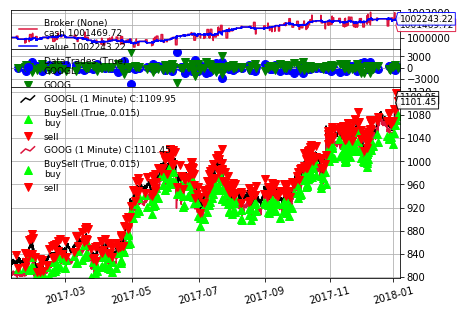

[[<matplotlib.figure.Figure at 0x16df4e79198>]]

In [6]:
cerebro.plot(numfigs=1, volume=False, zdown=False)

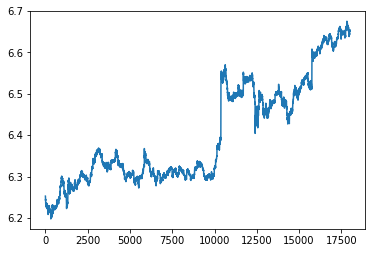

In [65]:
plt.plot(np.log(pd.read_csv("../ib-data/iex/GOOGL.csv")["close"][0:18000]))
plt.show()

The vertical part is where it gets fk-ed up ...

## Distance Method (Single Pair)

In [28]:
class SinglePair(bt.Strategy):
    params = dict (
        period=84,
    )

    def log(self, txt, dt=None):        
        dt = dt or self.data.datetime[0]
        dt = bt.num2date(dt)
        print('%s, %s' % (dt.isoformat(), txt))

    def notify_order(self, order):
        if order.status in [bt.Order.Submitted, bt.Order.Accepted]:
            return  # Await further notifications

        if order.status == order.Completed:
            if order.isbuy():
                buytxt = 'BUY COMPLETE, %.2f' % order.executed.price
                self.log(buytxt, order.executed.dt)
                self.incur_commission(order.executed.price, order.executed.size)
            else:
                selltxt = 'SELL COMPLETE, %.2f' % order.executed.price
                self.log(selltxt, order.executed.dt)
                self.incur_commission(order.executed.price, order.executed.size)

        elif order.status in [order.Expired, order.Canceled, order.Margin]:
            self.log('%s ,' % order.Status[order.status])
            pass  # Simply log

        # Allow new orders
        self.orderid = None

    def __init__(self):
        # To control operation entries
        self.orderid = None
        self.qty1 = 0
        self.qty2 = 0
        self.period = self.p.period
        self.upper_limit = 2.0
        self.lower_limit = -2.0
        self.up_medium = 0.5
        self.low_medium = -0.5
        self.status = 0
        self.exposure = 200000
        
        self.data0_log = Log(self.data0.close)
        self.data1_log = Log(self.data1.close)
        
        self.zscore = None
        self.adf_pvalue = None
        self.intercept = None
        self.slope = None
        self.resid_mean = None
        self.resid_std = None
        self.spread = None
        self.zscore = None
        
        self.open_pos_duration = 0
        self.n_timeouts = 0

    def next(self):
        print("--------------------------------------------------------------------")
        print("Current cash: %.2f" % self.broker.get_cash())
        print("Portfolio value: %.2f" % self.broker.getvalue())
        
        if min(len(self.data0_log), len(self.data1_log)) < self.period:
            return
        
        if self.orderid:
            return  # if an order is active, no new orders are allowed
        
        ##################################################################################################
        # COMPUTE UPPER AND LOWER LIMITS                                                                 #
        ##################################################################################################
        Y = pd.Series(self.data0.get(size=self.period)[0:-1])
        X = pd.Series(self.data1.get(size=self.period)[0:-1])
        
        self.spread = (self.data0[0] - self.data1[0])
        
        if self.status == 0:
            self.spread_mean = (Y - X).mean()
            self.spread_std = (Y - X).std()

            self.upper_limit = self.spread_mean + 2 * self.spread_std
            self.lower_limit = self.spread_mean - 2 * self.spread_std
            self.up_medium = self.spread_mean + 0.5 * self.spread_std
            self.low_medium = self.spread_mean - 0.5 * self.spread_std
        
        ##################################################################################################
        # LOGGING                                                                                        #
        ##################################################################################################
        print("--------------------------------------------------------------------")
        
        print('Strategy  len:', len(self))
        print('Data0 len:', len(self.data0))
        print('Data1 len:', len(self.data1))
        
        print('Data0 dt:', dt.datetime.strftime(data0.datetime.datetime(),'%Y-%m-%d %H:%M:%S'))
        print('Data1 dt:', dt.datetime.strftime(data1.datetime.datetime(),'%Y-%m-%d %H:%M:%S'))

        print('Data0 dt:', dt.datetime.strftime(data0.datetime.datetime(),'%Y-%m-%d %H:%M:%S'))
        print('Data1 dt:', dt.datetime.strftime(data1.datetime.datetime(),'%Y-%m-%d %H:%M:%S'))
        
        print('status is', self.status)
    
        ##################################################################################################
        # STRATEGY LOGIC                                                                                 #
        ##################################################################################################
        if self.status == 0:
            # "NO position" status
            self.open_pos_duration = 0
            
            if self.spread > self.upper_limit:
                self.short_spread()
            elif self.spread < self.lower_limit:
                self.long_spread()
     
        elif self.status == 1:
            # "SHORT the spread" status
            self.open_pos_duration += 1
            
            if self.spread < self.lower_limit:
                self.long_spread()
            elif self.spread < self.up_medium:
                self.exit_spread()
                self.status = 0
        
        elif self.status == 2:
            # "LONG the spread" status
            self.open_pos_duration += 1
            
            if self.spread > self.upper_limit:
                self.short_spread()
            elif self.spread > self.low_medium:
                self.exit_spread()
                self.status = 0
                
        # TIMEOUT condition
        if self.open_pos_duration > 84:
            self.exit_spread()
            self.n_timeouts += 1
            self.status = 0
    
    def short_spread(self):
        value = 0.5 * self.exposure  
        x = int(value / (self.data0.close))  
        y = int(value / (self.data1.close))  
        
        print('x + self.qty1 is', x + self.qty1)
        print('y + self.qty2 is', y + self.qty2)

        # Placing the order
        self.log('SELL CREATE %s, price = %.2f, qty = %d' % ("STOCK 1", self.data0.close[0], x + self.qty1))
        self.sell(data=self.data0, size=(x + self.qty1))  # Place an order for buying y + qty2 shares
        self.log('BUY CREATE %s, price = %.2f, qty = %d' % ("STOCK 2", self.data1.close[0], y + self.qty2))
        self.buy(data=self.data1, size=(y + self.qty2))  # Place an order for selling x + qty1 shares

        # Updating the counters with new value
        self.qty1 = x  
        self.qty2 = y  
        
        # update flags
        self.status = 1
        self.open_pos_duration = 0
    
    def long_spread(self):
        # Calculating the number of shares for each stock
        value = 0.5 * self.exposure 
        x = int(value / (self.data0.close)) 
        y = int(value / (self.data1.close)) 
        
        print('x + self.qty1 is', x + self.qty1)
        print('y + self.qty2 is', y + self.qty2)

        # Place the order
        self.log('BUY CREATE %s, price = %.2f, qty = %d' % ("STOCK 1", self.data0.close[0], x + self.qty1))
        self.buy(data=self.data0, size=(x + self.qty1))  # Place an order for buying x + qty1 shares
        self.log('SELL CREATE %s, price = %.2f, qty = %d' % ("STOCK 2", self.data1.close[0], y + self.qty2))
        self.sell(data=self.data1, size=(y + self.qty2))  # Place an order for selling y + qty2 shares

        # Updating the counters with new value
        self.qty1 = x 
        self.qty2 = y 
        
        # update flags
        self.status = 2  
        self.open_pos_duration = 0
    
    def exit_spread(self):
        # Exit position
        self.log('CLOSE position %s, price = %.2f' % ("STOCK 1", self.data0.close[0]))
        self.close(self.data0)
        self.log('CLOSE position %s, price = %.2f' % ("STOCK 2", self.data1.close[0]))
        self.close(self.data1)
        
        # update counters
        self.qty1 = 0
        self.qty2 = 0
        
        # update flags
        self.status = 0
        self.open_pos_duration = 0
        
    def incur_commission(self, price, qty):
        qty = abs(qty)
        commission = min(max(1, 0.005*qty), 0.01*price*qty)
        print('Commission of ' + str(commission) + 'USD incurred.')
        self.broker.add_cash(-1*commission)
    
    def stop(self):
        print('==================================================')
        print('Starting Value: %.2f' % self.broker.startingcash)
        print('Ending   Value: %.2f' % self.broker.getvalue())
        print('Number of timeouts: %.2f' % self.n_timeouts)
        print('==================================================')

In [35]:
# Create a cerebro
cerebro = bt.Cerebro()

# Create data feed
data0 = bt.feeds.GenericCSVData(
    dataname="..//ib-data//iex//GOOG.csv",
    # Do not pass values before this date
    fromdate=datetime.datetime.strptime('2018-01-06 04:55:00', '%Y-%m-%d %H:%M:%S'),
    # Do not pass values before this date
    todate=datetime.datetime.strptime('2019-01-06 04:55:00', '%Y-%m-%d %H:%M:%S'),
    # Do not pass values after this date
    dtformat=('%Y-%m-%d %H:%M:%S'),
    tmformat=('%H:%M:%S'),
    timeframe=bt.TimeFrame.Minutes,
    datetime = 0,
    open=1,
    high=2,
    low=3,
    close=4,
    volume=-1,
    openinterest=-1,
    reverse=False)

data1 = bt.feeds.GenericCSVData(
    dataname="..//ib-data//iex//GOOGL.csv",
    # Do not pass values before this date
    fromdate=datetime.datetime.strptime('2018-01-06 04:55:00', '%Y-%m-%d %H:%M:%S'),
    # Do not pass values before this date
    todate=datetime.datetime.strptime('2019-01-06 04:55:00', '%Y-%m-%d %H:%M:%S'),
    # Do not pass values after this date
    dtformat=('%Y-%m-%d %H:%M:%S'),
    tmformat=('%H:%M:%S'),
    timeframe=bt.TimeFrame.Minutes,
    datetime = 0,
    open=1,
    high=2,
    low=3,
    close=4,
    volume=-1,
    openinterest=-1,
    reverse=False)

cerebro.adddata(data0)

data1.plotinfo.plotmaster = data0
data1.plotinfo.sameaxis = True

# Add the 2nd data to cerebro
cerebro.adddata(data1)

# Add the strategy
cerebro.addstrategy(SinglePair)

# Add Sharpe Ratio
cerebro.addanalyzer(bt.analyzers.SharpeRatio, _name='mysharpe')

# Add the commission - only stocks like a for each operation
cerebro.broker.setcash(100000)

# Add the commission - only stocks like a for each operation
cerebro.broker.setcommission(commission=0.0000)

# And run it
strat = cerebro.run(period=70)

--------------------------------------------------------------------
Current cash: 100000.00
Portfolio value: 100000.00
--------------------------------------------------------------------
Current cash: 100000.00
Portfolio value: 100000.00
--------------------------------------------------------------------
Current cash: 100000.00
Portfolio value: 100000.00
--------------------------------------------------------------------
Current cash: 100000.00
Portfolio value: 100000.00
--------------------------------------------------------------------
Current cash: 100000.00
Portfolio value: 100000.00
--------------------------------------------------------------------
Current cash: 100000.00
Portfolio value: 100000.00
--------------------------------------------------------------------
Current cash: 100000.00
Portfolio value: 100000.00
--------------------------------------------------------------------
Current cash: 100000.00
Portfolio value: 100000.00
----------------------------------------

Data0 dt: 2018-01-10 03:25:00
Data1 dt: 2018-01-10 03:25:00
Data0 dt: 2018-01-10 03:25:00
Data1 dt: 2018-01-10 03:25:00
status is 0
--------------------------------------------------------------------
Current cash: 100126.78
Portfolio value: 100126.78
--------------------------------------------------------------------
Strategy  len: 140
Data0 len: 140
Data1 len: 140
Data0 dt: 2018-01-10 03:30:00
Data1 dt: 2018-01-10 03:30:00
Data0 dt: 2018-01-10 03:30:00
Data1 dt: 2018-01-10 03:30:00
status is 0
--------------------------------------------------------------------
Current cash: 100126.78
Portfolio value: 100126.78
--------------------------------------------------------------------
Strategy  len: 141
Data0 len: 141
Data1 len: 141
Data0 dt: 2018-01-10 03:35:00
Data1 dt: 2018-01-10 03:35:00
Data0 dt: 2018-01-10 03:35:00
Data1 dt: 2018-01-10 03:35:00
status is 0
--------------------------------------------------------------------
Current cash: 100126.78
Portfolio value: 100126.78
--------

Strategy  len: 245
Data0 len: 245
Data1 len: 245
Data0 dt: 2018-01-11 23:15:00
Data1 dt: 2018-01-11 23:15:00
Data0 dt: 2018-01-11 23:15:00
Data1 dt: 2018-01-11 23:15:00
status is 0
--------------------------------------------------------------------
Current cash: 100262.58
Portfolio value: 100262.58
--------------------------------------------------------------------
Strategy  len: 246
Data0 len: 246
Data1 len: 246
Data0 dt: 2018-01-11 23:20:00
Data1 dt: 2018-01-11 23:20:00
Data0 dt: 2018-01-11 23:20:00
Data1 dt: 2018-01-11 23:20:00
status is 0
--------------------------------------------------------------------
Current cash: 100262.58
Portfolio value: 100262.58
--------------------------------------------------------------------
Strategy  len: 247
Data0 len: 247
Data1 len: 247
Data0 dt: 2018-01-11 23:25:00
Data1 dt: 2018-01-11 23:25:00
Data0 dt: 2018-01-11 23:25:00
Data1 dt: 2018-01-11 23:25:00
status is 0
--------------------------------------------------------------------
Current ca

Data0 len: 367
Data1 len: 367
Data0 dt: 2018-01-13 02:55:00
Data1 dt: 2018-01-13 02:55:00
Data0 dt: 2018-01-13 02:55:00
Data1 dt: 2018-01-13 02:55:00
status is 2
--------------------------------------------------------------------
Current cash: 100007.69
Portfolio value: 100404.54
--------------------------------------------------------------------
Strategy  len: 368
Data0 len: 368
Data1 len: 368
Data0 dt: 2018-01-13 03:00:00
Data1 dt: 2018-01-13 03:00:00
Data0 dt: 2018-01-13 03:00:00
Data1 dt: 2018-01-13 03:00:00
status is 2
--------------------------------------------------------------------
Current cash: 100007.69
Portfolio value: 100422.38
--------------------------------------------------------------------
Strategy  len: 369
Data0 len: 369
Data1 len: 369
Data0 dt: 2018-01-13 03:05:00
Data1 dt: 2018-01-13 03:05:00
Data0 dt: 2018-01-13 03:05:00
Data1 dt: 2018-01-13 03:05:00
status is 2
--------------------------------------------------------------------
Current cash: 100007.69
Portf

Strategy  len: 483
Data0 len: 483
Data1 len: 483
Data0 dt: 2018-01-17 23:35:00
Data1 dt: 2018-01-17 23:35:00
Data0 dt: 2018-01-17 23:35:00
Data1 dt: 2018-01-17 23:35:00
status is 0
--------------------------------------------------------------------
Current cash: 100576.28
Portfolio value: 100576.28
--------------------------------------------------------------------
Strategy  len: 484
Data0 len: 484
Data1 len: 484
Data0 dt: 2018-01-17 23:40:00
Data1 dt: 2018-01-17 23:40:00
Data0 dt: 2018-01-17 23:40:00
Data1 dt: 2018-01-17 23:40:00
status is 0
--------------------------------------------------------------------
Current cash: 100576.28
Portfolio value: 100576.28
--------------------------------------------------------------------
Strategy  len: 485
Data0 len: 485
Data1 len: 485
Data0 dt: 2018-01-17 23:45:00
Data1 dt: 2018-01-17 23:45:00
Data0 dt: 2018-01-17 23:45:00
Data1 dt: 2018-01-17 23:45:00
status is 0
x + self.qty1 is 89
y + self.qty2 is 88
2018-01-17T23:45:00, SELL CREATE STOCK 

Data1 len: 590
Data0 dt: 2018-01-19 02:00:00
Data1 dt: 2018-01-19 02:00:00
Data0 dt: 2018-01-19 02:00:00
Data1 dt: 2018-01-19 02:00:00
status is 1
--------------------------------------------------------------------
Current cash: 101298.79
Portfolio value: 100719.86
--------------------------------------------------------------------
Strategy  len: 591
Data0 len: 591
Data1 len: 591
Data0 dt: 2018-01-19 02:05:00
Data1 dt: 2018-01-19 02:05:00
Data0 dt: 2018-01-19 02:05:00
Data1 dt: 2018-01-19 02:05:00
status is 1
--------------------------------------------------------------------
Current cash: 101298.79
Portfolio value: 100762.96
--------------------------------------------------------------------
Strategy  len: 592
Data0 len: 592
Data1 len: 592
Data0 dt: 2018-01-19 02:10:00
Data1 dt: 2018-01-19 02:10:00
Data0 dt: 2018-01-19 02:10:00
Data1 dt: 2018-01-19 02:10:00
status is 1
2018-01-19T02:10:00, CLOSE position STOCK 1, price = 1125.87
2018-01-19T02:10:00, CLOSE position STOCK 2, price =

Data0 dt: 2018-01-22 23:00:00
Data1 dt: 2018-01-22 23:00:00
status is 0
--------------------------------------------------------------------
Current cash: 100838.68
Portfolio value: 100838.68
--------------------------------------------------------------------
Strategy  len: 711
Data0 len: 711
Data1 len: 711
Data0 dt: 2018-01-22 23:05:00
Data1 dt: 2018-01-22 23:05:00
Data0 dt: 2018-01-22 23:05:00
Data1 dt: 2018-01-22 23:05:00
status is 0
--------------------------------------------------------------------
Current cash: 100838.68
Portfolio value: 100838.68
--------------------------------------------------------------------
Strategy  len: 712
Data0 len: 712
Data1 len: 712
Data0 dt: 2018-01-22 23:10:00
Data1 dt: 2018-01-22 23:10:00
Data0 dt: 2018-01-22 23:10:00
Data1 dt: 2018-01-22 23:10:00
status is 0
--------------------------------------------------------------------
Current cash: 100838.68
Portfolio value: 100838.68
--------------------------------------------------------------------

status is 2
--------------------------------------------------------------------
Current cash: 100356.56
Portfolio value: 100839.45
--------------------------------------------------------------------
Strategy  len: 822
Data0 len: 822
Data1 len: 822
Data0 dt: 2018-01-24 01:50:00
Data1 dt: 2018-01-24 01:50:00
Data0 dt: 2018-01-24 01:50:00
Data1 dt: 2018-01-24 01:50:00
status is 2
--------------------------------------------------------------------
Current cash: 100356.56
Portfolio value: 100853.71
--------------------------------------------------------------------
Strategy  len: 823
Data0 len: 823
Data1 len: 823
Data0 dt: 2018-01-24 01:55:00
Data1 dt: 2018-01-24 01:55:00
Data0 dt: 2018-01-24 01:55:00
Data1 dt: 2018-01-24 01:55:00
status is 2
--------------------------------------------------------------------
Current cash: 100356.56
Portfolio value: 100832.97
--------------------------------------------------------------------
Strategy  len: 824
Data0 len: 824
Data1 len: 824
Data0 dt: 

Data1 dt: 2018-01-25 22:55:00
status is 2
--------------------------------------------------------------------
Current cash: 100458.25
Portfolio value: 100901.75
--------------------------------------------------------------------
Strategy  len: 944
Data0 len: 944
Data1 len: 944
Data0 dt: 2018-01-25 23:00:00
Data1 dt: 2018-01-25 23:00:00
Data0 dt: 2018-01-25 23:00:00
Data1 dt: 2018-01-25 23:00:00
status is 2
--------------------------------------------------------------------
Current cash: 100458.25
Portfolio value: 100875.15
--------------------------------------------------------------------
Strategy  len: 945
Data0 len: 945
Data1 len: 945
Data0 dt: 2018-01-25 23:05:00
Data1 dt: 2018-01-25 23:05:00
Data0 dt: 2018-01-25 23:05:00
Data1 dt: 2018-01-25 23:05:00
status is 2
--------------------------------------------------------------------
Current cash: 100458.25
Portfolio value: 100895.30
--------------------------------------------------------------------
Strategy  len: 946
Data0 len:

Strategy  len: 1061
Data0 len: 1061
Data1 len: 1061
Data0 dt: 2018-01-27 02:15:00
Data1 dt: 2018-01-27 02:15:00
Data0 dt: 2018-01-27 02:15:00
Data1 dt: 2018-01-27 02:15:00
status is 2
--------------------------------------------------------------------
Current cash: 100595.14
Portfolio value: 100793.29
--------------------------------------------------------------------
Strategy  len: 1062
Data0 len: 1062
Data1 len: 1062
Data0 dt: 2018-01-27 02:20:00
Data1 dt: 2018-01-27 02:20:00
Data0 dt: 2018-01-27 02:20:00
Data1 dt: 2018-01-27 02:20:00
status is 2
--------------------------------------------------------------------
Current cash: 100595.14
Portfolio value: 100823.85
--------------------------------------------------------------------
Strategy  len: 1063
Data0 len: 1063
Data1 len: 1063
Data0 dt: 2018-01-27 02:25:00
Data1 dt: 2018-01-27 02:25:00
Data0 dt: 2018-01-27 02:25:00
Data1 dt: 2018-01-27 02:25:00
status is 2
--------------------------------------------------------------------
C

--------------------------------------------------------------------
Strategy  len: 1185
Data0 len: 1185
Data1 len: 1185
Data0 dt: 2018-01-30 23:35:00
Data1 dt: 2018-01-30 23:35:00
Data0 dt: 2018-01-30 23:35:00
Data1 dt: 2018-01-30 23:35:00
status is 1
--------------------------------------------------------------------
Current cash: 101295.68
Portfolio value: 100951.29
--------------------------------------------------------------------
Strategy  len: 1186
Data0 len: 1186
Data1 len: 1186
Data0 dt: 2018-01-30 23:40:00
Data1 dt: 2018-01-30 23:40:00
Data0 dt: 2018-01-30 23:40:00
Data1 dt: 2018-01-30 23:40:00
status is 1
--------------------------------------------------------------------
Current cash: 101295.68
Portfolio value: 100960.43
--------------------------------------------------------------------
Strategy  len: 1187
Data0 len: 1187
Data1 len: 1187
Data0 dt: 2018-01-30 23:45:00
Data1 dt: 2018-01-30 23:45:00
Data0 dt: 2018-01-30 23:45:00
Data1 dt: 2018-01-30 23:45:00
status is 1
-

status is 0
--------------------------------------------------------------------
Current cash: 101334.71
Portfolio value: 101334.71
--------------------------------------------------------------------
Strategy  len: 1300
Data0 len: 1300
Data1 len: 1300
Data0 dt: 2018-02-01 02:40:00
Data1 dt: 2018-02-01 02:40:00
Data0 dt: 2018-02-01 02:40:00
Data1 dt: 2018-02-01 02:40:00
status is 0
--------------------------------------------------------------------
Current cash: 101334.71
Portfolio value: 101334.71
--------------------------------------------------------------------
Strategy  len: 1301
Data0 len: 1301
Data1 len: 1301
Data0 dt: 2018-02-01 02:45:00
Data1 dt: 2018-02-01 02:45:00
Data0 dt: 2018-02-01 02:45:00
Data1 dt: 2018-02-01 02:45:00
status is 0
--------------------------------------------------------------------
Current cash: 101334.71
Portfolio value: 101334.71
--------------------------------------------------------------------
Strategy  len: 1302
Data0 len: 1302
Data1 len: 1302
D

Data1 dt: 2018-02-02 22:40:00
status is 1
--------------------------------------------------------------------
Current cash: 101544.84
Portfolio value: 100881.47
--------------------------------------------------------------------
Strategy  len: 1409
Data0 len: 1409
Data1 len: 1409
Data0 dt: 2018-02-02 22:45:00
Data1 dt: 2018-02-02 22:45:00
Data0 dt: 2018-02-02 22:45:00
Data1 dt: 2018-02-02 22:45:00
status is 1
--------------------------------------------------------------------
Current cash: 101544.84
Portfolio value: 100908.05
--------------------------------------------------------------------
Strategy  len: 1410
Data0 len: 1410
Data1 len: 1410
Data0 dt: 2018-02-02 22:50:00
Data1 dt: 2018-02-02 22:50:00
Data0 dt: 2018-02-02 22:50:00
Data1 dt: 2018-02-02 22:50:00
status is 1
--------------------------------------------------------------------
Current cash: 101544.84
Portfolio value: 100888.28
--------------------------------------------------------------------
Strategy  len: 1411
Dat

Data0 dt: 2018-02-06 02:20:00
Data1 dt: 2018-02-06 02:20:00
status is 0
--------------------------------------------------------------------
Current cash: 101040.87
Portfolio value: 101040.87
--------------------------------------------------------------------
Strategy  len: 1531
Data0 len: 1531
Data1 len: 1531
Data0 dt: 2018-02-06 02:25:00
Data1 dt: 2018-02-06 02:25:00
Data0 dt: 2018-02-06 02:25:00
Data1 dt: 2018-02-06 02:25:00
status is 0
--------------------------------------------------------------------
Current cash: 101040.87
Portfolio value: 101040.87
--------------------------------------------------------------------
Strategy  len: 1532
Data0 len: 1532
Data1 len: 1532
Data0 dt: 2018-02-06 02:30:00
Data1 dt: 2018-02-06 02:30:00
Data0 dt: 2018-02-06 02:30:00
Data1 dt: 2018-02-06 02:30:00
status is 0
--------------------------------------------------------------------
Current cash: 101040.87
Portfolio value: 101040.87
--------------------------------------------------------------

Strategy  len: 1654
Data0 len: 1654
Data1 len: 1654
Data0 dt: 2018-02-07 23:40:00
Data1 dt: 2018-02-07 23:40:00
Data0 dt: 2018-02-07 23:40:00
Data1 dt: 2018-02-07 23:40:00
status is 1
--------------------------------------------------------------------
Current cash: 100759.08
Portfolio value: 101128.15
--------------------------------------------------------------------
Strategy  len: 1655
Data0 len: 1655
Data1 len: 1655
Data0 dt: 2018-02-07 23:45:00
Data1 dt: 2018-02-07 23:45:00
Data0 dt: 2018-02-07 23:45:00
Data1 dt: 2018-02-07 23:45:00
status is 1
--------------------------------------------------------------------
Current cash: 100759.08
Portfolio value: 101111.05
--------------------------------------------------------------------
Strategy  len: 1656
Data0 len: 1656
Data1 len: 1656
Data0 dt: 2018-02-07 23:50:00
Data1 dt: 2018-02-07 23:50:00
Data0 dt: 2018-02-07 23:50:00
Data1 dt: 2018-02-07 23:50:00
status is 1
--------------------------------------------------------------------
C

Data0 len: 1761
Data1 len: 1761
Data0 dt: 2018-02-09 02:05:00
Data1 dt: 2018-02-09 02:05:00
Data0 dt: 2018-02-09 02:05:00
Data1 dt: 2018-02-09 02:05:00
status is 0
--------------------------------------------------------------------
Current cash: 102598.32
Portfolio value: 102598.32
--------------------------------------------------------------------
Strategy  len: 1762
Data0 len: 1762
Data1 len: 1762
Data0 dt: 2018-02-09 02:10:00
Data1 dt: 2018-02-09 02:10:00
Data0 dt: 2018-02-09 02:10:00
Data1 dt: 2018-02-09 02:10:00
status is 0
--------------------------------------------------------------------
Current cash: 102598.32
Portfolio value: 102598.32
--------------------------------------------------------------------
Strategy  len: 1763
Data0 len: 1763
Data1 len: 1763
Data0 dt: 2018-02-09 02:15:00
Data1 dt: 2018-02-09 02:15:00
Data0 dt: 2018-02-09 02:15:00
Data1 dt: 2018-02-09 02:15:00
status is 0
--------------------------------------------------------------------
Current cash: 102598.

Current cash: 102898.78
Portfolio value: 102898.78
--------------------------------------------------------------------
Strategy  len: 1883
Data0 len: 1883
Data1 len: 1883
Data0 dt: 2018-02-12 23:15:00
Data1 dt: 2018-02-12 23:15:00
Data0 dt: 2018-02-12 23:15:00
Data1 dt: 2018-02-12 23:15:00
status is 0
--------------------------------------------------------------------
Current cash: 102898.78
Portfolio value: 102898.78
--------------------------------------------------------------------
Strategy  len: 1884
Data0 len: 1884
Data1 len: 1884
Data0 dt: 2018-02-12 23:20:00
Data1 dt: 2018-02-12 23:20:00
Data0 dt: 2018-02-12 23:20:00
Data1 dt: 2018-02-12 23:20:00
status is 0
--------------------------------------------------------------------
Current cash: 102898.78
Portfolio value: 102898.78
--------------------------------------------------------------------
Strategy  len: 1885
Data0 len: 1885
Data1 len: 1885
Data0 dt: 2018-02-12 23:25:00
Data1 dt: 2018-02-12 23:25:00
Data0 dt: 2018-02-12 2

Data0 len: 2000
Data1 len: 2000
Data0 dt: 2018-02-14 02:30:00
Data1 dt: 2018-02-14 02:30:00
Data0 dt: 2018-02-14 02:30:00
Data1 dt: 2018-02-14 02:30:00
status is 0
--------------------------------------------------------------------
Current cash: 102641.61
Portfolio value: 102641.61
--------------------------------------------------------------------
Strategy  len: 2001
Data0 len: 2001
Data1 len: 2001
Data0 dt: 2018-02-14 02:35:00
Data1 dt: 2018-02-14 02:35:00
Data0 dt: 2018-02-14 02:35:00
Data1 dt: 2018-02-14 02:35:00
status is 0
--------------------------------------------------------------------
Current cash: 102641.61
Portfolio value: 102641.61
--------------------------------------------------------------------
Strategy  len: 2002
Data0 len: 2002
Data1 len: 2002
Data0 dt: 2018-02-14 02:40:00
Data1 dt: 2018-02-14 02:40:00
Data0 dt: 2018-02-14 02:40:00
Data1 dt: 2018-02-14 02:40:00
status is 0
--------------------------------------------------------------------
Current cash: 102641.

Data0 dt: 2018-02-15 23:45:00
Data1 dt: 2018-02-15 23:45:00
status is 1
--------------------------------------------------------------------
Current cash: 102328.49
Portfolio value: 102616.79
--------------------------------------------------------------------
Strategy  len: 2124
Data0 len: 2124
Data1 len: 2124
Data0 dt: 2018-02-15 23:50:00
Data1 dt: 2018-02-15 23:50:00
Data0 dt: 2018-02-15 23:50:00
Data1 dt: 2018-02-15 23:50:00
status is 1
--------------------------------------------------------------------
Current cash: 102328.49
Portfolio value: 102615.86
--------------------------------------------------------------------
Strategy  len: 2125
Data0 len: 2125
Data1 len: 2125
Data0 dt: 2018-02-15 23:55:00
Data1 dt: 2018-02-15 23:55:00
Data0 dt: 2018-02-15 23:55:00
Data1 dt: 2018-02-15 23:55:00
status is 1
--------------------------------------------------------------------
Current cash: 102328.49
Portfolio value: 102579.59
--------------------------------------------------------------

Data0 len: 2247
Data1 len: 2247
Data0 dt: 2018-02-17 03:35:00
Data1 dt: 2018-02-17 03:35:00
Data0 dt: 2018-02-17 03:35:00
Data1 dt: 2018-02-17 03:35:00
status is 1
--------------------------------------------------------------------
Current cash: 103519.76
Portfolio value: 102510.81
--------------------------------------------------------------------
Strategy  len: 2248
Data0 len: 2248
Data1 len: 2248
Data0 dt: 2018-02-17 03:40:00
Data1 dt: 2018-02-17 03:40:00
Data0 dt: 2018-02-17 03:40:00
Data1 dt: 2018-02-17 03:40:00
status is 1
--------------------------------------------------------------------
Current cash: 103519.76
Portfolio value: 102504.84
--------------------------------------------------------------------
Strategy  len: 2249
Data0 len: 2249
Data1 len: 2249
Data0 dt: 2018-02-17 03:45:00
Data1 dt: 2018-02-17 03:45:00
Data0 dt: 2018-02-17 03:45:00
Data1 dt: 2018-02-17 03:45:00
status is 1
--------------------------------------------------------------------
Current cash: 103519.

Data0 dt: 2018-02-21 22:50:00
Data1 dt: 2018-02-21 22:50:00
Data0 dt: 2018-02-21 22:50:00
Data1 dt: 2018-02-21 22:50:00
status is 0
--------------------------------------------------------------------
Current cash: 102694.47
Portfolio value: 102694.47
--------------------------------------------------------------------
Strategy  len: 2347
Data0 len: 2347
Data1 len: 2347
Data0 dt: 2018-02-21 22:55:00
Data1 dt: 2018-02-21 22:55:00
Data0 dt: 2018-02-21 22:55:00
Data1 dt: 2018-02-21 22:55:00
status is 0
--------------------------------------------------------------------
Current cash: 102694.47
Portfolio value: 102694.47
--------------------------------------------------------------------
Strategy  len: 2348
Data0 len: 2348
Data1 len: 2348
Data0 dt: 2018-02-21 23:00:00
Data1 dt: 2018-02-21 23:00:00
Data0 dt: 2018-02-21 23:00:00
Data1 dt: 2018-02-21 23:00:00
status is 0
--------------------------------------------------------------------
Current cash: 102694.47
Portfolio value: 102694.47
--

Data0 dt: 2018-02-23 00:45:00
Data1 dt: 2018-02-23 00:45:00
Data0 dt: 2018-02-23 00:45:00
Data1 dt: 2018-02-23 00:45:00
status is 0
--------------------------------------------------------------------
Current cash: 102694.47
Portfolio value: 102694.47
--------------------------------------------------------------------
Strategy  len: 2448
Data0 len: 2448
Data1 len: 2448
Data0 dt: 2018-02-23 00:50:00
Data1 dt: 2018-02-23 00:50:00
Data0 dt: 2018-02-23 00:50:00
Data1 dt: 2018-02-23 00:50:00
status is 0
--------------------------------------------------------------------
Current cash: 102694.47
Portfolio value: 102694.47
--------------------------------------------------------------------
Strategy  len: 2449
Data0 len: 2449
Data1 len: 2449
Data0 dt: 2018-02-23 00:55:00
Data1 dt: 2018-02-23 00:55:00
Data0 dt: 2018-02-23 00:55:00
Data1 dt: 2018-02-23 00:55:00
status is 0
--------------------------------------------------------------------
Current cash: 102694.47
Portfolio value: 102694.47
--

status is 2
--------------------------------------------------------------------
Current cash: 103015.62
Portfolio value: 102773.07
--------------------------------------------------------------------
Strategy  len: 2546
Data0 len: 2546
Data1 len: 2546
Data0 dt: 2018-02-24 02:30:00
Data1 dt: 2018-02-24 02:30:00
Data0 dt: 2018-02-24 02:30:00
Data1 dt: 2018-02-24 02:30:00
status is 2
--------------------------------------------------------------------
Current cash: 103015.62
Portfolio value: 102770.82
--------------------------------------------------------------------
Strategy  len: 2547
Data0 len: 2547
Data1 len: 2547
Data0 dt: 2018-02-24 02:35:00
Data1 dt: 2018-02-24 02:35:00
Data0 dt: 2018-02-24 02:35:00
Data1 dt: 2018-02-24 02:35:00
status is 2
--------------------------------------------------------------------
Current cash: 103015.62
Portfolio value: 102761.82
--------------------------------------------------------------------
Strategy  len: 2548
Data0 len: 2548
Data1 len: 2548
D

--------------------------------------------------------------------
Current cash: 103739.74
Portfolio value: 102631.97
--------------------------------------------------------------------
Strategy  len: 2661
Data0 len: 2661
Data1 len: 2661
Data0 dt: 2018-02-27 23:05:00
Data1 dt: 2018-02-27 23:05:00
Data0 dt: 2018-02-27 23:05:00
Data1 dt: 2018-02-27 23:05:00
status is 1
--------------------------------------------------------------------
Current cash: 103739.74
Portfolio value: 102661.29
--------------------------------------------------------------------
Strategy  len: 2662
Data0 len: 2662
Data1 len: 2662
Data0 dt: 2018-02-27 23:10:00
Data1 dt: 2018-02-27 23:10:00
Data0 dt: 2018-02-27 23:10:00
Data1 dt: 2018-02-27 23:10:00
status is 1
--------------------------------------------------------------------
Current cash: 103739.74
Portfolio value: 102643.20
--------------------------------------------------------------------
Strategy  len: 2663
Data0 len: 2663
Data1 len: 2663
Data0 dt: 201

--------------------------------------------------------------------
Current cash: 102704.27
Portfolio value: 102700.27
--------------------------------------------------------------------
Strategy  len: 2767
Data0 len: 2767
Data1 len: 2767
Data0 dt: 2018-03-01 01:25:00
Data1 dt: 2018-03-01 01:25:00
Data0 dt: 2018-03-01 01:25:00
Data1 dt: 2018-03-01 01:25:00
status is 2
--------------------------------------------------------------------
Current cash: 102704.27
Portfolio value: 102703.38
--------------------------------------------------------------------
Strategy  len: 2768
Data0 len: 2768
Data1 len: 2768
Data0 dt: 2018-03-01 01:30:00
Data1 dt: 2018-03-01 01:30:00
Data0 dt: 2018-03-01 01:30:00
Data1 dt: 2018-03-01 01:30:00
status is 2
--------------------------------------------------------------------
Current cash: 102704.27
Portfolio value: 102710.06
--------------------------------------------------------------------
Strategy  len: 2769
Data0 len: 2769
Data1 len: 2769
Data0 dt: 201

status is 1
--------------------------------------------------------------------
Current cash: 103002.45
Portfolio value: 102984.32
--------------------------------------------------------------------
Strategy  len: 2870
Data0 len: 2870
Data1 len: 2870
Data0 dt: 2018-03-02 03:30:00
Data1 dt: 2018-03-02 03:30:00
Data0 dt: 2018-03-02 03:30:00
Data1 dt: 2018-03-02 03:30:00
status is 1
--------------------------------------------------------------------
Current cash: 103002.45
Portfolio value: 102998.27
--------------------------------------------------------------------
Strategy  len: 2871
Data0 len: 2871
Data1 len: 2871
Data0 dt: 2018-03-02 03:35:00
Data1 dt: 2018-03-02 03:35:00
Data0 dt: 2018-03-02 03:35:00
Data1 dt: 2018-03-02 03:35:00
status is 1
--------------------------------------------------------------------
Current cash: 103002.45
Portfolio value: 102997.34
--------------------------------------------------------------------
Strategy  len: 2872
Data0 len: 2872
Data1 len: 2872
D

Portfolio value: 102924.24
--------------------------------------------------------------------
Strategy  len: 2988
Data0 len: 2988
Data1 len: 2988
Data0 dt: 2018-03-06 00:20:00
Data1 dt: 2018-03-06 00:20:00
Data0 dt: 2018-03-06 00:20:00
Data1 dt: 2018-03-06 00:20:00
status is 1
--------------------------------------------------------------------
Current cash: 102714.94
Portfolio value: 102905.38
--------------------------------------------------------------------
Strategy  len: 2989
Data0 len: 2989
Data1 len: 2989
Data0 dt: 2018-03-06 00:25:00
Data1 dt: 2018-03-06 00:25:00
Data0 dt: 2018-03-06 00:25:00
Data1 dt: 2018-03-06 00:25:00
status is 1
--------------------------------------------------------------------
Current cash: 102714.94
Portfolio value: 102905.38
--------------------------------------------------------------------
Strategy  len: 2990
Data0 len: 2990
Data1 len: 2990
Data0 dt: 2018-03-06 00:30:00
Data1 dt: 2018-03-06 00:30:00
Data0 dt: 2018-03-06 00:30:00
Data1 dt: 2018-0

Data0 dt: 2018-03-07 02:20:00
Data1 dt: 2018-03-07 02:20:00
Data0 dt: 2018-03-07 02:20:00
Data1 dt: 2018-03-07 02:20:00
status is 2
--------------------------------------------------------------------
Current cash: 102349.46
Portfolio value: 103157.34
--------------------------------------------------------------------
Strategy  len: 3091
Data0 len: 3091
Data1 len: 3091
Data0 dt: 2018-03-07 02:25:00
Data1 dt: 2018-03-07 02:25:00
Data0 dt: 2018-03-07 02:25:00
Data1 dt: 2018-03-07 02:25:00
status is 2
--------------------------------------------------------------------
Current cash: 102349.46
Portfolio value: 103132.77
--------------------------------------------------------------------
Strategy  len: 3092
Data0 len: 3092
Data1 len: 3092
Data0 dt: 2018-03-07 02:30:00
Data1 dt: 2018-03-07 02:30:00
Data0 dt: 2018-03-07 02:30:00
Data1 dt: 2018-03-07 02:30:00
status is 2
--------------------------------------------------------------------
Current cash: 102349.46
Portfolio value: 103150.37
--

status is 0
--------------------------------------------------------------------
Current cash: 103461.72
Portfolio value: 103461.72
--------------------------------------------------------------------
Strategy  len: 3209
Data0 len: 3209
Data1 len: 3209
Data0 dt: 2018-03-08 23:15:00
Data1 dt: 2018-03-08 23:15:00
Data0 dt: 2018-03-08 23:15:00
Data1 dt: 2018-03-08 23:15:00
status is 0
--------------------------------------------------------------------
Current cash: 103461.72
Portfolio value: 103461.72
--------------------------------------------------------------------
Strategy  len: 3210
Data0 len: 3210
Data1 len: 3210
Data0 dt: 2018-03-08 23:20:00
Data1 dt: 2018-03-08 23:20:00
Data0 dt: 2018-03-08 23:20:00
Data1 dt: 2018-03-08 23:20:00
status is 0
--------------------------------------------------------------------
Current cash: 103461.72
Portfolio value: 103461.72
--------------------------------------------------------------------
Strategy  len: 3211
Data0 len: 3211
Data1 len: 3211
D

Data0 dt: 2018-03-10 00:00:00
Data1 dt: 2018-03-10 00:00:00
status is 1
--------------------------------------------------------------------
Current cash: 103270.50
Portfolio value: 103434.49
--------------------------------------------------------------------
Strategy  len: 3297
Data0 len: 3297
Data1 len: 3297
Data0 dt: 2018-03-10 00:05:00
Data1 dt: 2018-03-10 00:05:00
Data0 dt: 2018-03-10 00:05:00
Data1 dt: 2018-03-10 00:05:00
status is 1
--------------------------------------------------------------------
Current cash: 103270.50
Portfolio value: 103419.27
--------------------------------------------------------------------
Strategy  len: 3298
Data0 len: 3298
Data1 len: 3298
Data0 dt: 2018-03-10 00:10:00
Data1 dt: 2018-03-10 00:10:00
Data0 dt: 2018-03-10 00:10:00
Data1 dt: 2018-03-10 00:10:00
status is 1
--------------------------------------------------------------------
Current cash: 103270.50
Portfolio value: 103401.87
--------------------------------------------------------------

Data0 dt: 2018-03-13 01:15:00
Data1 dt: 2018-03-13 01:15:00
status is 0
--------------------------------------------------------------------
Current cash: 103455.58
Portfolio value: 103455.58
--------------------------------------------------------------------
Strategy  len: 3402
Data0 len: 3402
Data1 len: 3402
Data0 dt: 2018-03-13 01:20:00
Data1 dt: 2018-03-13 01:20:00
Data0 dt: 2018-03-13 01:20:00
Data1 dt: 2018-03-13 01:20:00
status is 0
--------------------------------------------------------------------
Current cash: 103455.58
Portfolio value: 103455.58
--------------------------------------------------------------------
Strategy  len: 3403
Data0 len: 3403
Data1 len: 3403
Data0 dt: 2018-03-13 01:25:00
Data1 dt: 2018-03-13 01:25:00
Data0 dt: 2018-03-13 01:25:00
Data1 dt: 2018-03-13 01:25:00
status is 0
--------------------------------------------------------------------
Current cash: 103455.58
Portfolio value: 103455.58
--------------------------------------------------------------

Data0 dt: 2018-03-14 02:15:00
Data1 dt: 2018-03-14 02:15:00
Data0 dt: 2018-03-14 02:15:00
Data1 dt: 2018-03-14 02:15:00
status is 0
--------------------------------------------------------------------
Current cash: 103517.70
Portfolio value: 103517.70
--------------------------------------------------------------------
Strategy  len: 3492
Data0 len: 3492
Data1 len: 3492
Data0 dt: 2018-03-14 02:20:00
Data1 dt: 2018-03-14 02:20:00
Data0 dt: 2018-03-14 02:20:00
Data1 dt: 2018-03-14 02:20:00
status is 0
--------------------------------------------------------------------
Current cash: 103517.70
Portfolio value: 103517.70
--------------------------------------------------------------------
Strategy  len: 3493
Data0 len: 3493
Data1 len: 3493
Data0 dt: 2018-03-14 02:25:00
Data1 dt: 2018-03-14 02:25:00
Data0 dt: 2018-03-14 02:25:00
Data1 dt: 2018-03-14 02:25:00
status is 0
--------------------------------------------------------------------
Current cash: 103517.70
Portfolio value: 103517.70
--

Data1 len: 3603
Data0 dt: 2018-03-15 22:35:00
Data1 dt: 2018-03-15 22:35:00
Data0 dt: 2018-03-15 22:35:00
Data1 dt: 2018-03-15 22:35:00
status is 2
--------------------------------------------------------------------
Current cash: 103885.03
Portfolio value: 103743.56
--------------------------------------------------------------------
Strategy  len: 3604
Data0 len: 3604
Data1 len: 3604
Data0 dt: 2018-03-15 22:40:00
Data1 dt: 2018-03-15 22:40:00
Data0 dt: 2018-03-15 22:40:00
Data1 dt: 2018-03-15 22:40:00
status is 2
--------------------------------------------------------------------
Current cash: 103885.03
Portfolio value: 103709.59
--------------------------------------------------------------------
Strategy  len: 3605
Data0 len: 3605
Data1 len: 3605
Data0 dt: 2018-03-15 22:45:00
Data1 dt: 2018-03-15 22:45:00
Data0 dt: 2018-03-15 22:45:00
Data1 dt: 2018-03-15 22:45:00
status is 2
--------------------------------------------------------------------
Current cash: 103885.03
Portfolio val

Data0 len: 3704
Data1 len: 3704
Data0 dt: 2018-03-17 00:30:00
Data1 dt: 2018-03-17 00:30:00
Data0 dt: 2018-03-17 00:30:00
Data1 dt: 2018-03-17 00:30:00
status is 1
--------------------------------------------------------------------
Current cash: 103974.07
Portfolio value: 103880.97
--------------------------------------------------------------------
Strategy  len: 3705
Data0 len: 3705
Data1 len: 3705
Data0 dt: 2018-03-17 00:35:00
Data1 dt: 2018-03-17 00:35:00
Data0 dt: 2018-03-17 00:35:00
Data1 dt: 2018-03-17 00:35:00
status is 1
--------------------------------------------------------------------
Current cash: 103974.07
Portfolio value: 103904.90
--------------------------------------------------------------------
Strategy  len: 3706
Data0 len: 3706
Data1 len: 3706
Data0 dt: 2018-03-17 00:40:00
Data1 dt: 2018-03-17 00:40:00
Data0 dt: 2018-03-17 00:40:00
Data1 dt: 2018-03-17 00:40:00
status is 1
--------------------------------------------------------------------
Current cash: 103974.

Portfolio value: 104082.04
--------------------------------------------------------------------
Strategy  len: 3804
Data0 len: 3804
Data1 len: 3804
Data0 dt: 2018-03-20 02:20:00
Data1 dt: 2018-03-20 02:20:00
Data0 dt: 2018-03-20 02:20:00
Data1 dt: 2018-03-20 02:20:00
status is 2
--------------------------------------------------------------------
Current cash: 104053.38
Portfolio value: 104106.15
--------------------------------------------------------------------
Strategy  len: 3805
Data0 len: 3805
Data1 len: 3805
Data0 dt: 2018-03-20 02:25:00
Data1 dt: 2018-03-20 02:25:00
Data0 dt: 2018-03-20 02:25:00
Data1 dt: 2018-03-20 02:25:00
status is 2
--------------------------------------------------------------------
Current cash: 104053.38
Portfolio value: 104064.75
--------------------------------------------------------------------
Strategy  len: 3806
Data0 len: 3806
Data1 len: 3806
Data0 dt: 2018-03-20 02:30:00
Data1 dt: 2018-03-20 02:30:00
Data0 dt: 2018-03-20 02:30:00
Data1 dt: 2018-0

status is 1
--------------------------------------------------------------------
Current cash: 104213.63
Portfolio value: 104098.06
--------------------------------------------------------------------
Strategy  len: 3908
Data0 len: 3908
Data1 len: 3908
Data0 dt: 2018-03-21 22:00:00
Data1 dt: 2018-03-21 22:00:00
Data0 dt: 2018-03-21 22:00:00
Data1 dt: 2018-03-21 22:00:00
status is 1
--------------------------------------------------------------------
Current cash: 104213.63
Portfolio value: 104088.51
--------------------------------------------------------------------
Strategy  len: 3909
Data0 len: 3909
Data1 len: 3909
Data0 dt: 2018-03-21 22:05:00
Data1 dt: 2018-03-21 22:05:00
Data0 dt: 2018-03-21 22:05:00
Data1 dt: 2018-03-21 22:05:00
status is 1
--------------------------------------------------------------------
Current cash: 104213.63
Portfolio value: 104079.41
--------------------------------------------------------------------
Strategy  len: 3910
Data0 len: 3910
Data1 len: 3910
D

Data1 dt: 2018-03-23 01:20:00
status is 0
--------------------------------------------------------------------
Current cash: 103861.45
Portfolio value: 103861.45
--------------------------------------------------------------------
Strategy  len: 4027
Data0 len: 4027
Data1 len: 4027
Data0 dt: 2018-03-23 01:25:00
Data1 dt: 2018-03-23 01:25:00
Data0 dt: 2018-03-23 01:25:00
Data1 dt: 2018-03-23 01:25:00
status is 0
--------------------------------------------------------------------
Current cash: 103861.45
Portfolio value: 103861.45
--------------------------------------------------------------------
Strategy  len: 4028
Data0 len: 4028
Data1 len: 4028
Data0 dt: 2018-03-23 01:30:00
Data1 dt: 2018-03-23 01:30:00
Data0 dt: 2018-03-23 01:30:00
Data1 dt: 2018-03-23 01:30:00
status is 0
--------------------------------------------------------------------
Current cash: 103861.45
Portfolio value: 103861.45
--------------------------------------------------------------------
Strategy  len: 4029
Dat

2018-03-24T03:55:00, SELL CREATE STOCK 2, price = 1026.59, qty = 97
2018-03-26T21:30:00, BUY COMPLETE, 1046.33
Commission of 1USD incurred.
2018-03-26T21:30:00, SELL COMPLETE, 1050.80
Commission of 1USD incurred.
--------------------------------------------------------------------
Current cash: 104444.49
Portfolio value: 104001.20
--------------------------------------------------------------------
Strategy  len: 4136
Data0 len: 4136
Data1 len: 4136
Data0 dt: 2018-03-26 21:30:00
Data1 dt: 2018-03-26 21:30:00
Data0 dt: 2018-03-26 21:30:00
Data1 dt: 2018-03-26 21:30:00
status is 2
--------------------------------------------------------------------
Current cash: 104442.49
Portfolio value: 104033.63
--------------------------------------------------------------------
Strategy  len: 4137
Data0 len: 4137
Data1 len: 4137
Data0 dt: 2018-03-26 21:35:00
Data1 dt: 2018-03-26 21:35:00
Data0 dt: 2018-03-26 21:35:00
Data1 dt: 2018-03-26 21:35:00
status is 2
-----------------------------------------

Data0 dt: 2018-03-28 00:10:00
Data1 dt: 2018-03-28 00:10:00
status is 0
--------------------------------------------------------------------
Current cash: 104492.94
Portfolio value: 104492.94
--------------------------------------------------------------------
Strategy  len: 4247
Data0 len: 4247
Data1 len: 4247
Data0 dt: 2018-03-28 00:15:00
Data1 dt: 2018-03-28 00:15:00
Data0 dt: 2018-03-28 00:15:00
Data1 dt: 2018-03-28 00:15:00
status is 0
--------------------------------------------------------------------
Current cash: 104492.94
Portfolio value: 104492.94
--------------------------------------------------------------------
Strategy  len: 4248
Data0 len: 4248
Data1 len: 4248
Data0 dt: 2018-03-28 00:20:00
Data1 dt: 2018-03-28 00:20:00
Data0 dt: 2018-03-28 00:20:00
Data1 dt: 2018-03-28 00:20:00
status is 0
--------------------------------------------------------------------
Current cash: 104492.94
Portfolio value: 104492.94
--------------------------------------------------------------

Data0 dt: 2018-03-29 03:55:00
Data1 dt: 2018-03-29 03:55:00
status is 0
--------------------------------------------------------------------
Current cash: 104887.26
Portfolio value: 104887.26
--------------------------------------------------------------------
Strategy  len: 4370
Data0 len: 4370
Data1 len: 4370
Data0 dt: 2018-03-29 21:30:00
Data1 dt: 2018-03-29 21:30:00
Data0 dt: 2018-03-29 21:30:00
Data1 dt: 2018-03-29 21:30:00
status is 0
--------------------------------------------------------------------
Current cash: 104887.26
Portfolio value: 104887.26
--------------------------------------------------------------------
Strategy  len: 4371
Data0 len: 4371
Data1 len: 4371
Data0 dt: 2018-03-29 21:35:00
Data1 dt: 2018-03-29 21:35:00
Data0 dt: 2018-03-29 21:35:00
Data1 dt: 2018-03-29 21:35:00
status is 0
--------------------------------------------------------------------
Current cash: 104887.26
Portfolio value: 104887.26
--------------------------------------------------------------

--------------------------------------------------------------------
Strategy  len: 4491
Data0 len: 4491
Data1 len: 4491
Data0 dt: 2018-04-03 01:05:00
Data1 dt: 2018-04-03 01:05:00
Data0 dt: 2018-04-03 01:05:00
Data1 dt: 2018-04-03 01:05:00
status is 1
--------------------------------------------------------------------
Current cash: 105278.13
Portfolio value: 104643.83
--------------------------------------------------------------------
Strategy  len: 4492
Data0 len: 4492
Data1 len: 4492
Data0 dt: 2018-04-03 01:10:00
Data1 dt: 2018-04-03 01:10:00
Data0 dt: 2018-04-03 01:10:00
Data1 dt: 2018-04-03 01:10:00
status is 1
--------------------------------------------------------------------
Current cash: 105278.13
Portfolio value: 104642.38
--------------------------------------------------------------------
Strategy  len: 4493
Data0 len: 4493
Data1 len: 4493
Data0 dt: 2018-04-03 01:15:00
Data1 dt: 2018-04-03 01:15:00
Data0 dt: 2018-04-03 01:15:00
Data1 dt: 2018-04-03 01:15:00
status is 1
-

Data1 dt: 2018-04-04 02:55:00
Data0 dt: 2018-04-04 02:55:00
Data1 dt: 2018-04-04 02:55:00
status is 0
--------------------------------------------------------------------
Current cash: 104765.07
Portfolio value: 104765.07
--------------------------------------------------------------------
Strategy  len: 4592
Data0 len: 4592
Data1 len: 4592
Data0 dt: 2018-04-04 03:00:00
Data1 dt: 2018-04-04 03:00:00
Data0 dt: 2018-04-04 03:00:00
Data1 dt: 2018-04-04 03:00:00
status is 0
--------------------------------------------------------------------
Current cash: 104765.07
Portfolio value: 104765.07
--------------------------------------------------------------------
Strategy  len: 4593
Data0 len: 4593
Data1 len: 4593
Data0 dt: 2018-04-04 03:05:00
Data1 dt: 2018-04-04 03:05:00
Data0 dt: 2018-04-04 03:05:00
Data1 dt: 2018-04-04 03:05:00
status is 0
--------------------------------------------------------------------
Current cash: 104765.07
Portfolio value: 104765.07
--------------------------------

--------------------------------------------------------------------
Current cash: 105267.55
Portfolio value: 104832.19
--------------------------------------------------------------------
Strategy  len: 4692
Data0 len: 4692
Data1 len: 4692
Data0 dt: 2018-04-05 22:20:00
Data1 dt: 2018-04-05 22:20:00
Data0 dt: 2018-04-05 22:20:00
Data1 dt: 2018-04-05 22:20:00
status is 2
--------------------------------------------------------------------
Current cash: 105267.55
Portfolio value: 104832.19
--------------------------------------------------------------------
Strategy  len: 4693
Data0 len: 4693
Data1 len: 4693
Data0 dt: 2018-04-05 22:25:00
Data1 dt: 2018-04-05 22:25:00
Data0 dt: 2018-04-05 22:25:00
Data1 dt: 2018-04-05 22:25:00
status is 2
--------------------------------------------------------------------
Current cash: 105267.55
Portfolio value: 104883.55
--------------------------------------------------------------------
Strategy  len: 4694
Data0 len: 4694
Data1 len: 4694
Data0 dt: 201

Data0 dt: 2018-04-06 22:45:00
Data1 dt: 2018-04-06 22:45:00
status is 2
--------------------------------------------------------------------
Current cash: 105595.22
Portfolio value: 105092.28
--------------------------------------------------------------------
Strategy  len: 4776
Data0 len: 4776
Data1 len: 4776
Data0 dt: 2018-04-06 22:50:00
Data1 dt: 2018-04-06 22:50:00
Data0 dt: 2018-04-06 22:50:00
Data1 dt: 2018-04-06 22:50:00
status is 2
--------------------------------------------------------------------
Current cash: 105595.22
Portfolio value: 105078.70
--------------------------------------------------------------------
Strategy  len: 4777
Data0 len: 4777
Data1 len: 4777
Data0 dt: 2018-04-06 22:55:00
Data1 dt: 2018-04-06 22:55:00
Data0 dt: 2018-04-06 22:55:00
Data1 dt: 2018-04-06 22:55:00
status is 2
--------------------------------------------------------------------
Current cash: 105595.22
Portfolio value: 105089.37
--------------------------------------------------------------

Data0 len: 4893
Data1 len: 4893
Data0 dt: 2018-04-10 02:05:00
Data1 dt: 2018-04-10 02:05:00
Data0 dt: 2018-04-10 02:05:00
Data1 dt: 2018-04-10 02:05:00
status is 2
--------------------------------------------------------------------
Current cash: 104738.19
Portfolio value: 105371.65
--------------------------------------------------------------------
Strategy  len: 4894
Data0 len: 4894
Data1 len: 4894
Data0 dt: 2018-04-10 02:10:00
Data1 dt: 2018-04-10 02:10:00
Data0 dt: 2018-04-10 02:10:00
Data1 dt: 2018-04-10 02:10:00
status is 2
--------------------------------------------------------------------
Current cash: 104738.19
Portfolio value: 105359.73
--------------------------------------------------------------------
Strategy  len: 4895
Data0 len: 4895
Data1 len: 4895
Data0 dt: 2018-04-10 02:15:00
Data1 dt: 2018-04-10 02:15:00
Data0 dt: 2018-04-10 02:15:00
Data1 dt: 2018-04-10 02:15:00
status is 2
--------------------------------------------------------------------
Current cash: 104738.

status is 0
--------------------------------------------------------------------
Current cash: 105455.81
Portfolio value: 105455.81
--------------------------------------------------------------------
Strategy  len: 5013
Data0 len: 5013
Data1 len: 5013
Data0 dt: 2018-04-11 23:05:00
Data1 dt: 2018-04-11 23:05:00
Data0 dt: 2018-04-11 23:05:00
Data1 dt: 2018-04-11 23:05:00
status is 0
--------------------------------------------------------------------
Current cash: 105455.81
Portfolio value: 105455.81
--------------------------------------------------------------------
Strategy  len: 5014
Data0 len: 5014
Data1 len: 5014
Data0 dt: 2018-04-11 23:10:00
Data1 dt: 2018-04-11 23:10:00
Data0 dt: 2018-04-11 23:10:00
Data1 dt: 2018-04-11 23:10:00
status is 0
x + self.qty1 is 98
y + self.qty2 is 97
2018-04-11T23:10:00, SELL CREATE STOCK 1, price = 1018.67, qty = 98
2018-04-11T23:10:00, BUY CREATE STOCK 2, price = 1021.84, qty = 97
2018-04-11T23:15:00, SELL COMPLETE, 1018.67
Commission of 1USD incu

Data0 dt: 2018-04-13 02:10:00
Data1 dt: 2018-04-13 02:10:00
status is 0
--------------------------------------------------------------------
Current cash: 105651.84
Portfolio value: 105651.84
--------------------------------------------------------------------
Strategy  len: 5129
Data0 len: 5129
Data1 len: 5129
Data0 dt: 2018-04-13 02:15:00
Data1 dt: 2018-04-13 02:15:00
Data0 dt: 2018-04-13 02:15:00
Data1 dt: 2018-04-13 02:15:00
status is 0
--------------------------------------------------------------------
Current cash: 105651.84
Portfolio value: 105651.84
--------------------------------------------------------------------
Strategy  len: 5130
Data0 len: 5130
Data1 len: 5130
Data0 dt: 2018-04-13 02:20:00
Data1 dt: 2018-04-13 02:20:00
Data0 dt: 2018-04-13 02:20:00
Data1 dt: 2018-04-13 02:20:00
status is 0
--------------------------------------------------------------------
Current cash: 105651.84
Portfolio value: 105651.84
--------------------------------------------------------------

Data1 dt: 2018-04-16 22:00:00
Data0 dt: 2018-04-16 22:00:00
Data1 dt: 2018-04-16 22:00:00
status is 2
--------------------------------------------------------------------
Current cash: 105318.81
Portfolio value: 105629.12
--------------------------------------------------------------------
Strategy  len: 5235
Data0 len: 5235
Data1 len: 5235
Data0 dt: 2018-04-16 22:05:00
Data1 dt: 2018-04-16 22:05:00
Data0 dt: 2018-04-16 22:05:00
Data1 dt: 2018-04-16 22:05:00
status is 2
--------------------------------------------------------------------
Current cash: 105318.81
Portfolio value: 105658.08
--------------------------------------------------------------------
Strategy  len: 5236
Data0 len: 5236
Data1 len: 5236
Data0 dt: 2018-04-16 22:10:00
Data1 dt: 2018-04-16 22:10:00
Data0 dt: 2018-04-16 22:10:00
Data1 dt: 2018-04-16 22:10:00
status is 2
--------------------------------------------------------------------
Current cash: 105318.81
Portfolio value: 105679.64
--------------------------------

Data1 dt: 2018-04-18 01:50:00
Data0 dt: 2018-04-18 01:50:00
Data1 dt: 2018-04-18 01:50:00
status is 2
--------------------------------------------------------------------
Current cash: 105376.82
Portfolio value: 105553.80
--------------------------------------------------------------------
Strategy  len: 5359
Data0 len: 5359
Data1 len: 5359
Data0 dt: 2018-04-18 01:55:00
Data1 dt: 2018-04-18 01:55:00
Data0 dt: 2018-04-18 01:55:00
Data1 dt: 2018-04-18 01:55:00
status is 2
--------------------------------------------------------------------
Current cash: 105376.82
Portfolio value: 105589.81
--------------------------------------------------------------------
Strategy  len: 5360
Data0 len: 5360
Data1 len: 5360
Data0 dt: 2018-04-18 02:00:00
Data1 dt: 2018-04-18 02:00:00
Data0 dt: 2018-04-18 02:00:00
Data1 dt: 2018-04-18 02:00:00
status is 2
--------------------------------------------------------------------
Current cash: 105376.82
Portfolio value: 105601.43
--------------------------------

Data1 dt: 2018-04-19 21:35:00
Data0 dt: 2018-04-19 21:35:00
Data1 dt: 2018-04-19 21:35:00
status is 1
--------------------------------------------------------------------
Current cash: 105184.83
Portfolio value: 105490.80
--------------------------------------------------------------------
Strategy  len: 5464
Data0 len: 5464
Data1 len: 5464
Data0 dt: 2018-04-19 21:40:00
Data1 dt: 2018-04-19 21:40:00
Data0 dt: 2018-04-19 21:40:00
Data1 dt: 2018-04-19 21:40:00
status is 1
--------------------------------------------------------------------
Current cash: 105184.83
Portfolio value: 105553.11
--------------------------------------------------------------------
Strategy  len: 5465
Data0 len: 5465
Data1 len: 5465
Data0 dt: 2018-04-19 21:45:00
Data1 dt: 2018-04-19 21:45:00
Data0 dt: 2018-04-19 21:45:00
Data1 dt: 2018-04-19 21:45:00
status is 1
--------------------------------------------------------------------
Current cash: 105184.83
Portfolio value: 105502.89
--------------------------------

Data0 len: 5579
Data1 len: 5579
Data0 dt: 2018-04-21 00:45:00
Data1 dt: 2018-04-21 00:45:00
Data0 dt: 2018-04-21 00:45:00
Data1 dt: 2018-04-21 00:45:00
status is 1
--------------------------------------------------------------------
Current cash: 105614.23
Portfolio value: 105835.82
--------------------------------------------------------------------
Strategy  len: 5580
Data0 len: 5580
Data1 len: 5580
Data0 dt: 2018-04-21 00:50:00
Data1 dt: 2018-04-21 00:50:00
Data0 dt: 2018-04-21 00:50:00
Data1 dt: 2018-04-21 00:50:00
status is 1
--------------------------------------------------------------------
Current cash: 105614.23
Portfolio value: 105830.81
--------------------------------------------------------------------
Strategy  len: 5581
Data0 len: 5581
Data1 len: 5581
Data0 dt: 2018-04-21 00:55:00
Data1 dt: 2018-04-21 00:55:00
Data0 dt: 2018-04-21 00:55:00
Data1 dt: 2018-04-21 00:55:00
status is 1
--------------------------------------------------------------------
Current cash: 105614.

status is 2
--------------------------------------------------------------------
Current cash: 105231.38
Portfolio value: 105844.27
--------------------------------------------------------------------
Strategy  len: 5641
Data0 len: 5641
Data1 len: 5641
Data0 dt: 2018-04-23 23:25:00
Data1 dt: 2018-04-23 23:25:00
Data0 dt: 2018-04-23 23:25:00
Data1 dt: 2018-04-23 23:25:00
status is 2
--------------------------------------------------------------------
Current cash: 105231.38
Portfolio value: 105826.36
--------------------------------------------------------------------
Strategy  len: 5642
Data0 len: 5642
Data1 len: 5642
Data0 dt: 2018-04-23 23:30:00
Data1 dt: 2018-04-23 23:30:00
Data0 dt: 2018-04-23 23:30:00
Data1 dt: 2018-04-23 23:30:00
status is 2
--------------------------------------------------------------------
Current cash: 105231.38
Portfolio value: 105810.85
--------------------------------------------------------------------
Strategy  len: 5643
Data0 len: 5643
Data1 len: 5643
D

Data0 len: 5753
Data1 len: 5753
Data0 dt: 2018-04-25 02:15:00
Data1 dt: 2018-04-25 02:15:00
Data0 dt: 2018-04-25 02:15:00
Data1 dt: 2018-04-25 02:15:00
status is 1
--------------------------------------------------------------------
Current cash: 105214.26
Portfolio value: 105410.20
--------------------------------------------------------------------
Strategy  len: 5754
Data0 len: 5754
Data1 len: 5754
Data0 dt: 2018-04-25 02:20:00
Data1 dt: 2018-04-25 02:20:00
Data0 dt: 2018-04-25 02:20:00
Data1 dt: 2018-04-25 02:20:00
status is 1
--------------------------------------------------------------------
Current cash: 105214.26
Portfolio value: 105457.24
--------------------------------------------------------------------
Strategy  len: 5755
Data0 len: 5755
Data1 len: 5755
Data0 dt: 2018-04-25 02:25:00
Data1 dt: 2018-04-25 02:25:00
Data0 dt: 2018-04-25 02:25:00
Data1 dt: 2018-04-25 02:25:00
status is 1
--------------------------------------------------------------------
Current cash: 105214.

Data0 len: 5853
Data1 len: 5853
Data0 dt: 2018-04-26 21:35:00
Data1 dt: 2018-04-26 21:35:00
Data0 dt: 2018-04-26 21:35:00
Data1 dt: 2018-04-26 21:35:00
status is 0
--------------------------------------------------------------------
Current cash: 105564.85
Portfolio value: 105564.85
--------------------------------------------------------------------
Strategy  len: 5854
Data0 len: 5854
Data1 len: 5854
Data0 dt: 2018-04-26 21:40:00
Data1 dt: 2018-04-26 21:40:00
Data0 dt: 2018-04-26 21:40:00
Data1 dt: 2018-04-26 21:40:00
status is 0
--------------------------------------------------------------------
Current cash: 105564.85
Portfolio value: 105564.85
--------------------------------------------------------------------
Strategy  len: 5855
Data0 len: 5855
Data1 len: 5855
Data0 dt: 2018-04-26 21:45:00
Data1 dt: 2018-04-26 21:45:00
Data0 dt: 2018-04-26 21:45:00
Data1 dt: 2018-04-26 21:45:00
status is 0
--------------------------------------------------------------------
Current cash: 105564.

2018-04-28T00:05:00, BUY CREATE STOCK 2, price = 1033.87, qty = 96
2018-04-28T00:10:00, SELL COMPLETE, 1032.15
Commission of 1USD incurred.
2018-04-28T00:10:00, BUY COMPLETE, 1033.87
Commission of 1USD incurred.
--------------------------------------------------------------------
Current cash: 105846.68
Portfolio value: 106050.20
--------------------------------------------------------------------
Strategy  len: 5962
Data0 len: 5962
Data1 len: 5962
Data0 dt: 2018-04-28 00:10:00
Data1 dt: 2018-04-28 00:10:00
Data0 dt: 2018-04-28 00:10:00
Data1 dt: 2018-04-28 00:10:00
status is 1
--------------------------------------------------------------------
Current cash: 105844.68
Portfolio value: 106021.80
--------------------------------------------------------------------
Strategy  len: 5963
Data0 len: 5963
Data1 len: 5963
Data0 dt: 2018-04-28 00:15:00
Data1 dt: 2018-04-28 00:15:00
Data0 dt: 2018-04-28 00:15:00
Data1 dt: 2018-04-28 00:15:00
status is 1
------------------------------------------

Data1 dt: 2018-05-01 02:00:00
Data0 dt: 2018-05-01 02:00:00
Data1 dt: 2018-05-01 02:00:00
status is 2
--------------------------------------------------------------------
Current cash: 105331.15
Portfolio value: 106096.06
--------------------------------------------------------------------
Strategy  len: 6063
Data0 len: 6063
Data1 len: 6063
Data0 dt: 2018-05-01 02:05:00
Data1 dt: 2018-05-01 02:05:00
Data0 dt: 2018-05-01 02:05:00
Data1 dt: 2018-05-01 02:05:00
status is 2
--------------------------------------------------------------------
Current cash: 105331.15
Portfolio value: 106080.01
--------------------------------------------------------------------
Strategy  len: 6064
Data0 len: 6064
Data1 len: 6064
Data0 dt: 2018-05-01 02:10:00
Data1 dt: 2018-05-01 02:10:00
Data0 dt: 2018-05-01 02:10:00
Data1 dt: 2018-05-01 02:10:00
status is 2
--------------------------------------------------------------------
Current cash: 105331.15
Portfolio value: 106129.84
--------------------------------

Data1 len: 6163
Data0 dt: 2018-05-02 03:55:00
Data1 dt: 2018-05-02 03:55:00
Data0 dt: 2018-05-02 03:55:00
Data1 dt: 2018-05-02 03:55:00
status is 2
--------------------------------------------------------------------
Current cash: 105378.06
Portfolio value: 106095.93
--------------------------------------------------------------------
Strategy  len: 6164
Data0 len: 6164
Data1 len: 6164
Data0 dt: 2018-05-02 21:30:00
Data1 dt: 2018-05-02 21:30:00
Data0 dt: 2018-05-02 21:30:00
Data1 dt: 2018-05-02 21:30:00
status is 2
--------------------------------------------------------------------
Current cash: 105378.06
Portfolio value: 106109.67
--------------------------------------------------------------------
Strategy  len: 6165
Data0 len: 6165
Data1 len: 6165
Data0 dt: 2018-05-02 21:35:00
Data1 dt: 2018-05-02 21:35:00
Data0 dt: 2018-05-02 21:35:00
Data1 dt: 2018-05-02 21:35:00
status is 2
--------------------------------------------------------------------
Current cash: 105378.06
Portfolio val

Data0 dt: 2018-05-03 23:25:00
Data1 dt: 2018-05-03 23:25:00
status is 1
--------------------------------------------------------------------
Current cash: 106192.69
Portfolio value: 106314.21
--------------------------------------------------------------------
Strategy  len: 6266
Data0 len: 6266
Data1 len: 6266
Data0 dt: 2018-05-03 23:30:00
Data1 dt: 2018-05-03 23:30:00
Data0 dt: 2018-05-03 23:30:00
Data1 dt: 2018-05-03 23:30:00
status is 1
--------------------------------------------------------------------
Current cash: 106192.69
Portfolio value: 106304.90
--------------------------------------------------------------------
Strategy  len: 6267
Data0 len: 6267
Data1 len: 6267
Data0 dt: 2018-05-03 23:35:00
Data1 dt: 2018-05-03 23:35:00
Data0 dt: 2018-05-03 23:35:00
Data1 dt: 2018-05-03 23:35:00
status is 1
--------------------------------------------------------------------
Current cash: 106192.69
Portfolio value: 106299.51
--------------------------------------------------------------

--------------------------------------------------------------------
Current cash: 106749.00
Portfolio value: 106399.56
--------------------------------------------------------------------
Strategy  len: 6371
Data0 len: 6371
Data1 len: 6371
Data0 dt: 2018-05-05 01:45:00
Data1 dt: 2018-05-05 01:45:00
Data0 dt: 2018-05-05 01:45:00
Data1 dt: 2018-05-05 01:45:00
status is 2
--------------------------------------------------------------------
Current cash: 106749.00
Portfolio value: 106388.52
--------------------------------------------------------------------
Strategy  len: 6372
Data0 len: 6372
Data1 len: 6372
Data0 dt: 2018-05-05 01:50:00
Data1 dt: 2018-05-05 01:50:00
Data0 dt: 2018-05-05 01:50:00
Data1 dt: 2018-05-05 01:50:00
status is 2
--------------------------------------------------------------------
Current cash: 106749.00
Portfolio value: 106379.40
--------------------------------------------------------------------
Strategy  len: 6373
Data0 len: 6373
Data1 len: 6373
Data0 dt: 201

--------------------------------------------------------------------
Strategy  len: 6446
Data0 len: 6446
Data1 len: 6446
Data0 dt: 2018-05-08 01:30:00
Data1 dt: 2018-05-08 01:30:00
Data0 dt: 2018-05-08 01:30:00
Data1 dt: 2018-05-08 01:30:00
status is 0
--------------------------------------------------------------------
Current cash: 106612.60
Portfolio value: 106612.60
--------------------------------------------------------------------
Strategy  len: 6447
Data0 len: 6447
Data1 len: 6447
Data0 dt: 2018-05-08 01:35:00
Data1 dt: 2018-05-08 01:35:00
Data0 dt: 2018-05-08 01:35:00
Data1 dt: 2018-05-08 01:35:00
status is 0
--------------------------------------------------------------------
Current cash: 106612.60
Portfolio value: 106612.60
--------------------------------------------------------------------
Strategy  len: 6448
Data0 len: 6448
Data1 len: 6448
Data0 dt: 2018-05-08 01:40:00
Data1 dt: 2018-05-08 01:40:00
Data0 dt: 2018-05-08 01:40:00
Data1 dt: 2018-05-08 01:40:00
status is 0
-

Data1 dt: 2018-05-09 22:20:00
status is 2
--------------------------------------------------------------------
Current cash: 106199.18
Portfolio value: 106505.49
--------------------------------------------------------------------
Strategy  len: 6565
Data0 len: 6565
Data1 len: 6565
Data0 dt: 2018-05-09 22:25:00
Data1 dt: 2018-05-09 22:25:00
Data0 dt: 2018-05-09 22:25:00
Data1 dt: 2018-05-09 22:25:00
status is 2
--------------------------------------------------------------------
Current cash: 106199.18
Portfolio value: 106479.44
--------------------------------------------------------------------
Strategy  len: 6566
Data0 len: 6566
Data1 len: 6566
Data0 dt: 2018-05-09 22:30:00
Data1 dt: 2018-05-09 22:30:00
Data0 dt: 2018-05-09 22:30:00
Data1 dt: 2018-05-09 22:30:00
status is 2
--------------------------------------------------------------------
Current cash: 106199.18
Portfolio value: 106508.13
--------------------------------------------------------------------
Strategy  len: 6567
Dat

Data0 dt: 2018-05-11 00:25:00
Data1 dt: 2018-05-11 00:25:00
Data0 dt: 2018-05-11 00:25:00
Data1 dt: 2018-05-11 00:25:00
status is 1
--------------------------------------------------------------------
Current cash: 106965.95
Portfolio value: 106496.20
--------------------------------------------------------------------
Strategy  len: 6668
Data0 len: 6668
Data1 len: 6668
Data0 dt: 2018-05-11 00:30:00
Data1 dt: 2018-05-11 00:30:00
Data0 dt: 2018-05-11 00:30:00
Data1 dt: 2018-05-11 00:30:00
status is 1
--------------------------------------------------------------------
Current cash: 106965.95
Portfolio value: 106482.40
--------------------------------------------------------------------
Strategy  len: 6669
Data0 len: 6669
Data1 len: 6669
Data0 dt: 2018-05-11 00:35:00
Data1 dt: 2018-05-11 00:35:00
Data0 dt: 2018-05-11 00:35:00
Data1 dt: 2018-05-11 00:35:00
status is 1
--------------------------------------------------------------------
Current cash: 106965.95
Portfolio value: 106495.53
--

Data1 len: 6767
Data0 dt: 2018-05-12 02:15:00
Data1 dt: 2018-05-12 02:15:00
Data0 dt: 2018-05-12 02:15:00
Data1 dt: 2018-05-12 02:15:00
status is 0
--------------------------------------------------------------------
Current cash: 106576.67
Portfolio value: 106576.67
--------------------------------------------------------------------
Strategy  len: 6768
Data0 len: 6768
Data1 len: 6768
Data0 dt: 2018-05-12 02:20:00
Data1 dt: 2018-05-12 02:20:00
Data0 dt: 2018-05-12 02:20:00
Data1 dt: 2018-05-12 02:20:00
status is 0
--------------------------------------------------------------------
Current cash: 106576.67
Portfolio value: 106576.67
--------------------------------------------------------------------
Strategy  len: 6769
Data0 len: 6769
Data1 len: 6769
Data0 dt: 2018-05-12 02:25:00
Data1 dt: 2018-05-12 02:25:00
Data0 dt: 2018-05-12 02:25:00
Data1 dt: 2018-05-12 02:25:00
status is 0
--------------------------------------------------------------------
Current cash: 106576.67
Portfolio val

Data1 len: 6867
Data0 dt: 2018-05-15 21:35:00
Data1 dt: 2018-05-15 21:35:00
Data0 dt: 2018-05-15 21:35:00
Data1 dt: 2018-05-15 21:35:00
status is 0
--------------------------------------------------------------------
Current cash: 106658.23
Portfolio value: 106658.23
--------------------------------------------------------------------
Strategy  len: 6868
Data0 len: 6868
Data1 len: 6868
Data0 dt: 2018-05-15 21:40:00
Data1 dt: 2018-05-15 21:40:00
Data0 dt: 2018-05-15 21:40:00
Data1 dt: 2018-05-15 21:40:00
status is 0
--------------------------------------------------------------------
Current cash: 106658.23
Portfolio value: 106658.23
--------------------------------------------------------------------
Strategy  len: 6869
Data0 len: 6869
Data1 len: 6869
Data0 dt: 2018-05-15 21:45:00
Data1 dt: 2018-05-15 21:45:00
Data0 dt: 2018-05-15 21:45:00
Data1 dt: 2018-05-15 21:45:00
status is 0
--------------------------------------------------------------------
Current cash: 106658.23
Portfolio val

--------------------------------------------------------------------
Current cash: 106516.76
Portfolio value: 106516.76
--------------------------------------------------------------------
Strategy  len: 6991
Data0 len: 6991
Data1 len: 6991
Data0 dt: 2018-05-17 01:25:00
Data1 dt: 2018-05-17 01:25:00
Data0 dt: 2018-05-17 01:25:00
Data1 dt: 2018-05-17 01:25:00
status is 0
--------------------------------------------------------------------
Current cash: 106516.76
Portfolio value: 106516.76
--------------------------------------------------------------------
Strategy  len: 6992
Data0 len: 6992
Data1 len: 6992
Data0 dt: 2018-05-17 01:30:00
Data1 dt: 2018-05-17 01:30:00
Data0 dt: 2018-05-17 01:30:00
Data1 dt: 2018-05-17 01:30:00
status is 0
--------------------------------------------------------------------
Current cash: 106516.76
Portfolio value: 106516.76
--------------------------------------------------------------------
Strategy  len: 6993
Data0 len: 6993
Data1 len: 6993
Data0 dt: 201

--------------------------------------------------------------------
Strategy  len: 7106
Data0 len: 7106
Data1 len: 7106
Data0 dt: 2018-05-18 22:00:00
Data1 dt: 2018-05-18 22:00:00
Data0 dt: 2018-05-18 22:00:00
Data1 dt: 2018-05-18 22:00:00
status is 0
--------------------------------------------------------------------
Current cash: 106386.79
Portfolio value: 106386.79
--------------------------------------------------------------------
Strategy  len: 7107
Data0 len: 7107
Data1 len: 7107
Data0 dt: 2018-05-18 22:05:00
Data1 dt: 2018-05-18 22:05:00
Data0 dt: 2018-05-18 22:05:00
Data1 dt: 2018-05-18 22:05:00
status is 0
--------------------------------------------------------------------
Current cash: 106386.79
Portfolio value: 106386.79
--------------------------------------------------------------------
Strategy  len: 7108
Data0 len: 7108
Data1 len: 7108
Data0 dt: 2018-05-18 22:10:00
Data1 dt: 2018-05-18 22:10:00
Data0 dt: 2018-05-18 22:10:00
Data1 dt: 2018-05-18 22:10:00
status is 0
-

Data0 dt: 2018-05-22 00:30:00
Data1 dt: 2018-05-22 00:30:00
Data0 dt: 2018-05-22 00:30:00
Data1 dt: 2018-05-22 00:30:00
status is 2
--------------------------------------------------------------------
Current cash: 105758.50
Portfolio value: 106438.28
--------------------------------------------------------------------
Strategy  len: 7215
Data0 len: 7215
Data1 len: 7215
Data0 dt: 2018-05-22 00:35:00
Data1 dt: 2018-05-22 00:35:00
Data0 dt: 2018-05-22 00:35:00
Data1 dt: 2018-05-22 00:35:00
status is 2
--------------------------------------------------------------------
Current cash: 105758.50
Portfolio value: 106398.01
--------------------------------------------------------------------
Strategy  len: 7216
Data0 len: 7216
Data1 len: 7216
Data0 dt: 2018-05-22 00:40:00
Data1 dt: 2018-05-22 00:40:00
Data0 dt: 2018-05-22 00:40:00
Data1 dt: 2018-05-22 00:40:00
status is 2
--------------------------------------------------------------------
Current cash: 105758.50
Portfolio value: 106400.81
--

Data0 dt: 2018-05-23 02:25:00
Data1 dt: 2018-05-23 02:25:00
status is 0
--------------------------------------------------------------------
Current cash: 106454.21
Portfolio value: 106454.21
--------------------------------------------------------------------
Strategy  len: 7316
Data0 len: 7316
Data1 len: 7316
Data0 dt: 2018-05-23 02:30:00
Data1 dt: 2018-05-23 02:30:00
Data0 dt: 2018-05-23 02:30:00
Data1 dt: 2018-05-23 02:30:00
status is 0
--------------------------------------------------------------------
Current cash: 106454.21
Portfolio value: 106454.21
--------------------------------------------------------------------
Strategy  len: 7317
Data0 len: 7317
Data1 len: 7317
Data0 dt: 2018-05-23 02:35:00
Data1 dt: 2018-05-23 02:35:00
Data0 dt: 2018-05-23 02:35:00
Data1 dt: 2018-05-23 02:35:00
status is 0
--------------------------------------------------------------------
Current cash: 106454.21
Portfolio value: 106454.21
--------------------------------------------------------------

Data1 dt: 2018-05-24 21:30:00
status is 2
--------------------------------------------------------------------
Current cash: 106977.07
Portfolio value: 106393.79
--------------------------------------------------------------------
Strategy  len: 7413
Data0 len: 7413
Data1 len: 7413
Data0 dt: 2018-05-24 21:35:00
Data1 dt: 2018-05-24 21:35:00
Data0 dt: 2018-05-24 21:35:00
Data1 dt: 2018-05-24 21:35:00
status is 2
--------------------------------------------------------------------
Current cash: 106977.07
Portfolio value: 106433.35
--------------------------------------------------------------------
Strategy  len: 7414
Data0 len: 7414
Data1 len: 7414
Data0 dt: 2018-05-24 21:40:00
Data1 dt: 2018-05-24 21:40:00
Data0 dt: 2018-05-24 21:40:00
Data1 dt: 2018-05-24 21:40:00
status is 2
--------------------------------------------------------------------
Current cash: 106977.07
Portfolio value: 106387.81
--------------------------------------------------------------------
Strategy  len: 7415
Dat

Data1 dt: 2018-05-26 00:25:00
status is 2
--------------------------------------------------------------------
Current cash: 105982.40
Portfolio value: 106386.46
--------------------------------------------------------------------
Strategy  len: 7526
Data0 len: 7526
Data1 len: 7526
Data0 dt: 2018-05-26 00:30:00
Data1 dt: 2018-05-26 00:30:00
Data0 dt: 2018-05-26 00:30:00
Data1 dt: 2018-05-26 00:30:00
status is 2
--------------------------------------------------------------------
Current cash: 105982.40
Portfolio value: 106384.84
--------------------------------------------------------------------
Strategy  len: 7527
Data0 len: 7527
Data1 len: 7527
Data0 dt: 2018-05-26 00:35:00
Data1 dt: 2018-05-26 00:35:00
Data0 dt: 2018-05-26 00:35:00
Data1 dt: 2018-05-26 00:35:00
status is 2
--------------------------------------------------------------------
Current cash: 105982.40
Portfolio value: 106369.40
--------------------------------------------------------------------
Strategy  len: 7528
Dat

Commission of 1USD incurred.
--------------------------------------------------------------------
Current cash: 106457.68
Portfolio value: 106457.68
--------------------------------------------------------------------
Strategy  len: 7635
Data0 len: 7635
Data1 len: 7635
Data0 dt: 2018-05-30 03:05:00
Data1 dt: 2018-05-30 03:05:00
Data0 dt: 2018-05-30 03:05:00
Data1 dt: 2018-05-30 03:05:00
status is 0
--------------------------------------------------------------------
Current cash: 106455.68
Portfolio value: 106455.68
--------------------------------------------------------------------
Strategy  len: 7636
Data0 len: 7636
Data1 len: 7636
Data0 dt: 2018-05-30 03:10:00
Data1 dt: 2018-05-30 03:10:00
Data0 dt: 2018-05-30 03:10:00
Data1 dt: 2018-05-30 03:10:00
status is 0
--------------------------------------------------------------------
Current cash: 106455.68
Portfolio value: 106455.68
--------------------------------------------------------------------
Strategy  len: 7637
Data0 len: 7637


Data1 dt: 2018-06-01 00:00:00
status is 2
--------------------------------------------------------------------
Current cash: 106259.27
Portfolio value: 106163.77
--------------------------------------------------------------------
Strategy  len: 7755
Data0 len: 7755
Data1 len: 7755
Data0 dt: 2018-06-01 00:05:00
Data1 dt: 2018-06-01 00:05:00
Data0 dt: 2018-06-01 00:05:00
Data1 dt: 2018-06-01 00:05:00
status is 2
--------------------------------------------------------------------
Current cash: 106259.27
Portfolio value: 106192.07
--------------------------------------------------------------------
Strategy  len: 7756
Data0 len: 7756
Data1 len: 7756
Data0 dt: 2018-06-01 00:10:00
Data1 dt: 2018-06-01 00:10:00
Data0 dt: 2018-06-01 00:10:00
Data1 dt: 2018-06-01 00:10:00
status is 2
--------------------------------------------------------------------
Current cash: 106259.27
Portfolio value: 106170.55
--------------------------------------------------------------------
Strategy  len: 7757
Dat

Portfolio value: 105843.46
--------------------------------------------------------------------
Strategy  len: 7858
Data0 len: 7858
Data1 len: 7858
Data0 dt: 2018-06-02 02:10:00
Data1 dt: 2018-06-02 02:10:00
Data0 dt: 2018-06-02 02:10:00
Data1 dt: 2018-06-02 02:10:00
status is 2
--------------------------------------------------------------------
Current cash: 106157.84
Portfolio value: 105833.24
--------------------------------------------------------------------
Strategy  len: 7859
Data0 len: 7859
Data1 len: 7859
Data0 dt: 2018-06-02 02:15:00
Data1 dt: 2018-06-02 02:15:00
Data0 dt: 2018-06-02 02:15:00
Data1 dt: 2018-06-02 02:15:00
status is 2
--------------------------------------------------------------------
Current cash: 106157.84
Portfolio value: 105826.06
--------------------------------------------------------------------
Strategy  len: 7860
Data0 len: 7860
Data1 len: 7860
Data0 dt: 2018-06-02 02:20:00
Data1 dt: 2018-06-02 02:20:00
Data0 dt: 2018-06-02 02:20:00
Data1 dt: 2018-0

Data1 dt: 2018-06-05 03:50:00
Data0 dt: 2018-06-05 03:50:00
Data1 dt: 2018-06-05 03:50:00
status is 0
--------------------------------------------------------------------
Current cash: 106272.36
Portfolio value: 106272.36
--------------------------------------------------------------------
Strategy  len: 7957
Data0 len: 7957
Data1 len: 7957
Data0 dt: 2018-06-05 03:55:00
Data1 dt: 2018-06-05 03:55:00
Data0 dt: 2018-06-05 03:55:00
Data1 dt: 2018-06-05 03:55:00
status is 0
--------------------------------------------------------------------
Current cash: 106272.36
Portfolio value: 106272.36
--------------------------------------------------------------------
Strategy  len: 7958
Data0 len: 7958
Data1 len: 7958
Data0 dt: 2018-06-05 21:30:00
Data1 dt: 2018-06-05 21:30:00
Data0 dt: 2018-06-05 21:30:00
Data1 dt: 2018-06-05 21:30:00
status is 0
--------------------------------------------------------------------
Current cash: 106272.36
Portfolio value: 106272.36
--------------------------------

Data0 len: 8080
Data1 len: 8080
Data0 dt: 2018-06-07 01:10:00
Data1 dt: 2018-06-07 01:10:00
Data0 dt: 2018-06-07 01:10:00
Data1 dt: 2018-06-07 01:10:00
status is 1
--------------------------------------------------------------------
Current cash: 106319.43
Portfolio value: 106148.71
--------------------------------------------------------------------
Strategy  len: 8081
Data0 len: 8081
Data1 len: 8081
Data0 dt: 2018-06-07 01:15:00
Data1 dt: 2018-06-07 01:15:00
Data0 dt: 2018-06-07 01:15:00
Data1 dt: 2018-06-07 01:15:00
status is 1
--------------------------------------------------------------------
Current cash: 106319.43
Portfolio value: 106121.72
--------------------------------------------------------------------
Strategy  len: 8082
Data0 len: 8082
Data1 len: 8082
Data0 dt: 2018-06-07 01:20:00
Data1 dt: 2018-06-07 01:20:00
Data0 dt: 2018-06-07 01:20:00
Data1 dt: 2018-06-07 01:20:00
status is 1
--------------------------------------------------------------------
Current cash: 106319.

Data0 dt: 2018-06-08 03:55:00
Data1 dt: 2018-06-08 03:55:00
status is 1
--------------------------------------------------------------------
Current cash: 105257.45
Portfolio value: 106138.32
--------------------------------------------------------------------
Strategy  len: 8192
Data0 len: 8192
Data1 len: 8192
Data0 dt: 2018-06-08 21:30:00
Data1 dt: 2018-06-08 21:30:00
Data0 dt: 2018-06-08 21:30:00
Data1 dt: 2018-06-08 21:30:00
status is 1
--------------------------------------------------------------------
Current cash: 105257.45
Portfolio value: 106097.43
--------------------------------------------------------------------
Strategy  len: 8193
Data0 len: 8193
Data1 len: 8193
Data0 dt: 2018-06-08 21:35:00
Data1 dt: 2018-06-08 21:35:00
Data0 dt: 2018-06-08 21:35:00
Data1 dt: 2018-06-08 21:35:00
status is 1
--------------------------------------------------------------------
Current cash: 105257.45
Portfolio value: 106140.93
--------------------------------------------------------------

Data1 dt: 2018-06-11 21:45:00
Data0 dt: 2018-06-11 21:45:00
Data1 dt: 2018-06-11 21:45:00
status is 2
--------------------------------------------------------------------
Current cash: 105989.66
Portfolio value: 105948.39
--------------------------------------------------------------------
Strategy  len: 8274
Data0 len: 8274
Data1 len: 8274
Data0 dt: 2018-06-11 21:50:00
Data1 dt: 2018-06-11 21:50:00
Data0 dt: 2018-06-11 21:50:00
Data1 dt: 2018-06-11 21:50:00
status is 2
--------------------------------------------------------------------
Current cash: 105989.66
Portfolio value: 105949.47
--------------------------------------------------------------------
Strategy  len: 8275
Data0 len: 8275
Data1 len: 8275
Data0 dt: 2018-06-11 21:55:00
Data1 dt: 2018-06-11 21:55:00
Data0 dt: 2018-06-11 21:55:00
Data1 dt: 2018-06-11 21:55:00
status is 2
--------------------------------------------------------------------
Current cash: 105989.66
Portfolio value: 105954.49
--------------------------------

Strategy  len: 8369
Data0 len: 8369
Data1 len: 8369
Data0 dt: 2018-06-12 23:15:00
Data1 dt: 2018-06-12 23:15:00
Data0 dt: 2018-06-12 23:15:00
Data1 dt: 2018-06-12 23:15:00
status is 0
--------------------------------------------------------------------
Current cash: 106118.79
Portfolio value: 106118.79
--------------------------------------------------------------------
Strategy  len: 8370
Data0 len: 8370
Data1 len: 8370
Data0 dt: 2018-06-12 23:20:00
Data1 dt: 2018-06-12 23:20:00
Data0 dt: 2018-06-12 23:20:00
Data1 dt: 2018-06-12 23:20:00
status is 0
--------------------------------------------------------------------
Current cash: 106118.79
Portfolio value: 106118.79
--------------------------------------------------------------------
Strategy  len: 8371
Data0 len: 8371
Data1 len: 8371
Data0 dt: 2018-06-12 23:25:00
Data1 dt: 2018-06-12 23:25:00
Data0 dt: 2018-06-12 23:25:00
Data1 dt: 2018-06-12 23:25:00
status is 0
--------------------------------------------------------------------
C

Portfolio value: 106005.75
--------------------------------------------------------------------
Strategy  len: 8482
Data0 len: 8482
Data1 len: 8482
Data0 dt: 2018-06-14 02:10:00
Data1 dt: 2018-06-14 02:10:00
Data0 dt: 2018-06-14 02:10:00
Data1 dt: 2018-06-14 02:10:00
status is 1
--------------------------------------------------------------------
Current cash: 106436.59
Portfolio value: 106001.13
--------------------------------------------------------------------
Strategy  len: 8483
Data0 len: 8483
Data1 len: 8483
Data0 dt: 2018-06-14 02:15:00
Data1 dt: 2018-06-14 02:15:00
Data0 dt: 2018-06-14 02:15:00
Data1 dt: 2018-06-14 02:15:00
status is 1
--------------------------------------------------------------------
Current cash: 106436.59
Portfolio value: 106036.60
--------------------------------------------------------------------
Strategy  len: 8484
Data0 len: 8484
Data1 len: 8484
Data0 dt: 2018-06-14 02:20:00
Data1 dt: 2018-06-14 02:20:00
Data0 dt: 2018-06-14 02:20:00
Data1 dt: 2018-0

--------------------------------------------------------------------
Strategy  len: 8592
Data0 len: 8592
Data1 len: 8592
Data0 dt: 2018-06-15 22:20:00
Data1 dt: 2018-06-15 22:20:00
Data0 dt: 2018-06-15 22:20:00
Data1 dt: 2018-06-15 22:20:00
status is 0
--------------------------------------------------------------------
Current cash: 106361.49
Portfolio value: 106361.49
--------------------------------------------------------------------
Strategy  len: 8593
Data0 len: 8593
Data1 len: 8593
Data0 dt: 2018-06-15 22:25:00
Data1 dt: 2018-06-15 22:25:00
Data0 dt: 2018-06-15 22:25:00
Data1 dt: 2018-06-15 22:25:00
status is 0
--------------------------------------------------------------------
Current cash: 106361.49
Portfolio value: 106361.49
--------------------------------------------------------------------
Strategy  len: 8594
Data0 len: 8594
Data1 len: 8594
Data0 dt: 2018-06-15 22:30:00
Data1 dt: 2018-06-15 22:30:00
Data0 dt: 2018-06-15 22:30:00
Data1 dt: 2018-06-15 22:30:00
status is 0
-

Data0 len: 8698
Data1 len: 8698
Data0 dt: 2018-06-19 00:40:00
Data1 dt: 2018-06-19 00:40:00
Data0 dt: 2018-06-19 00:40:00
Data1 dt: 2018-06-19 00:40:00
status is 0
--------------------------------------------------------------------
Current cash: 106632.55
Portfolio value: 106632.55
--------------------------------------------------------------------
Strategy  len: 8699
Data0 len: 8699
Data1 len: 8699
Data0 dt: 2018-06-19 00:45:00
Data1 dt: 2018-06-19 00:45:00
Data0 dt: 2018-06-19 00:45:00
Data1 dt: 2018-06-19 00:45:00
status is 0
--------------------------------------------------------------------
Current cash: 106632.55
Portfolio value: 106632.55
--------------------------------------------------------------------
Strategy  len: 8700
Data0 len: 8700
Data1 len: 8700
Data0 dt: 2018-06-19 00:50:00
Data1 dt: 2018-06-19 00:50:00
Data0 dt: 2018-06-19 00:50:00
Data1 dt: 2018-06-19 00:50:00
status is 0
--------------------------------------------------------------------
Current cash: 106632.

status is 0
--------------------------------------------------------------------
Current cash: 106924.86
Portfolio value: 106924.86
--------------------------------------------------------------------
Strategy  len: 8805
Data0 len: 8805
Data1 len: 8805
Data0 dt: 2018-06-20 03:05:00
Data1 dt: 2018-06-20 03:05:00
Data0 dt: 2018-06-20 03:05:00
Data1 dt: 2018-06-20 03:05:00
status is 0
--------------------------------------------------------------------
Current cash: 106924.86
Portfolio value: 106924.86
--------------------------------------------------------------------
Strategy  len: 8806
Data0 len: 8806
Data1 len: 8806
Data0 dt: 2018-06-20 03:10:00
Data1 dt: 2018-06-20 03:10:00
Data0 dt: 2018-06-20 03:10:00
Data1 dt: 2018-06-20 03:10:00
status is 0
--------------------------------------------------------------------
Current cash: 106924.86
Portfolio value: 106924.86
--------------------------------------------------------------------
Strategy  len: 8807
Data0 len: 8807
Data1 len: 8807
D

Data0 dt: 2018-06-21 23:40:00
Data1 dt: 2018-06-21 23:40:00
status is 1
--------------------------------------------------------------------
Current cash: 107085.07
Portfolio value: 107066.20
--------------------------------------------------------------------
Strategy  len: 8921
Data0 len: 8921
Data1 len: 8921
Data0 dt: 2018-06-21 23:45:00
Data1 dt: 2018-06-21 23:45:00
Data0 dt: 2018-06-21 23:45:00
Data1 dt: 2018-06-21 23:45:00
status is 1
2018-06-21T23:45:00, CLOSE position STOCK 1, price = 1167.64
2018-06-21T23:45:00, CLOSE position STOCK 2, price = 1181.16
2018-06-21T23:50:00, BUY COMPLETE, 1167.64
Commission of 1USD incurred.
2018-06-21T23:50:00, SELL COMPLETE, 1181.16
Commission of 1USD incurred.
--------------------------------------------------------------------
Current cash: 107066.20
Portfolio value: 107066.20
--------------------------------------------------------------------
Strategy  len: 8922
Data0 len: 8922
Data1 len: 8922
Data0 dt: 2018-06-21 23:50:00
Data1 dt: 2018-06

Data0 len: 9033
Data1 len: 9033
Data0 dt: 2018-06-23 02:35:00
Data1 dt: 2018-06-23 02:35:00
Data0 dt: 2018-06-23 02:35:00
Data1 dt: 2018-06-23 02:35:00
status is 0
--------------------------------------------------------------------
Current cash: 107144.81
Portfolio value: 107144.81
--------------------------------------------------------------------
Strategy  len: 9034
Data0 len: 9034
Data1 len: 9034
Data0 dt: 2018-06-23 02:40:00
Data1 dt: 2018-06-23 02:40:00
Data0 dt: 2018-06-23 02:40:00
Data1 dt: 2018-06-23 02:40:00
status is 0
--------------------------------------------------------------------
Current cash: 107144.81
Portfolio value: 107144.81
--------------------------------------------------------------------
Strategy  len: 9035
Data0 len: 9035
Data1 len: 9035
Data0 dt: 2018-06-23 02:45:00
Data1 dt: 2018-06-23 02:45:00
Data0 dt: 2018-06-23 02:45:00
Data1 dt: 2018-06-23 02:45:00
status is 0
--------------------------------------------------------------------
Current cash: 107144.

--------------------------------------------------------------------
Strategy  len: 9143
Data0 len: 9143
Data1 len: 9143
Data0 dt: 2018-06-26 22:45:00
Data1 dt: 2018-06-26 22:45:00
Data0 dt: 2018-06-26 22:45:00
Data1 dt: 2018-06-26 22:45:00
status is 0
--------------------------------------------------------------------
Current cash: 108442.45
Portfolio value: 108442.45
--------------------------------------------------------------------
Strategy  len: 9144
Data0 len: 9144
Data1 len: 9144
Data0 dt: 2018-06-26 22:50:00
Data1 dt: 2018-06-26 22:50:00
Data0 dt: 2018-06-26 22:50:00
Data1 dt: 2018-06-26 22:50:00
status is 0
--------------------------------------------------------------------
Current cash: 108442.45
Portfolio value: 108442.45
--------------------------------------------------------------------
Strategy  len: 9145
Data0 len: 9145
Data1 len: 9145
Data0 dt: 2018-06-26 22:55:00
Data1 dt: 2018-06-26 22:55:00
Data0 dt: 2018-06-26 22:55:00
Data1 dt: 2018-06-26 22:55:00
status is 0
-

Portfolio value: 108442.45
--------------------------------------------------------------------
Strategy  len: 9243
Data0 len: 9243
Data1 len: 9243
Data0 dt: 2018-06-28 00:35:00
Data1 dt: 2018-06-28 00:35:00
Data0 dt: 2018-06-28 00:35:00
Data1 dt: 2018-06-28 00:35:00
status is 0
--------------------------------------------------------------------
Current cash: 108442.45
Portfolio value: 108442.45
--------------------------------------------------------------------
Strategy  len: 9244
Data0 len: 9244
Data1 len: 9244
Data0 dt: 2018-06-28 00:40:00
Data1 dt: 2018-06-28 00:40:00
Data0 dt: 2018-06-28 00:40:00
Data1 dt: 2018-06-28 00:40:00
status is 0
--------------------------------------------------------------------
Current cash: 108442.45
Portfolio value: 108442.45
--------------------------------------------------------------------
Strategy  len: 9245
Data0 len: 9245
Data1 len: 9245
Data0 dt: 2018-06-28 00:45:00
Data1 dt: 2018-06-28 00:45:00
Data0 dt: 2018-06-28 00:45:00
Data1 dt: 2018-0

status is 0
--------------------------------------------------------------------
Current cash: 108796.23
Portfolio value: 108796.23
--------------------------------------------------------------------
Strategy  len: 9342
Data0 len: 9342
Data1 len: 9342
Data0 dt: 2018-06-29 02:20:00
Data1 dt: 2018-06-29 02:20:00
Data0 dt: 2018-06-29 02:20:00
Data1 dt: 2018-06-29 02:20:00
status is 0
--------------------------------------------------------------------
Current cash: 108796.23
Portfolio value: 108796.23
--------------------------------------------------------------------
Strategy  len: 9343
Data0 len: 9343
Data1 len: 9343
Data0 dt: 2018-06-29 02:25:00
Data1 dt: 2018-06-29 02:25:00
Data0 dt: 2018-06-29 02:25:00
Data1 dt: 2018-06-29 02:25:00
status is 0
--------------------------------------------------------------------
Current cash: 108796.23
Portfolio value: 108796.23
--------------------------------------------------------------------
Strategy  len: 9344
Data0 len: 9344
Data1 len: 9344
D

--------------------------------------------------------------------
Strategy  len: 9455
Data0 len: 9455
Data1 len: 9455
Data0 dt: 2018-07-02 22:45:00
Data1 dt: 2018-07-02 22:45:00
Data0 dt: 2018-07-02 22:45:00
Data1 dt: 2018-07-02 22:45:00
status is 0
--------------------------------------------------------------------
Current cash: 109475.65
Portfolio value: 109475.65
--------------------------------------------------------------------
Strategy  len: 9456
Data0 len: 9456
Data1 len: 9456
Data0 dt: 2018-07-02 22:50:00
Data1 dt: 2018-07-02 22:50:00
Data0 dt: 2018-07-02 22:50:00
Data1 dt: 2018-07-02 22:50:00
status is 0
--------------------------------------------------------------------
Current cash: 109475.65
Portfolio value: 109475.65
--------------------------------------------------------------------
Strategy  len: 9457
Data0 len: 9457
Data1 len: 9457
Data0 dt: 2018-07-02 22:55:00
Data1 dt: 2018-07-02 22:55:00
Data0 dt: 2018-07-02 22:55:00
Data1 dt: 2018-07-02 22:55:00
status is 0
-

Data0 dt: 2018-07-03 23:05:00
Data1 dt: 2018-07-03 23:05:00
status is 2
--------------------------------------------------------------------
Current cash: 109608.29
Portfolio value: 109429.46
--------------------------------------------------------------------
Strategy  len: 9538
Data0 len: 9538
Data1 len: 9538
Data0 dt: 2018-07-03 23:10:00
Data1 dt: 2018-07-03 23:10:00
Data0 dt: 2018-07-03 23:10:00
Data1 dt: 2018-07-03 23:10:00
status is 2
--------------------------------------------------------------------
Current cash: 109608.29
Portfolio value: 109454.65
--------------------------------------------------------------------
Strategy  len: 9539
Data0 len: 9539
Data1 len: 9539
Data0 dt: 2018-07-03 23:15:00
Data1 dt: 2018-07-03 23:15:00
Data0 dt: 2018-07-03 23:15:00
Data1 dt: 2018-07-03 23:15:00
status is 2
--------------------------------------------------------------------
Current cash: 109608.29
Portfolio value: 109476.24
--------------------------------------------------------------

--------------------------------------------------------------------
Strategy  len: 9651
Data0 len: 9651
Data1 len: 9651
Data0 dt: 2018-07-06 22:35:00
Data1 dt: 2018-07-06 22:35:00
Data0 dt: 2018-07-06 22:35:00
Data1 dt: 2018-07-06 22:35:00
status is 1
--------------------------------------------------------------------
Current cash: 109171.33
Portfolio value: 109392.60
--------------------------------------------------------------------
Strategy  len: 9652
Data0 len: 9652
Data1 len: 9652
Data0 dt: 2018-07-06 22:40:00
Data1 dt: 2018-07-06 22:40:00
Data0 dt: 2018-07-06 22:40:00
Data1 dt: 2018-07-06 22:40:00
status is 1
--------------------------------------------------------------------
Current cash: 109171.33
Portfolio value: 109414.25
--------------------------------------------------------------------
Strategy  len: 9653
Data0 len: 9653
Data1 len: 9653
Data0 dt: 2018-07-06 22:45:00
Data1 dt: 2018-07-06 22:45:00
Data0 dt: 2018-07-06 22:45:00
Data1 dt: 2018-07-06 22:45:00
status is 1
-

Portfolio value: 109241.80
--------------------------------------------------------------------
Strategy  len: 9761
Data0 len: 9761
Data1 len: 9761
Data0 dt: 2018-07-10 01:15:00
Data1 dt: 2018-07-10 01:15:00
Data0 dt: 2018-07-10 01:15:00
Data1 dt: 2018-07-10 01:15:00
status is 1
--------------------------------------------------------------------
Current cash: 109200.32
Portfolio value: 109220.64
--------------------------------------------------------------------
Strategy  len: 9762
Data0 len: 9762
Data1 len: 9762
Data0 dt: 2018-07-10 01:20:00
Data1 dt: 2018-07-10 01:20:00
Data0 dt: 2018-07-10 01:20:00
Data1 dt: 2018-07-10 01:20:00
status is 1
--------------------------------------------------------------------
Current cash: 109200.32
Portfolio value: 109255.82
--------------------------------------------------------------------
Strategy  len: 9763
Data0 len: 9763
Data1 len: 9763
Data0 dt: 2018-07-10 01:25:00
Data1 dt: 2018-07-10 01:25:00
Data0 dt: 2018-07-10 01:25:00
Data1 dt: 2018-0

Data0 dt: 2018-07-11 21:45:00
Data1 dt: 2018-07-11 21:45:00
Data0 dt: 2018-07-11 21:45:00
Data1 dt: 2018-07-11 21:45:00
status is 2
--------------------------------------------------------------------
Current cash: 109298.22
Portfolio value: 109225.87
--------------------------------------------------------------------
Strategy  len: 9876
Data0 len: 9876
Data1 len: 9876
Data0 dt: 2018-07-11 21:50:00
Data1 dt: 2018-07-11 21:50:00
Data0 dt: 2018-07-11 21:50:00
Data1 dt: 2018-07-11 21:50:00
status is 2
--------------------------------------------------------------------
Current cash: 109298.22
Portfolio value: 109230.46
--------------------------------------------------------------------
Strategy  len: 9877
Data0 len: 9877
Data1 len: 9877
Data0 dt: 2018-07-11 21:55:00
Data1 dt: 2018-07-11 21:55:00
Data0 dt: 2018-07-11 21:55:00
Data1 dt: 2018-07-11 21:55:00
status is 2
--------------------------------------------------------------------
Current cash: 109298.22
Portfolio value: 109185.70
--

Portfolio value: 108947.07
--------------------------------------------------------------------
Strategy  len: 9979
Data0 len: 9979
Data1 len: 9979
Data0 dt: 2018-07-12 23:55:00
Data1 dt: 2018-07-12 23:55:00
Data0 dt: 2018-07-12 23:55:00
Data1 dt: 2018-07-12 23:55:00
status is 0
x + self.qty1 is 84
y + self.qty2 is 83
2018-07-12T23:55:00, BUY CREATE STOCK 1, price = 1178.80, qty = 84
2018-07-12T23:55:00, SELL CREATE STOCK 2, price = 1197.64, qty = 83
2018-07-13T00:00:00, BUY COMPLETE, 1178.80
Commission of 1USD incurred.
2018-07-13T00:00:00, SELL COMPLETE, 1197.64
Commission of 1USD incurred.
--------------------------------------------------------------------
Current cash: 109332.82
Portfolio value: 108960.06
--------------------------------------------------------------------
Strategy  len: 9980
Data0 len: 9980
Data1 len: 9980
Data0 dt: 2018-07-13 00:00:00
Data1 dt: 2018-07-13 00:00:00
Data0 dt: 2018-07-13 00:00:00
Data1 dt: 2018-07-13 00:00:00
status is 2
---------------------------

Data0 dt: 2018-07-14 02:05:00
Data1 dt: 2018-07-14 02:05:00
Data0 dt: 2018-07-14 02:05:00
Data1 dt: 2018-07-14 02:05:00
status is 1
--------------------------------------------------------------------
Current cash: 108874.08
Portfolio value: 108988.85
--------------------------------------------------------------------
Strategy  len: 10084
Data0 len: 10084
Data1 len: 10084
Data0 dt: 2018-07-14 02:10:00
Data1 dt: 2018-07-14 02:10:00
Data0 dt: 2018-07-14 02:10:00
Data1 dt: 2018-07-14 02:10:00
status is 1
--------------------------------------------------------------------
Current cash: 108874.08
Portfolio value: 108975.30
--------------------------------------------------------------------
Strategy  len: 10085
Data0 len: 10085
Data1 len: 10085
Data0 dt: 2018-07-14 02:15:00
Data1 dt: 2018-07-14 02:15:00
Data0 dt: 2018-07-14 02:15:00
Data1 dt: 2018-07-14 02:15:00
status is 1
--------------------------------------------------------------------
Current cash: 108874.08
Portfolio value: 108997

status is 1
--------------------------------------------------------------------
Current cash: 109195.73
Portfolio value: 109274.11
--------------------------------------------------------------------
Strategy  len: 10207
Data0 len: 10207
Data1 len: 10207
Data0 dt: 2018-07-17 23:25:00
Data1 dt: 2018-07-17 23:25:00
Data0 dt: 2018-07-17 23:25:00
Data1 dt: 2018-07-17 23:25:00
status is 1
--------------------------------------------------------------------
Current cash: 109195.73
Portfolio value: 109257.04
--------------------------------------------------------------------
Strategy  len: 10208
Data0 len: 10208
Data1 len: 10208
Data0 dt: 2018-07-17 23:30:00
Data1 dt: 2018-07-17 23:30:00
Data0 dt: 2018-07-17 23:30:00
Data1 dt: 2018-07-17 23:30:00
status is 1
--------------------------------------------------------------------
Current cash: 109195.73
Portfolio value: 109294.48
--------------------------------------------------------------------
Strategy  len: 10209
Data0 len: 10209
Data1 len

Strategy  len: 10330
Data0 len: 10330
Data1 len: 10330
Data0 dt: 2018-07-19 03:10:00
Data1 dt: 2018-07-19 03:10:00
Data0 dt: 2018-07-19 03:10:00
Data1 dt: 2018-07-19 03:10:00
status is 2
--------------------------------------------------------------------
Current cash: 109660.78
Portfolio value: 109382.91
--------------------------------------------------------------------
Strategy  len: 10331
Data0 len: 10331
Data1 len: 10331
Data0 dt: 2018-07-19 03:15:00
Data1 dt: 2018-07-19 03:15:00
Data0 dt: 2018-07-19 03:15:00
Data1 dt: 2018-07-19 03:15:00
status is 2
--------------------------------------------------------------------
Current cash: 109660.78
Portfolio value: 109385.83
--------------------------------------------------------------------
Strategy  len: 10332
Data0 len: 10332
Data1 len: 10332
Data0 dt: 2018-07-19 03:20:00
Data1 dt: 2018-07-19 03:20:00
Data0 dt: 2018-07-19 03:20:00
Data1 dt: 2018-07-19 03:20:00
status is 2
-------------------------------------------------------------

Strategy  len: 10433
Data0 len: 10433
Data1 len: 10433
Data0 dt: 2018-07-20 22:45:00
Data1 dt: 2018-07-20 22:45:00
Data0 dt: 2018-07-20 22:45:00
Data1 dt: 2018-07-20 22:45:00
status is 0
--------------------------------------------------------------------
Current cash: 109574.97
Portfolio value: 109574.97
--------------------------------------------------------------------
Strategy  len: 10434
Data0 len: 10434
Data1 len: 10434
Data0 dt: 2018-07-20 22:50:00
Data1 dt: 2018-07-20 22:50:00
Data0 dt: 2018-07-20 22:50:00
Data1 dt: 2018-07-20 22:50:00
status is 0
--------------------------------------------------------------------
Current cash: 109574.97
Portfolio value: 109574.97
--------------------------------------------------------------------
Strategy  len: 10435
Data0 len: 10435
Data1 len: 10435
Data0 dt: 2018-07-20 22:55:00
Data1 dt: 2018-07-20 22:55:00
Data0 dt: 2018-07-20 22:55:00
Data1 dt: 2018-07-20 22:55:00
status is 0
-------------------------------------------------------------

Strategy  len: 10544
Data0 len: 10544
Data1 len: 10544
Data0 dt: 2018-07-24 01:30:00
Data1 dt: 2018-07-24 01:30:00
Data0 dt: 2018-07-24 01:30:00
Data1 dt: 2018-07-24 01:30:00
status is 0
--------------------------------------------------------------------
Current cash: 109342.26
Portfolio value: 109342.26
--------------------------------------------------------------------
Strategy  len: 10545
Data0 len: 10545
Data1 len: 10545
Data0 dt: 2018-07-24 01:35:00
Data1 dt: 2018-07-24 01:35:00
Data0 dt: 2018-07-24 01:35:00
Data1 dt: 2018-07-24 01:35:00
status is 0
--------------------------------------------------------------------
Current cash: 109342.26
Portfolio value: 109342.26
--------------------------------------------------------------------
Strategy  len: 10546
Data0 len: 10546
Data1 len: 10546
Data0 dt: 2018-07-24 01:40:00
Data1 dt: 2018-07-24 01:40:00
Data0 dt: 2018-07-24 01:40:00
Data1 dt: 2018-07-24 01:40:00
status is 0
-------------------------------------------------------------

Data0 dt: 2018-07-25 03:05:00
Data1 dt: 2018-07-25 03:05:00
Data0 dt: 2018-07-25 03:05:00
Data1 dt: 2018-07-25 03:05:00
status is 0
--------------------------------------------------------------------
Current cash: 109470.59
Portfolio value: 109470.59
--------------------------------------------------------------------
Strategy  len: 10642
Data0 len: 10642
Data1 len: 10642
Data0 dt: 2018-07-25 03:10:00
Data1 dt: 2018-07-25 03:10:00
Data0 dt: 2018-07-25 03:10:00
Data1 dt: 2018-07-25 03:10:00
status is 0
--------------------------------------------------------------------
Current cash: 109470.59
Portfolio value: 109470.59
--------------------------------------------------------------------
Strategy  len: 10643
Data0 len: 10643
Data1 len: 10643
Data0 dt: 2018-07-25 03:15:00
Data1 dt: 2018-07-25 03:15:00
Data0 dt: 2018-07-25 03:15:00
Data1 dt: 2018-07-25 03:15:00
status is 0
--------------------------------------------------------------------
Current cash: 109470.59
Portfolio value: 109470

Data1 len: 10750
Data0 dt: 2018-07-26 23:10:00
Data1 dt: 2018-07-26 23:10:00
Data0 dt: 2018-07-26 23:10:00
Data1 dt: 2018-07-26 23:10:00
status is 2
--------------------------------------------------------------------
Current cash: 109072.08
Portfolio value: 109264.73
--------------------------------------------------------------------
Strategy  len: 10751
Data0 len: 10751
Data1 len: 10751
Data0 dt: 2018-07-26 23:15:00
Data1 dt: 2018-07-26 23:15:00
Data0 dt: 2018-07-26 23:15:00
Data1 dt: 2018-07-26 23:15:00
status is 2
--------------------------------------------------------------------
Current cash: 109072.08
Portfolio value: 109237.51
--------------------------------------------------------------------
Strategy  len: 10752
Data0 len: 10752
Data1 len: 10752
Data0 dt: 2018-07-26 23:20:00
Data1 dt: 2018-07-26 23:20:00
Data0 dt: 2018-07-26 23:20:00
Data1 dt: 2018-07-26 23:20:00
status is 2
--------------------------------------------------------------------
Current cash: 109072.08
Portfo

Data0 dt: 2018-07-28 01:30:00
Data1 dt: 2018-07-28 01:30:00
status is 1
--------------------------------------------------------------------
Current cash: 107999.11
Portfolio value: 109132.31
--------------------------------------------------------------------
Strategy  len: 10857
Data0 len: 10857
Data1 len: 10857
Data0 dt: 2018-07-28 01:35:00
Data1 dt: 2018-07-28 01:35:00
Data0 dt: 2018-07-28 01:35:00
Data1 dt: 2018-07-28 01:35:00
status is 1
--------------------------------------------------------------------
Current cash: 107999.11
Portfolio value: 109117.11
--------------------------------------------------------------------
Strategy  len: 10858
Data0 len: 10858
Data1 len: 10858
Data0 dt: 2018-07-28 01:40:00
Data1 dt: 2018-07-28 01:40:00
Data0 dt: 2018-07-28 01:40:00
Data1 dt: 2018-07-28 01:40:00
status is 1
--------------------------------------------------------------------
Current cash: 107999.11
Portfolio value: 109118.31
--------------------------------------------------------

Current cash: 109502.43
Portfolio value: 109204.54
--------------------------------------------------------------------
Strategy  len: 10974
Data0 len: 10974
Data1 len: 10974
Data0 dt: 2018-07-31 22:20:00
Data1 dt: 2018-07-31 22:20:00
Data0 dt: 2018-07-31 22:20:00
Data1 dt: 2018-07-31 22:20:00
status is 1
--------------------------------------------------------------------
Current cash: 109502.43
Portfolio value: 109214.60
--------------------------------------------------------------------
Strategy  len: 10975
Data0 len: 10975
Data1 len: 10975
Data0 dt: 2018-07-31 22:25:00
Data1 dt: 2018-07-31 22:25:00
Data0 dt: 2018-07-31 22:25:00
Data1 dt: 2018-07-31 22:25:00
status is 1
--------------------------------------------------------------------
Current cash: 109502.43
Portfolio value: 109204.16
--------------------------------------------------------------------
Strategy  len: 10976
Data0 len: 10976
Data1 len: 10976
Data0 dt: 2018-07-31 22:30:00
Data1 dt: 2018-07-31 22:30:00
Data0 dt: 201

Data0 len: 11097
Data1 len: 11097
Data0 dt: 2018-08-02 02:05:00
Data1 dt: 2018-08-02 02:05:00
Data0 dt: 2018-08-02 02:05:00
Data1 dt: 2018-08-02 02:05:00
status is 2
--------------------------------------------------------------------
Current cash: 109282.41
Portfolio value: 109377.44
--------------------------------------------------------------------
Strategy  len: 11098
Data0 len: 11098
Data1 len: 11098
Data0 dt: 2018-08-02 02:10:00
Data1 dt: 2018-08-02 02:10:00
Data0 dt: 2018-08-02 02:10:00
Data1 dt: 2018-08-02 02:10:00
status is 2
--------------------------------------------------------------------
Current cash: 109282.41
Portfolio value: 109387.17
--------------------------------------------------------------------
Strategy  len: 11099
Data0 len: 11099
Data1 len: 11099
Data0 dt: 2018-08-02 02:15:00
Data1 dt: 2018-08-02 02:15:00
Data0 dt: 2018-08-02 02:15:00
Data1 dt: 2018-08-02 02:15:00
status is 2
--------------------------------------------------------------------
Current cash:

Portfolio value: 109386.53
--------------------------------------------------------------------
Strategy  len: 11207
Data0 len: 11207
Data1 len: 11207
Data0 dt: 2018-08-03 22:15:00
Data1 dt: 2018-08-03 22:15:00
Data0 dt: 2018-08-03 22:15:00
Data1 dt: 2018-08-03 22:15:00
status is 2
--------------------------------------------------------------------
Current cash: 109424.08
Portfolio value: 109387.53
--------------------------------------------------------------------
Strategy  len: 11208
Data0 len: 11208
Data1 len: 11208
Data0 dt: 2018-08-03 22:20:00
Data1 dt: 2018-08-03 22:20:00
Data0 dt: 2018-08-03 22:20:00
Data1 dt: 2018-08-03 22:20:00
status is 2
--------------------------------------------------------------------
Current cash: 109424.08
Portfolio value: 109372.39
--------------------------------------------------------------------
Strategy  len: 11209
Data0 len: 11209
Data1 len: 11209
Data0 dt: 2018-08-03 22:25:00
Data1 dt: 2018-08-03 22:25:00
Data0 dt: 2018-08-03 22:25:00
Data1 d

--------------------------------------------------------------------
Current cash: 109480.75
Portfolio value: 109480.75
--------------------------------------------------------------------
Strategy  len: 11315
Data0 len: 11315
Data1 len: 11315
Data0 dt: 2018-08-07 00:45:00
Data1 dt: 2018-08-07 00:45:00
Data0 dt: 2018-08-07 00:45:00
Data1 dt: 2018-08-07 00:45:00
status is 0
--------------------------------------------------------------------
Current cash: 109480.75
Portfolio value: 109480.75
--------------------------------------------------------------------
Strategy  len: 11316
Data0 len: 11316
Data1 len: 11316
Data0 dt: 2018-08-07 00:50:00
Data1 dt: 2018-08-07 00:50:00
Data0 dt: 2018-08-07 00:50:00
Data1 dt: 2018-08-07 00:50:00
status is 0
--------------------------------------------------------------------
Current cash: 109480.75
Portfolio value: 109480.75
--------------------------------------------------------------------
Strategy  len: 11317
Data0 len: 11317
Data1 len: 11317
Data

Data1 len: 11407
Data0 dt: 2018-08-08 01:55:00
Data1 dt: 2018-08-08 01:55:00
Data0 dt: 2018-08-08 01:55:00
Data1 dt: 2018-08-08 01:55:00
status is 0
--------------------------------------------------------------------
Current cash: 109558.33
Portfolio value: 109558.33
--------------------------------------------------------------------
Strategy  len: 11408
Data0 len: 11408
Data1 len: 11408
Data0 dt: 2018-08-08 02:00:00
Data1 dt: 2018-08-08 02:00:00
Data0 dt: 2018-08-08 02:00:00
Data1 dt: 2018-08-08 02:00:00
status is 0
--------------------------------------------------------------------
Current cash: 109558.33
Portfolio value: 109558.33
--------------------------------------------------------------------
Strategy  len: 11409
Data0 len: 11409
Data1 len: 11409
Data0 dt: 2018-08-08 02:05:00
Data1 dt: 2018-08-08 02:05:00
Data0 dt: 2018-08-08 02:05:00
Data1 dt: 2018-08-08 02:05:00
status is 0
--------------------------------------------------------------------
Current cash: 109558.33
Portfo

Data1 len: 11486
Data0 dt: 2018-08-09 02:00:00
Data1 dt: 2018-08-09 02:00:00
Data0 dt: 2018-08-09 02:00:00
Data1 dt: 2018-08-09 02:00:00
status is 0
--------------------------------------------------------------------
Current cash: 109615.44
Portfolio value: 109615.44
--------------------------------------------------------------------
Strategy  len: 11487
Data0 len: 11487
Data1 len: 11487
Data0 dt: 2018-08-09 02:05:00
Data1 dt: 2018-08-09 02:05:00
Data0 dt: 2018-08-09 02:05:00
Data1 dt: 2018-08-09 02:05:00
status is 0
--------------------------------------------------------------------
Current cash: 109615.44
Portfolio value: 109615.44
--------------------------------------------------------------------
Strategy  len: 11488
Data0 len: 11488
Data1 len: 11488
Data0 dt: 2018-08-09 02:10:00
Data1 dt: 2018-08-09 02:10:00
Data0 dt: 2018-08-09 02:10:00
Data1 dt: 2018-08-09 02:10:00
status is 0
--------------------------------------------------------------------
Current cash: 109615.44
Portfo

Data0 dt: 2018-08-10 21:50:00
Data1 dt: 2018-08-10 21:50:00
status is 2
--------------------------------------------------------------------
Current cash: 109595.28
Portfolio value: 109668.26
--------------------------------------------------------------------
Strategy  len: 11593
Data0 len: 11593
Data1 len: 11593
Data0 dt: 2018-08-10 21:55:00
Data1 dt: 2018-08-10 21:55:00
Data0 dt: 2018-08-10 21:55:00
Data1 dt: 2018-08-10 21:55:00
status is 2
--------------------------------------------------------------------
Current cash: 109595.28
Portfolio value: 109686.34
--------------------------------------------------------------------
Strategy  len: 11594
Data0 len: 11594
Data1 len: 11594
Data0 dt: 2018-08-10 22:00:00
Data1 dt: 2018-08-10 22:00:00
Data0 dt: 2018-08-10 22:00:00
Data1 dt: 2018-08-10 22:00:00
status is 2
--------------------------------------------------------------------
Current cash: 109595.28
Portfolio value: 109692.40
--------------------------------------------------------

Portfolio value: 109765.29
--------------------------------------------------------------------
Strategy  len: 11707
Data0 len: 11707
Data1 len: 11707
Data0 dt: 2018-08-14 00:55:00
Data1 dt: 2018-08-14 00:55:00
Data0 dt: 2018-08-14 00:55:00
Data1 dt: 2018-08-14 00:55:00
status is 0
--------------------------------------------------------------------
Current cash: 109765.29
Portfolio value: 109765.29
--------------------------------------------------------------------
Strategy  len: 11708
Data0 len: 11708
Data1 len: 11708
Data0 dt: 2018-08-14 01:00:00
Data1 dt: 2018-08-14 01:00:00
Data0 dt: 2018-08-14 01:00:00
Data1 dt: 2018-08-14 01:00:00
status is 0
--------------------------------------------------------------------
Current cash: 109765.29
Portfolio value: 109765.29
--------------------------------------------------------------------
Strategy  len: 11709
Data0 len: 11709
Data1 len: 11709
Data0 dt: 2018-08-14 01:05:00
Data1 dt: 2018-08-14 01:05:00
Data0 dt: 2018-08-14 01:05:00
Data1 d

Data1 len: 11815
Data0 dt: 2018-08-15 03:25:00
Data1 dt: 2018-08-15 03:25:00
Data0 dt: 2018-08-15 03:25:00
Data1 dt: 2018-08-15 03:25:00
status is 2
2018-08-15T03:25:00, CLOSE position STOCK 1, price = 1244.74
2018-08-15T03:25:00, CLOSE position STOCK 2, price = 1259.23
2018-08-15T03:30:00, SELL COMPLETE, 1244.74
Commission of 1USD incurred.
2018-08-15T03:30:00, BUY COMPLETE, 1259.23
Commission of 1USD incurred.
--------------------------------------------------------------------
Current cash: 109972.89
Portfolio value: 109972.89
--------------------------------------------------------------------
Strategy  len: 11816
Data0 len: 11816
Data1 len: 11816
Data0 dt: 2018-08-15 03:30:00
Data1 dt: 2018-08-15 03:30:00
Data0 dt: 2018-08-15 03:30:00
Data1 dt: 2018-08-15 03:30:00
status is 0
--------------------------------------------------------------------
Current cash: 109970.89
Portfolio value: 109970.89
--------------------------------------------------------------------
Strategy  len: 1181

Data0 dt: 2018-08-17 00:40:00
Data1 dt: 2018-08-17 00:40:00
Data0 dt: 2018-08-17 00:40:00
Data1 dt: 2018-08-17 00:40:00
status is 1
--------------------------------------------------------------------
Current cash: 109836.29
Portfolio value: 109918.23
--------------------------------------------------------------------
Strategy  len: 11939
Data0 len: 11939
Data1 len: 11939
Data0 dt: 2018-08-17 00:45:00
Data1 dt: 2018-08-17 00:45:00
Data0 dt: 2018-08-17 00:45:00
Data1 dt: 2018-08-17 00:45:00
status is 1
--------------------------------------------------------------------
Current cash: 109836.29
Portfolio value: 109913.92
--------------------------------------------------------------------
Strategy  len: 11940
Data0 len: 11940
Data1 len: 11940
Data0 dt: 2018-08-17 00:50:00
Data1 dt: 2018-08-17 00:50:00
Data0 dt: 2018-08-17 00:50:00
Data1 dt: 2018-08-17 00:50:00
status is 1
--------------------------------------------------------------------
Current cash: 109836.29
Portfolio value: 109927

Strategy  len: 12058
Data0 len: 12058
Data1 len: 12058
Data0 dt: 2018-08-20 21:40:00
Data1 dt: 2018-08-20 21:40:00
Data0 dt: 2018-08-20 21:40:00
Data1 dt: 2018-08-20 21:40:00
status is 1
--------------------------------------------------------------------
Current cash: 110079.43
Portfolio value: 110051.12
--------------------------------------------------------------------
Strategy  len: 12059
Data0 len: 12059
Data1 len: 12059
Data0 dt: 2018-08-20 21:45:00
Data1 dt: 2018-08-20 21:45:00
Data0 dt: 2018-08-20 21:45:00
Data1 dt: 2018-08-20 21:45:00
status is 1
--------------------------------------------------------------------
Current cash: 110079.43
Portfolio value: 110054.89
--------------------------------------------------------------------
Strategy  len: 12060
Data0 len: 12060
Data1 len: 12060
Data0 dt: 2018-08-20 21:50:00
Data1 dt: 2018-08-20 21:50:00
Data0 dt: 2018-08-20 21:50:00
Data1 dt: 2018-08-20 21:50:00
status is 1
-------------------------------------------------------------

Data0 dt: 2018-08-21 22:40:00
Data1 dt: 2018-08-21 22:40:00
Data0 dt: 2018-08-21 22:40:00
Data1 dt: 2018-08-21 22:40:00
status is 0
--------------------------------------------------------------------
Current cash: 110225.76
Portfolio value: 110225.76
--------------------------------------------------------------------
Strategy  len: 12149
Data0 len: 12149
Data1 len: 12149
Data0 dt: 2018-08-21 22:45:00
Data1 dt: 2018-08-21 22:45:00
Data0 dt: 2018-08-21 22:45:00
Data1 dt: 2018-08-21 22:45:00
status is 0
--------------------------------------------------------------------
Current cash: 110225.76
Portfolio value: 110225.76
--------------------------------------------------------------------
Strategy  len: 12150
Data0 len: 12150
Data1 len: 12150
Data0 dt: 2018-08-21 22:50:00
Data1 dt: 2018-08-21 22:50:00
Data0 dt: 2018-08-21 22:50:00
Data1 dt: 2018-08-21 22:50:00
status is 0
--------------------------------------------------------------------
Current cash: 110225.76
Portfolio value: 110225

Data1 dt: 2018-08-23 01:15:00
Data0 dt: 2018-08-23 01:15:00
Data1 dt: 2018-08-23 01:15:00
status is 1
--------------------------------------------------------------------
Current cash: 110253.23
Portfolio value: 110163.72
--------------------------------------------------------------------
Strategy  len: 12258
Data0 len: 12258
Data1 len: 12258
Data0 dt: 2018-08-23 01:20:00
Data1 dt: 2018-08-23 01:20:00
Data0 dt: 2018-08-23 01:20:00
Data1 dt: 2018-08-23 01:20:00
status is 1
--------------------------------------------------------------------
Current cash: 110253.23
Portfolio value: 110187.27
--------------------------------------------------------------------
Strategy  len: 12259
Data0 len: 12259
Data1 len: 12259
Data0 dt: 2018-08-23 01:25:00
Data1 dt: 2018-08-23 01:25:00
Data0 dt: 2018-08-23 01:25:00
Data1 dt: 2018-08-23 01:25:00
status is 1
--------------------------------------------------------------------
Current cash: 110253.23
Portfolio value: 110160.44
--------------------------

Data0 dt: 2018-08-24 21:55:00
Data1 dt: 2018-08-24 21:55:00
Data0 dt: 2018-08-24 21:55:00
Data1 dt: 2018-08-24 21:55:00
status is 2
--------------------------------------------------------------------
Current cash: 110287.71
Portfolio value: 110257.12
--------------------------------------------------------------------
Strategy  len: 12374
Data0 len: 12374
Data1 len: 12374
Data0 dt: 2018-08-24 22:00:00
Data1 dt: 2018-08-24 22:00:00
Data0 dt: 2018-08-24 22:00:00
Data1 dt: 2018-08-24 22:00:00
status is 2
--------------------------------------------------------------------
Current cash: 110287.71
Portfolio value: 110234.90
--------------------------------------------------------------------
Strategy  len: 12375
Data0 len: 12375
Data1 len: 12375
Data0 dt: 2018-08-24 22:05:00
Data1 dt: 2018-08-24 22:05:00
Data0 dt: 2018-08-24 22:05:00
Data1 dt: 2018-08-24 22:05:00
status is 2
--------------------------------------------------------------------
Current cash: 110287.71
Portfolio value: 110263

Strategy  len: 12455
Data0 len: 12455
Data1 len: 12455
Data0 dt: 2018-08-27 22:15:00
Data1 dt: 2018-08-27 22:15:00
Data0 dt: 2018-08-27 22:15:00
Data1 dt: 2018-08-27 22:15:00
status is 2
--------------------------------------------------------------------
Current cash: 109149.30
Portfolio value: 110357.57
--------------------------------------------------------------------
Strategy  len: 12456
Data0 len: 12456
Data1 len: 12456
Data0 dt: 2018-08-27 22:20:00
Data1 dt: 2018-08-27 22:20:00
Data0 dt: 2018-08-27 22:20:00
Data1 dt: 2018-08-27 22:20:00
status is 2
--------------------------------------------------------------------
Current cash: 109149.30
Portfolio value: 110380.31
--------------------------------------------------------------------
Strategy  len: 12457
Data0 len: 12457
Data1 len: 12457
Data0 dt: 2018-08-27 22:25:00
Data1 dt: 2018-08-27 22:25:00
Data0 dt: 2018-08-27 22:25:00
Data1 dt: 2018-08-27 22:25:00
status is 2
-------------------------------------------------------------

Data1 dt: 2018-08-29 00:25:00
Data0 dt: 2018-08-29 00:25:00
Data1 dt: 2018-08-29 00:25:00
status is 0
--------------------------------------------------------------------
Current cash: 110482.91
Portfolio value: 110482.91
--------------------------------------------------------------------
Strategy  len: 12560
Data0 len: 12560
Data1 len: 12560
Data0 dt: 2018-08-29 00:30:00
Data1 dt: 2018-08-29 00:30:00
Data0 dt: 2018-08-29 00:30:00
Data1 dt: 2018-08-29 00:30:00
status is 0
--------------------------------------------------------------------
Current cash: 110482.91
Portfolio value: 110482.91
--------------------------------------------------------------------
Strategy  len: 12561
Data0 len: 12561
Data1 len: 12561
Data0 dt: 2018-08-29 00:35:00
Data1 dt: 2018-08-29 00:35:00
Data0 dt: 2018-08-29 00:35:00
Data1 dt: 2018-08-29 00:35:00
status is 0
--------------------------------------------------------------------
Current cash: 110482.91
Portfolio value: 110482.91
--------------------------

Data0 dt: 2018-08-30 03:55:00
Data1 dt: 2018-08-30 03:55:00
status is 0
--------------------------------------------------------------------
Current cash: 110714.05
Portfolio value: 110714.05
--------------------------------------------------------------------
Strategy  len: 12680
Data0 len: 12680
Data1 len: 12680
Data0 dt: 2018-08-30 21:30:00
Data1 dt: 2018-08-30 21:30:00
Data0 dt: 2018-08-30 21:30:00
Data1 dt: 2018-08-30 21:30:00
status is 0
--------------------------------------------------------------------
Current cash: 110714.05
Portfolio value: 110714.05
--------------------------------------------------------------------
Strategy  len: 12681
Data0 len: 12681
Data1 len: 12681
Data0 dt: 2018-08-30 21:35:00
Data1 dt: 2018-08-30 21:35:00
Data0 dt: 2018-08-30 21:35:00
Data1 dt: 2018-08-30 21:35:00
status is 0
--------------------------------------------------------------------
Current cash: 110714.05
Portfolio value: 110714.05
--------------------------------------------------------

--------------------------------------------------------------------
Strategy  len: 12800
Data0 len: 12800
Data1 len: 12800
Data0 dt: 2018-09-01 01:00:00
Data1 dt: 2018-09-01 01:00:00
Data0 dt: 2018-09-01 01:00:00
Data1 dt: 2018-09-01 01:00:00
status is 0
--------------------------------------------------------------------
Current cash: 110713.83
Portfolio value: 110713.83
--------------------------------------------------------------------
Strategy  len: 12801
Data0 len: 12801
Data1 len: 12801
Data0 dt: 2018-09-01 01:05:00
Data1 dt: 2018-09-01 01:05:00
Data0 dt: 2018-09-01 01:05:00
Data1 dt: 2018-09-01 01:05:00
status is 0
--------------------------------------------------------------------
Current cash: 110713.83
Portfolio value: 110713.83
--------------------------------------------------------------------
Strategy  len: 12802
Data0 len: 12802
Data1 len: 12802
Data0 dt: 2018-09-01 01:10:00
Data1 dt: 2018-09-01 01:10:00
Data0 dt: 2018-09-01 01:10:00
Data1 dt: 2018-09-01 01:10:00
stat

Data0 dt: 2018-09-05 02:40:00
Data1 dt: 2018-09-05 02:40:00
status is 0
--------------------------------------------------------------------
Current cash: 110845.56
Portfolio value: 110845.56
--------------------------------------------------------------------
Strategy  len: 12899
Data0 len: 12899
Data1 len: 12899
Data0 dt: 2018-09-05 02:45:00
Data1 dt: 2018-09-05 02:45:00
Data0 dt: 2018-09-05 02:45:00
Data1 dt: 2018-09-05 02:45:00
status is 0
--------------------------------------------------------------------
Current cash: 110845.56
Portfolio value: 110845.56
--------------------------------------------------------------------
Strategy  len: 12900
Data0 len: 12900
Data1 len: 12900
Data0 dt: 2018-09-05 02:50:00
Data1 dt: 2018-09-05 02:50:00
Data0 dt: 2018-09-05 02:50:00
Data1 dt: 2018-09-05 02:50:00
status is 0
--------------------------------------------------------------------
Current cash: 110845.56
Portfolio value: 110845.56
--------------------------------------------------------

status is 1
--------------------------------------------------------------------
Current cash: 111319.78
Portfolio value: 111100.98
--------------------------------------------------------------------
Strategy  len: 13015
Data0 len: 13015
Data1 len: 13015
Data0 dt: 2018-09-06 23:25:00
Data1 dt: 2018-09-06 23:25:00
Data0 dt: 2018-09-06 23:25:00
Data1 dt: 2018-09-06 23:25:00
status is 1
--------------------------------------------------------------------
Current cash: 111319.78
Portfolio value: 111079.10
--------------------------------------------------------------------
Strategy  len: 13016
Data0 len: 13016
Data1 len: 13016
Data0 dt: 2018-09-06 23:30:00
Data1 dt: 2018-09-06 23:30:00
Data0 dt: 2018-09-06 23:30:00
Data1 dt: 2018-09-06 23:30:00
status is 1
--------------------------------------------------------------------
Current cash: 111319.78
Portfolio value: 111075.53
--------------------------------------------------------------------
Strategy  len: 13017
Data0 len: 13017
Data1 len

status is 0
--------------------------------------------------------------------
Current cash: 111153.74
Portfolio value: 111153.74
--------------------------------------------------------------------
Strategy  len: 13118
Data0 len: 13118
Data1 len: 13118
Data0 dt: 2018-09-08 01:30:00
Data1 dt: 2018-09-08 01:30:00
Data0 dt: 2018-09-08 01:30:00
Data1 dt: 2018-09-08 01:30:00
status is 0
--------------------------------------------------------------------
Current cash: 111153.74
Portfolio value: 111153.74
--------------------------------------------------------------------
Strategy  len: 13119
Data0 len: 13119
Data1 len: 13119
Data0 dt: 2018-09-08 01:35:00
Data1 dt: 2018-09-08 01:35:00
Data0 dt: 2018-09-08 01:35:00
Data1 dt: 2018-09-08 01:35:00
status is 0
--------------------------------------------------------------------
Current cash: 111153.74
Portfolio value: 111153.74
--------------------------------------------------------------------
Strategy  len: 13120
Data0 len: 13120
Data1 len

status is 2
--------------------------------------------------------------------
Current cash: 111051.12
Portfolio value: 111241.66
--------------------------------------------------------------------
Strategy  len: 13239
Data0 len: 13239
Data1 len: 13239
Data0 dt: 2018-09-11 22:35:00
Data1 dt: 2018-09-11 22:35:00
Data0 dt: 2018-09-11 22:35:00
Data1 dt: 2018-09-11 22:35:00
status is 2
--------------------------------------------------------------------
Current cash: 111051.12
Portfolio value: 111235.08
--------------------------------------------------------------------
Strategy  len: 13240
Data0 len: 13240
Data1 len: 13240
Data0 dt: 2018-09-11 22:40:00
Data1 dt: 2018-09-11 22:40:00
Data0 dt: 2018-09-11 22:40:00
Data1 dt: 2018-09-11 22:40:00
status is 2
--------------------------------------------------------------------
Current cash: 111051.12
Portfolio value: 111247.59
--------------------------------------------------------------------
Strategy  len: 13241
Data0 len: 13241
Data1 len

Data0 dt: 2018-09-13 00:15:00
Data1 dt: 2018-09-13 00:15:00
Data0 dt: 2018-09-13 00:15:00
Data1 dt: 2018-09-13 00:15:00
status is 1
--------------------------------------------------------------------
Current cash: 111638.70
Portfolio value: 111235.34
--------------------------------------------------------------------
Strategy  len: 13338
Data0 len: 13338
Data1 len: 13338
Data0 dt: 2018-09-13 00:20:00
Data1 dt: 2018-09-13 00:20:00
Data0 dt: 2018-09-13 00:20:00
Data1 dt: 2018-09-13 00:20:00
status is 1
--------------------------------------------------------------------
Current cash: 111638.70
Portfolio value: 111247.44
--------------------------------------------------------------------
Strategy  len: 13339
Data0 len: 13339
Data1 len: 13339
Data0 dt: 2018-09-13 00:25:00
Data1 dt: 2018-09-13 00:25:00
Data0 dt: 2018-09-13 00:25:00
Data1 dt: 2018-09-13 00:25:00
status is 1
--------------------------------------------------------------------
Current cash: 111638.70
Portfolio value: 111221

Data0 len: 13440
Data1 len: 13440
Data0 dt: 2018-09-14 02:20:00
Data1 dt: 2018-09-14 02:20:00
Data0 dt: 2018-09-14 02:20:00
Data1 dt: 2018-09-14 02:20:00
status is 1
--------------------------------------------------------------------
Current cash: 111737.75
Portfolio value: 111067.30
--------------------------------------------------------------------
Strategy  len: 13441
Data0 len: 13441
Data1 len: 13441
Data0 dt: 2018-09-14 02:25:00
Data1 dt: 2018-09-14 02:25:00
Data0 dt: 2018-09-14 02:25:00
Data1 dt: 2018-09-14 02:25:00
status is 1
--------------------------------------------------------------------
Current cash: 111737.75
Portfolio value: 111069.93
--------------------------------------------------------------------
Strategy  len: 13442
Data0 len: 13442
Data1 len: 13442
Data0 dt: 2018-09-14 02:30:00
Data1 dt: 2018-09-14 02:30:00
Data0 dt: 2018-09-14 02:30:00
Data1 dt: 2018-09-14 02:30:00
status is 1
--------------------------------------------------------------------
Current cash:

Strategy  len: 13544
Data0 len: 13544
Data1 len: 13544
Data0 dt: 2018-09-17 22:00:00
Data1 dt: 2018-09-17 22:00:00
Data0 dt: 2018-09-17 22:00:00
Data1 dt: 2018-09-17 22:00:00
status is 0
--------------------------------------------------------------------
Current cash: 111272.85
Portfolio value: 111272.85
--------------------------------------------------------------------
Strategy  len: 13545
Data0 len: 13545
Data1 len: 13545
Data0 dt: 2018-09-17 22:05:00
Data1 dt: 2018-09-17 22:05:00
Data0 dt: 2018-09-17 22:05:00
Data1 dt: 2018-09-17 22:05:00
status is 0
--------------------------------------------------------------------
Current cash: 111272.85
Portfolio value: 111272.85
--------------------------------------------------------------------
Strategy  len: 13546
Data0 len: 13546
Data1 len: 13546
Data0 dt: 2018-09-17 22:10:00
Data1 dt: 2018-09-17 22:10:00
Data0 dt: 2018-09-17 22:10:00
Data1 dt: 2018-09-17 22:10:00
status is 0
-------------------------------------------------------------

Data0 dt: 2018-09-19 00:25:00
Data1 dt: 2018-09-19 00:25:00
status is 0
--------------------------------------------------------------------
Current cash: 111519.38
Portfolio value: 111519.38
--------------------------------------------------------------------
Strategy  len: 13652
Data0 len: 13652
Data1 len: 13652
Data0 dt: 2018-09-19 00:30:00
Data1 dt: 2018-09-19 00:30:00
Data0 dt: 2018-09-19 00:30:00
Data1 dt: 2018-09-19 00:30:00
status is 0
--------------------------------------------------------------------
Current cash: 111519.38
Portfolio value: 111519.38
--------------------------------------------------------------------
Strategy  len: 13653
Data0 len: 13653
Data1 len: 13653
Data0 dt: 2018-09-19 00:35:00
Data1 dt: 2018-09-19 00:35:00
Data0 dt: 2018-09-19 00:35:00
Data1 dt: 2018-09-19 00:35:00
status is 0
--------------------------------------------------------------------
Current cash: 111519.38
Portfolio value: 111519.38
--------------------------------------------------------

Strategy  len: 13757
Data0 len: 13757
Data1 len: 13757
Data0 dt: 2018-09-20 02:45:00
Data1 dt: 2018-09-20 02:45:00
Data0 dt: 2018-09-20 02:45:00
Data1 dt: 2018-09-20 02:45:00
status is 0
--------------------------------------------------------------------
Current cash: 111685.32
Portfolio value: 111685.32
--------------------------------------------------------------------
Strategy  len: 13758
Data0 len: 13758
Data1 len: 13758
Data0 dt: 2018-09-20 02:50:00
Data1 dt: 2018-09-20 02:50:00
Data0 dt: 2018-09-20 02:50:00
Data1 dt: 2018-09-20 02:50:00
status is 0
--------------------------------------------------------------------
Current cash: 111685.32
Portfolio value: 111685.32
--------------------------------------------------------------------
Strategy  len: 13759
Data0 len: 13759
Data1 len: 13759
Data0 dt: 2018-09-20 02:55:00
Data1 dt: 2018-09-20 02:55:00
Data0 dt: 2018-09-20 02:55:00
Data1 dt: 2018-09-20 02:55:00
status is 0
-------------------------------------------------------------

Strategy  len: 13859
Data0 len: 13859
Data1 len: 13859
Data0 dt: 2018-09-21 22:15:00
Data1 dt: 2018-09-21 22:15:00
Data0 dt: 2018-09-21 22:15:00
Data1 dt: 2018-09-21 22:15:00
status is 2
--------------------------------------------------------------------
Current cash: 110944.44
Portfolio value: 111833.49
--------------------------------------------------------------------
Strategy  len: 13860
Data0 len: 13860
Data1 len: 13860
Data0 dt: 2018-09-21 22:20:00
Data1 dt: 2018-09-21 22:20:00
Data0 dt: 2018-09-21 22:20:00
Data1 dt: 2018-09-21 22:20:00
status is 2
2018-09-21T22:20:00, CLOSE position STOCK 1, price = 1179.55
2018-09-21T22:20:00, CLOSE position STOCK 2, price = 1183.05
2018-09-21T22:25:00, SELL COMPLETE, 1179.55
Commission of 1USD incurred.
2018-09-21T22:25:00, BUY COMPLETE, 1183.05
Commission of 1USD incurred.
--------------------------------------------------------------------
Current cash: 111833.49
Portfolio value: 111833.49
--------------------------------------------------

Data0 dt: 2018-09-25 01:10:00
Data1 dt: 2018-09-25 01:10:00
Data0 dt: 2018-09-25 01:10:00
Data1 dt: 2018-09-25 01:10:00
status is 2
--------------------------------------------------------------------
Current cash: 111412.43
Portfolio value: 111986.17
--------------------------------------------------------------------
Strategy  len: 13973
Data0 len: 13973
Data1 len: 13973
Data0 dt: 2018-09-25 01:15:00
Data1 dt: 2018-09-25 01:15:00
Data0 dt: 2018-09-25 01:15:00
Data1 dt: 2018-09-25 01:15:00
status is 2
--------------------------------------------------------------------
Current cash: 111412.43
Portfolio value: 111997.25
--------------------------------------------------------------------
Strategy  len: 13974
Data0 len: 13974
Data1 len: 13974
Data0 dt: 2018-09-25 01:20:00
Data1 dt: 2018-09-25 01:20:00
Data0 dt: 2018-09-25 01:20:00
Data1 dt: 2018-09-25 01:20:00
status is 2
--------------------------------------------------------------------
Current cash: 111412.43
Portfolio value: 112027

--------------------------------------------------------------------
Current cash: 111662.08
Portfolio value: 112044.31
--------------------------------------------------------------------
Strategy  len: 14083
Data0 len: 14083
Data1 len: 14083
Data0 dt: 2018-09-26 03:55:00
Data1 dt: 2018-09-26 03:55:00
Data0 dt: 2018-09-26 03:55:00
Data1 dt: 2018-09-26 03:55:00
status is 2
--------------------------------------------------------------------
Current cash: 111662.08
Portfolio value: 112109.60
--------------------------------------------------------------------
Strategy  len: 14084
Data0 len: 14084
Data1 len: 14084
Data0 dt: 2018-09-26 21:30:00
Data1 dt: 2018-09-26 21:30:00
Data0 dt: 2018-09-26 21:30:00
Data1 dt: 2018-09-26 21:30:00
status is 2
--------------------------------------------------------------------
Current cash: 111662.08
Portfolio value: 111994.31
--------------------------------------------------------------------
Strategy  len: 14085
Data0 len: 14085
Data1 len: 14085
Data

--------------------------------------------------------------------
Current cash: 111605.99
Portfolio value: 111605.99
--------------------------------------------------------------------
Strategy  len: 14205
Data0 len: 14205
Data1 len: 14205
Data0 dt: 2018-09-28 01:05:00
Data1 dt: 2018-09-28 01:05:00
Data0 dt: 2018-09-28 01:05:00
Data1 dt: 2018-09-28 01:05:00
status is 0
--------------------------------------------------------------------
Current cash: 111605.99
Portfolio value: 111605.99
--------------------------------------------------------------------
Strategy  len: 14206
Data0 len: 14206
Data1 len: 14206
Data0 dt: 2018-09-28 01:10:00
Data1 dt: 2018-09-28 01:10:00
Data0 dt: 2018-09-28 01:10:00
Data1 dt: 2018-09-28 01:10:00
status is 0
--------------------------------------------------------------------
Current cash: 111605.99
Portfolio value: 111605.99
--------------------------------------------------------------------
Strategy  len: 14207
Data0 len: 14207
Data1 len: 14207
Data

Strategy  len: 14304
Data0 len: 14304
Data1 len: 14304
Data0 dt: 2018-09-29 02:50:00
Data1 dt: 2018-09-29 02:50:00
Data0 dt: 2018-09-29 02:50:00
Data1 dt: 2018-09-29 02:50:00
status is 0
--------------------------------------------------------------------
Current cash: 111712.76
Portfolio value: 111712.76
--------------------------------------------------------------------
Strategy  len: 14305
Data0 len: 14305
Data1 len: 14305
Data0 dt: 2018-09-29 02:55:00
Data1 dt: 2018-09-29 02:55:00
Data0 dt: 2018-09-29 02:55:00
Data1 dt: 2018-09-29 02:55:00
status is 0
--------------------------------------------------------------------
Current cash: 111712.76
Portfolio value: 111712.76
--------------------------------------------------------------------
Strategy  len: 14306
Data0 len: 14306
Data1 len: 14306
Data0 dt: 2018-09-29 03:00:00
Data1 dt: 2018-09-29 03:00:00
Data0 dt: 2018-09-29 03:00:00
Data1 dt: 2018-09-29 03:00:00
status is 0
-------------------------------------------------------------

Strategy  len: 14378
Data0 len: 14378
Data1 len: 14378
Data0 dt: 2018-10-02 02:30:00
Data1 dt: 2018-10-02 02:30:00
Data0 dt: 2018-10-02 02:30:00
Data1 dt: 2018-10-02 02:30:00
status is 1
--------------------------------------------------------------------
Current cash: 111969.27
Portfolio value: 111731.35
--------------------------------------------------------------------
Strategy  len: 14379
Data0 len: 14379
Data1 len: 14379
Data0 dt: 2018-10-02 02:35:00
Data1 dt: 2018-10-02 02:35:00
Data0 dt: 2018-10-02 02:35:00
Data1 dt: 2018-10-02 02:35:00
status is 1
--------------------------------------------------------------------
Current cash: 111969.27
Portfolio value: 111753.47
--------------------------------------------------------------------
Strategy  len: 14380
Data0 len: 14380
Data1 len: 14380
Data0 dt: 2018-10-02 02:40:00
Data1 dt: 2018-10-02 02:40:00
Data0 dt: 2018-10-02 02:40:00
Data1 dt: 2018-10-02 02:40:00
status is 1
-------------------------------------------------------------

Portfolio value: 111728.83
--------------------------------------------------------------------
Strategy  len: 14502
Data0 len: 14502
Data1 len: 14502
Data0 dt: 2018-10-03 23:50:00
Data1 dt: 2018-10-03 23:50:00
Data0 dt: 2018-10-03 23:50:00
Data1 dt: 2018-10-03 23:50:00
status is 1
--------------------------------------------------------------------
Current cash: 112325.98
Portfolio value: 111731.82
--------------------------------------------------------------------
Strategy  len: 14503
Data0 len: 14503
Data1 len: 14503
Data0 dt: 2018-10-03 23:55:00
Data1 dt: 2018-10-03 23:55:00
Data0 dt: 2018-10-03 23:55:00
Data1 dt: 2018-10-03 23:55:00
status is 1
--------------------------------------------------------------------
Current cash: 112325.98
Portfolio value: 111733.19
--------------------------------------------------------------------
Strategy  len: 14504
Data0 len: 14504
Data1 len: 14504
Data0 dt: 2018-10-04 00:00:00
Data1 dt: 2018-10-04 00:00:00
Data0 dt: 2018-10-04 00:00:00
Data1 d

Data0 len: 14615
Data1 len: 14615
Data0 dt: 2018-10-05 02:45:00
Data1 dt: 2018-10-05 02:45:00
Data0 dt: 2018-10-05 02:45:00
Data1 dt: 2018-10-05 02:45:00
status is 0
--------------------------------------------------------------------
Current cash: 111942.44
Portfolio value: 111942.44
--------------------------------------------------------------------
Strategy  len: 14616
Data0 len: 14616
Data1 len: 14616
Data0 dt: 2018-10-05 02:50:00
Data1 dt: 2018-10-05 02:50:00
Data0 dt: 2018-10-05 02:50:00
Data1 dt: 2018-10-05 02:50:00
status is 0
--------------------------------------------------------------------
Current cash: 111942.44
Portfolio value: 111942.44
--------------------------------------------------------------------
Strategy  len: 14617
Data0 len: 14617
Data1 len: 14617
Data0 dt: 2018-10-05 02:55:00
Data1 dt: 2018-10-05 02:55:00
Data0 dt: 2018-10-05 02:55:00
Data1 dt: 2018-10-05 02:55:00
status is 0
--------------------------------------------------------------------
Current cash:

Data1 dt: 2018-10-08 22:45:00
status is 2
--------------------------------------------------------------------
Current cash: 111592.90
Portfolio value: 111795.61
--------------------------------------------------------------------
Strategy  len: 14724
Data0 len: 14724
Data1 len: 14724
Data0 dt: 2018-10-08 22:50:00
Data1 dt: 2018-10-08 22:50:00
Data0 dt: 2018-10-08 22:50:00
Data1 dt: 2018-10-08 22:50:00
status is 2
--------------------------------------------------------------------
Current cash: 111592.90
Portfolio value: 111792.05
--------------------------------------------------------------------
Strategy  len: 14725
Data0 len: 14725
Data1 len: 14725
Data0 dt: 2018-10-08 22:55:00
Data1 dt: 2018-10-08 22:55:00
Data0 dt: 2018-10-08 22:55:00
Data1 dt: 2018-10-08 22:55:00
status is 2
--------------------------------------------------------------------
Current cash: 111592.90
Portfolio value: 111774.44
--------------------------------------------------------------------
Strategy  len: 14

Data0 len: 14847
Data1 len: 14847
Data0 dt: 2018-10-10 02:35:00
Data1 dt: 2018-10-10 02:35:00
Data0 dt: 2018-10-10 02:35:00
Data1 dt: 2018-10-10 02:35:00
status is 0
--------------------------------------------------------------------
Current cash: 111978.71
Portfolio value: 111978.71
--------------------------------------------------------------------
Strategy  len: 14848
Data0 len: 14848
Data1 len: 14848
Data0 dt: 2018-10-10 02:40:00
Data1 dt: 2018-10-10 02:40:00
Data0 dt: 2018-10-10 02:40:00
Data1 dt: 2018-10-10 02:40:00
status is 0
--------------------------------------------------------------------
Current cash: 111978.71
Portfolio value: 111978.71
--------------------------------------------------------------------
Strategy  len: 14849
Data0 len: 14849
Data1 len: 14849
Data0 dt: 2018-10-10 02:45:00
Data1 dt: 2018-10-10 02:45:00
Data0 dt: 2018-10-10 02:45:00
Data1 dt: 2018-10-10 02:45:00
status is 0
--------------------------------------------------------------------
Current cash:

--------------------------------------------------------------------
Current cash: 112874.37
Portfolio value: 111949.22
--------------------------------------------------------------------
Strategy  len: 14946
Data0 len: 14946
Data1 len: 14946
Data0 dt: 2018-10-11 21:50:00
Data1 dt: 2018-10-11 21:50:00
Data0 dt: 2018-10-11 21:50:00
Data1 dt: 2018-10-11 21:50:00
status is 2
--------------------------------------------------------------------
Current cash: 112874.37
Portfolio value: 111995.50
--------------------------------------------------------------------
Strategy  len: 14947
Data0 len: 14947
Data1 len: 14947
Data0 dt: 2018-10-11 21:55:00
Data1 dt: 2018-10-11 21:55:00
Data0 dt: 2018-10-11 21:55:00
Data1 dt: 2018-10-11 21:55:00
status is 2
--------------------------------------------------------------------
Current cash: 112874.37
Portfolio value: 112049.79
--------------------------------------------------------------------
Strategy  len: 14948
Data0 len: 14948
Data1 len: 14948
Data

Data0 dt: 2018-10-13 00:30:00
Data1 dt: 2018-10-13 00:30:00
Data0 dt: 2018-10-13 00:30:00
Data1 dt: 2018-10-13 00:30:00
status is 0
--------------------------------------------------------------------
Current cash: 112230.73
Portfolio value: 112230.73
--------------------------------------------------------------------
Strategy  len: 15057
Data0 len: 15057
Data1 len: 15057
Data0 dt: 2018-10-13 00:35:00
Data1 dt: 2018-10-13 00:35:00
Data0 dt: 2018-10-13 00:35:00
Data1 dt: 2018-10-13 00:35:00
status is 0
--------------------------------------------------------------------
Current cash: 112230.73
Portfolio value: 112230.73
--------------------------------------------------------------------
Strategy  len: 15058
Data0 len: 15058
Data1 len: 15058
Data0 dt: 2018-10-13 00:40:00
Data1 dt: 2018-10-13 00:40:00
Data0 dt: 2018-10-13 00:40:00
Data1 dt: 2018-10-13 00:40:00
status is 0
--------------------------------------------------------------------
Current cash: 112230.73
Portfolio value: 112230

status is 0
--------------------------------------------------------------------
Current cash: 112337.77
Portfolio value: 112337.77
--------------------------------------------------------------------
Strategy  len: 15163
Data0 len: 15163
Data1 len: 15163
Data0 dt: 2018-10-16 02:55:00
Data1 dt: 2018-10-16 02:55:00
Data0 dt: 2018-10-16 02:55:00
Data1 dt: 2018-10-16 02:55:00
status is 0
--------------------------------------------------------------------
Current cash: 112337.77
Portfolio value: 112337.77
--------------------------------------------------------------------
Strategy  len: 15164
Data0 len: 15164
Data1 len: 15164
Data0 dt: 2018-10-16 03:00:00
Data1 dt: 2018-10-16 03:00:00
Data0 dt: 2018-10-16 03:00:00
Data1 dt: 2018-10-16 03:00:00
status is 0
--------------------------------------------------------------------
Current cash: 112337.77
Portfolio value: 112337.77
--------------------------------------------------------------------
Strategy  len: 15165
Data0 len: 15165
Data1 len

Data1 len: 15266
Data0 dt: 2018-10-17 22:30:00
Data1 dt: 2018-10-17 22:30:00
Data0 dt: 2018-10-17 22:30:00
Data1 dt: 2018-10-17 22:30:00
status is 2
--------------------------------------------------------------------
Current cash: 112356.90
Portfolio value: 112419.96
--------------------------------------------------------------------
Strategy  len: 15267
Data0 len: 15267
Data1 len: 15267
Data0 dt: 2018-10-17 22:35:00
Data1 dt: 2018-10-17 22:35:00
Data0 dt: 2018-10-17 22:35:00
Data1 dt: 2018-10-17 22:35:00
status is 2
--------------------------------------------------------------------
Current cash: 112356.90
Portfolio value: 112363.68
--------------------------------------------------------------------
Strategy  len: 15268
Data0 len: 15268
Data1 len: 15268
Data0 dt: 2018-10-17 22:40:00
Data1 dt: 2018-10-17 22:40:00
Data0 dt: 2018-10-17 22:40:00
Data1 dt: 2018-10-17 22:40:00
status is 2
--------------------------------------------------------------------
Current cash: 112356.90
Portfo

Data1 len: 15386
Data0 dt: 2018-10-19 02:00:00
Data1 dt: 2018-10-19 02:00:00
Data0 dt: 2018-10-19 02:00:00
Data1 dt: 2018-10-19 02:00:00
status is 1
--------------------------------------------------------------------
Current cash: 112969.68
Portfolio value: 112652.23
--------------------------------------------------------------------
Strategy  len: 15387
Data0 len: 15387
Data1 len: 15387
Data0 dt: 2018-10-19 02:05:00
Data1 dt: 2018-10-19 02:05:00
Data0 dt: 2018-10-19 02:05:00
Data1 dt: 2018-10-19 02:05:00
status is 1
--------------------------------------------------------------------
Current cash: 112969.68
Portfolio value: 112697.26
--------------------------------------------------------------------
Strategy  len: 15388
Data0 len: 15388
Data1 len: 15388
Data0 dt: 2018-10-19 02:10:00
Data1 dt: 2018-10-19 02:10:00
Data0 dt: 2018-10-19 02:10:00
Data1 dt: 2018-10-19 02:10:00
status is 1
--------------------------------------------------------------------
Current cash: 112969.68
Portfo

Data1 len: 15484
Data0 dt: 2018-10-20 03:40:00
Data1 dt: 2018-10-20 03:40:00
Data0 dt: 2018-10-20 03:40:00
Data1 dt: 2018-10-20 03:40:00
status is 1
--------------------------------------------------------------------
Current cash: 113240.68
Portfolio value: 113011.35
--------------------------------------------------------------------
Strategy  len: 15485
Data0 len: 15485
Data1 len: 15485
Data0 dt: 2018-10-20 03:45:00
Data1 dt: 2018-10-20 03:45:00
Data0 dt: 2018-10-20 03:45:00
Data1 dt: 2018-10-20 03:45:00
status is 1
--------------------------------------------------------------------
Current cash: 113240.68
Portfolio value: 113003.72
--------------------------------------------------------------------
Strategy  len: 15486
Data0 len: 15486
Data1 len: 15486
Data0 dt: 2018-10-20 03:50:00
Data1 dt: 2018-10-20 03:50:00
Data0 dt: 2018-10-20 03:50:00
Data1 dt: 2018-10-20 03:50:00
status is 1
--------------------------------------------------------------------
Current cash: 113240.68
Portfo

--------------------------------------------------------------------
Current cash: 112493.92
Portfolio value: 113251.08
--------------------------------------------------------------------
Strategy  len: 15584
Data0 len: 15584
Data1 len: 15584
Data0 dt: 2018-10-23 23:00:00
Data1 dt: 2018-10-23 23:00:00
Data0 dt: 2018-10-23 23:00:00
Data1 dt: 2018-10-23 23:00:00
status is 1
--------------------------------------------------------------------
Current cash: 112493.92
Portfolio value: 113262.12
--------------------------------------------------------------------
Strategy  len: 15585
Data0 len: 15585
Data1 len: 15585
Data0 dt: 2018-10-23 23:05:00
Data1 dt: 2018-10-23 23:05:00
Data0 dt: 2018-10-23 23:05:00
Data1 dt: 2018-10-23 23:05:00
status is 1
--------------------------------------------------------------------
Current cash: 112493.92
Portfolio value: 113232.22
--------------------------------------------------------------------
Strategy  len: 15586
Data0 len: 15586
Data1 len: 15586
Data

Data0 dt: 2018-10-24 22:45:00
Data1 dt: 2018-10-24 22:45:00
Data0 dt: 2018-10-24 22:45:00
Data1 dt: 2018-10-24 22:45:00
status is 2
--------------------------------------------------------------------
Current cash: 113210.72
Portfolio value: 113415.72
--------------------------------------------------------------------
Strategy  len: 15660
Data0 len: 15660
Data1 len: 15660
Data0 dt: 2018-10-24 22:50:00
Data1 dt: 2018-10-24 22:50:00
Data0 dt: 2018-10-24 22:50:00
Data1 dt: 2018-10-24 22:50:00
status is 2
--------------------------------------------------------------------
Current cash: 113210.72
Portfolio value: 113408.93
--------------------------------------------------------------------
Strategy  len: 15661
Data0 len: 15661
Data1 len: 15661
Data0 dt: 2018-10-24 22:55:00
Data1 dt: 2018-10-24 22:55:00
Data0 dt: 2018-10-24 22:55:00
Data1 dt: 2018-10-24 22:55:00
status is 2
--------------------------------------------------------------------
Current cash: 113210.72
Portfolio value: 113407

--------------------------------------------------------------------
Current cash: 113744.82
Portfolio value: 113250.53
--------------------------------------------------------------------
Strategy  len: 15779
Data0 len: 15779
Data1 len: 15779
Data0 dt: 2018-10-26 02:15:00
Data1 dt: 2018-10-26 02:15:00
Data0 dt: 2018-10-26 02:15:00
Data1 dt: 2018-10-26 02:15:00
status is 1
--------------------------------------------------------------------
Current cash: 113744.82
Portfolio value: 113262.11
--------------------------------------------------------------------
Strategy  len: 15780
Data0 len: 15780
Data1 len: 15780
Data0 dt: 2018-10-26 02:20:00
Data1 dt: 2018-10-26 02:20:00
Data0 dt: 2018-10-26 02:20:00
Data1 dt: 2018-10-26 02:20:00
status is 1
--------------------------------------------------------------------
Current cash: 113744.82
Portfolio value: 113252.11
--------------------------------------------------------------------
Strategy  len: 15781
Data0 len: 15781
Data1 len: 15781
Data

Data1 dt: 2018-10-29 21:55:00
Data0 dt: 2018-10-29 21:55:00
Data1 dt: 2018-10-29 21:55:00
status is 2
--------------------------------------------------------------------
Current cash: 113234.66
Portfolio value: 113218.77
--------------------------------------------------------------------
Strategy  len: 15884
Data0 len: 15884
Data1 len: 15884
Data0 dt: 2018-10-29 22:00:00
Data1 dt: 2018-10-29 22:00:00
Data0 dt: 2018-10-29 22:00:00
Data1 dt: 2018-10-29 22:00:00
status is 2
--------------------------------------------------------------------
Current cash: 113234.66
Portfolio value: 113209.24
--------------------------------------------------------------------
Strategy  len: 15885
Data0 len: 15885
Data1 len: 15885
Data0 dt: 2018-10-29 22:05:00
Data1 dt: 2018-10-29 22:05:00
Data0 dt: 2018-10-29 22:05:00
Data1 dt: 2018-10-29 22:05:00
status is 2
2018-10-29T22:05:00, CLOSE position STOCK 1, price = 1092.23
2018-10-29T22:05:00, CLOSE position STOCK 2, price = 1104.12
2018-10-29T22:10:00, SEL

Data1 dt: 2018-10-31 01:35:00
status is 0
--------------------------------------------------------------------
Current cash: 113335.07
Portfolio value: 113335.07
--------------------------------------------------------------------
Strategy  len: 16006
Data0 len: 16006
Data1 len: 16006
Data0 dt: 2018-10-31 01:40:00
Data1 dt: 2018-10-31 01:40:00
Data0 dt: 2018-10-31 01:40:00
Data1 dt: 2018-10-31 01:40:00
status is 0
--------------------------------------------------------------------
Current cash: 113335.07
Portfolio value: 113335.07
--------------------------------------------------------------------
Strategy  len: 16007
Data0 len: 16007
Data1 len: 16007
Data0 dt: 2018-10-31 01:45:00
Data1 dt: 2018-10-31 01:45:00
Data0 dt: 2018-10-31 01:45:00
Data1 dt: 2018-10-31 01:45:00
status is 0
--------------------------------------------------------------------
Current cash: 113335.07
Portfolio value: 113335.07
--------------------------------------------------------------------
Strategy  len: 16

status is 2
--------------------------------------------------------------------
Current cash: 113600.53
Portfolio value: 113196.49
--------------------------------------------------------------------
Strategy  len: 16113
Data0 len: 16113
Data1 len: 16113
Data0 dt: 2018-11-01 21:35:00
Data1 dt: 2018-11-01 21:35:00
Data0 dt: 2018-11-01 21:35:00
Data1 dt: 2018-11-01 21:35:00
status is 2
--------------------------------------------------------------------
Current cash: 113600.53
Portfolio value: 113201.16
--------------------------------------------------------------------
Strategy  len: 16114
Data0 len: 16114
Data1 len: 16114
Data0 dt: 2018-11-01 21:40:00
Data1 dt: 2018-11-01 21:40:00
Data0 dt: 2018-11-01 21:40:00
Data1 dt: 2018-11-01 21:40:00
status is 2
--------------------------------------------------------------------
Current cash: 113600.53
Portfolio value: 113172.39
--------------------------------------------------------------------
Strategy  len: 16115
Data0 len: 16115
Data1 len

Data0 dt: 2018-11-03 00:55:00
Data1 dt: 2018-11-03 00:55:00
Data0 dt: 2018-11-03 00:55:00
Data1 dt: 2018-11-03 00:55:00
status is 1
--------------------------------------------------------------------
Current cash: 113069.14
Portfolio value: 113171.22
--------------------------------------------------------------------
Strategy  len: 16232
Data0 len: 16232
Data1 len: 16232
Data0 dt: 2018-11-03 01:00:00
Data1 dt: 2018-11-03 01:00:00
Data0 dt: 2018-11-03 01:00:00
Data1 dt: 2018-11-03 01:00:00
status is 1
--------------------------------------------------------------------
Current cash: 113069.14
Portfolio value: 113182.08
--------------------------------------------------------------------
Strategy  len: 16233
Data0 len: 16233
Data1 len: 16233
Data0 dt: 2018-11-03 01:05:00
Data1 dt: 2018-11-03 01:05:00
Data0 dt: 2018-11-03 01:05:00
Data1 dt: 2018-11-03 01:05:00
status is 1
--------------------------------------------------------------------
Current cash: 113069.14
Portfolio value: 113167

status is 0
--------------------------------------------------------------------
Current cash: 113476.13
Portfolio value: 113476.13
--------------------------------------------------------------------
Strategy  len: 16346
Data0 len: 16346
Data1 len: 16346
Data0 dt: 2018-11-06 22:30:00
Data1 dt: 2018-11-06 22:30:00
Data0 dt: 2018-11-06 22:30:00
Data1 dt: 2018-11-06 22:30:00
status is 0
x + self.qty1 is 95
y + self.qty2 is 94
2018-11-06T22:30:00, BUY CREATE STOCK 1, price = 1045.59, qty = 95
2018-11-06T22:30:00, SELL CREATE STOCK 2, price = 1061.71, qty = 94
2018-11-06T22:35:00, BUY COMPLETE, 1045.59
Commission of 1USD incurred.
2018-11-06T22:35:00, SELL COMPLETE, 1061.71
Commission of 1USD incurred.
--------------------------------------------------------------------
Current cash: 113946.29
Portfolio value: 113630.89
--------------------------------------------------------------------
Strategy  len: 16347
Data0 len: 16347
Data1 len: 16347
Data0 dt: 2018-11-06 22:35:00
Data1 dt: 2018-11-

Data1 len: 16450
Data0 dt: 2018-11-08 00:40:00
Data1 dt: 2018-11-08 00:40:00
Data0 dt: 2018-11-08 00:40:00
Data1 dt: 2018-11-08 00:40:00
status is 0
--------------------------------------------------------------------
Current cash: 113854.58
Portfolio value: 113854.58
--------------------------------------------------------------------
Strategy  len: 16451
Data0 len: 16451
Data1 len: 16451
Data0 dt: 2018-11-08 00:45:00
Data1 dt: 2018-11-08 00:45:00
Data0 dt: 2018-11-08 00:45:00
Data1 dt: 2018-11-08 00:45:00
status is 0
--------------------------------------------------------------------
Current cash: 113854.58
Portfolio value: 113854.58
--------------------------------------------------------------------
Strategy  len: 16452
Data0 len: 16452
Data1 len: 16452
Data0 dt: 2018-11-08 00:50:00
Data1 dt: 2018-11-08 00:50:00
Data0 dt: 2018-11-08 00:50:00
Data1 dt: 2018-11-08 00:50:00
status is 0
--------------------------------------------------------------------
Current cash: 113854.58
Portfo

Data1 dt: 2018-11-09 04:30:00
Data0 dt: 2018-11-09 04:30:00
Data1 dt: 2018-11-09 04:30:00
status is 1
--------------------------------------------------------------------
Current cash: 113656.79
Portfolio value: 113676.18
--------------------------------------------------------------------
Strategy  len: 16575
Data0 len: 16575
Data1 len: 16575
Data0 dt: 2018-11-09 04:35:00
Data1 dt: 2018-11-09 04:35:00
Data0 dt: 2018-11-09 04:35:00
Data1 dt: 2018-11-09 04:35:00
status is 1
--------------------------------------------------------------------
Current cash: 113656.79
Portfolio value: 113660.49
--------------------------------------------------------------------
Strategy  len: 16576
Data0 len: 16576
Data1 len: 16576
Data0 dt: 2018-11-09 04:40:00
Data1 dt: 2018-11-09 04:40:00
Data0 dt: 2018-11-09 04:40:00
Data1 dt: 2018-11-09 04:40:00
status is 1
--------------------------------------------------------------------
Current cash: 113656.79
Portfolio value: 113694.64
--------------------------

Strategy  len: 16690
Data0 len: 16690
Data1 len: 16690
Data0 dt: 2018-11-13 01:10:00
Data1 dt: 2018-11-13 01:10:00
Data0 dt: 2018-11-13 01:10:00
Data1 dt: 2018-11-13 01:10:00
status is 1
--------------------------------------------------------------------
Current cash: 112548.26
Portfolio value: 113488.28
--------------------------------------------------------------------
Strategy  len: 16691
Data0 len: 16691
Data1 len: 16691
Data0 dt: 2018-11-13 01:15:00
Data1 dt: 2018-11-13 01:15:00
Data0 dt: 2018-11-13 01:15:00
Data1 dt: 2018-11-13 01:15:00
status is 1
--------------------------------------------------------------------
Current cash: 112548.26
Portfolio value: 113486.38
--------------------------------------------------------------------
Strategy  len: 16692
Data0 len: 16692
Data1 len: 16692
Data0 dt: 2018-11-13 01:20:00
Data1 dt: 2018-11-13 01:20:00
Data0 dt: 2018-11-13 01:20:00
Data1 dt: 2018-11-13 01:20:00
status is 1
-------------------------------------------------------------

Data0 dt: 2018-11-14 01:00:00
Data1 dt: 2018-11-14 01:00:00
Data0 dt: 2018-11-14 01:00:00
Data1 dt: 2018-11-14 01:00:00
status is 2
--------------------------------------------------------------------
Current cash: 113426.01
Portfolio value: 113539.43
--------------------------------------------------------------------
Strategy  len: 16767
Data0 len: 16767
Data1 len: 16767
Data0 dt: 2018-11-14 01:05:00
Data1 dt: 2018-11-14 01:05:00
Data0 dt: 2018-11-14 01:05:00
Data1 dt: 2018-11-14 01:05:00
status is 2
--------------------------------------------------------------------
Current cash: 113426.01
Portfolio value: 113521.35
--------------------------------------------------------------------
Strategy  len: 16768
Data0 len: 16768
Data1 len: 16768
Data0 dt: 2018-11-14 01:10:00
Data1 dt: 2018-11-14 01:10:00
Data0 dt: 2018-11-14 01:10:00
Data1 dt: 2018-11-14 01:10:00
status is 2
--------------------------------------------------------------------
Current cash: 113426.01
Portfolio value: 113536

Data0 len: 16863
Data1 len: 16863
Data0 dt: 2018-11-15 02:35:00
Data1 dt: 2018-11-15 02:35:00
Data0 dt: 2018-11-15 02:35:00
Data1 dt: 2018-11-15 02:35:00
status is 0
--------------------------------------------------------------------
Current cash: 113656.08
Portfolio value: 113656.08
--------------------------------------------------------------------
Strategy  len: 16864
Data0 len: 16864
Data1 len: 16864
Data0 dt: 2018-11-15 02:40:00
Data1 dt: 2018-11-15 02:40:00
Data0 dt: 2018-11-15 02:40:00
Data1 dt: 2018-11-15 02:40:00
status is 0
--------------------------------------------------------------------
Current cash: 113656.08
Portfolio value: 113656.08
--------------------------------------------------------------------
Strategy  len: 16865
Data0 len: 16865
Data1 len: 16865
Data0 dt: 2018-11-15 02:45:00
Data1 dt: 2018-11-15 02:45:00
Data0 dt: 2018-11-15 02:45:00
Data1 dt: 2018-11-15 02:45:00
status is 0
--------------------------------------------------------------------
Current cash:

Data0 dt: 2018-11-16 22:30:00
Data1 dt: 2018-11-16 22:30:00
Data0 dt: 2018-11-16 22:30:00
Data1 dt: 2018-11-16 22:30:00
status is 1
--------------------------------------------------------------------
Current cash: 113775.09
Portfolio value: 113338.67
--------------------------------------------------------------------
Strategy  len: 16971
Data0 len: 16971
Data1 len: 16971
Data0 dt: 2018-11-16 22:35:00
Data1 dt: 2018-11-16 22:35:00
Data0 dt: 2018-11-16 22:35:00
Data1 dt: 2018-11-16 22:35:00
status is 1
--------------------------------------------------------------------
Current cash: 113775.09
Portfolio value: 113406.33
--------------------------------------------------------------------
Strategy  len: 16972
Data0 len: 16972
Data1 len: 16972
Data0 dt: 2018-11-16 22:40:00
Data1 dt: 2018-11-16 22:40:00
Data0 dt: 2018-11-16 22:40:00
Data1 dt: 2018-11-16 22:40:00
status is 1
--------------------------------------------------------------------
Current cash: 113775.09
Portfolio value: 113381

Data1 len: 17070
Data0 dt: 2018-11-20 00:20:00
Data1 dt: 2018-11-20 00:20:00
Data0 dt: 2018-11-20 00:20:00
Data1 dt: 2018-11-20 00:20:00
status is 1
--------------------------------------------------------------------
Current cash: 112828.34
Portfolio value: 113326.54
--------------------------------------------------------------------
Strategy  len: 17071
Data0 len: 17071
Data1 len: 17071
Data0 dt: 2018-11-20 00:25:00
Data1 dt: 2018-11-20 00:25:00
Data0 dt: 2018-11-20 00:25:00
Data1 dt: 2018-11-20 00:25:00
status is 1
--------------------------------------------------------------------
Current cash: 112828.34
Portfolio value: 113359.91
--------------------------------------------------------------------
Strategy  len: 17072
Data0 len: 17072
Data1 len: 17072
Data0 dt: 2018-11-20 00:30:00
Data1 dt: 2018-11-20 00:30:00
Data0 dt: 2018-11-20 00:30:00
Data1 dt: 2018-11-20 00:30:00
status is 1
--------------------------------------------------------------------
Current cash: 112828.34
Portfo

Data0 len: 17182
Data1 len: 17182
Data0 dt: 2018-11-21 03:10:00
Data1 dt: 2018-11-21 03:10:00
Data0 dt: 2018-11-21 03:10:00
Data1 dt: 2018-11-21 03:10:00
status is 0
--------------------------------------------------------------------
Current cash: 113541.20
Portfolio value: 113541.20
--------------------------------------------------------------------
Strategy  len: 17183
Data0 len: 17183
Data1 len: 17183
Data0 dt: 2018-11-21 03:15:00
Data1 dt: 2018-11-21 03:15:00
Data0 dt: 2018-11-21 03:15:00
Data1 dt: 2018-11-21 03:15:00
status is 0
--------------------------------------------------------------------
Current cash: 113541.20
Portfolio value: 113541.20
--------------------------------------------------------------------
Strategy  len: 17184
Data0 len: 17184
Data1 len: 17184
Data0 dt: 2018-11-21 03:20:00
Data1 dt: 2018-11-21 03:20:00
Data0 dt: 2018-11-21 03:20:00
Data1 dt: 2018-11-21 03:20:00
status is 0
--------------------------------------------------------------------
Current cash:

Data0 dt: 2018-11-23 22:45:00
Data1 dt: 2018-11-23 22:45:00
Data0 dt: 2018-11-23 22:45:00
Data1 dt: 2018-11-23 22:45:00
status is 0
--------------------------------------------------------------------
Current cash: 113848.30
Portfolio value: 113848.30
--------------------------------------------------------------------
Strategy  len: 17286
Data0 len: 17286
Data1 len: 17286
Data0 dt: 2018-11-23 22:50:00
Data1 dt: 2018-11-23 22:50:00
Data0 dt: 2018-11-23 22:50:00
Data1 dt: 2018-11-23 22:50:00
status is 0
--------------------------------------------------------------------
Current cash: 113848.30
Portfolio value: 113848.30
--------------------------------------------------------------------
Strategy  len: 17287
Data0 len: 17287
Data1 len: 17287
Data0 dt: 2018-11-23 22:55:00
Data1 dt: 2018-11-23 22:55:00
Data0 dt: 2018-11-23 22:55:00
Data1 dt: 2018-11-23 22:55:00
status is 0
--------------------------------------------------------------------
Current cash: 113848.30
Portfolio value: 113848

status is 2
--------------------------------------------------------------------
Current cash: 113441.71
Portfolio value: 113701.03
--------------------------------------------------------------------
Strategy  len: 17394
Data0 len: 17394
Data1 len: 17394
Data0 dt: 2018-11-27 04:20:00
Data1 dt: 2018-11-27 04:20:00
Data0 dt: 2018-11-27 04:20:00
Data1 dt: 2018-11-27 04:20:00
status is 2
--------------------------------------------------------------------
Current cash: 113441.71
Portfolio value: 113722.77
--------------------------------------------------------------------
Strategy  len: 17395
Data0 len: 17395
Data1 len: 17395
Data0 dt: 2018-11-27 04:25:00
Data1 dt: 2018-11-27 04:25:00
Data0 dt: 2018-11-27 04:25:00
Data1 dt: 2018-11-27 04:25:00
status is 2
--------------------------------------------------------------------
Current cash: 113441.71
Portfolio value: 113772.48
--------------------------------------------------------------------
Strategy  len: 17396
Data0 len: 17396
Data1 len

Data1 dt: 2018-11-29 01:05:00
status is 1
--------------------------------------------------------------------
Current cash: 114097.03
Portfolio value: 113625.01
--------------------------------------------------------------------
Strategy  len: 17512
Data0 len: 17512
Data1 len: 17512
Data0 dt: 2018-11-29 01:10:00
Data1 dt: 2018-11-29 01:10:00
Data0 dt: 2018-11-29 01:10:00
Data1 dt: 2018-11-29 01:10:00
status is 1
--------------------------------------------------------------------
Current cash: 114097.03
Portfolio value: 113587.98
--------------------------------------------------------------------
Strategy  len: 17513
Data0 len: 17513
Data1 len: 17513
Data0 dt: 2018-11-29 01:15:00
Data1 dt: 2018-11-29 01:15:00
Data0 dt: 2018-11-29 01:15:00
Data1 dt: 2018-11-29 01:15:00
status is 1
--------------------------------------------------------------------
Current cash: 114097.03
Portfolio value: 113611.69
--------------------------------------------------------------------
Strategy  len: 17

Data1 len: 17617
Data0 dt: 2018-11-30 03:25:00
Data1 dt: 2018-11-30 03:25:00
Data0 dt: 2018-11-30 03:25:00
Data1 dt: 2018-11-30 03:25:00
status is 2
--------------------------------------------------------------------
Current cash: 113989.11
Portfolio value: 113499.99
--------------------------------------------------------------------
Strategy  len: 17618
Data0 len: 17618
Data1 len: 17618
Data0 dt: 2018-11-30 03:30:00
Data1 dt: 2018-11-30 03:30:00
Data0 dt: 2018-11-30 03:30:00
Data1 dt: 2018-11-30 03:30:00
status is 2
--------------------------------------------------------------------
Current cash: 113989.11
Portfolio value: 113490.43
--------------------------------------------------------------------
Strategy  len: 17619
Data0 len: 17619
Data1 len: 17619
Data0 dt: 2018-11-30 03:35:00
Data1 dt: 2018-11-30 03:35:00
Data0 dt: 2018-11-30 03:35:00
Data1 dt: 2018-11-30 03:35:00
status is 2
--------------------------------------------------------------------
Current cash: 113989.11
Portfo

Data0 len: 17734
Data1 len: 17734
Data0 dt: 2018-12-04 00:10:00
Data1 dt: 2018-12-04 00:10:00
Data0 dt: 2018-12-04 00:10:00
Data1 dt: 2018-12-04 00:10:00
status is 2
--------------------------------------------------------------------
Current cash: 114258.94
Portfolio value: 113343.48
--------------------------------------------------------------------
Strategy  len: 17735
Data0 len: 17735
Data1 len: 17735
Data0 dt: 2018-12-04 00:15:00
Data1 dt: 2018-12-04 00:15:00
Data0 dt: 2018-12-04 00:15:00
Data1 dt: 2018-12-04 00:15:00
status is 2
--------------------------------------------------------------------
Current cash: 114258.94
Portfolio value: 113315.72
--------------------------------------------------------------------
Strategy  len: 17736
Data0 len: 17736
Data1 len: 17736
Data0 dt: 2018-12-04 00:20:00
Data1 dt: 2018-12-04 00:20:00
Data0 dt: 2018-12-04 00:20:00
Data1 dt: 2018-12-04 00:20:00
status is 2
--------------------------------------------------------------------
Current cash:

--------------------------------------------------------------------
Current cash: 113351.03
Portfolio value: 113351.03
--------------------------------------------------------------------
Strategy  len: 17836
Data0 len: 17836
Data1 len: 17836
Data0 dt: 2018-12-05 02:10:00
Data1 dt: 2018-12-05 02:10:00
Data0 dt: 2018-12-05 02:10:00
Data1 dt: 2018-12-05 02:10:00
status is 0
--------------------------------------------------------------------
Current cash: 113351.03
Portfolio value: 113351.03
--------------------------------------------------------------------
Strategy  len: 17837
Data0 len: 17837
Data1 len: 17837
Data0 dt: 2018-12-05 02:15:00
Data1 dt: 2018-12-05 02:15:00
Data0 dt: 2018-12-05 02:15:00
Data1 dt: 2018-12-05 02:15:00
status is 0
--------------------------------------------------------------------
Current cash: 113351.03
Portfolio value: 113351.03
--------------------------------------------------------------------
Strategy  len: 17838
Data0 len: 17838
Data1 len: 17838
Data

Data1 dt: 2018-12-07 23:15:00
Data0 dt: 2018-12-07 23:15:00
Data1 dt: 2018-12-07 23:15:00
status is 1
--------------------------------------------------------------------
Current cash: 113613.28
Portfolio value: 113407.73
--------------------------------------------------------------------
Strategy  len: 17958
Data0 len: 17958
Data1 len: 17958
Data0 dt: 2018-12-07 23:20:00
Data1 dt: 2018-12-07 23:20:00
Data0 dt: 2018-12-07 23:20:00
Data1 dt: 2018-12-07 23:20:00
status is 1
--------------------------------------------------------------------
Current cash: 113613.28
Portfolio value: 113365.67
--------------------------------------------------------------------
Strategy  len: 17959
Data0 len: 17959
Data1 len: 17959
Data0 dt: 2018-12-07 23:25:00
Data1 dt: 2018-12-07 23:25:00
Data0 dt: 2018-12-07 23:25:00
Data1 dt: 2018-12-07 23:25:00
status is 1
--------------------------------------------------------------------
Current cash: 113613.28
Portfolio value: 113326.58
--------------------------

Data0 dt: 2018-12-11 02:25:00
Data1 dt: 2018-12-11 02:25:00
status is 0
--------------------------------------------------------------------
Current cash: 113652.26
Portfolio value: 113652.26
--------------------------------------------------------------------
Strategy  len: 18074
Data0 len: 18074
Data1 len: 18074
Data0 dt: 2018-12-11 02:30:00
Data1 dt: 2018-12-11 02:30:00
Data0 dt: 2018-12-11 02:30:00
Data1 dt: 2018-12-11 02:30:00
status is 0
--------------------------------------------------------------------
Current cash: 113652.26
Portfolio value: 113652.26
--------------------------------------------------------------------
Strategy  len: 18075
Data0 len: 18075
Data1 len: 18075
Data0 dt: 2018-12-11 02:35:00
Data1 dt: 2018-12-11 02:35:00
Data0 dt: 2018-12-11 02:35:00
Data1 dt: 2018-12-11 02:35:00
status is 0
--------------------------------------------------------------------
Current cash: 113652.26
Portfolio value: 113652.26
--------------------------------------------------------

Data0 len: 18156
Data1 len: 18156
Data0 dt: 2018-12-12 02:50:00
Data1 dt: 2018-12-12 02:50:00
Data0 dt: 2018-12-12 02:50:00
Data1 dt: 2018-12-12 02:50:00
status is 0
--------------------------------------------------------------------
Current cash: 113946.42
Portfolio value: 113946.42
--------------------------------------------------------------------
Strategy  len: 18157
Data0 len: 18157
Data1 len: 18157
Data0 dt: 2018-12-12 02:55:00
Data1 dt: 2018-12-12 02:55:00
Data0 dt: 2018-12-12 02:55:00
Data1 dt: 2018-12-12 02:55:00
status is 0
--------------------------------------------------------------------
Current cash: 113946.42
Portfolio value: 113946.42
--------------------------------------------------------------------
Strategy  len: 18158
Data0 len: 18158
Data1 len: 18158
Data0 dt: 2018-12-12 03:00:00
Data1 dt: 2018-12-12 03:00:00
Data0 dt: 2018-12-12 03:00:00
Data1 dt: 2018-12-12 03:00:00
status is 0
--------------------------------------------------------------------
Current cash:

Portfolio value: 114173.38
--------------------------------------------------------------------
Strategy  len: 18278
Data0 len: 18278
Data1 len: 18278
Data0 dt: 2018-12-14 00:00:00
Data1 dt: 2018-12-14 00:00:00
Data0 dt: 2018-12-14 00:00:00
Data1 dt: 2018-12-14 00:00:00
status is 0
--------------------------------------------------------------------
Current cash: 114173.38
Portfolio value: 114173.38
--------------------------------------------------------------------
Strategy  len: 18279
Data0 len: 18279
Data1 len: 18279
Data0 dt: 2018-12-14 00:05:00
Data1 dt: 2018-12-14 00:05:00
Data0 dt: 2018-12-14 00:05:00
Data1 dt: 2018-12-14 00:05:00
status is 0
--------------------------------------------------------------------
Current cash: 114173.38
Portfolio value: 114173.38
--------------------------------------------------------------------
Strategy  len: 18280
Data0 len: 18280
Data1 len: 18280
Data0 dt: 2018-12-14 00:10:00
Data1 dt: 2018-12-14 00:10:00
Data0 dt: 2018-12-14 00:10:00
Data1 d

Data0 dt: 2018-12-15 02:35:00
Data1 dt: 2018-12-15 02:35:00
Data0 dt: 2018-12-15 02:35:00
Data1 dt: 2018-12-15 02:35:00
status is 1
--------------------------------------------------------------------
Current cash: 114364.14
Portfolio value: 114181.42
--------------------------------------------------------------------
Strategy  len: 18388
Data0 len: 18388
Data1 len: 18388
Data0 dt: 2018-12-15 02:40:00
Data1 dt: 2018-12-15 02:40:00
Data0 dt: 2018-12-15 02:40:00
Data1 dt: 2018-12-15 02:40:00
status is 1
--------------------------------------------------------------------
Current cash: 114364.14
Portfolio value: 114197.87
--------------------------------------------------------------------
Strategy  len: 18389
Data0 len: 18389
Data1 len: 18389
Data0 dt: 2018-12-15 02:45:00
Data1 dt: 2018-12-15 02:45:00
Data0 dt: 2018-12-15 02:45:00
Data1 dt: 2018-12-15 02:45:00
status is 1
--------------------------------------------------------------------
Current cash: 114364.14
Portfolio value: 114223

Data0 dt: 2018-12-18 03:30:00
Data1 dt: 2018-12-18 03:30:00
status is 0
--------------------------------------------------------------------
Current cash: 114231.28
Portfolio value: 114231.28
--------------------------------------------------------------------
Strategy  len: 18477
Data0 len: 18477
Data1 len: 18477
Data0 dt: 2018-12-18 03:35:00
Data1 dt: 2018-12-18 03:35:00
Data0 dt: 2018-12-18 03:35:00
Data1 dt: 2018-12-18 03:35:00
status is 0
--------------------------------------------------------------------
Current cash: 114231.28
Portfolio value: 114231.28
--------------------------------------------------------------------
Strategy  len: 18478
Data0 len: 18478
Data1 len: 18478
Data0 dt: 2018-12-18 03:40:00
Data1 dt: 2018-12-18 03:40:00
Data0 dt: 2018-12-18 03:40:00
Data1 dt: 2018-12-18 03:40:00
status is 0
x + self.qty1 is 97
y + self.qty2 is 96
2018-12-18T03:40:00, BUY CREATE STOCK 1, price = 1022.45, qty = 97
2018-12-18T03:40:00, SELL CREATE STOCK 2, price = 1032.78, qty = 96
2

status is 2
--------------------------------------------------------------------
Current cash: 114304.58
Portfolio value: 113999.20
--------------------------------------------------------------------
Strategy  len: 18589
Data0 len: 18589
Data1 len: 18589
Data0 dt: 2018-12-19 23:55:00
Data1 dt: 2018-12-19 23:55:00
Data0 dt: 2018-12-19 23:55:00
Data1 dt: 2018-12-19 23:55:00
status is 2
--------------------------------------------------------------------
Current cash: 114304.58
Portfolio value: 113988.27
--------------------------------------------------------------------
Strategy  len: 18590
Data0 len: 18590
Data1 len: 18590
Data0 dt: 2018-12-20 00:00:00
Data1 dt: 2018-12-20 00:00:00
Data0 dt: 2018-12-20 00:00:00
Data1 dt: 2018-12-20 00:00:00
status is 2
--------------------------------------------------------------------
Current cash: 114304.58
Portfolio value: 114051.53
--------------------------------------------------------------------
Strategy  len: 18591
Data0 len: 18591
Data1 len

Data0 dt: 2018-12-21 01:40:00
Data1 dt: 2018-12-21 01:40:00
status is 1
--------------------------------------------------------------------
Current cash: 114214.13
Portfolio value: 114373.81
--------------------------------------------------------------------
Strategy  len: 18689
Data0 len: 18689
Data1 len: 18689
Data0 dt: 2018-12-21 01:45:00
Data1 dt: 2018-12-21 01:45:00
Data0 dt: 2018-12-21 01:45:00
Data1 dt: 2018-12-21 01:45:00
status is 1
--------------------------------------------------------------------
Current cash: 114214.13
Portfolio value: 114393.01
--------------------------------------------------------------------
Strategy  len: 18690
Data0 len: 18690
Data1 len: 18690
Data0 dt: 2018-12-21 01:50:00
Data1 dt: 2018-12-21 01:50:00
Data0 dt: 2018-12-21 01:50:00
Data1 dt: 2018-12-21 01:50:00
status is 1
2018-12-21T01:50:00, CLOSE position STOCK 1, price = 1010.36
2018-12-21T01:50:00, CLOSE position STOCK 2, price = 1022.49
2018-12-21T01:55:00, BUY COMPLETE, 1010.36
Commission 

Data1 dt: 2018-12-22 04:15:00
status is 1
--------------------------------------------------------------------
Current cash: 114448.00
Portfolio value: 114190.91
--------------------------------------------------------------------
Strategy  len: 18798
Data0 len: 18798
Data1 len: 18798
Data0 dt: 2018-12-22 04:20:00
Data1 dt: 2018-12-22 04:20:00
Data0 dt: 2018-12-22 04:20:00
Data1 dt: 2018-12-22 04:20:00
status is 1
--------------------------------------------------------------------
Current cash: 114448.00
Portfolio value: 114203.88
--------------------------------------------------------------------
Strategy  len: 18799
Data0 len: 18799
Data1 len: 18799
Data0 dt: 2018-12-22 04:25:00
Data1 dt: 2018-12-22 04:25:00
Data0 dt: 2018-12-22 04:25:00
Data1 dt: 2018-12-22 04:25:00
status is 1
--------------------------------------------------------------------
Current cash: 114448.00
Portfolio value: 114210.05
--------------------------------------------------------------------
Strategy  len: 18

Current cash: 114469.54
Portfolio value: 114469.54
--------------------------------------------------------------------
Strategy  len: 18903
Data0 len: 18903
Data1 len: 18903
Data0 dt: 2018-12-27 03:05:00
Data1 dt: 2018-12-27 03:05:00
Data0 dt: 2018-12-27 03:05:00
Data1 dt: 2018-12-27 03:05:00
status is 0
--------------------------------------------------------------------
Current cash: 114469.54
Portfolio value: 114469.54
--------------------------------------------------------------------
Strategy  len: 18904
Data0 len: 18904
Data1 len: 18904
Data0 dt: 2018-12-27 03:10:00
Data1 dt: 2018-12-27 03:10:00
Data0 dt: 2018-12-27 03:10:00
Data1 dt: 2018-12-27 03:10:00
status is 0
--------------------------------------------------------------------
Current cash: 114469.54
Portfolio value: 114469.54
--------------------------------------------------------------------
Strategy  len: 18905
Data0 len: 18905
Data1 len: 18905
Data0 dt: 2018-12-27 03:15:00
Data1 dt: 2018-12-27 03:15:00
Data0 dt: 201

Data1 dt: 2018-12-28 23:50:00
status is 1
--------------------------------------------------------------------
Current cash: 114767.45
Portfolio value: 114668.77
--------------------------------------------------------------------
Strategy  len: 19021
Data0 len: 19021
Data1 len: 19021
Data0 dt: 2018-12-28 23:55:00
Data1 dt: 2018-12-28 23:55:00
Data0 dt: 2018-12-28 23:55:00
Data1 dt: 2018-12-28 23:55:00
status is 1
2018-12-28T23:55:00, CLOSE position STOCK 1, price = 1037.28
2018-12-28T23:55:00, CLOSE position STOCK 2, price = 1047.16
2018-12-29T00:00:00, BUY COMPLETE, 1037.28
Commission of 1USD incurred.
2018-12-29T00:00:00, SELL COMPLETE, 1047.16
Commission of 1USD incurred.
--------------------------------------------------------------------
Current cash: 114668.77
Portfolio value: 114668.77
--------------------------------------------------------------------
Strategy  len: 19022
Data0 len: 19022
Data1 len: 19022
Data0 dt: 2018-12-29 00:00:00
Data1 dt: 2018-12-29 00:00:00
Data0 dt: 2

Data0 dt: 2018-12-31 23:15:00
Data1 dt: 2018-12-31 23:15:00
Data0 dt: 2018-12-31 23:15:00
Data1 dt: 2018-12-31 23:15:00
status is 1
--------------------------------------------------------------------
Current cash: 114913.66
Portfolio value: 114729.85
--------------------------------------------------------------------
Strategy  len: 19092
Data0 len: 19092
Data1 len: 19092
Data0 dt: 2018-12-31 23:20:00
Data1 dt: 2018-12-31 23:20:00
Data0 dt: 2018-12-31 23:20:00
Data1 dt: 2018-12-31 23:20:00
status is 1
--------------------------------------------------------------------
Current cash: 114913.66
Portfolio value: 114736.99
--------------------------------------------------------------------
Strategy  len: 19093
Data0 len: 19093
Data1 len: 19093
Data0 dt: 2018-12-31 23:25:00
Data1 dt: 2018-12-31 23:25:00
Data0 dt: 2018-12-31 23:25:00
Data1 dt: 2018-12-31 23:25:00
status is 1
2018-12-31T23:25:00, CLOSE position STOCK 1, price = 1033.94
2018-12-31T23:25:00, CLOSE position STOCK 2, price = 10

Strategy  len: 19193
Data0 len: 19193
Data1 len: 19193
Data0 dt: 2019-01-03 01:15:00
Data1 dt: 2019-01-03 01:15:00
Data0 dt: 2019-01-03 01:15:00
Data1 dt: 2019-01-03 01:15:00
status is 0
--------------------------------------------------------------------
Current cash: 114857.71
Portfolio value: 114857.71
--------------------------------------------------------------------
Strategy  len: 19194
Data0 len: 19194
Data1 len: 19194
Data0 dt: 2019-01-03 01:20:00
Data1 dt: 2019-01-03 01:20:00
Data0 dt: 2019-01-03 01:20:00
Data1 dt: 2019-01-03 01:20:00
status is 0
--------------------------------------------------------------------
Current cash: 114857.71
Portfolio value: 114857.71
--------------------------------------------------------------------
Strategy  len: 19195
Data0 len: 19195
Data1 len: 19195
Data0 dt: 2019-01-03 01:25:00
Data1 dt: 2019-01-03 01:25:00
Data0 dt: 2019-01-03 01:25:00
Data1 dt: 2019-01-03 01:25:00
status is 0
-------------------------------------------------------------

Current cash: 114973.88
Portfolio value: 114973.88
--------------------------------------------------------------------
Strategy  len: 19293
Data0 len: 19293
Data1 len: 19293
Data0 dt: 2019-01-04 03:05:00
Data1 dt: 2019-01-04 03:05:00
Data0 dt: 2019-01-04 03:05:00
Data1 dt: 2019-01-04 03:05:00
status is 0
--------------------------------------------------------------------
Current cash: 114973.88
Portfolio value: 114973.88
--------------------------------------------------------------------
Strategy  len: 19294
Data0 len: 19294
Data1 len: 19294
Data0 dt: 2019-01-04 03:10:00
Data1 dt: 2019-01-04 03:10:00
Data0 dt: 2019-01-04 03:10:00
Data1 dt: 2019-01-04 03:10:00
status is 0
--------------------------------------------------------------------
Current cash: 114973.88
Portfolio value: 114973.88
--------------------------------------------------------------------
Strategy  len: 19295
Data0 len: 19295
Data1 len: 19295
Data0 dt: 2019-01-04 03:15:00
Data1 dt: 2019-01-04 03:15:00
Data0 dt: 201

C:\Users\emara\Anaconda3\envs\traders_nlp\lib\site-packages\matplotlib\__init__.py:1405: UserWarning: 
This call to matplotlib.use() has no effect because the backend has already
been chosen; matplotlib.use() must be called *before* pylab, matplotlib.pyplot,
or matplotlib.backends is imported for the first time.

  warnings.warn(_use_error_msg)


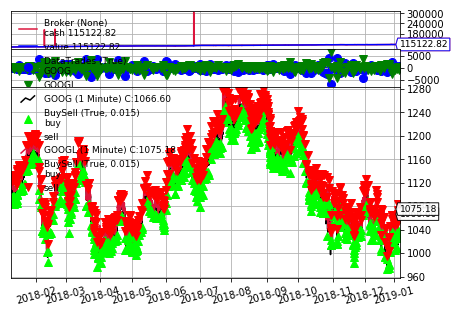

[[<matplotlib.figure.Figure at 0x16df7eb20f0>]]

In [36]:
cerebro.plot(numfigs=1, volume=False, zdown=False)

In [37]:
print('Sharpe Ratio (default):', strat[0].analyzers.mysharpe.get_analysis())

Sharpe Ratio (default): OrderedDict([('sharperatio', 0.9080387275558492)])


### Discontinuity during start and end of a day

In [129]:
7*12

84

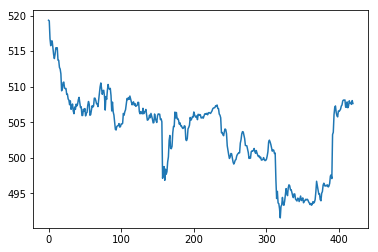

In [123]:
plt.plot(pd.read_csv("../ib-data/iex/GOOGL.csv")["close"][0:420])
plt.show()

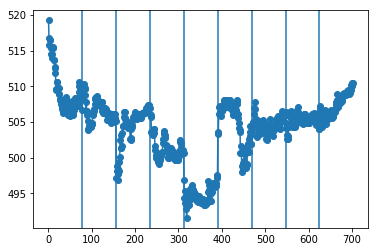

In [148]:
df = pd.read_csv("../ib-data/iex/GOOGL.csv")[1:79+78*8]
df["date"] = pd.to_datetime(df["date"])
df.set_index("date")

plt.plot(df["close"], marker="o")
plt.axvline(x=79)
plt.axvline(x=79+78)
plt.axvline(x=79+78*2)
plt.axvline(x=79+78*3)
plt.axvline(x=79+78*4)
plt.axvline(x=79+78*5)
plt.axvline(x=79+78*6)
plt.axvline(x=79+78*7)
plt.show()